# Trading with Technical and Sentimental Anaylsis 

Developed a bot that provides daily recommendations for the top 5 stocks to buy based on historical data and sentiment analysis. 

Data Sources: 
1. Historical Data: YahooFinance
2. Sentimental Data: Reddit & Twitter

### Data Collection

#### Importing Symbols of stocks traded on US stock market (Note: Not used in final results)

In [1]:
import ftplib
import os
import pandas as pd

# Connecting to the NASDAQ FTP server
ftp = ftplib.FTP("ftp.nasdaqtrader.com")
ftp.login()

# Navigating to the directory containing symbol files
ftp.cwd("/SymbolDirectory")

# Downloading the symbols file
filenames = ["nasdaqlisted.txt", "otherlisted.txt"]
for filename in filenames:
    local_filename = os.path.join(".", filename)
    with open(local_filename, 'wb') as f:
        ftp.retrbinary(f"RETR {filename}", f.write)

# Close the FTP connection
ftp.quit()

# Read and parse the symbols files
nasdaq_symbols = pd.read_csv('nasdaqlisted.txt', sep='|')
other_symbols = pd.read_csv('otherlisted.txt', sep='|')

# Combine and clean up the data
all_symbols = pd.concat([nasdaq_symbols, other_symbols])
all_symbols = all_symbols[['Symbol', 'Security Name']]
all_symbols.to_csv('us_stock_symbols.csv', index=False)

print("Symbols downloaded and saved to 'us_stock_symbols.csv'")

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Symbols downloaded and saved to 'us_stock_symbols.csv'


#### Collecting data of stocks from Yahoo finance

The list that was previously obtained was not used; instead, the top 100 firms symbols were scrapped from the internet according to their market capitalization. Only one hundred companies were used in the evaluation. 

In [2]:
pip install yfinance

Note: you may need to restart the kernel to use updated packages.


#### Getting Name and Symbols of top 100 US stocks based on Marker Capitalization

In [3]:
import yfinance as yf
import pandas as pd

# Define the function to get the top 100 US stocks by market capitalization
def get_top_100_us_stocks():
    # Fetch the S&P 500 companies as a representative set of top US stocks
    sp500_df = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]
    
    # Extract the symbols and names
    sp500_tickers = sp500_df['Symbol'].tolist()
    sp500_names = sp500_df['Security'].tolist()
    
    # Initialize an empty list to store the data
    stock_data = []

    # Loop over each ticker and fetch market capitalization
    for ticker, name in zip(sp500_tickers, sp500_names):
        stock = yf.Ticker(ticker)
        info = stock.info
        if 'marketCap' in info:
            stock_data.append({'Symbol': ticker, 'Name': name, 'MarketCap': info['marketCap']})
    
    # Convert the list to a DataFrame
    df = pd.DataFrame(stock_data)

    # Sort the DataFrame by market capitalization in descending order
    df = df.sort_values(by='MarketCap', ascending=False)
    
    # Select only the top 100 stocks and relevant columns
    top_100_stocks = df.head(100)[['Symbol', 'Name']]
    
    # Save the result to a CSV file
    top_100_stocks.to_csv('us_stock_top100_symbols.csv', index=False)

    return top_100_stocks

# Run the function and store the result
top_100_stocks = get_top_100_us_stocks()

#### Getting Data of top 100 US stocks previously scrapped

In [4]:
import yfinance as yf
import pandas as pd
from datetime import datetime, timedelta

# Define the function to fetch and calculate historical data for top 100 US stocks
def calculate_stock_metrics():
    # Load the top 100 stock symbols from the previously created file
    top_100_stocks = pd.read_csv('us_stock_top100_symbols.csv')

    # Define the start date
    start_date = '2015-01-01'
    end_date = datetime.now().strftime('%Y-%m-%d')

    # Initialize an empty list to store the data
    stock_metrics = []

    # Loop over each symbol to fetch historical data and calculate metrics
    for symbol in top_100_stocks['Symbol']:
        stock = yf.Ticker(symbol)
        hist_data = stock.history(start=start_date)
        
        # Skip if there's not enough data
        if hist_data.empty:
            continue
        
        # Convert datetime index to timezone naive (UTC)
        hist_data.index = hist_data.index.tz_localize(None)
        
        # Convert current datetime to timezone-aware using the timezone of the dividends index
        current_time_aware = datetime.now().astimezone(hist_data.index.tz)
        
        # Get prices on specific dates
        start_price = hist_data.iloc[0]['Close']
        current_price = hist_data.iloc[-1]['Close']
        
        # Calculate returns
        def calculate_return(days):
            if len(hist_data) >= days + 1:
                past_price = hist_data.iloc[-(days + 1)]['Close']
                price_return = current_price - past_price
                percent_return = (price_return / past_price) * 100
            else:
                price_return, percent_return = None, None
            return price_return, percent_return
        
        one_day_return, one_day_percent = calculate_return(1)
        five_day_return, five_day_percent = calculate_return(5)
        one_month_return, one_month_percent = calculate_return(30)
        three_month_return, three_month_percent = calculate_return(90)
        six_month_return, six_month_percent = calculate_return(180)
        one_year_return, one_year_percent = calculate_return(365)
        three_year_return, three_year_percent = calculate_return(365 * 3)
        five_year_return, five_year_percent = calculate_return(365 * 5)
        all_time_return = current_price - start_price
        all_time_percent = (all_time_return / start_price) * 100
        
        # Fetch additional stock data
        info = stock.info
        pe_ratio = info.get('trailingPE', None)
        eps = info.get('trailingEps', None)
        market_cap = info.get('marketCap', None)
        pb_ratio = info.get('priceToBook', None)
        ps_ratio = info.get('priceToSalesTrailing12Months', None)
        dividend_yield = info.get('dividendYield', None)
        debt_to_equity = info.get('debtToEquity', None)
        roa = info.get('returnOnAssets', None)
        roe = info.get('returnOnEquity', None)
        operating_margin = info.get('operatingMargins', None)
        beta = info.get('beta', None)
        fcf = info.get('freeCashflow', None)
        ebitda = info.get('ebitda', None)
        payout_ratio = info.get('payoutRatio', None)
        
        # Calculate dividend of the past year
        dividends = stock.dividends
        if not dividends.empty:
            past_year_dividends = dividends[dividends.index > current_time_aware - timedelta(days=365)].sum()
        else:
            past_year_dividends = None

        # Append the calculated data
        stock_metrics.append({
            'Symbol': symbol,
            'Name': info.get('shortName', None),
            'StartPrice': start_price,
            'CurrentPrice': current_price,
            '1DayReturn': one_day_return,
            '1DayReturnPercent': one_day_percent,
            '5DayReturn': five_day_return,
            '5DayReturnPercent': five_day_percent,
            '1MonthReturn': one_month_return,
            '1MonthReturnPercent': one_month_percent,
            '3MonthReturn': three_month_return,
            '3MonthReturnPercent': three_month_percent,
            '6MonthReturn': six_month_return,
            '6MonthReturnPercent': six_month_percent,
            '1YearReturn': one_year_return,
            '1YearReturnPercent': one_year_percent,
            '3YearReturn': three_year_return,
            '3YearReturnPercent': three_year_percent,
            '5YearReturn': five_year_return,
            '5YearReturnPercent': five_year_percent,
            'AllTimeReturn': all_time_return,
            'AllTimeReturnPercent': all_time_percent,
            'PERatio': pe_ratio,
            'EPS': eps,
            'MarketCap': market_cap,
            'PB Ratio': pb_ratio,
            'PS Ratio': ps_ratio,
            'DividendYield': dividend_yield,
            'DebtToEquity': debt_to_equity,
            'ROA': roa,
            'ROE': roe,
            'OperatingMargin': operating_margin,
            'Beta': beta,
            'FreeCashFlow': fcf,
            'EBITDA': ebitda,
            'PayoutRatio': payout_ratio,
            'DividendLastYear': past_year_dividends
        })

    # Convert the list to a DataFrame
    final_df = pd.DataFrame(stock_metrics)
    
    # Save the final DataFrame to a CSV file
    final_df.to_csv('us_stock_top100_data.csv', index=False)

    return final_df

# Run the function to fetch and store the historical data and calculated metrics
us_stock_data = calculate_stock_metrics()

## Data Manipulation

#### 1. Predicting stock price for 30 days 

##### a. Using Linear Regression

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


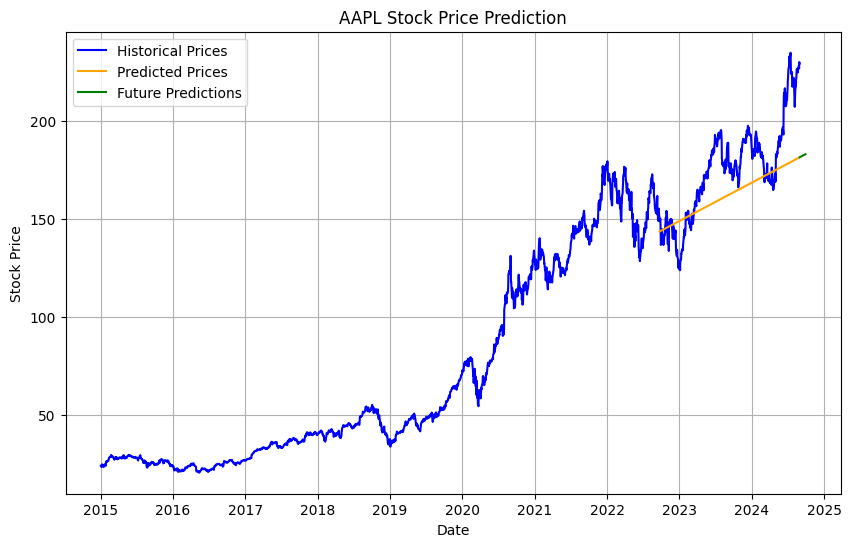

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


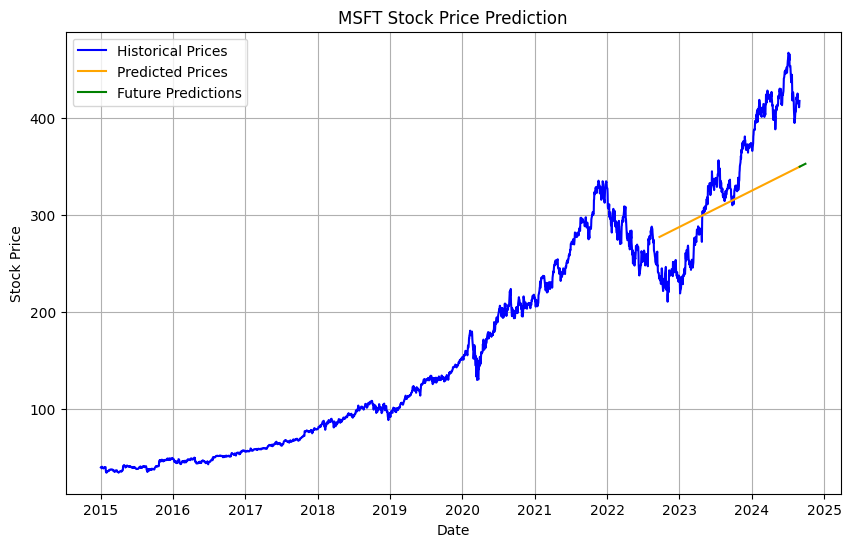

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


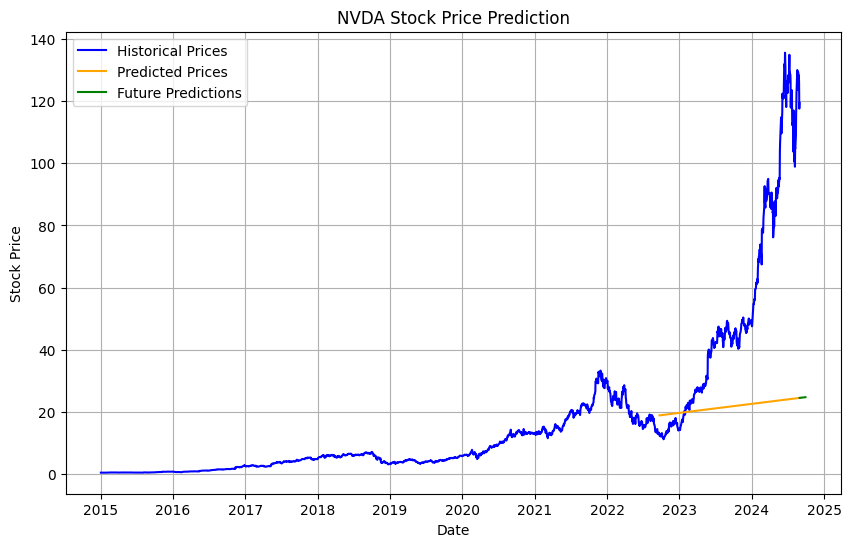

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


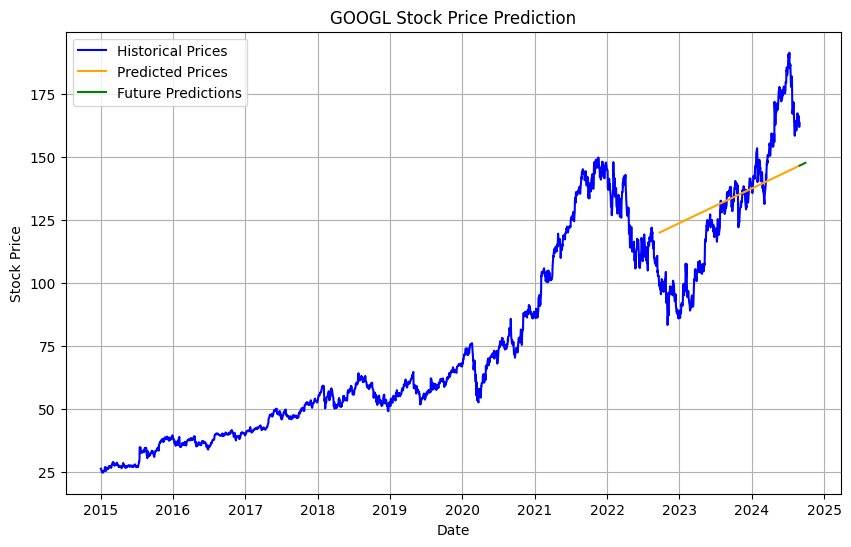

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


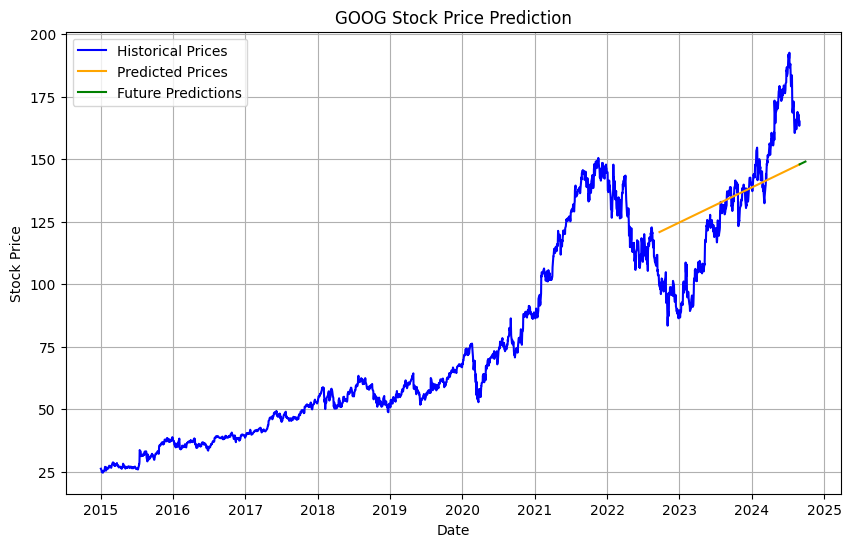

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


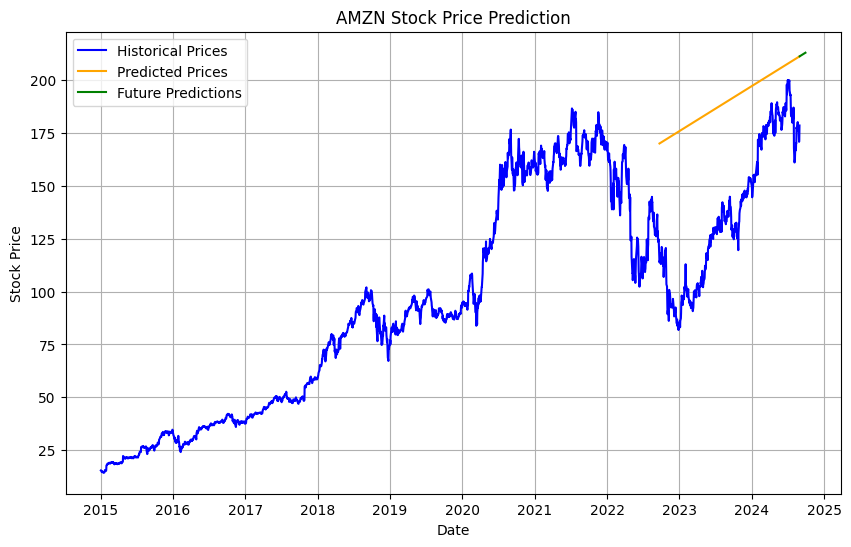

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


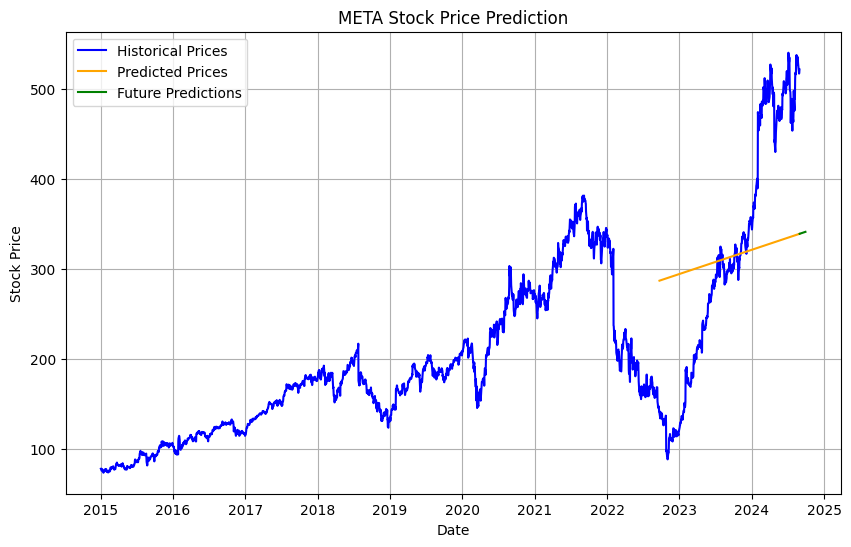

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


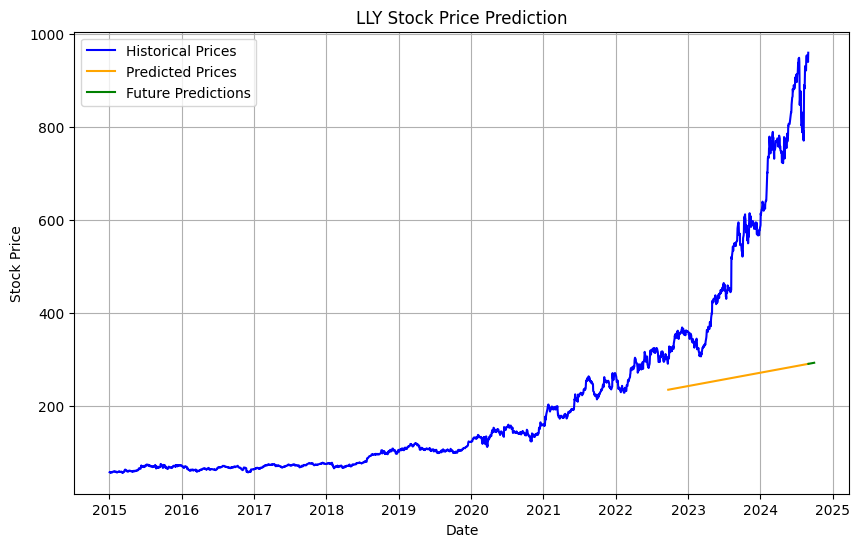

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


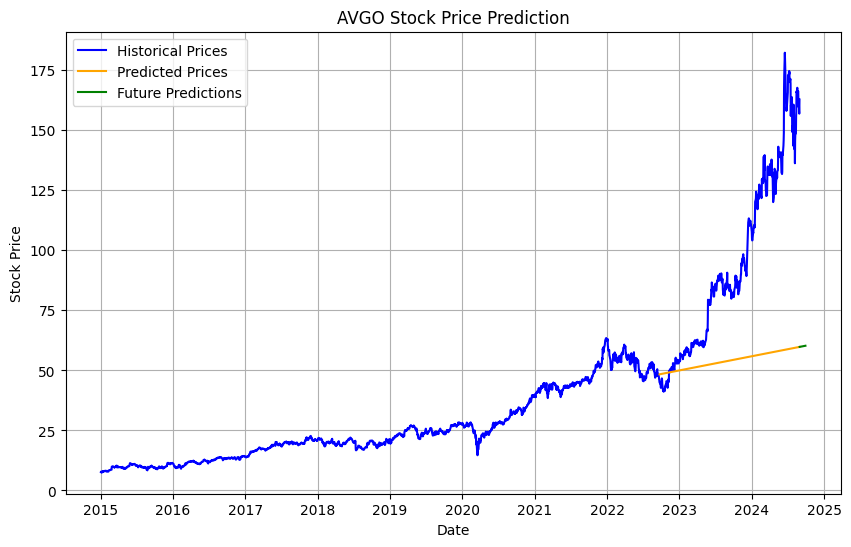

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


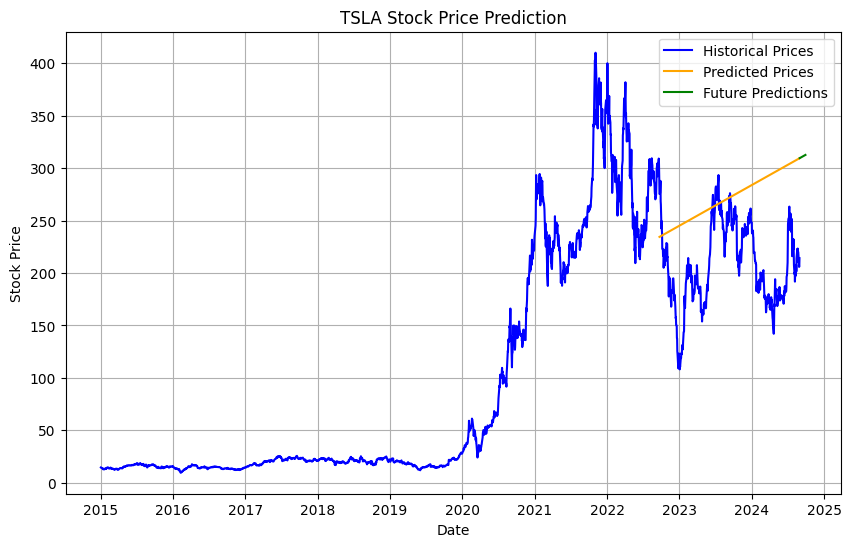

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


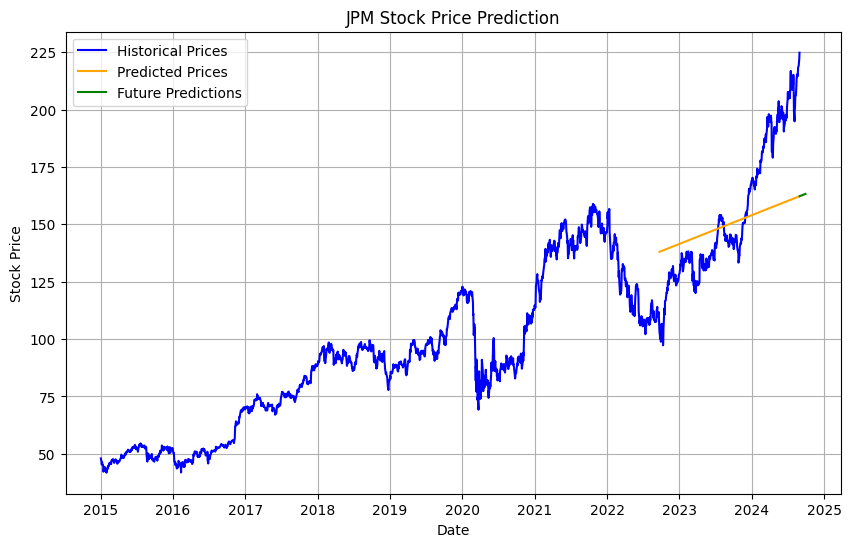

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


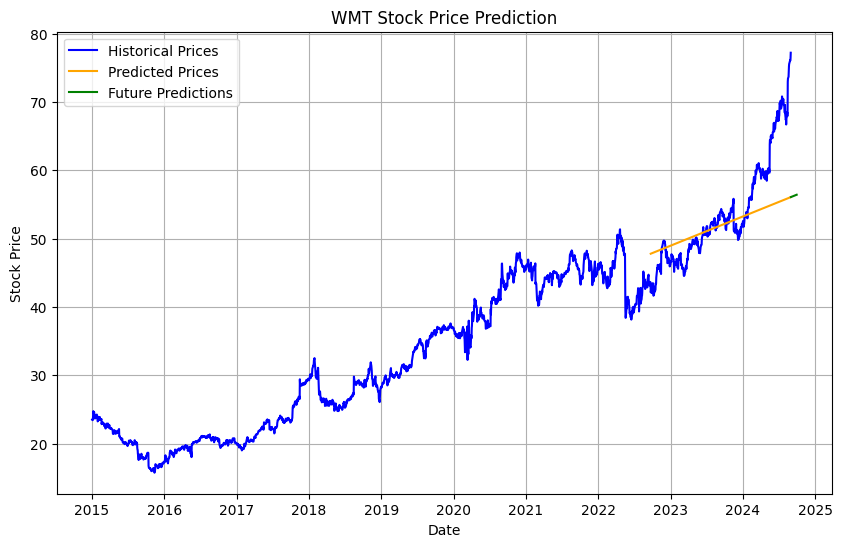

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


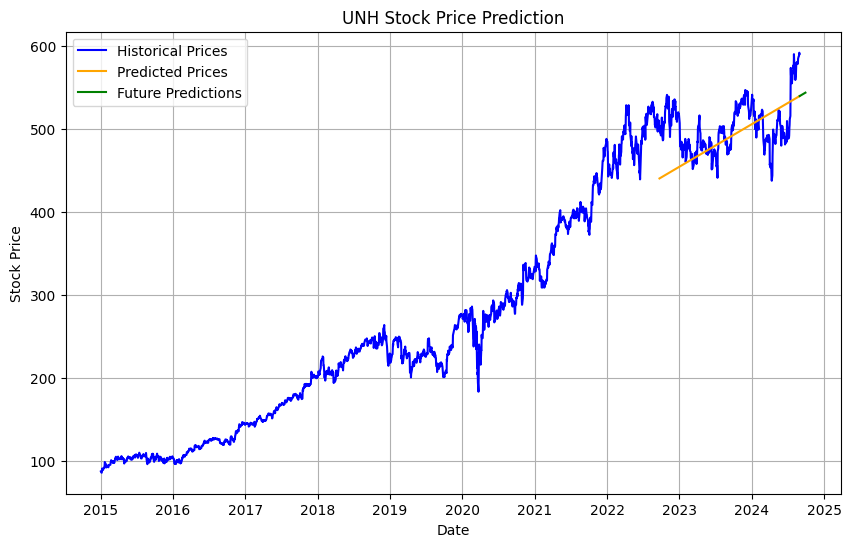

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


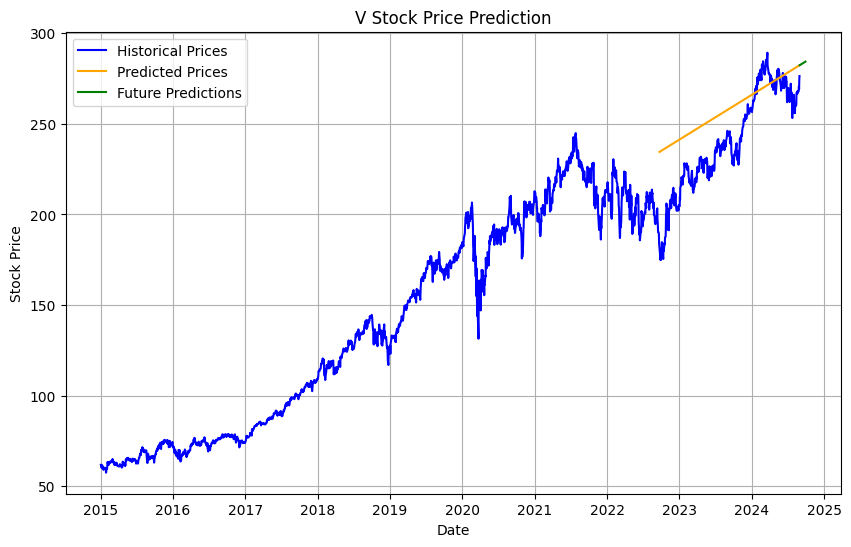

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


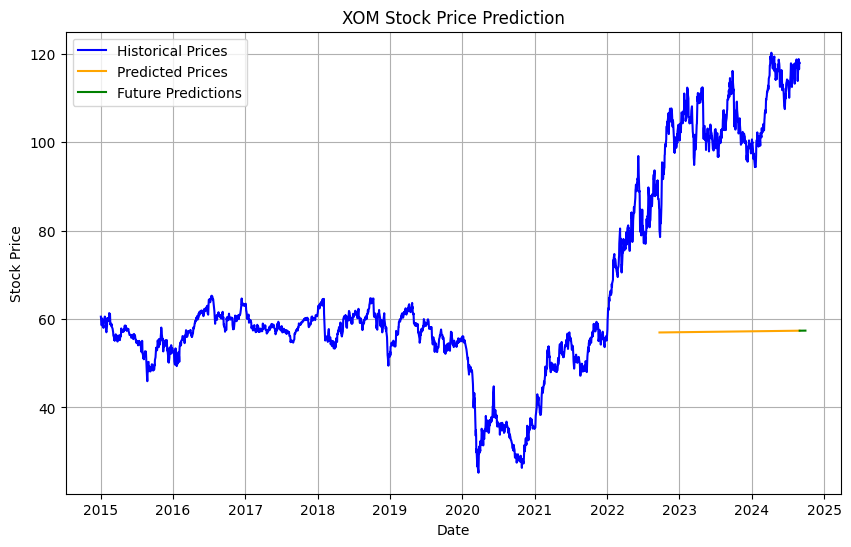

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


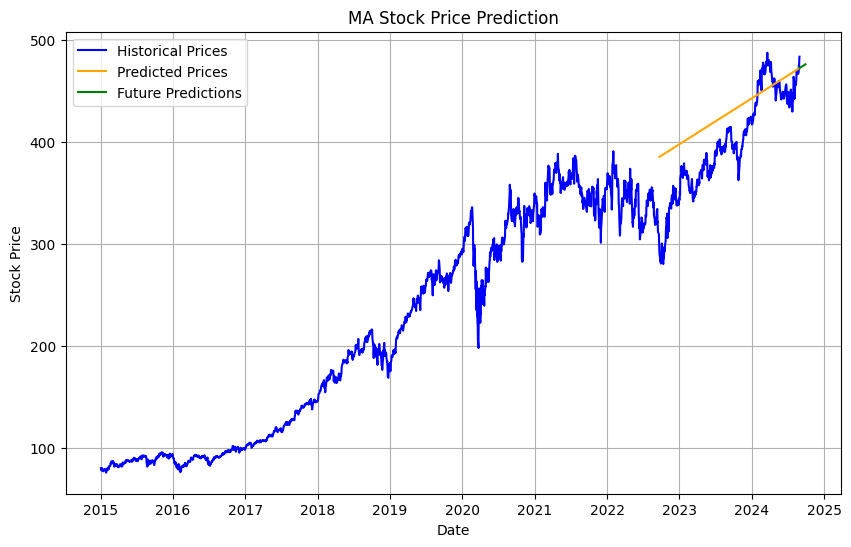

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


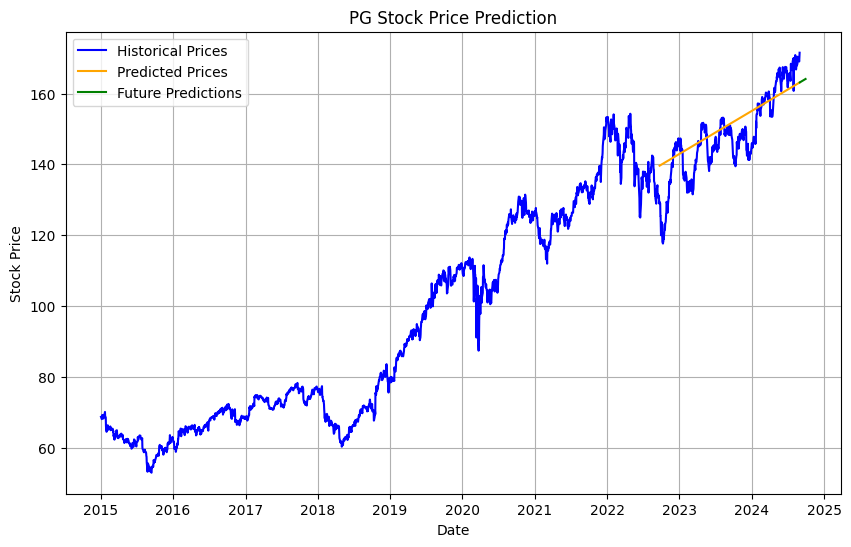

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


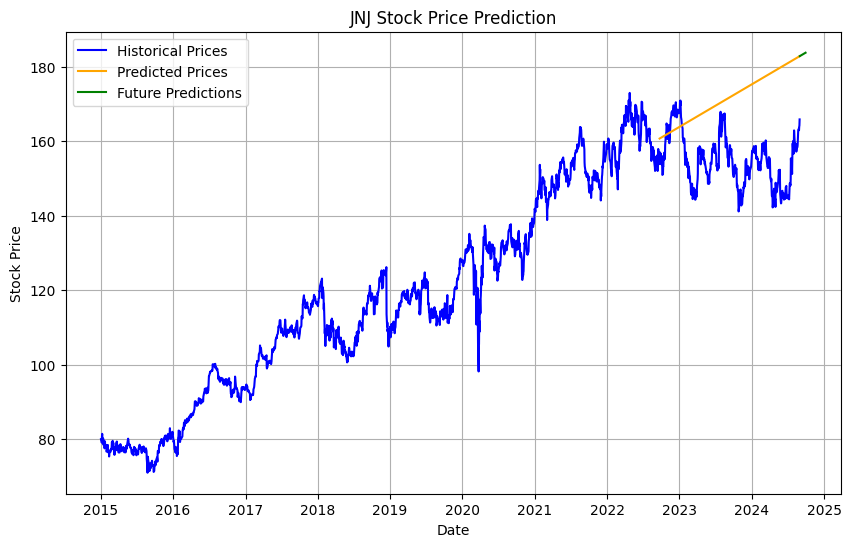

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


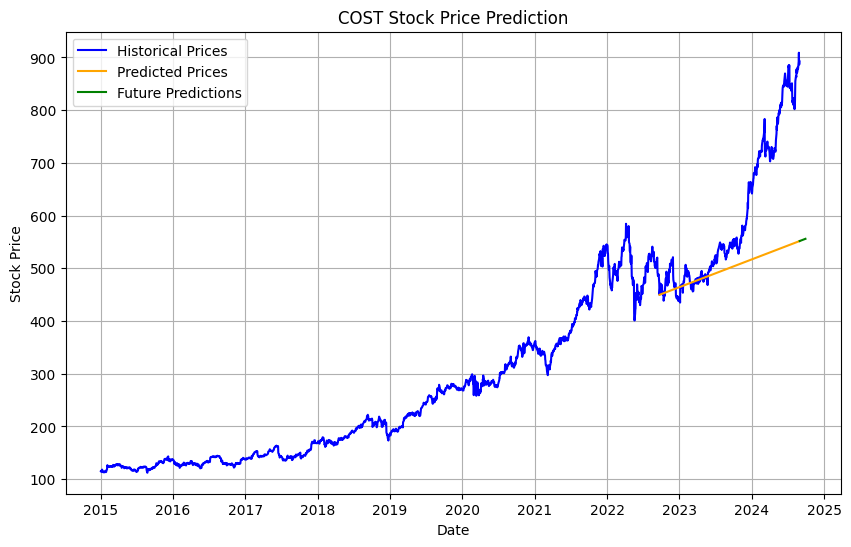

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


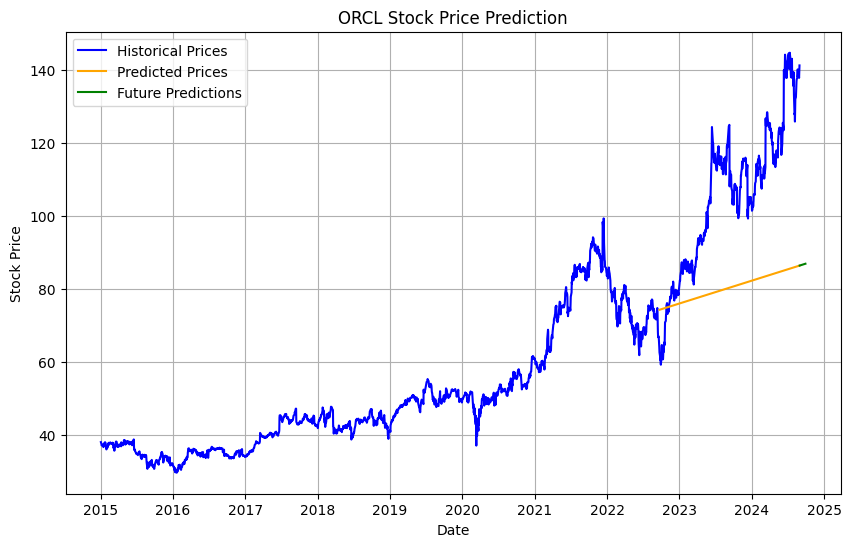

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


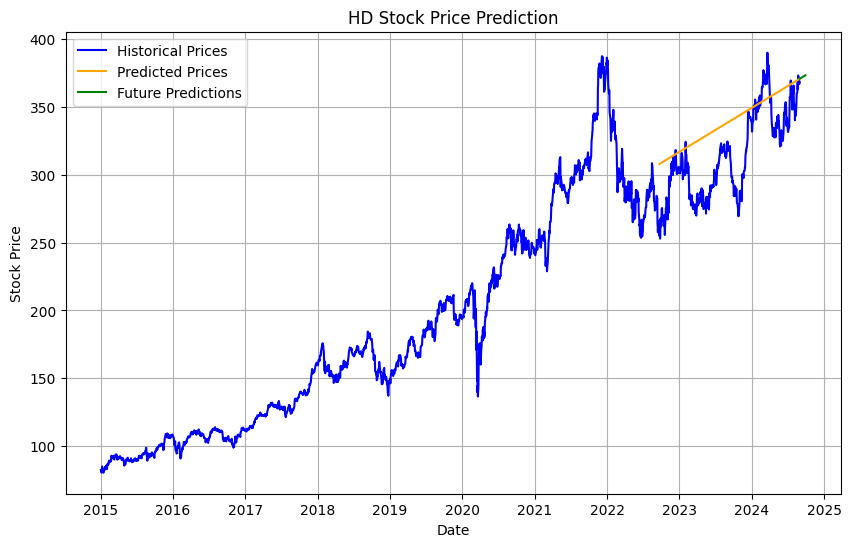

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


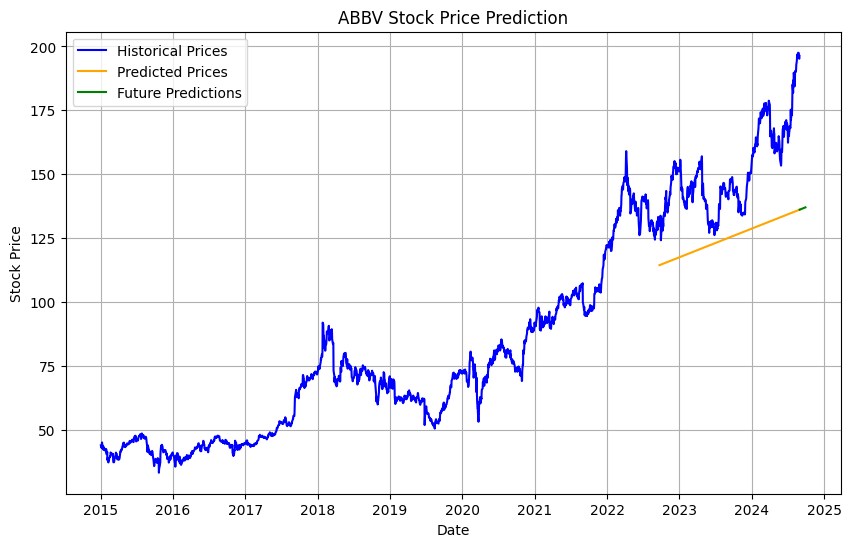

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


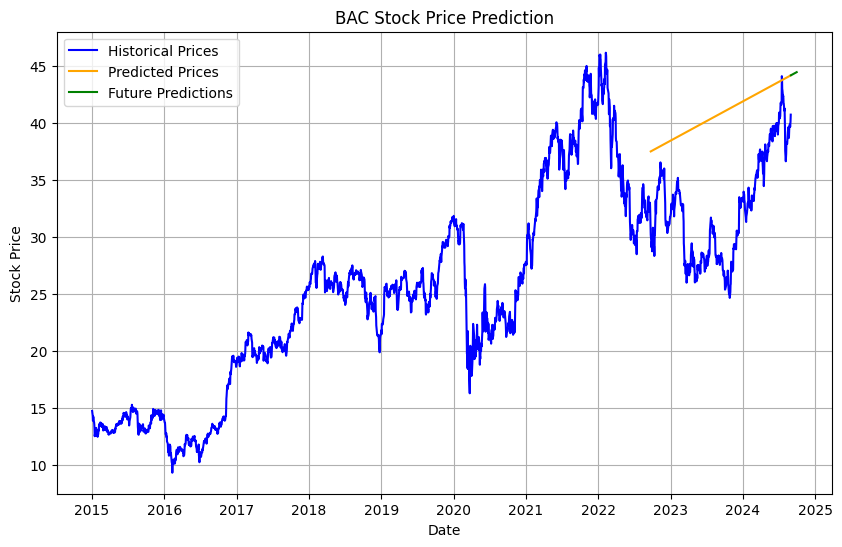

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


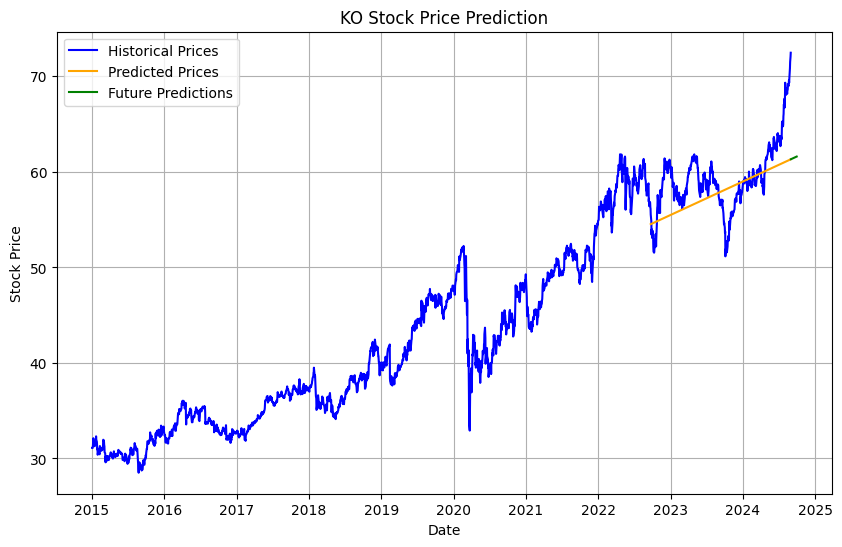

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


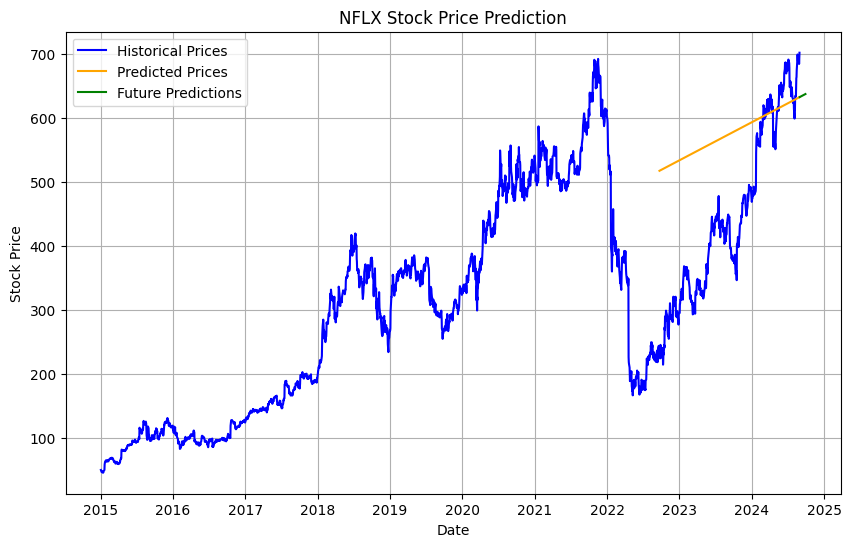

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


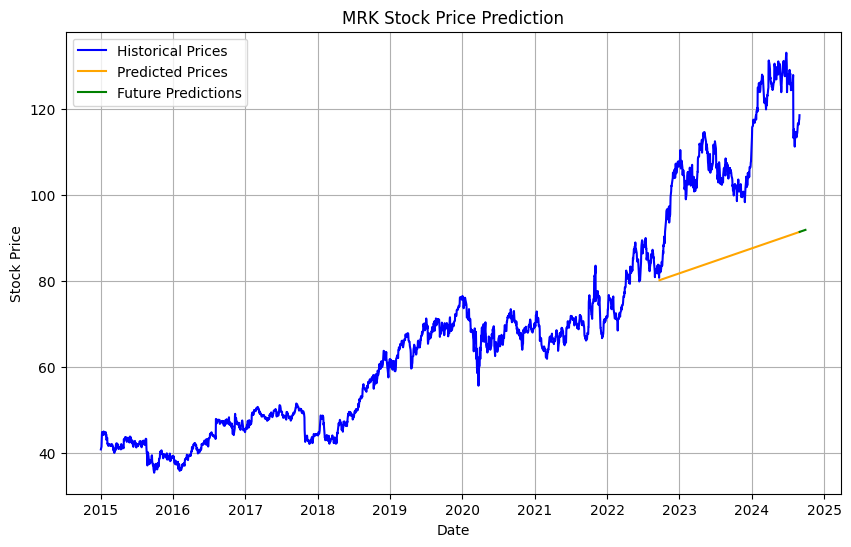

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


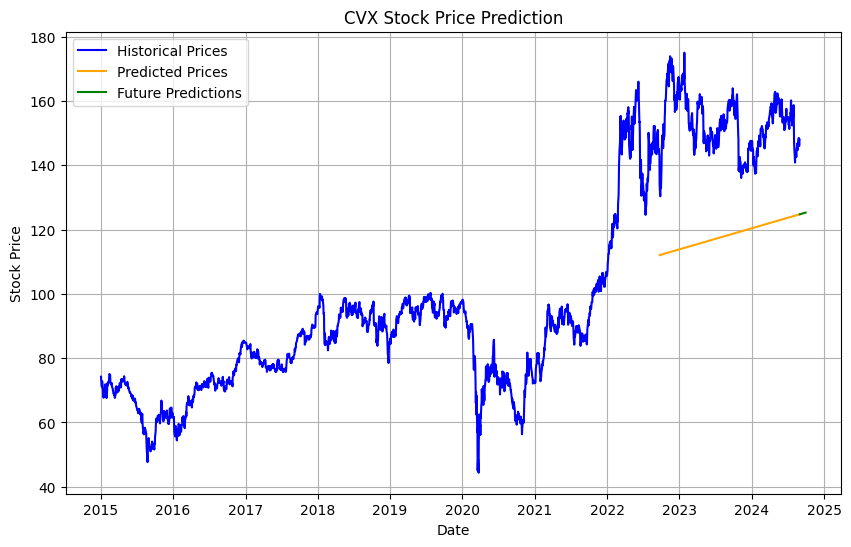

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


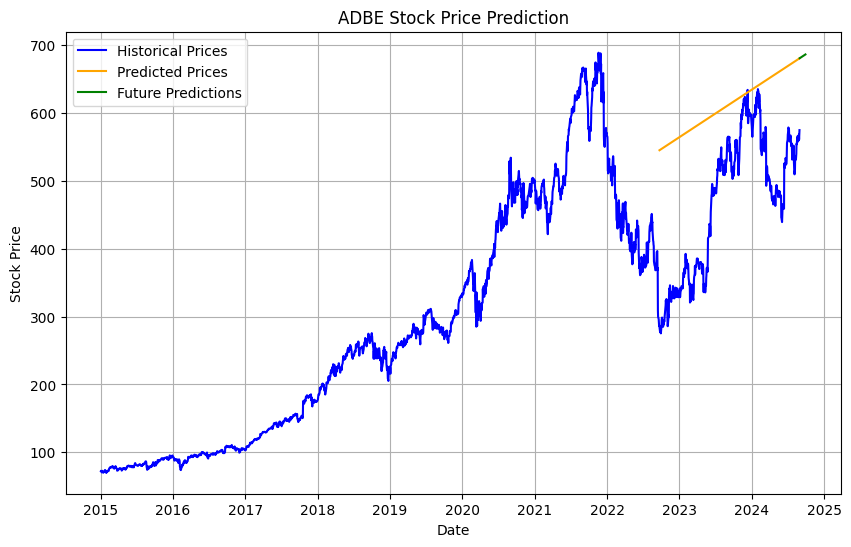

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


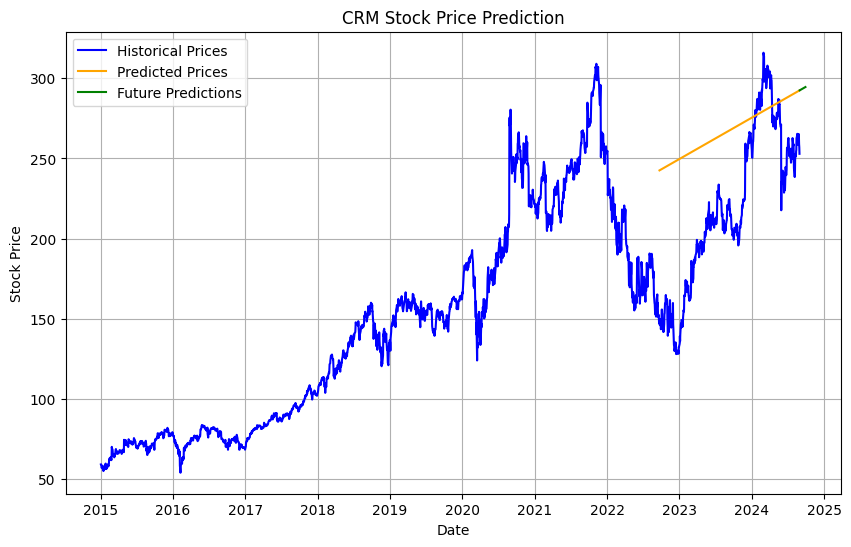

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


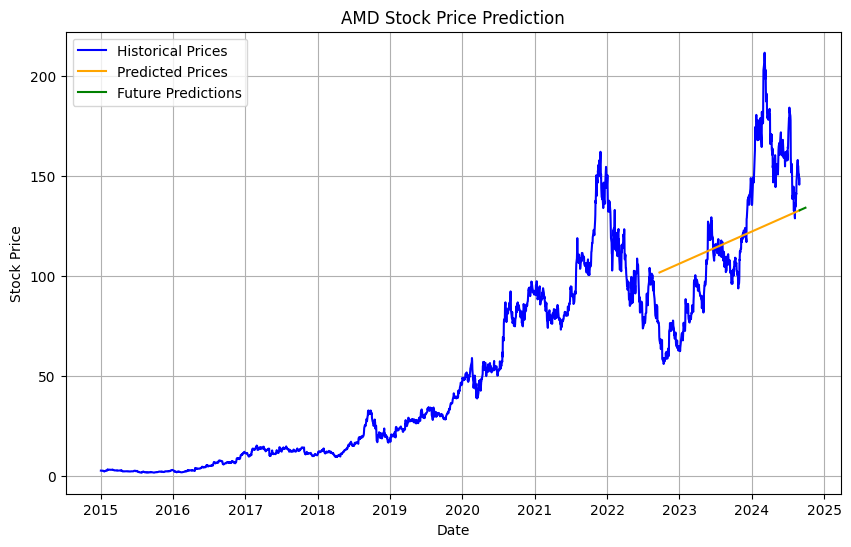

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


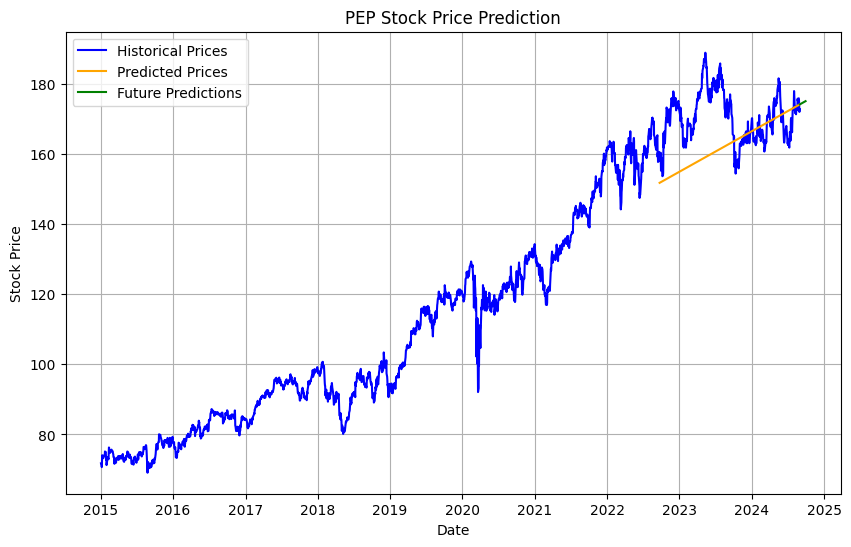

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


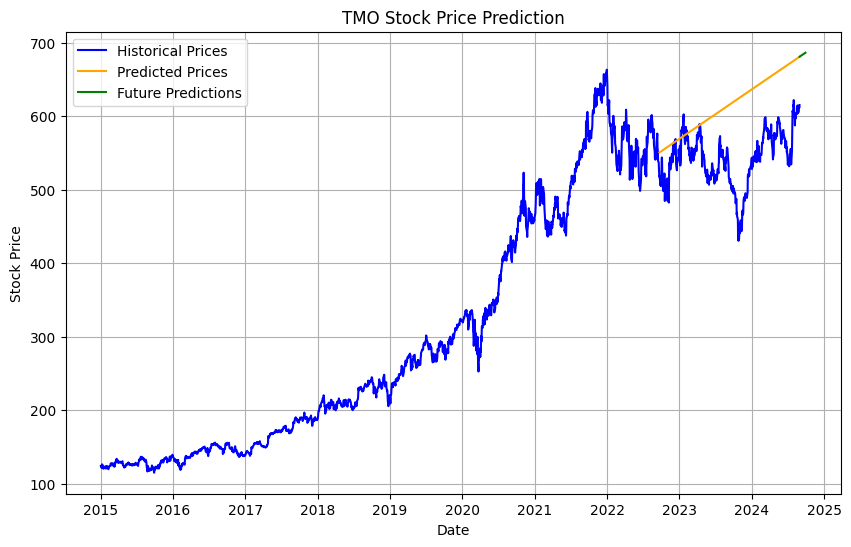

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


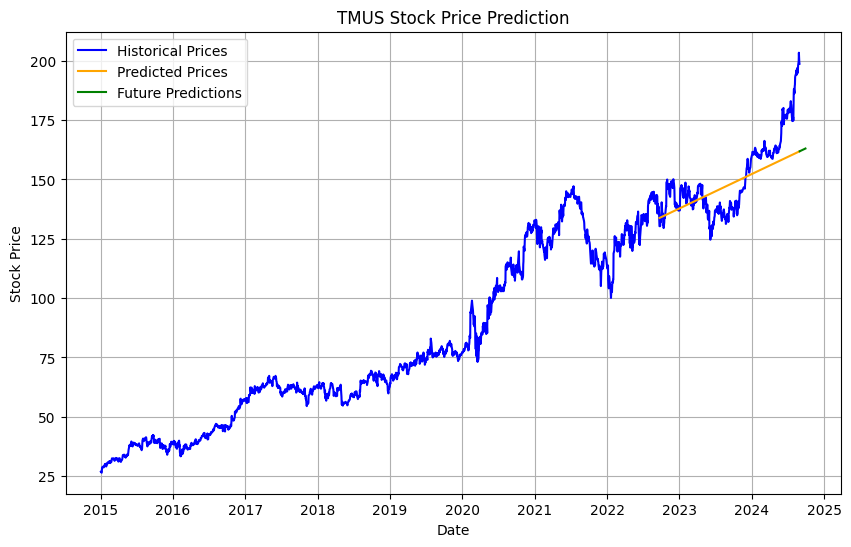

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


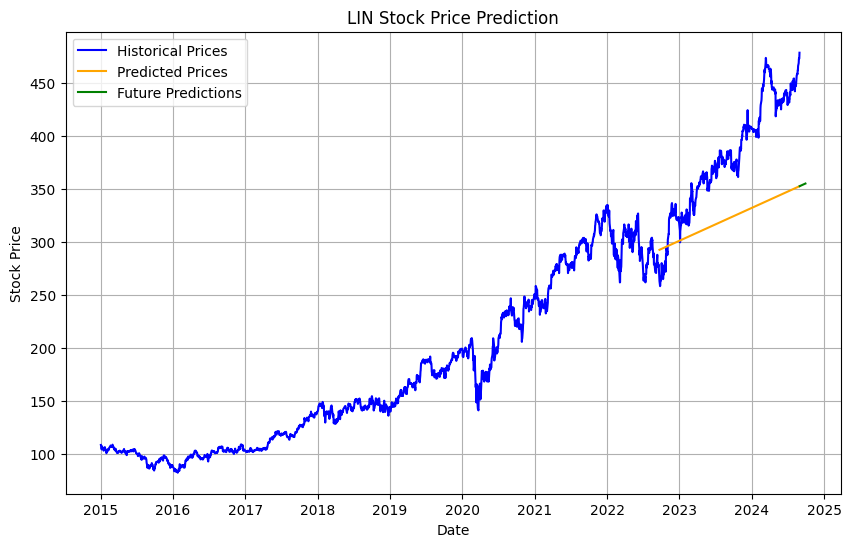

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


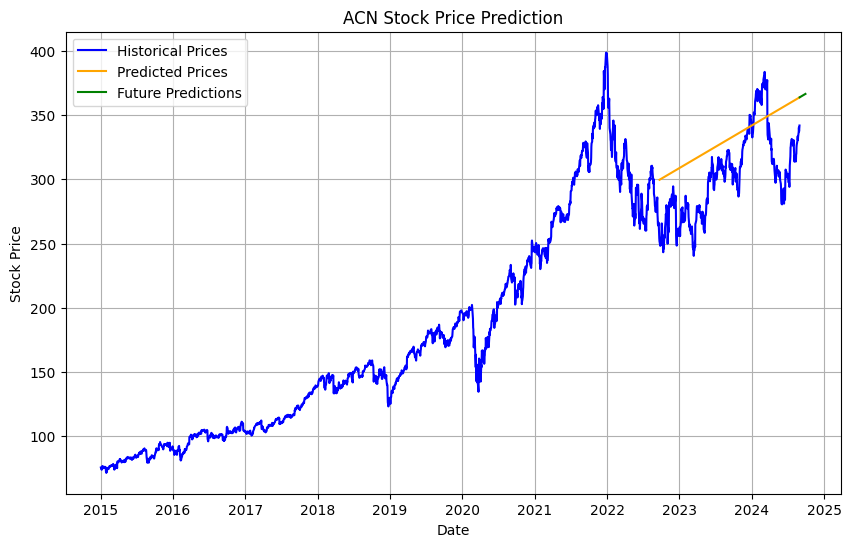

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


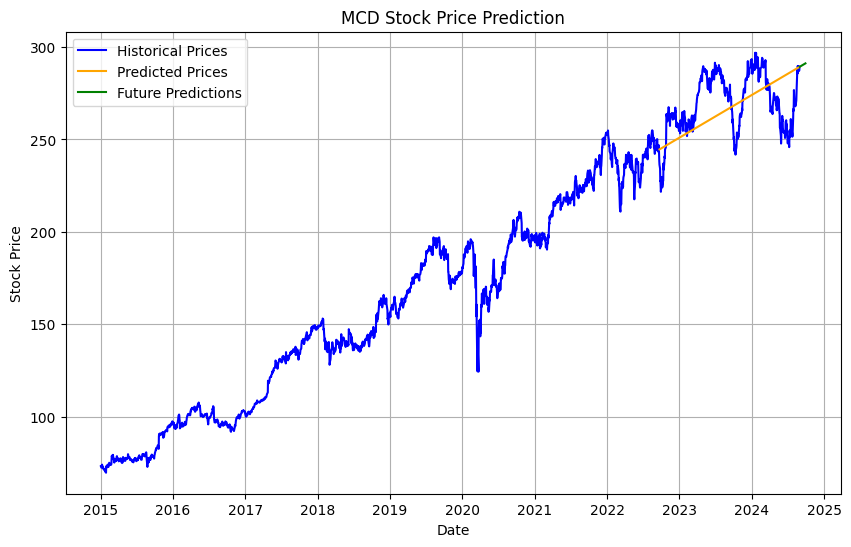

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


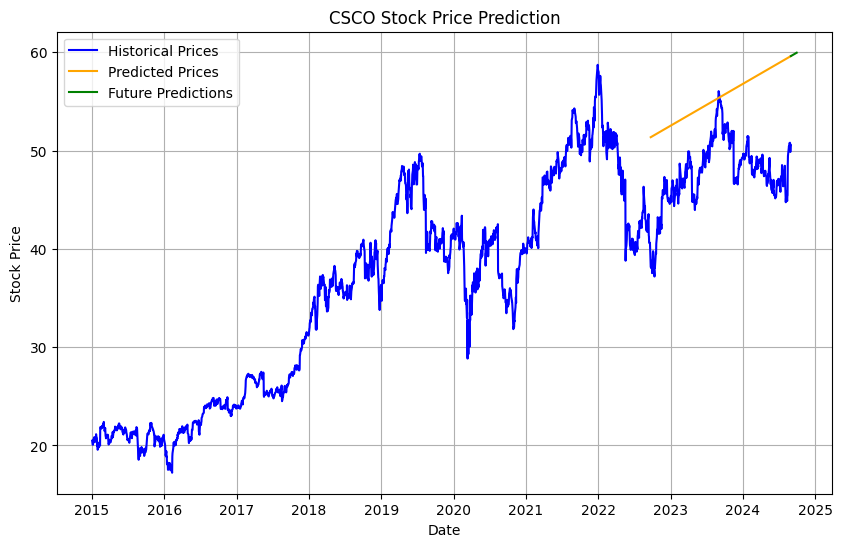

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


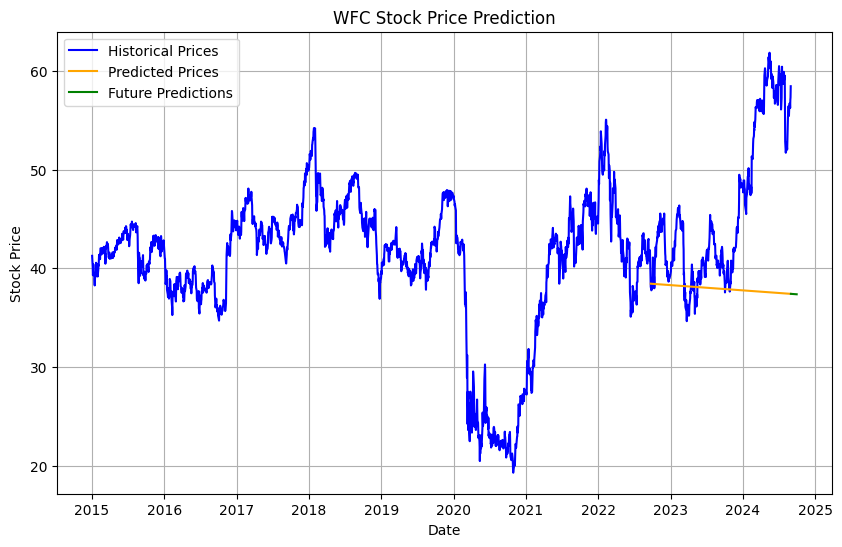

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


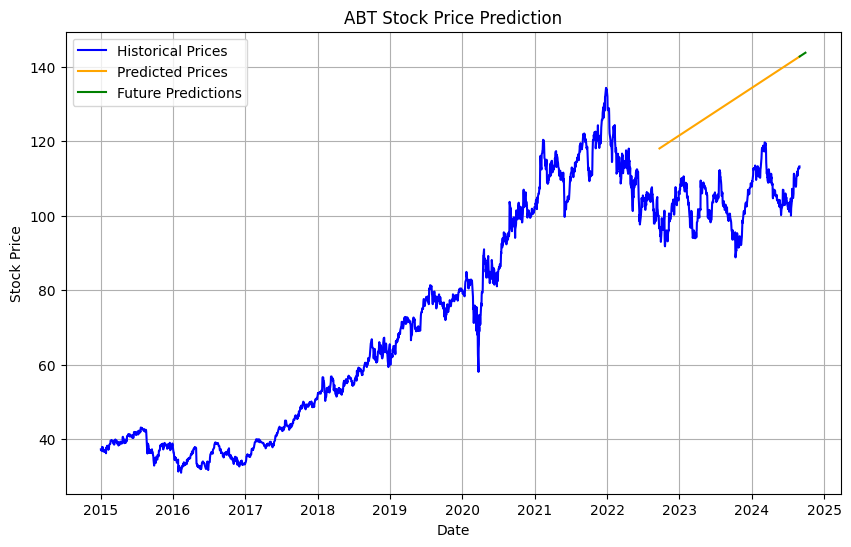

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


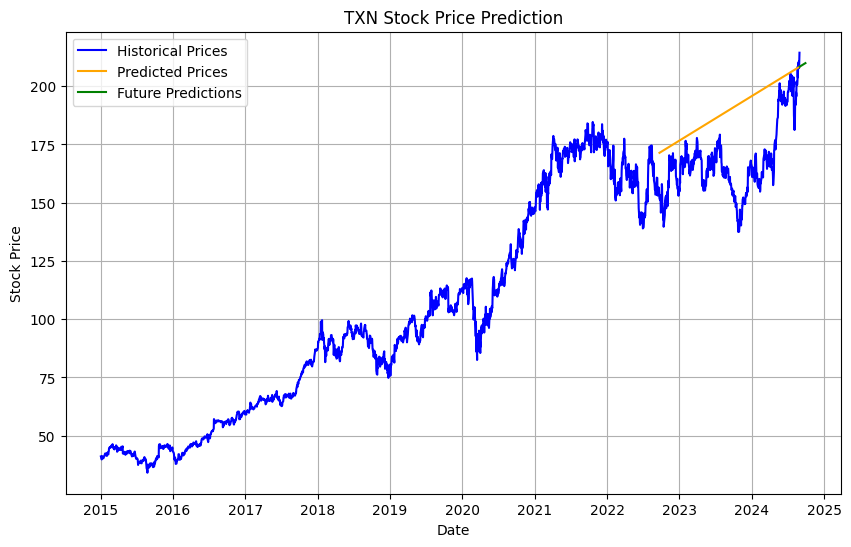

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


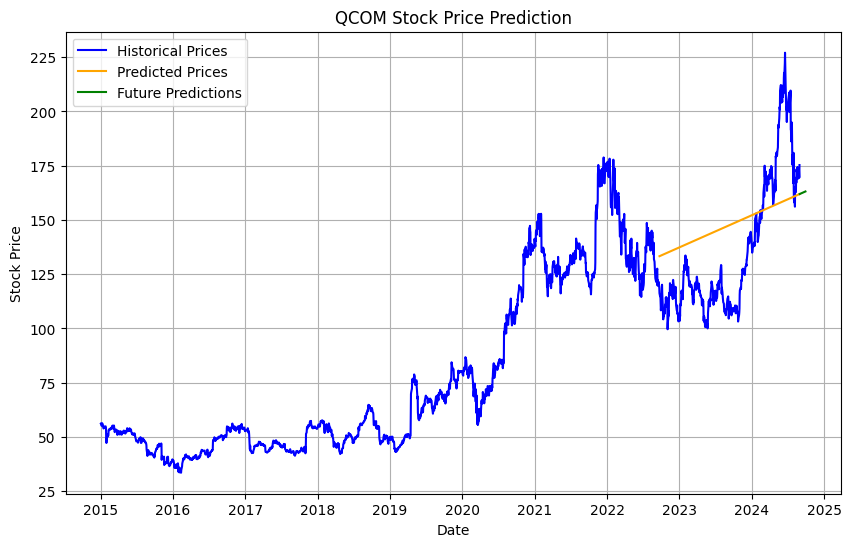

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


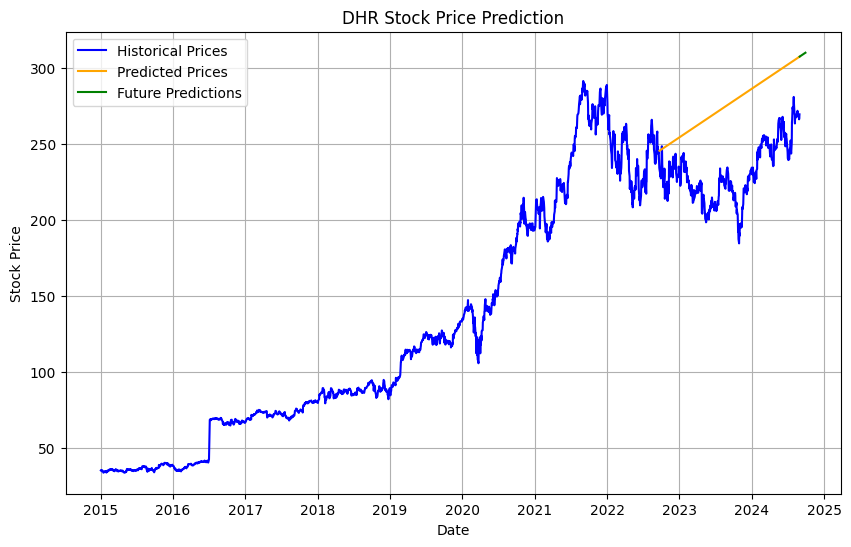

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


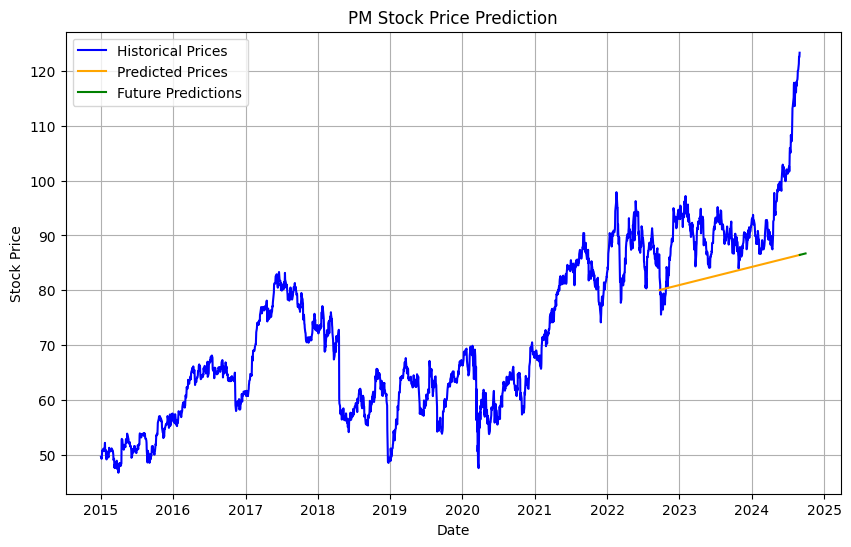

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


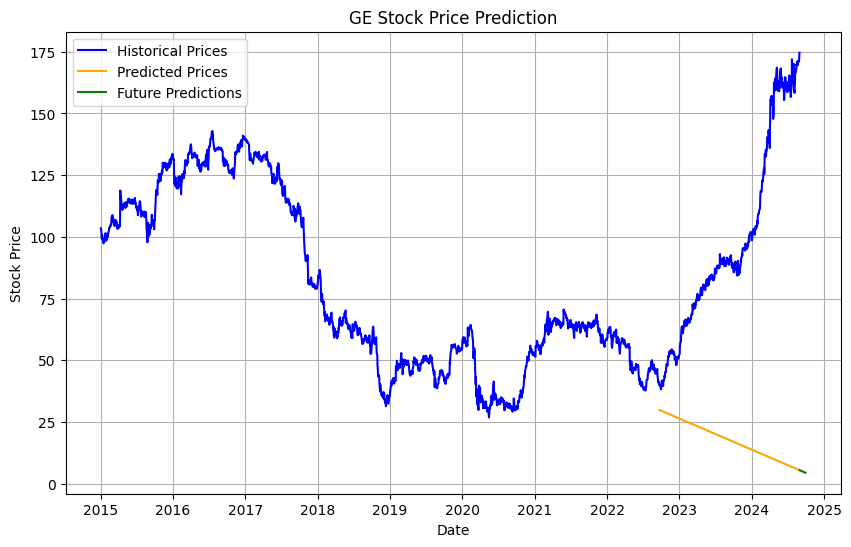

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


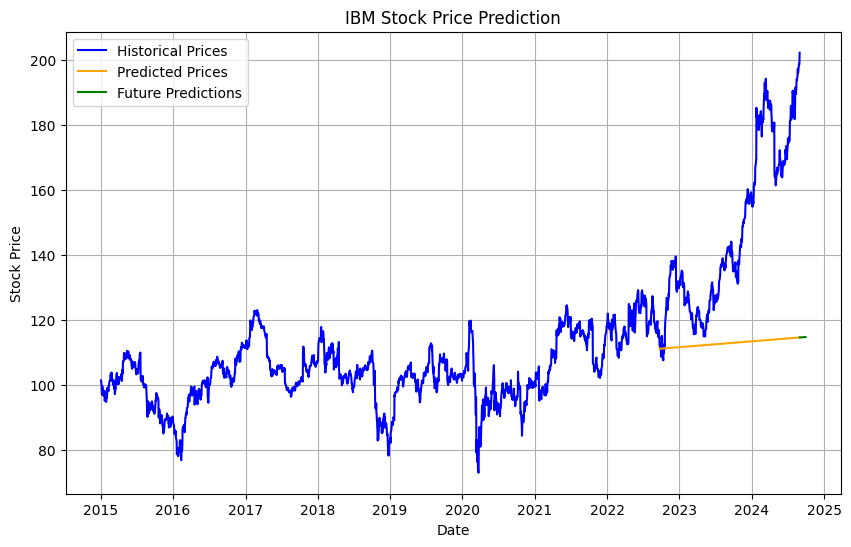

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


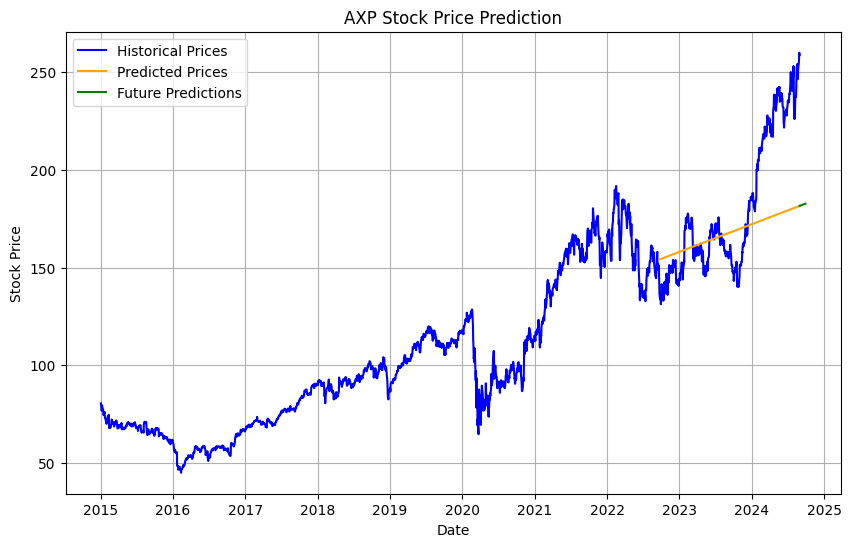

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


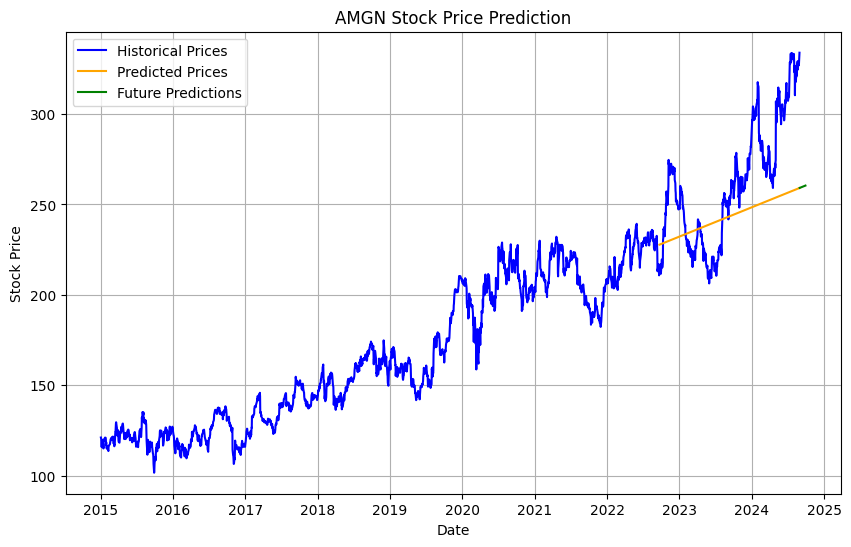

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


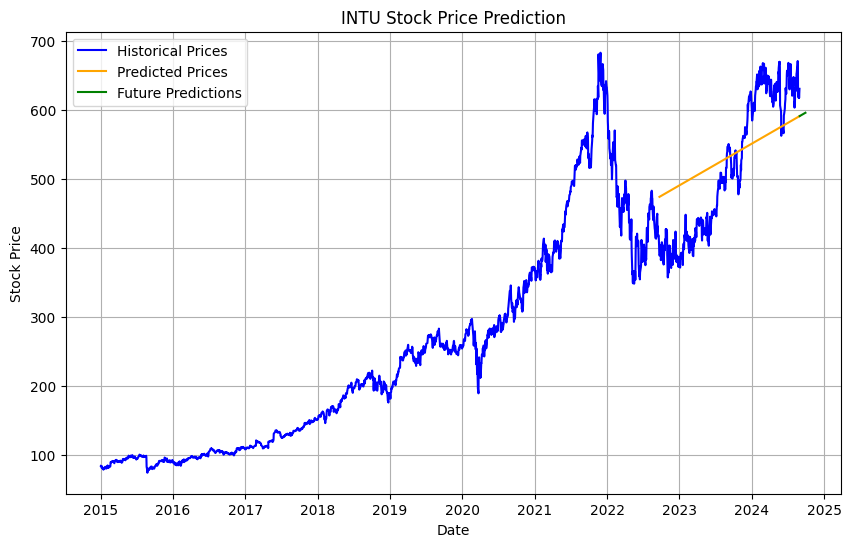

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


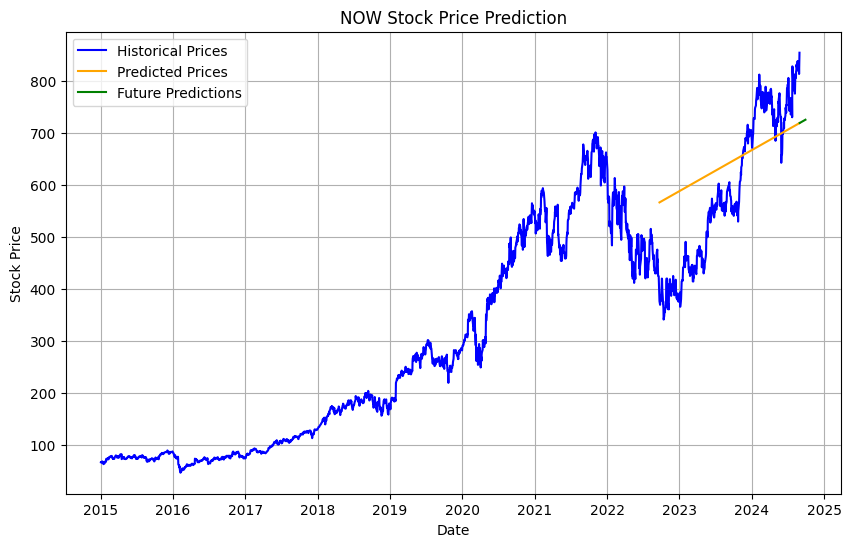

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


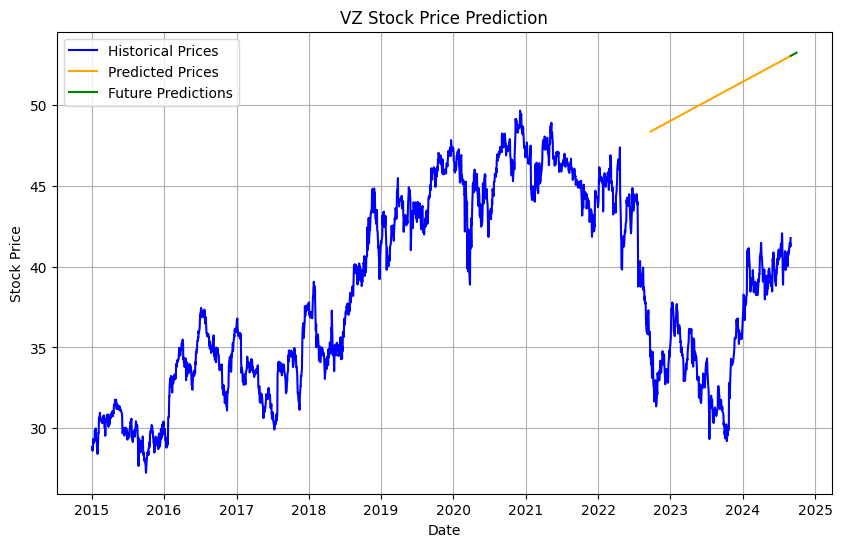

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


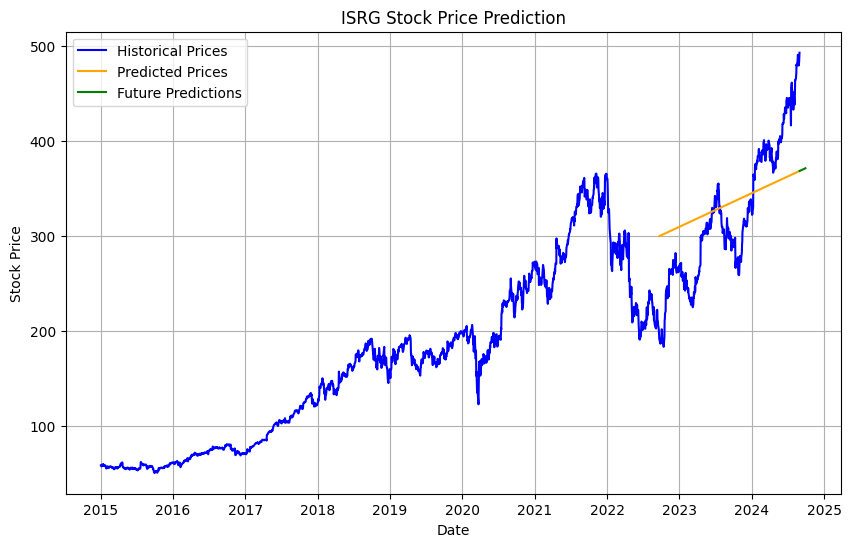

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


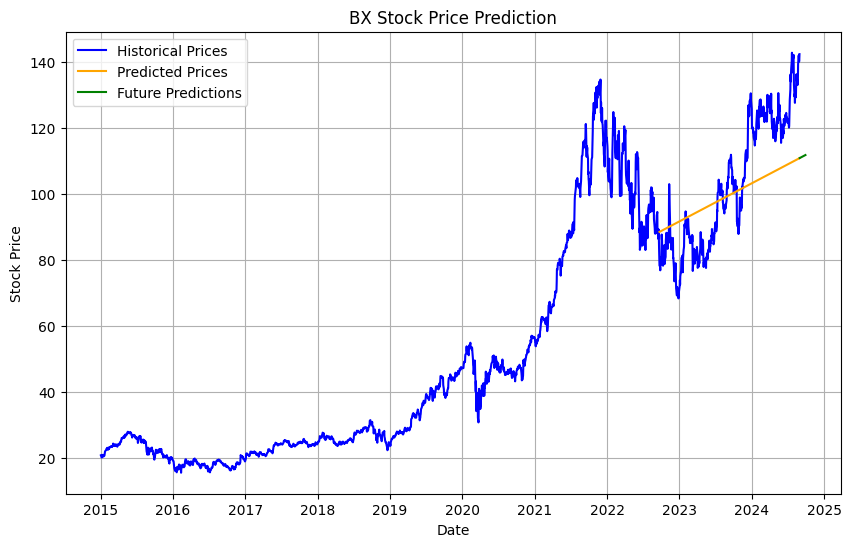

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


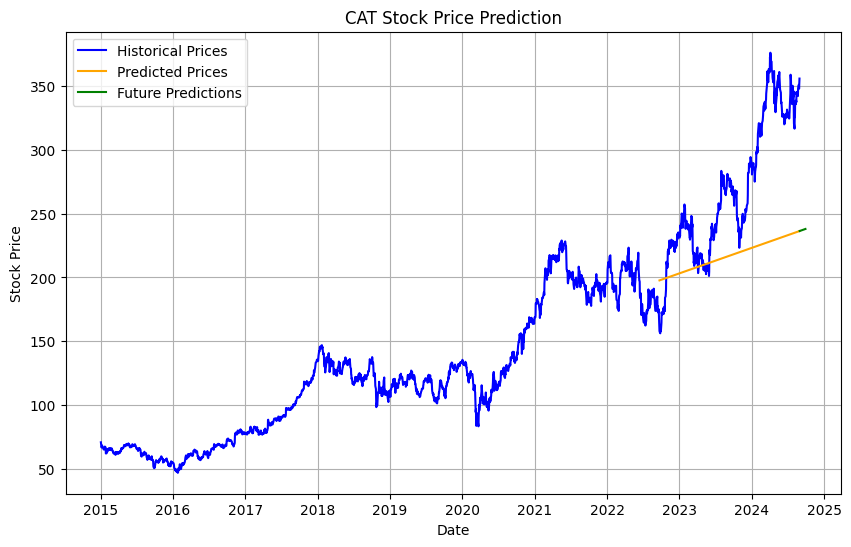

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


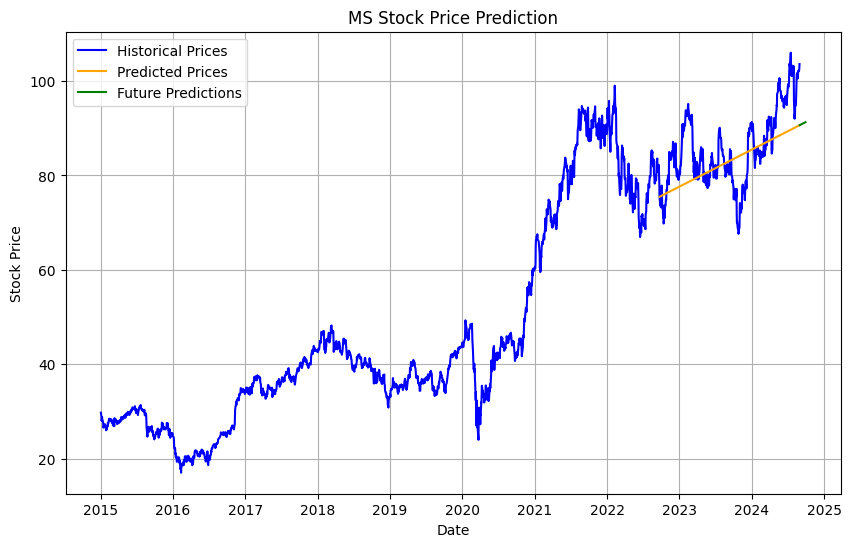

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


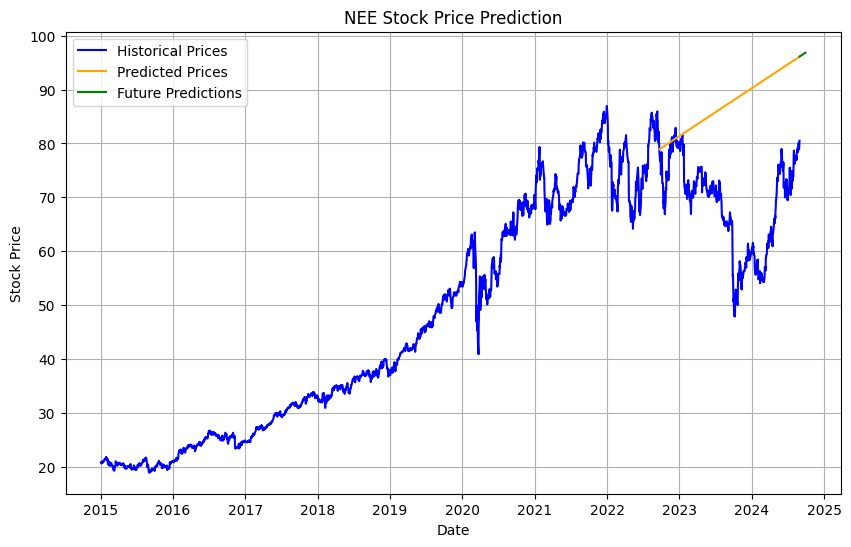

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


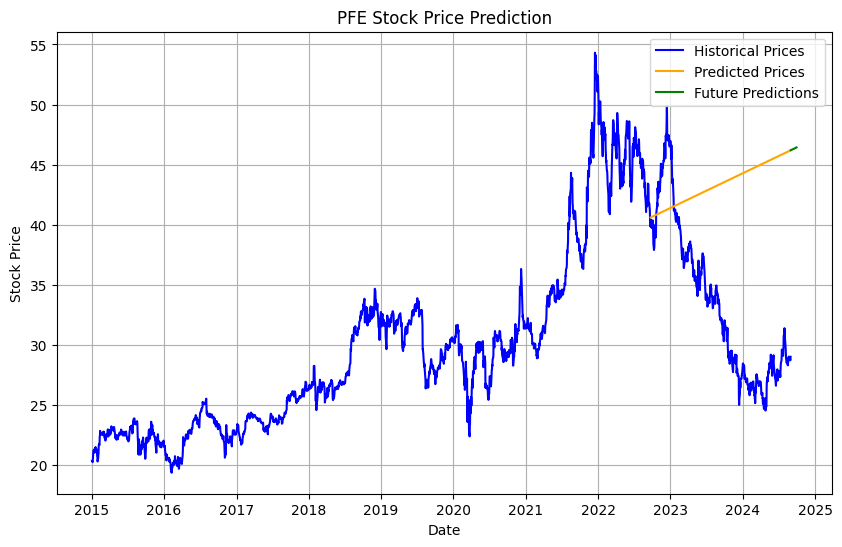

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


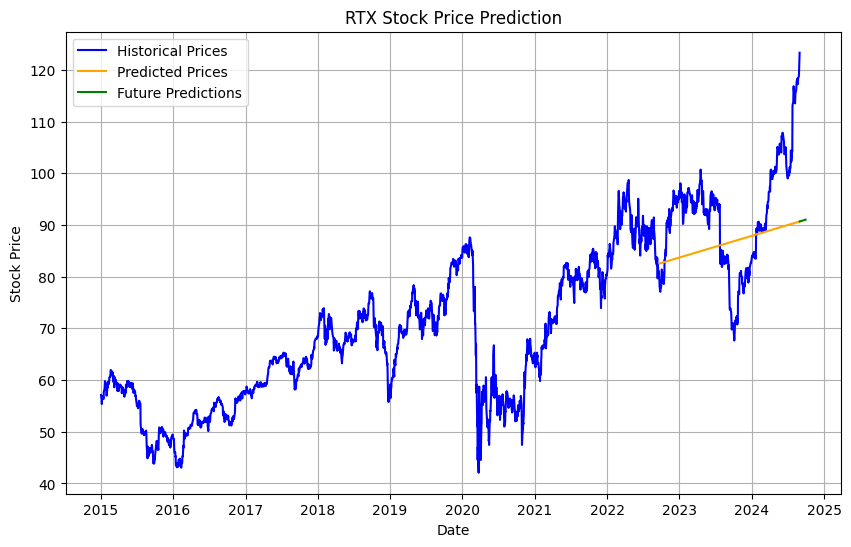

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


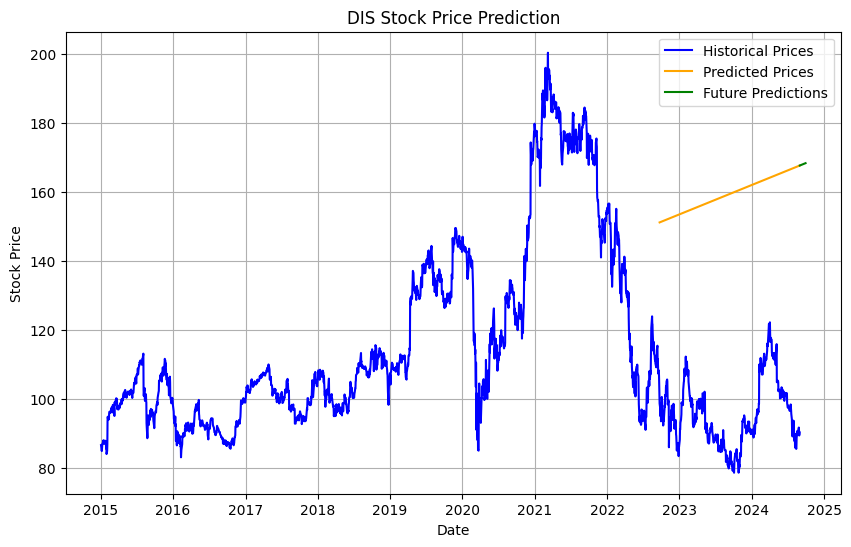

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


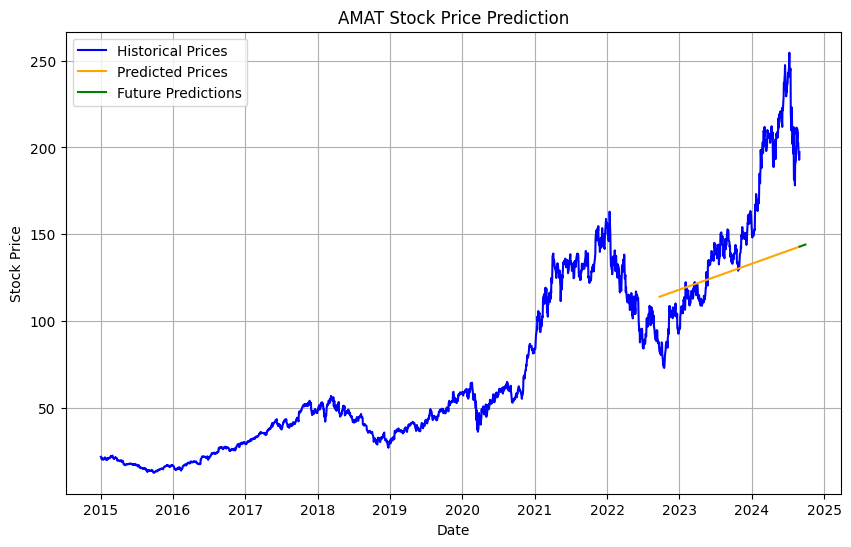

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


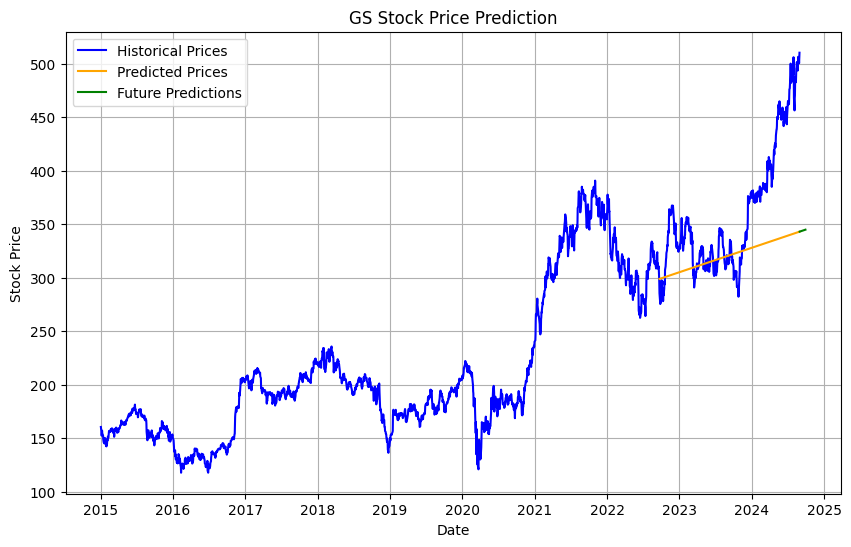

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


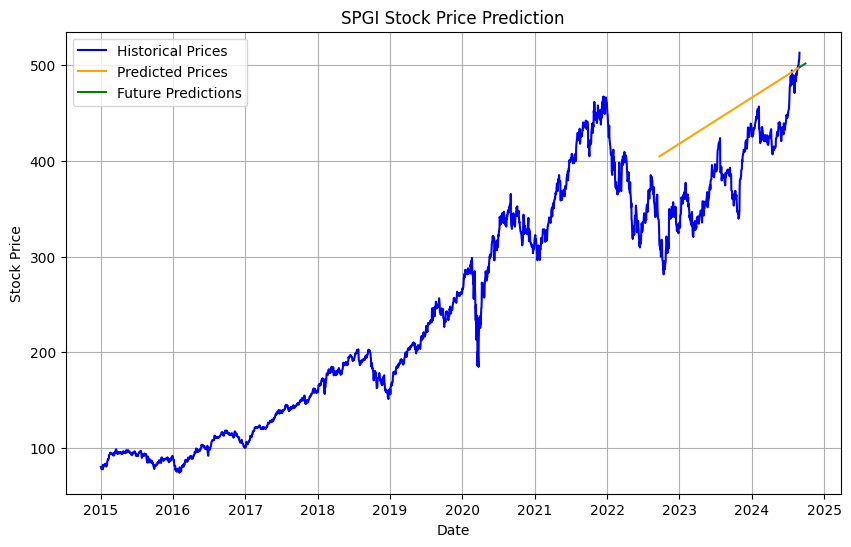

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


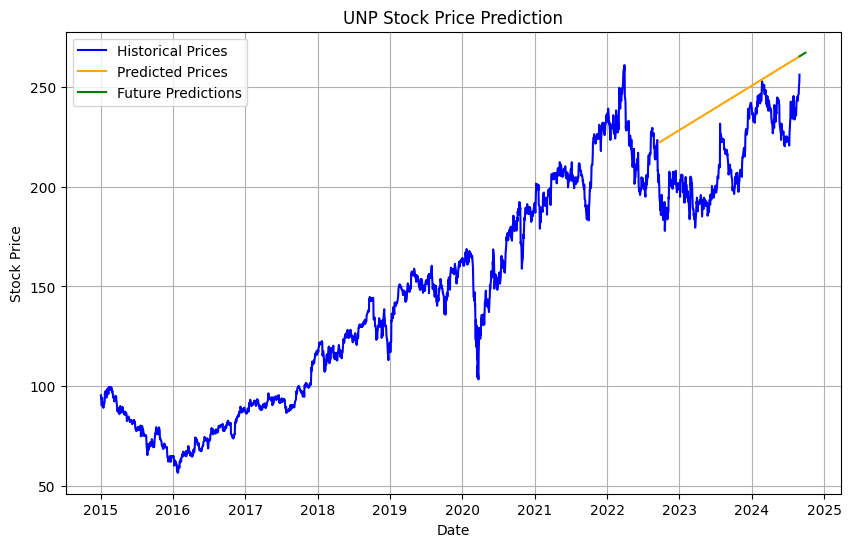

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


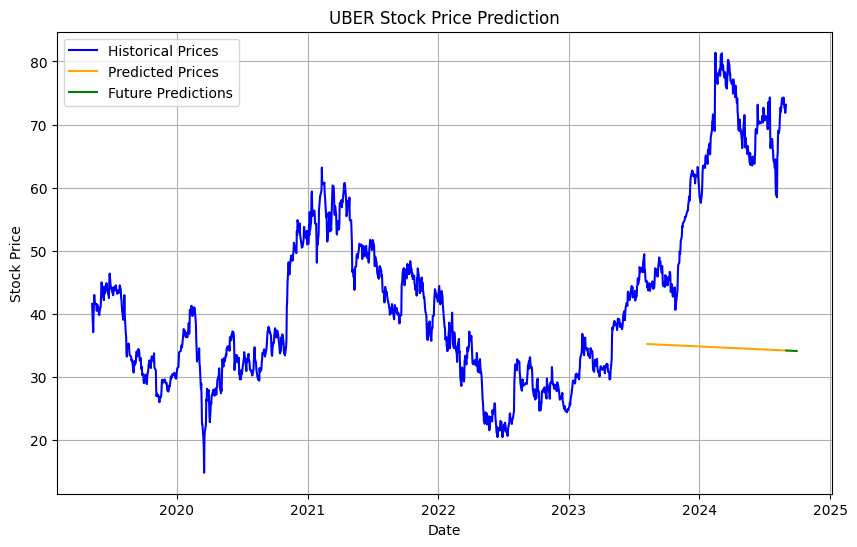

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


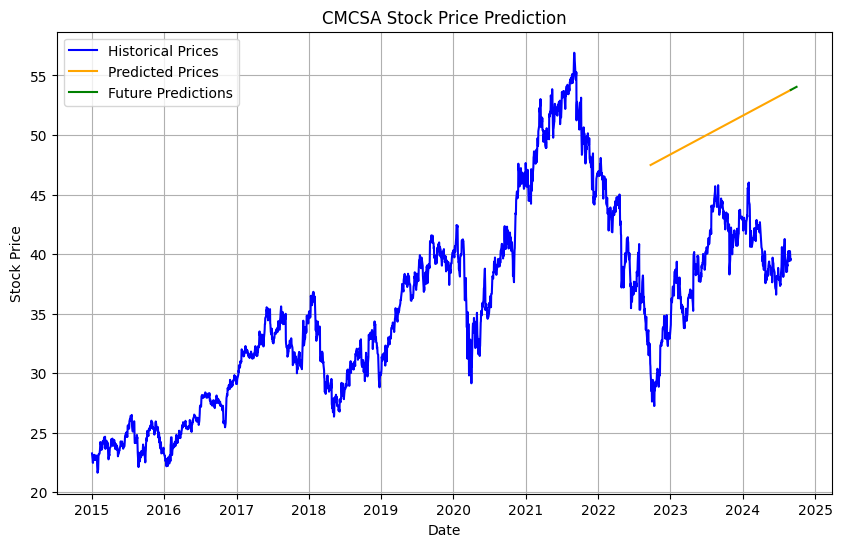

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


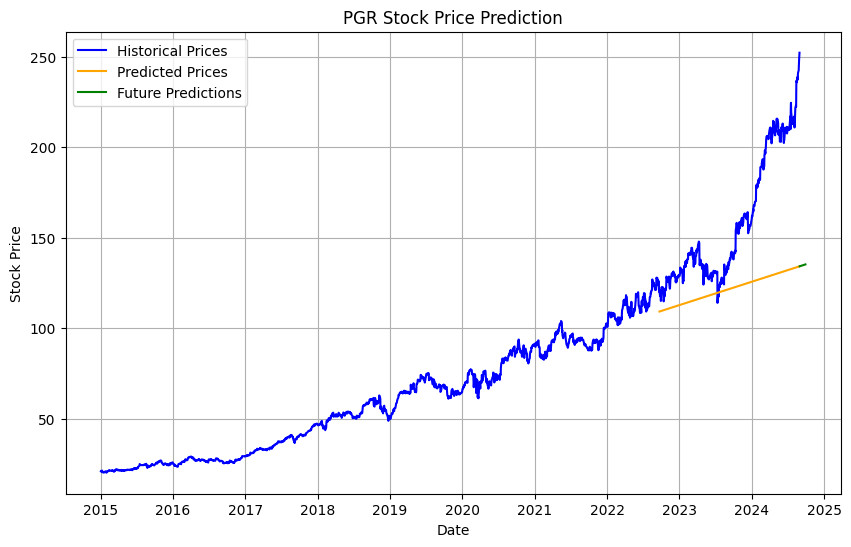

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


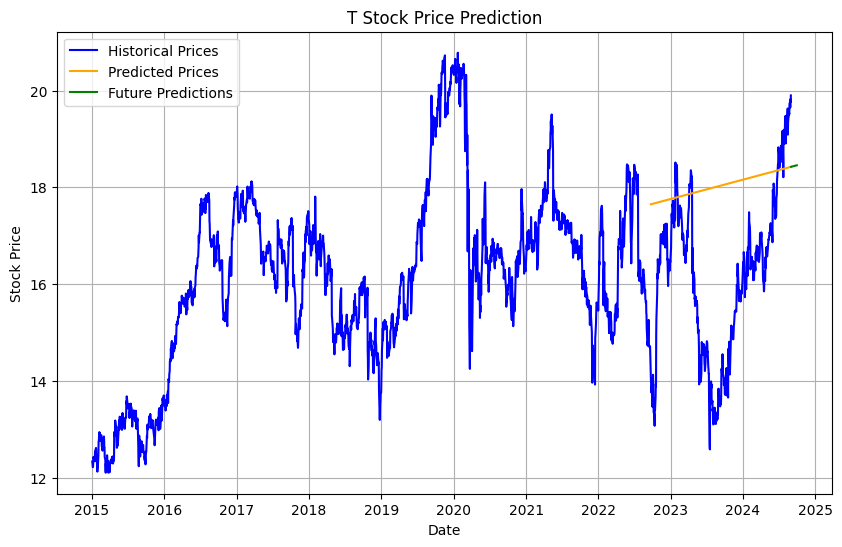

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


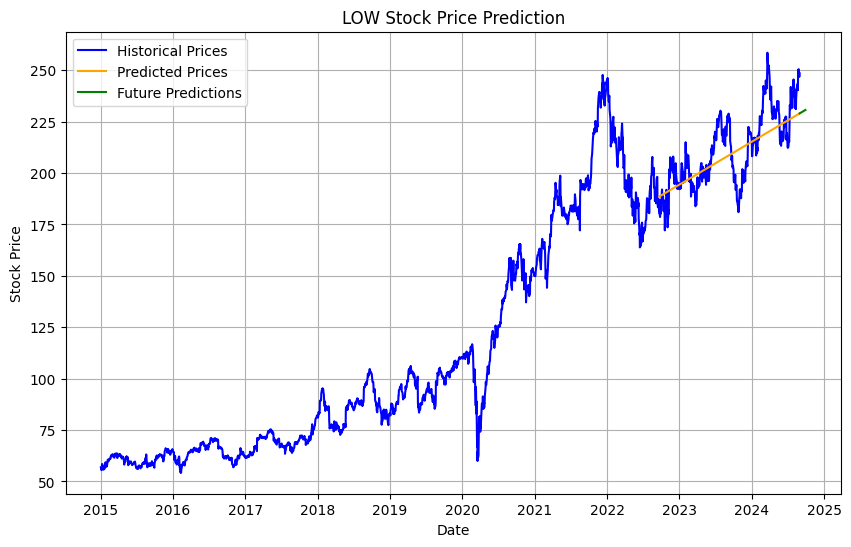

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


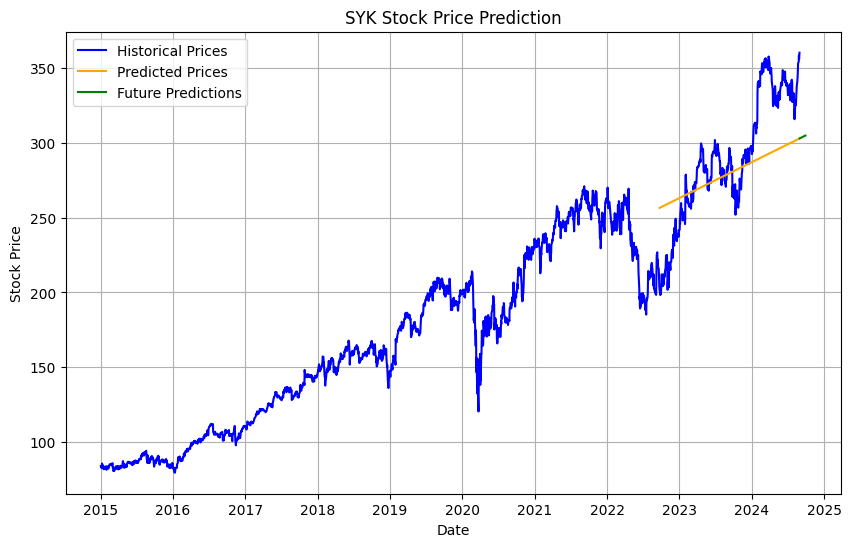

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


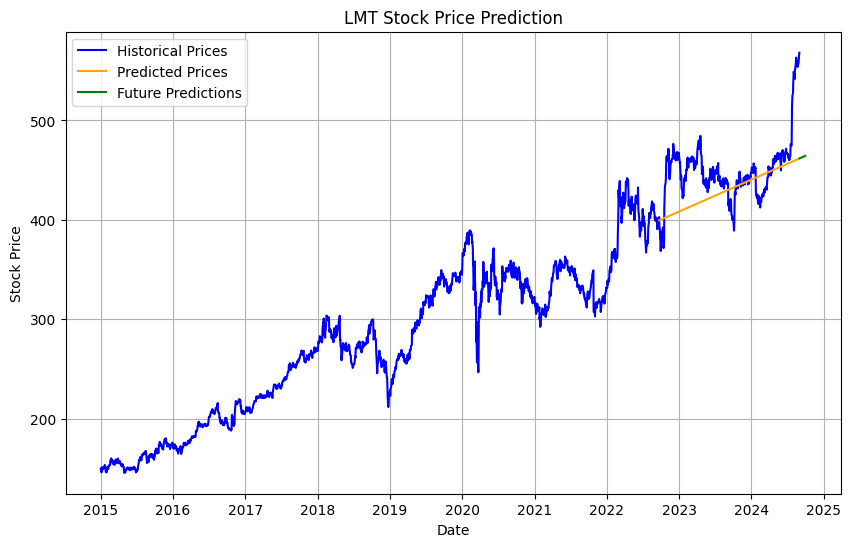

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


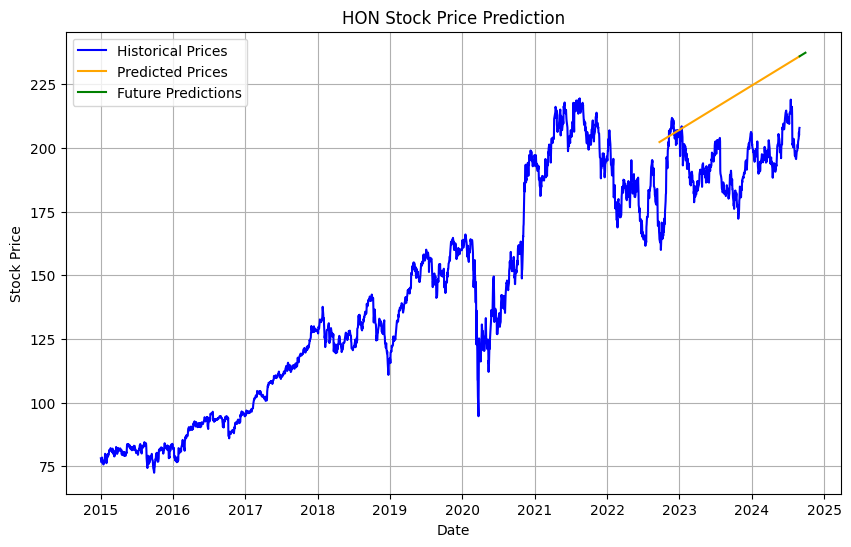

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


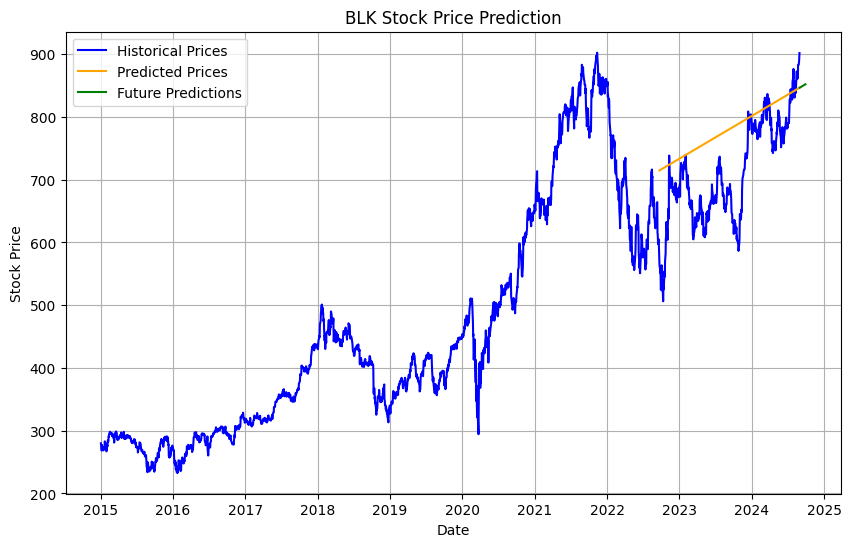

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


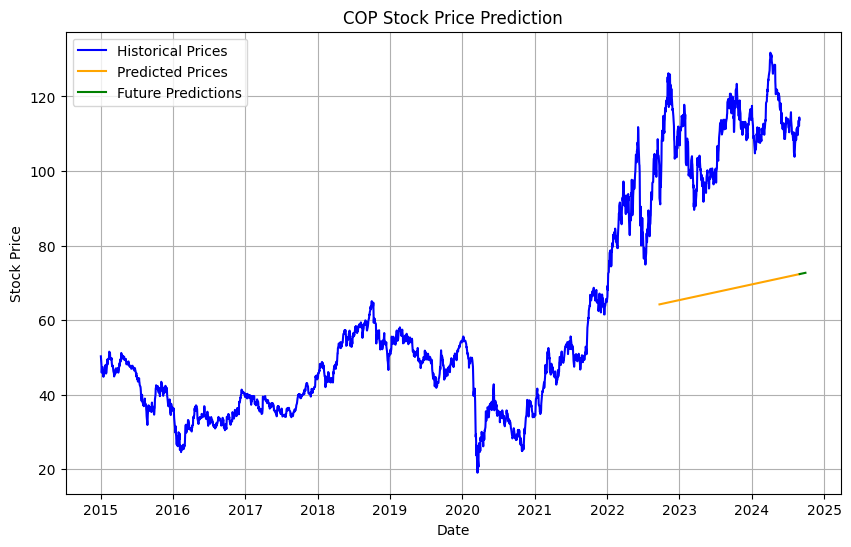

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


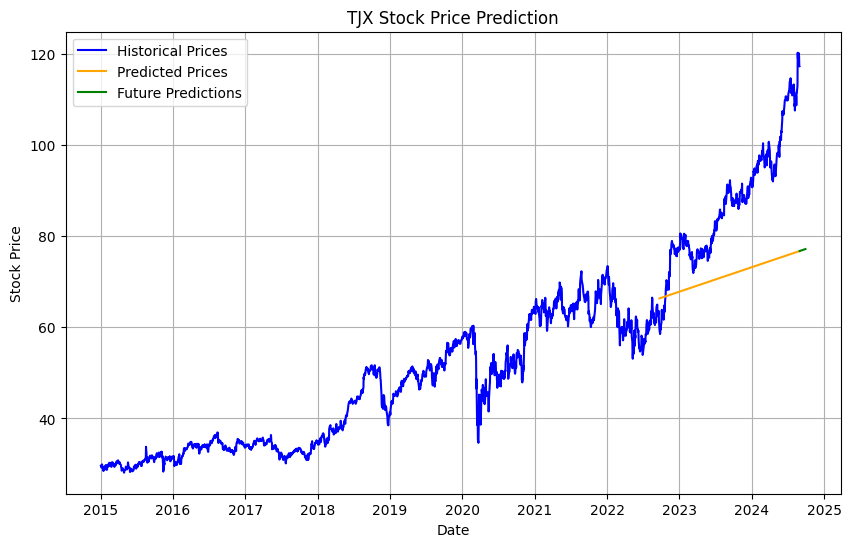

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


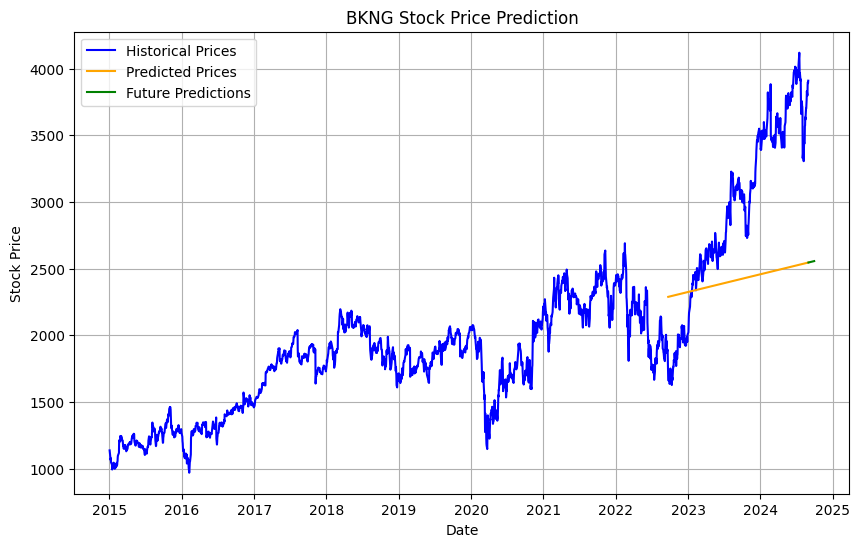

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


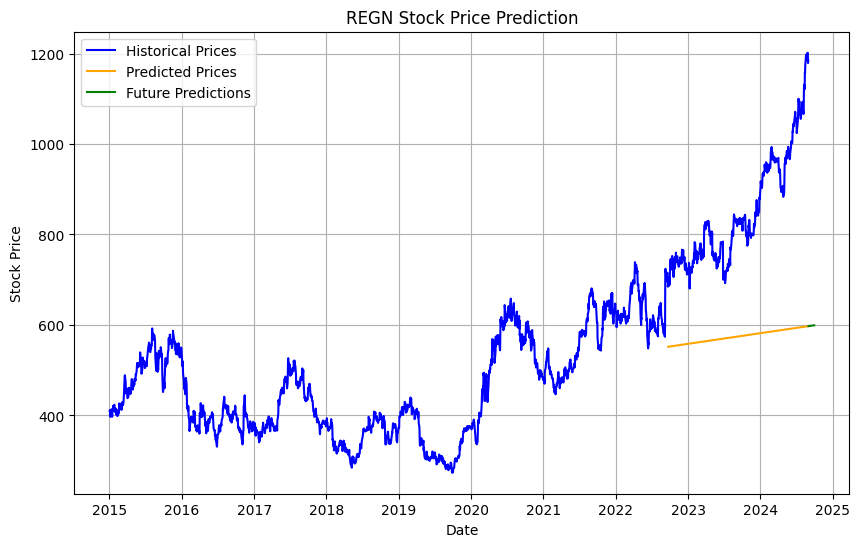

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


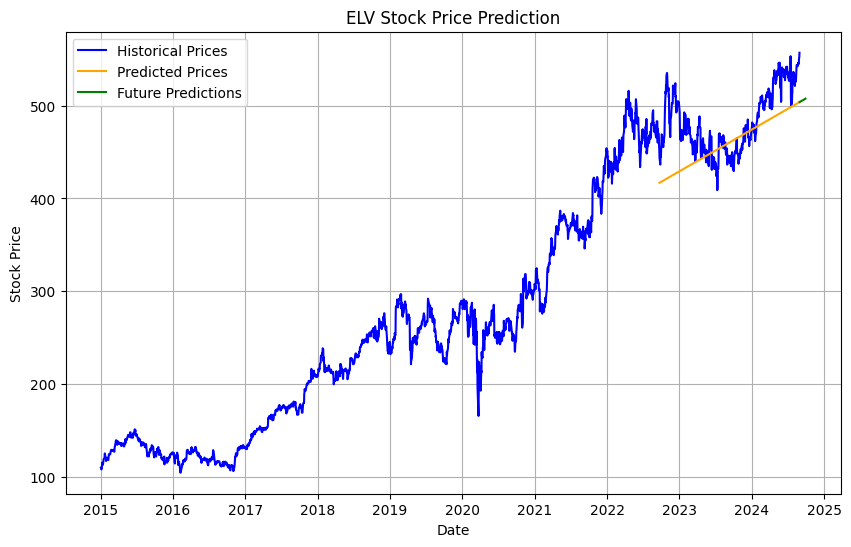

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


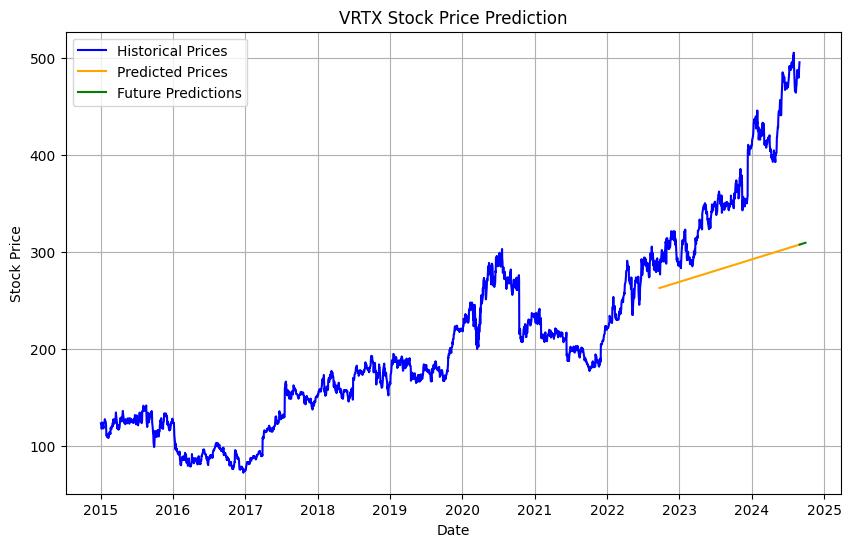

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


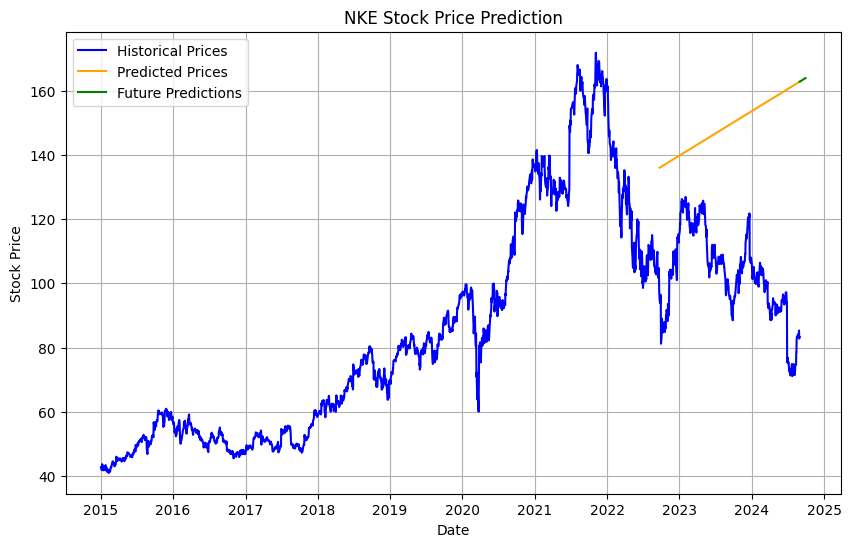

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


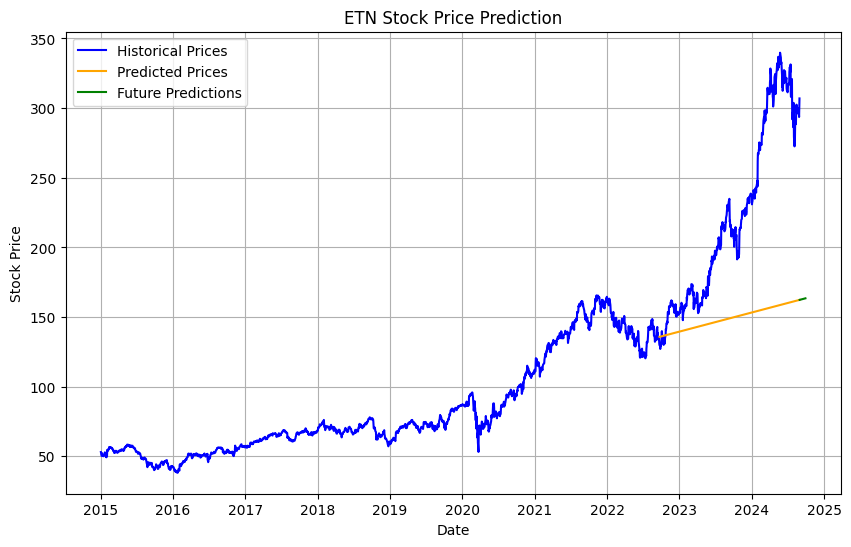

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


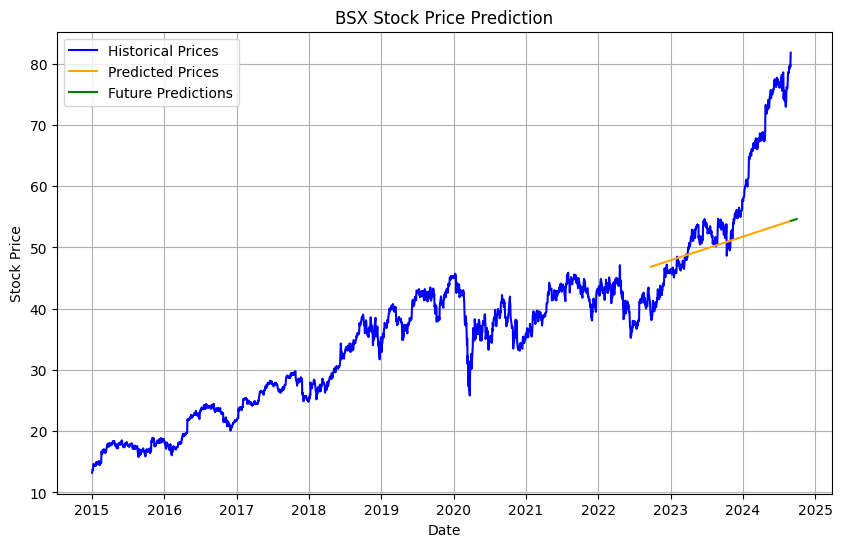

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


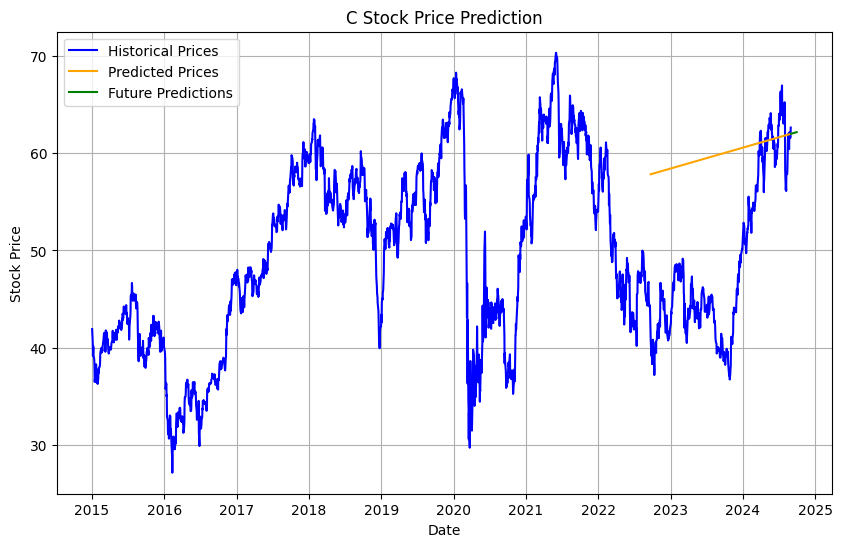

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


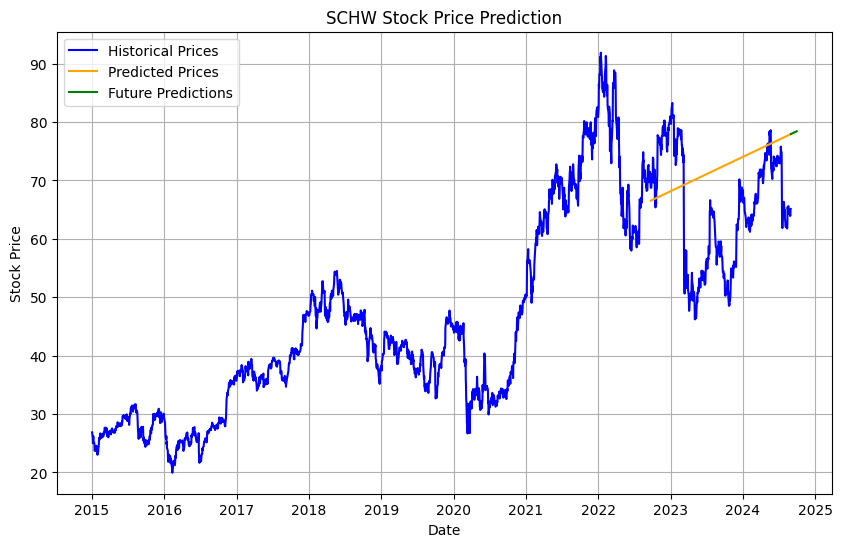

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


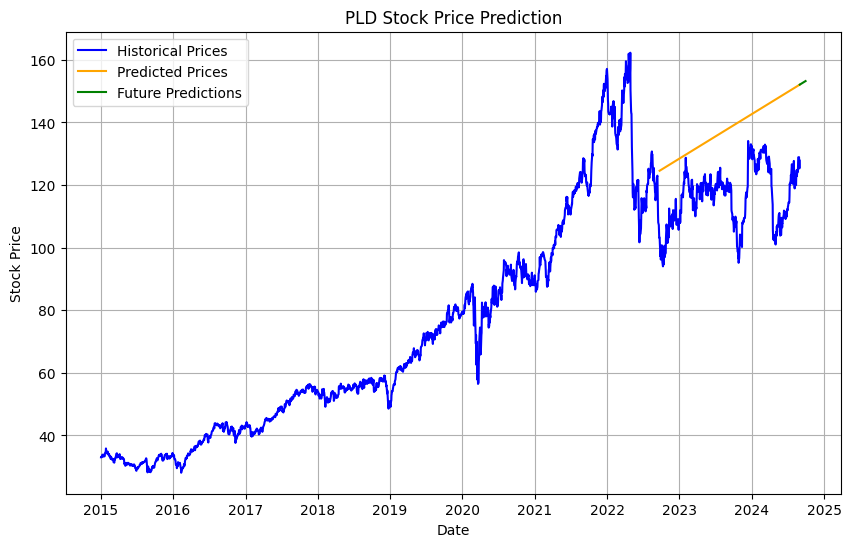

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


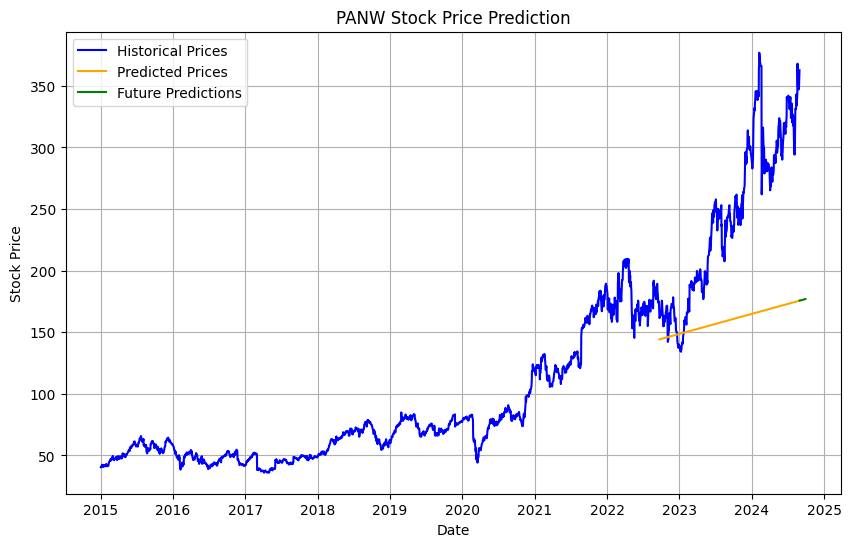

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


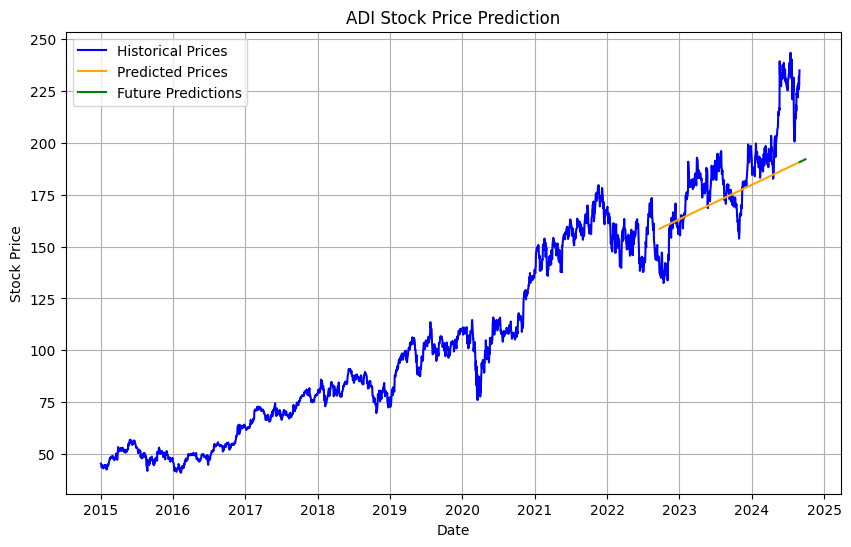

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


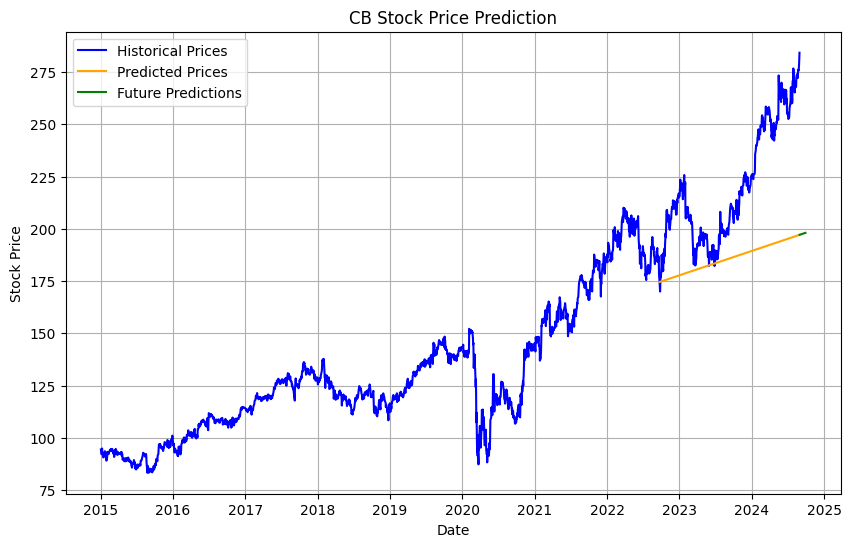

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


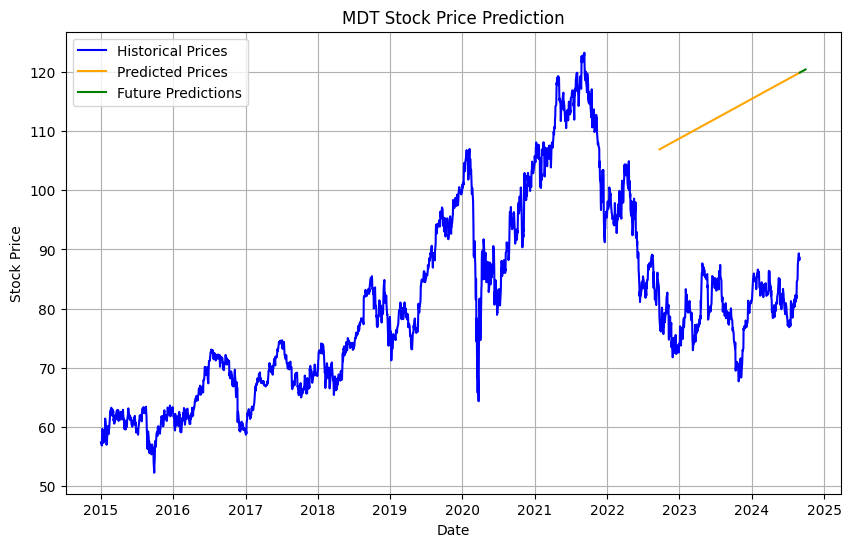

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


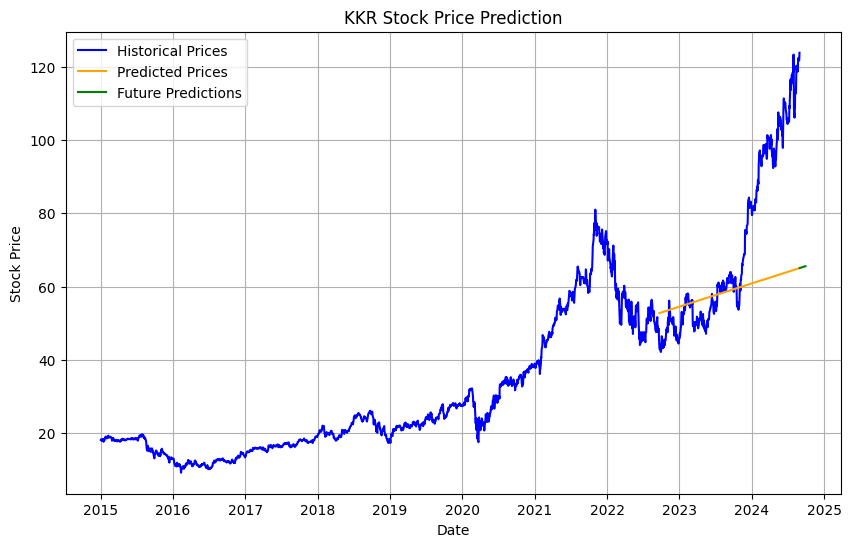

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


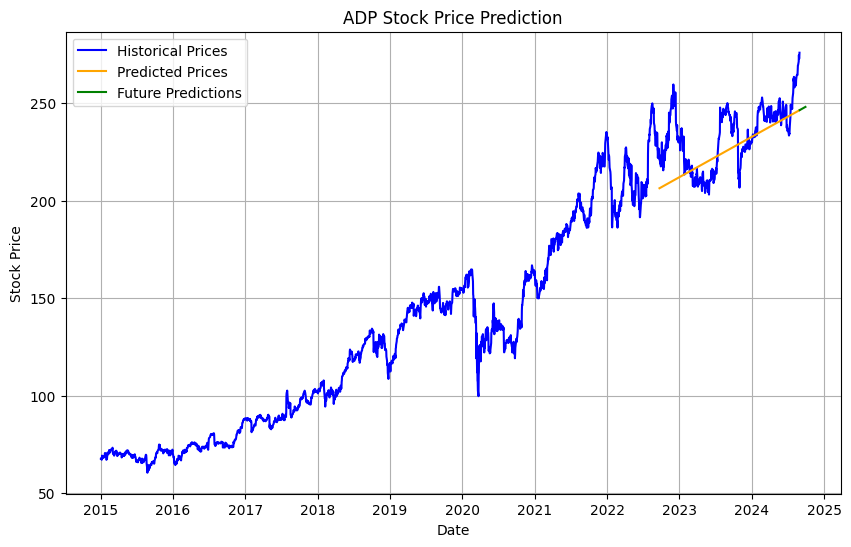

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


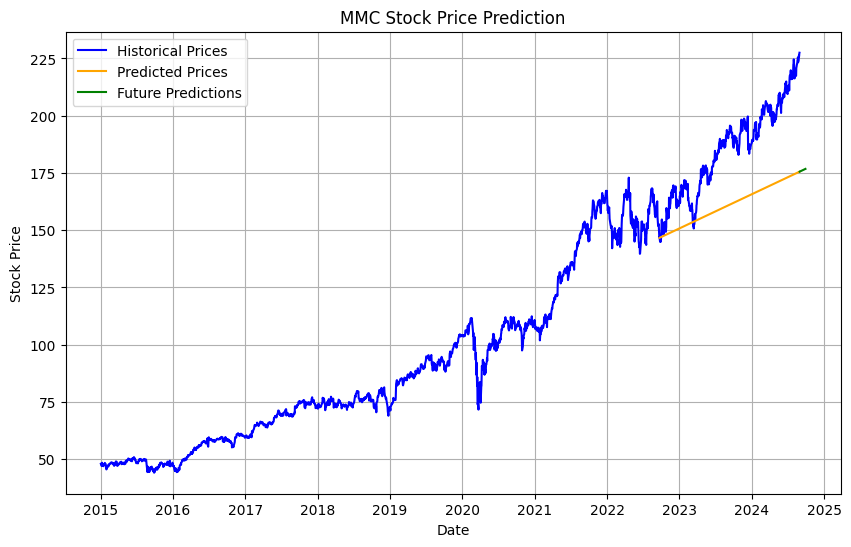

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


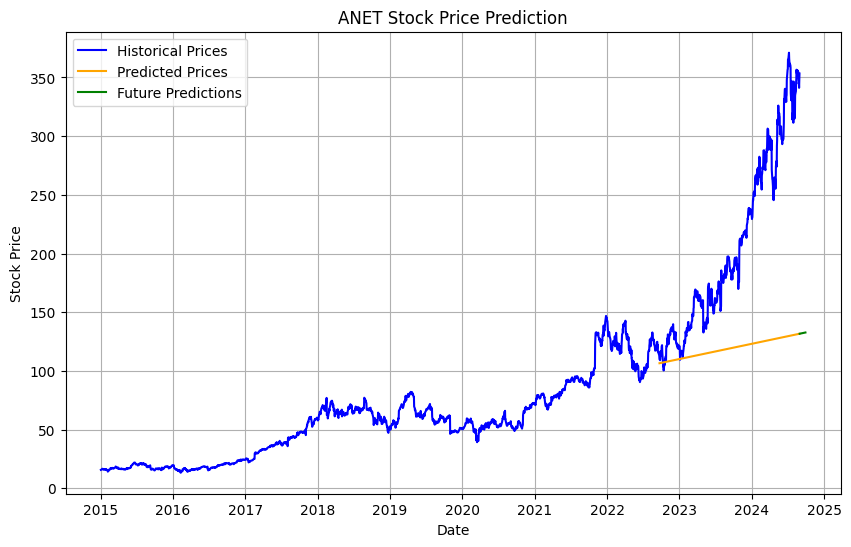

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


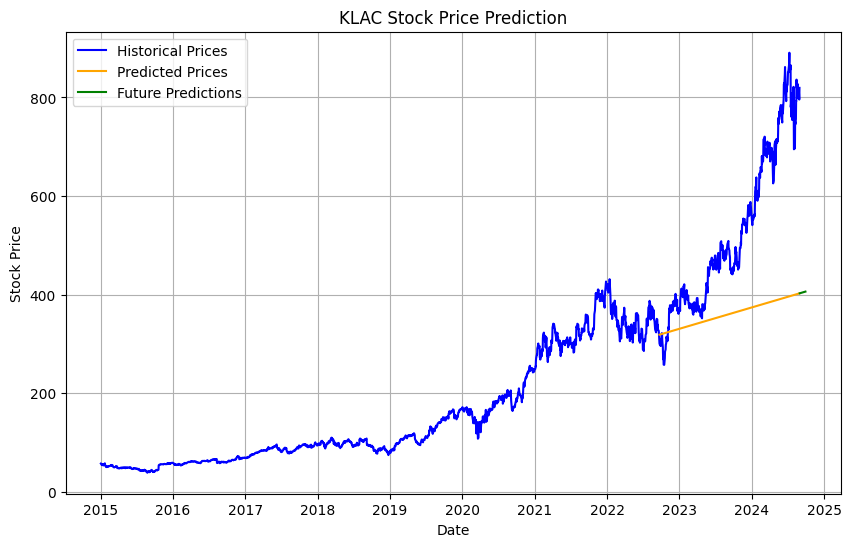

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


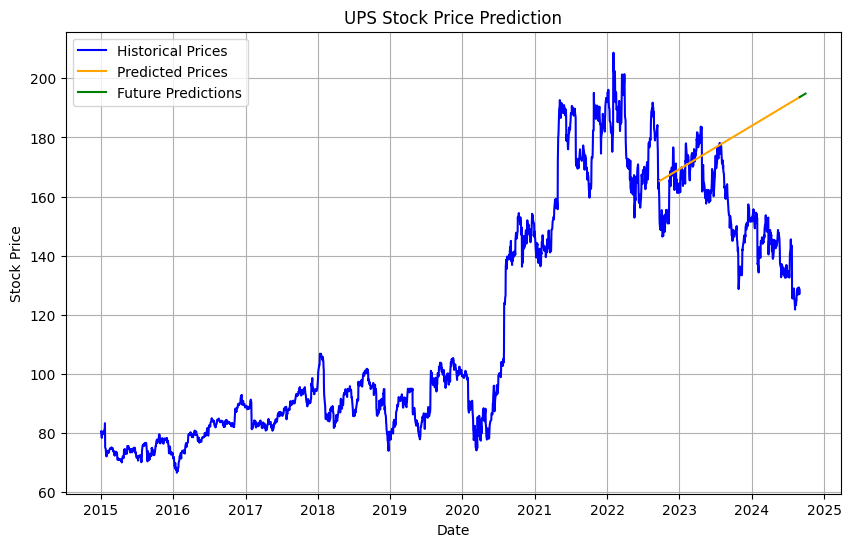

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


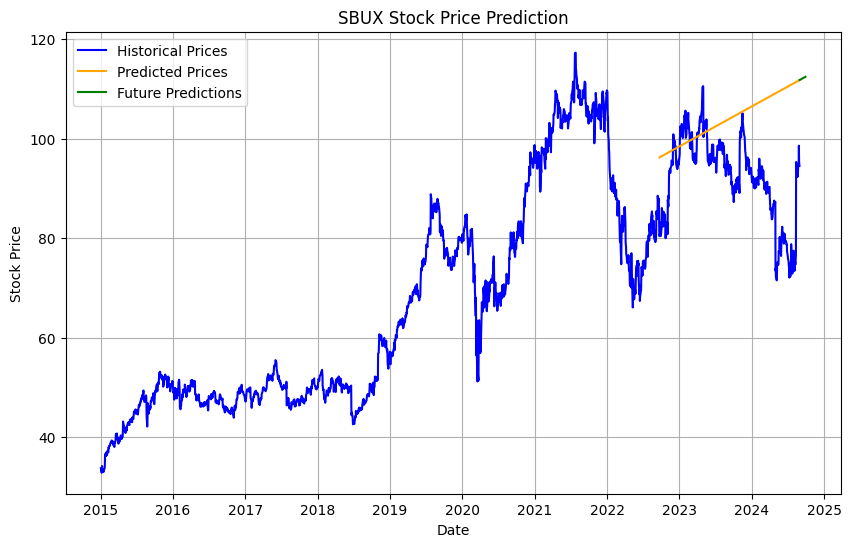

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


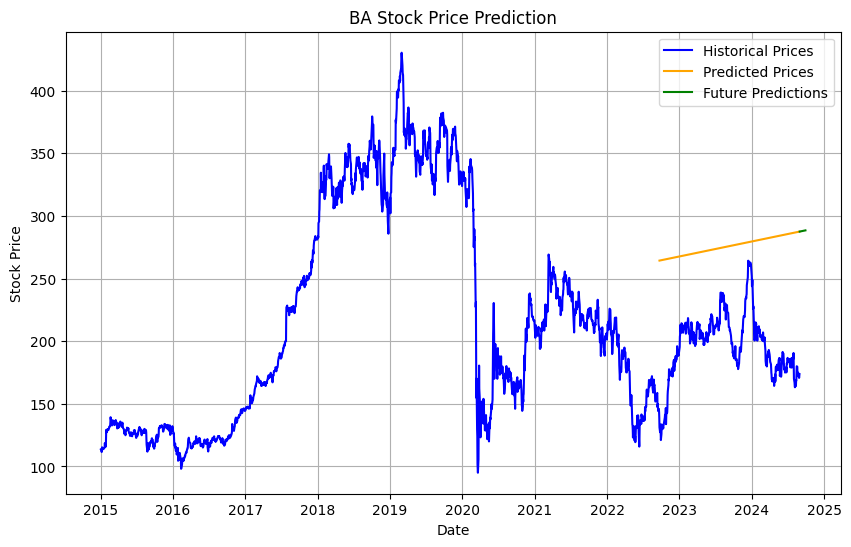

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


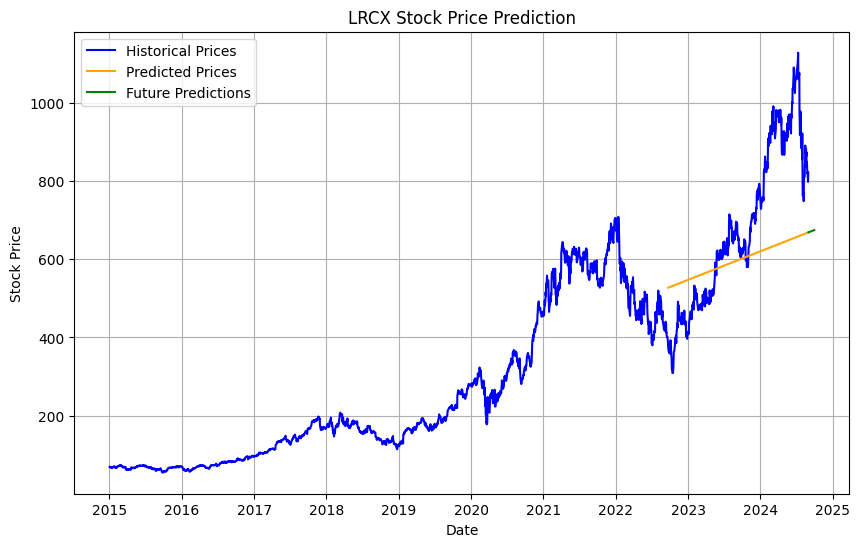

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


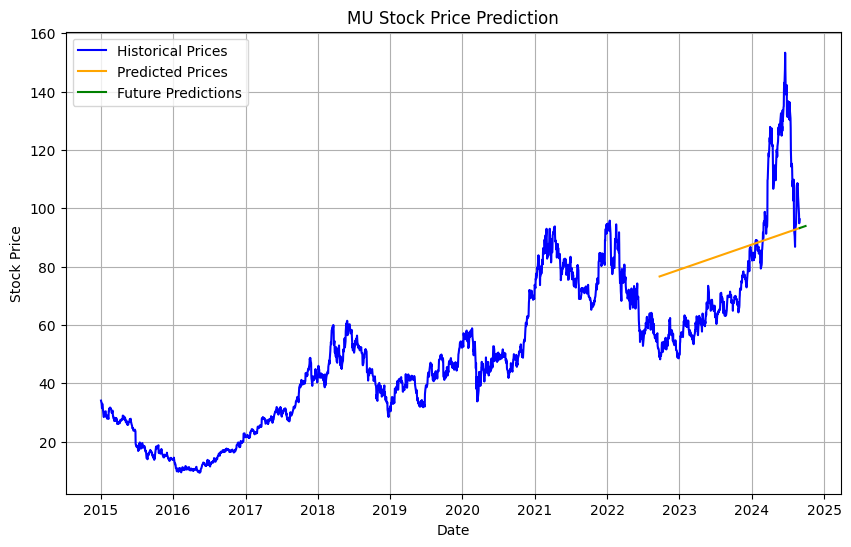

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


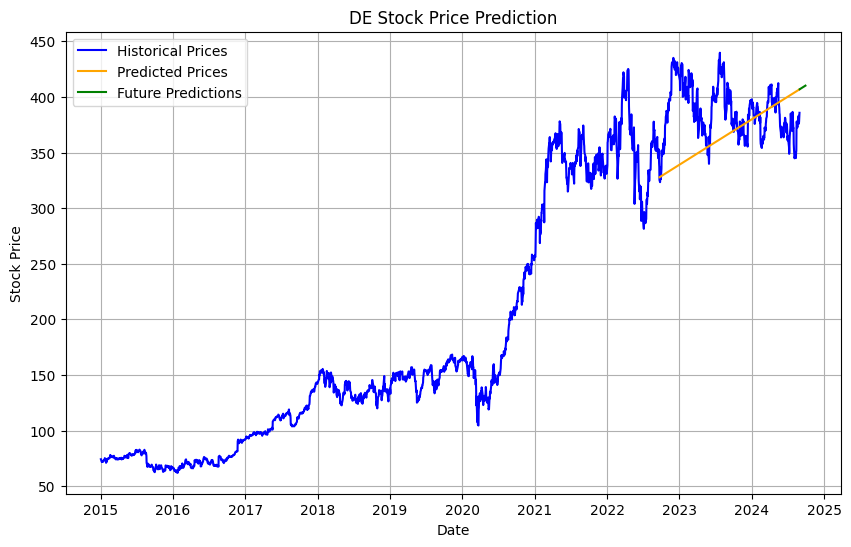

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


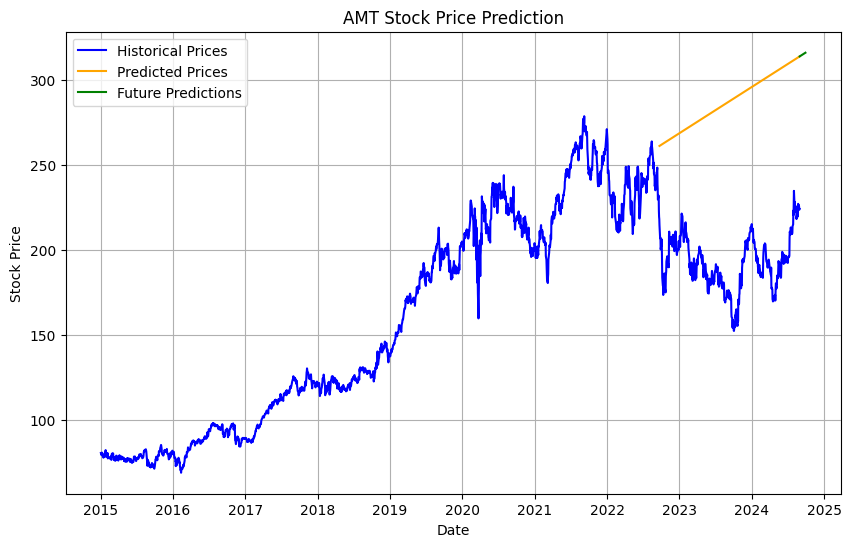

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


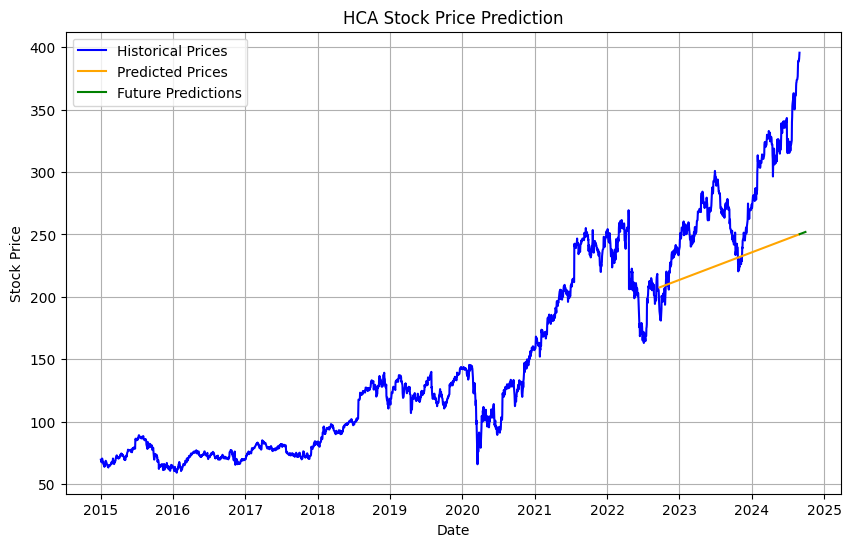

In [5]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from datetime import datetime

# Load the stock data from the previously created CSV file
us_stock_data = pd.read_csv('us_stock_top100_data.csv')

# Define a function to create a stock prediction graph
def create_stock_prediction_graph(stock_symbol):
    # Fetch the historical data for the stock
    stock = yf.Ticker(stock_symbol)
    hist_data = stock.history(start='2015-01-01')
    
    if hist_data.empty:
        return
    
    # Convert datetime index to ordinal for linear regression
    hist_data['DateOrdinal'] = hist_data.index.map(datetime.toordinal)
    
    # Define the features and target
    X = hist_data[['DateOrdinal']]
    y = hist_data['Close']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Create and train the linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    # Predict the stock prices
    y_pred = model.predict(X_test)
    
    # Calculate the mean squared error
    mse = mean_squared_error(y_test, y_pred)
    
    # Generate future dates for prediction (e.g., 30 days into the future)
    future_days = 30
    last_date = hist_data.index[-1]
    future_dates = pd.date_range(start=last_date, periods=future_days + 1, freq='D')[1:]
    future_dates_ordinal = future_dates.map(datetime.toordinal)
    
    # Predict future stock prices
    future_prices = model.predict(future_dates_ordinal.values.reshape(-1, 1))
    
    # Plot the historical and predicted stock prices
    plt.figure(figsize=(10, 6))
    plt.plot(hist_data.index, hist_data['Close'], label='Historical Prices', color='blue')
    plt.plot(X_test.index, y_pred, label='Predicted Prices', color='orange')
    plt.plot(future_dates, future_prices, label='Future Predictions', color='green')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.title(f'{stock_symbol} Stock Price Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

# Loop through each stock symbol and create a prediction graph
for symbol in us_stock_data['Symbol']:
    create_stock_prediction_graph(symbol)

##### b. Using Polynomial Regression

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


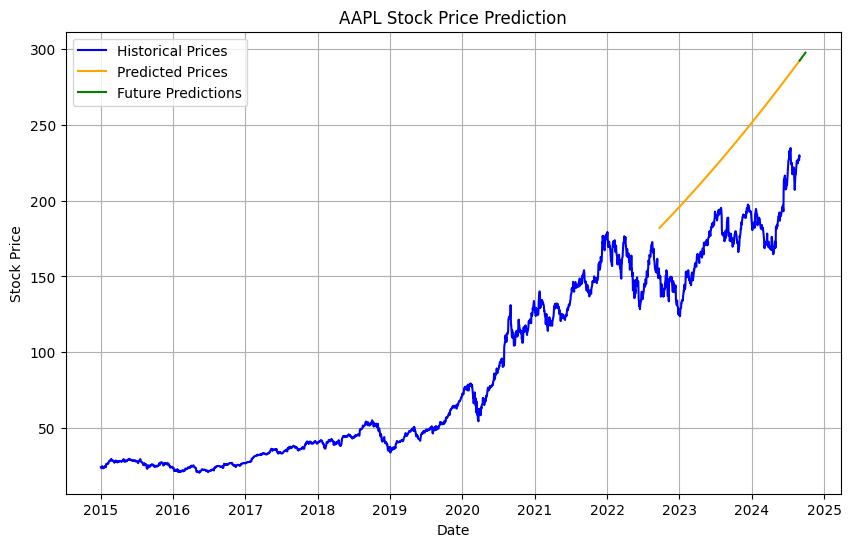

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


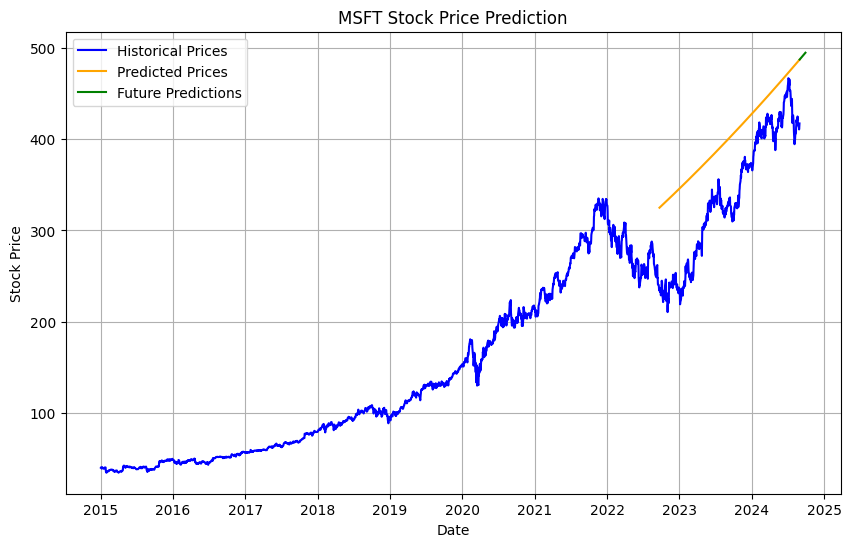

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


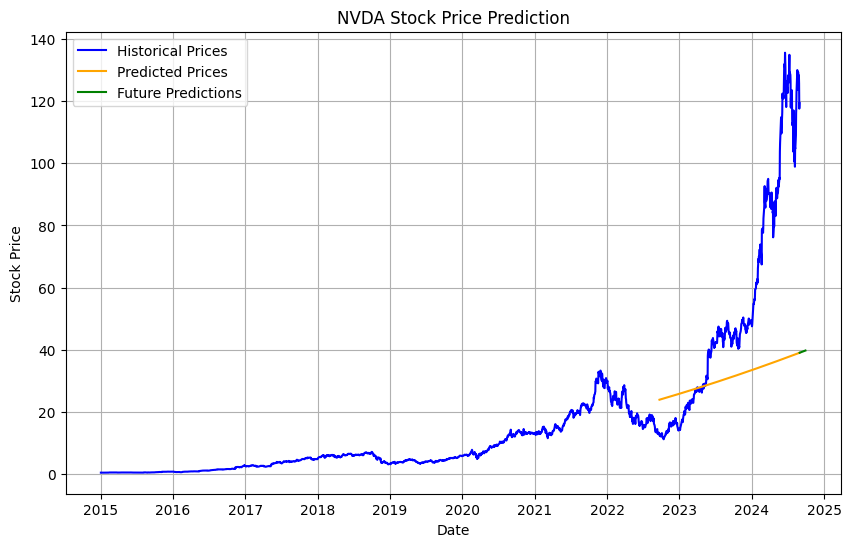

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


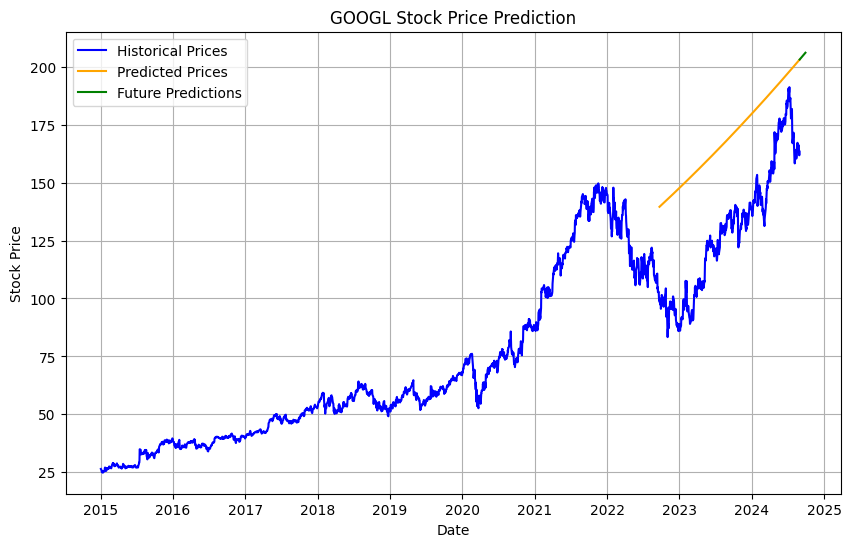

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


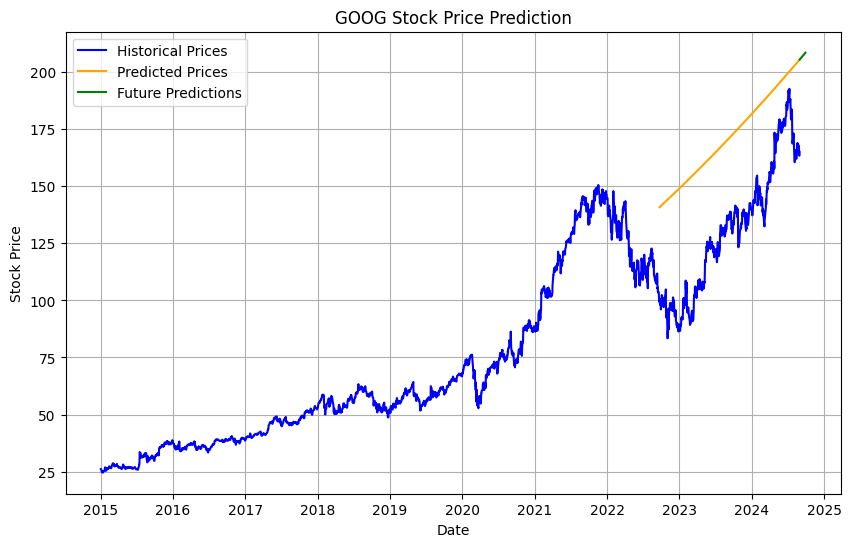

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


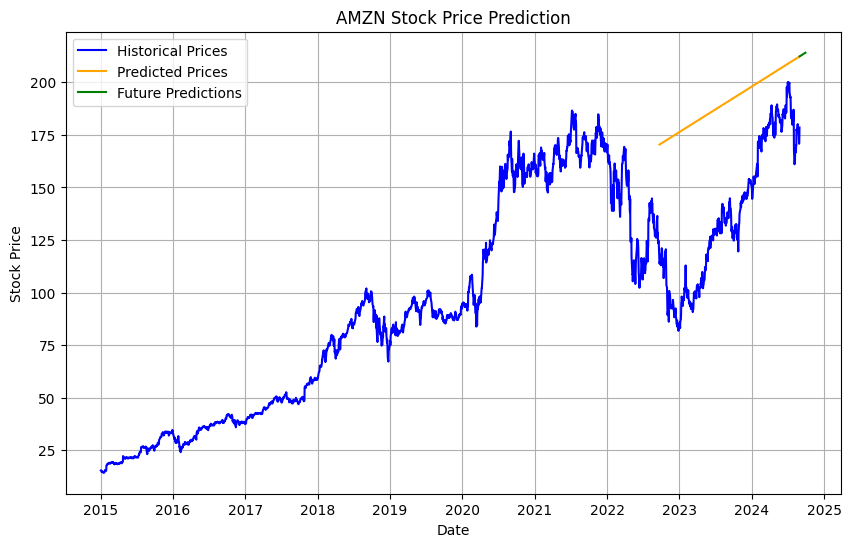

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


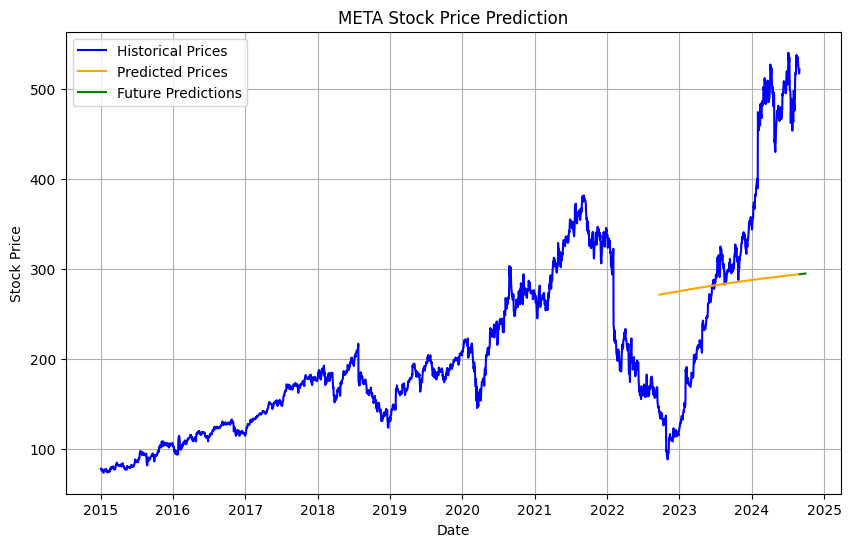

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


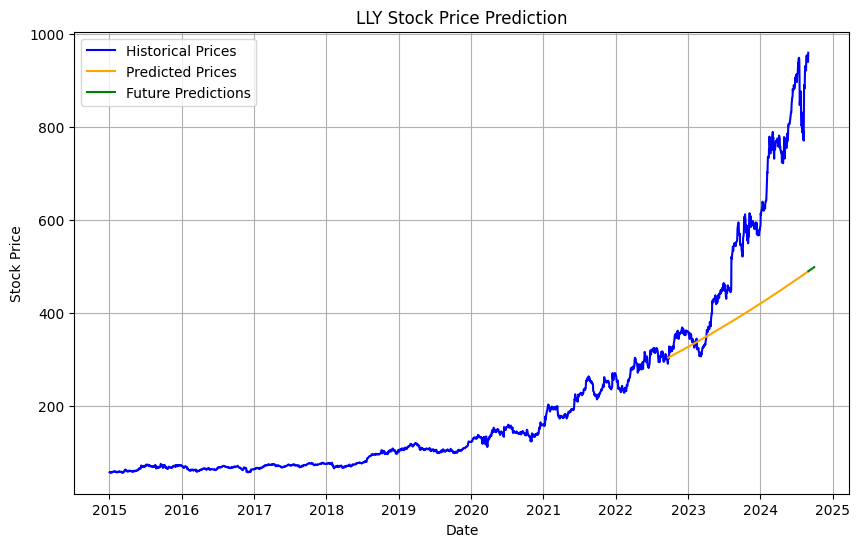

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


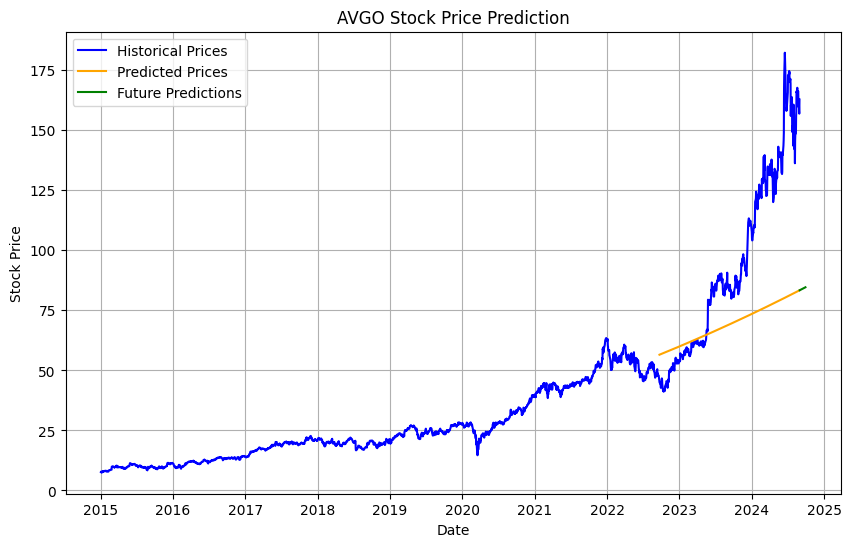

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


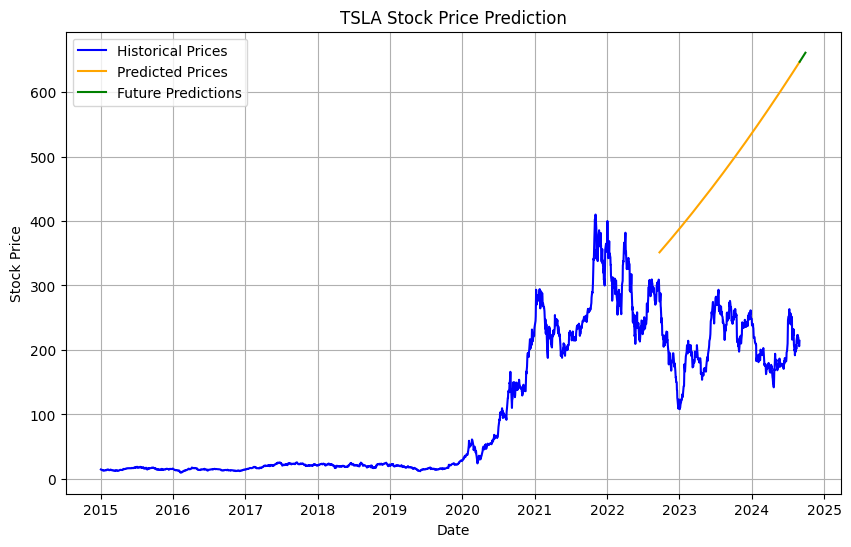

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


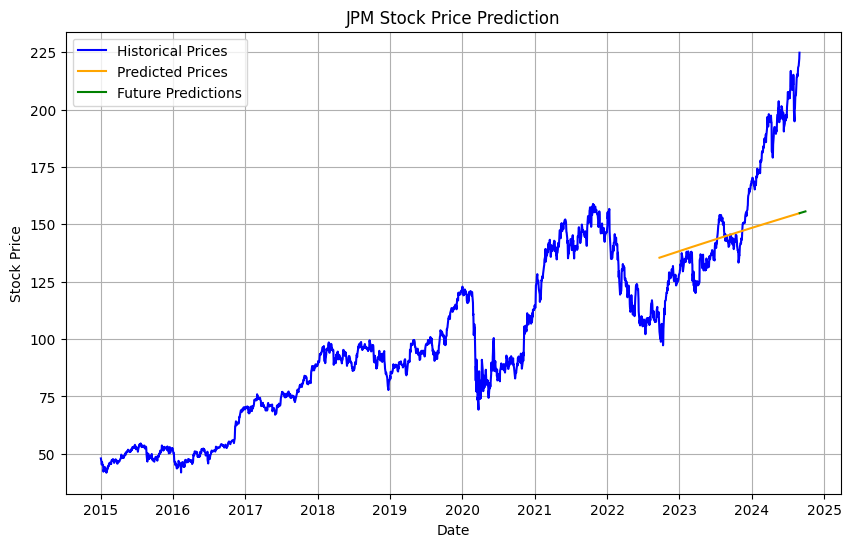

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


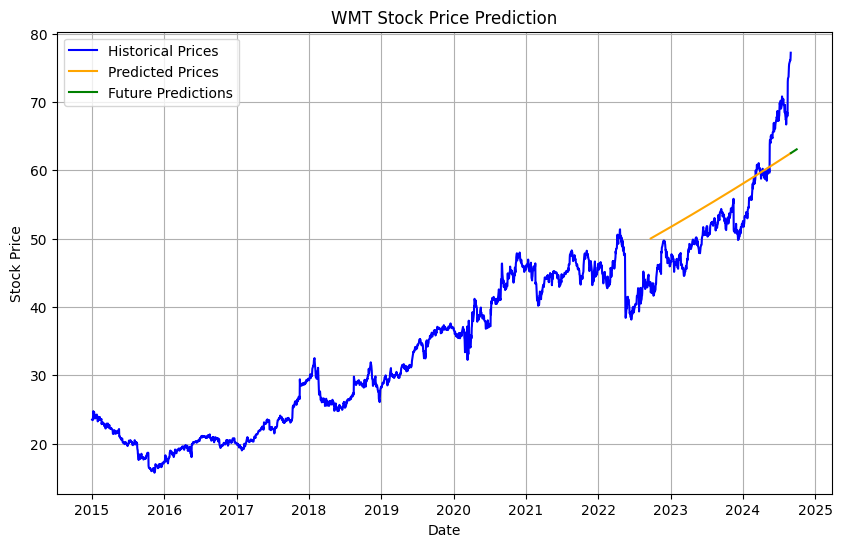

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


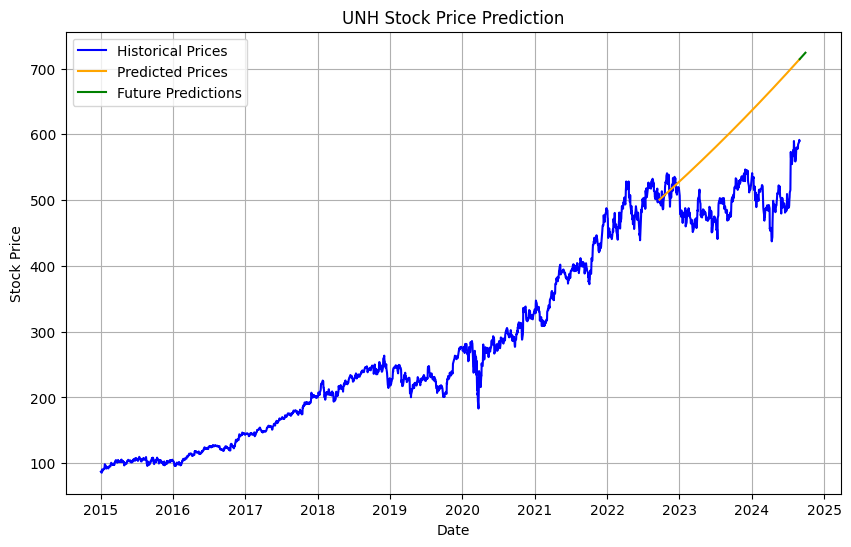

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


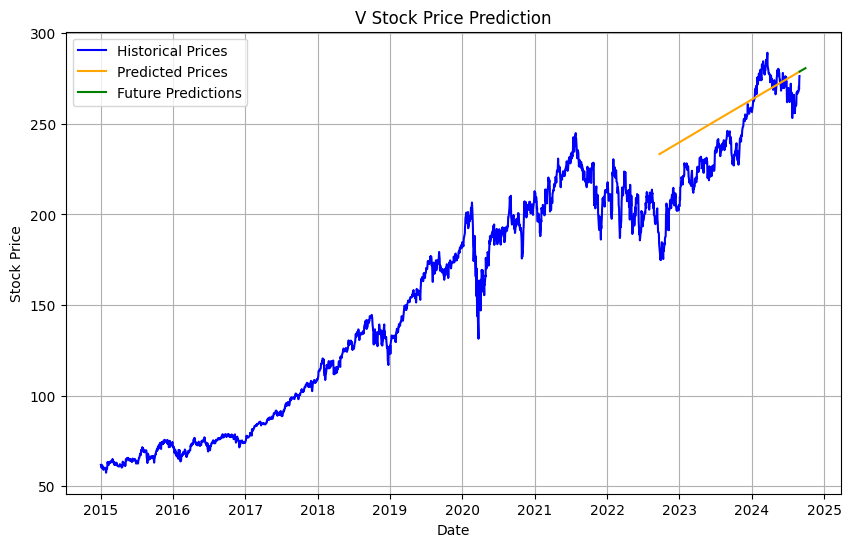

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


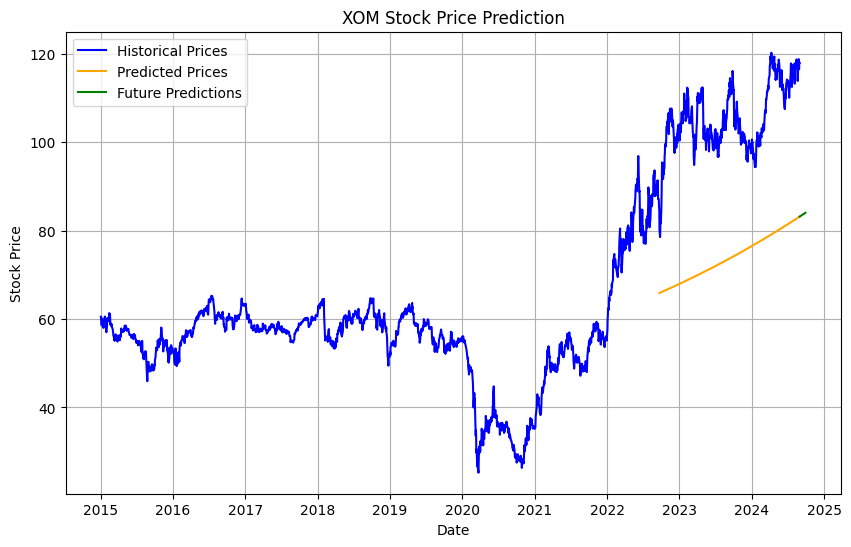

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


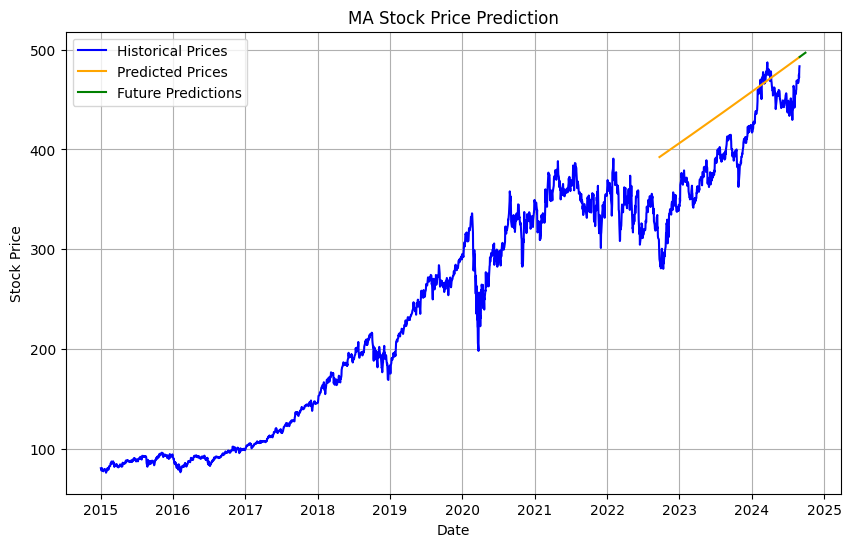

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


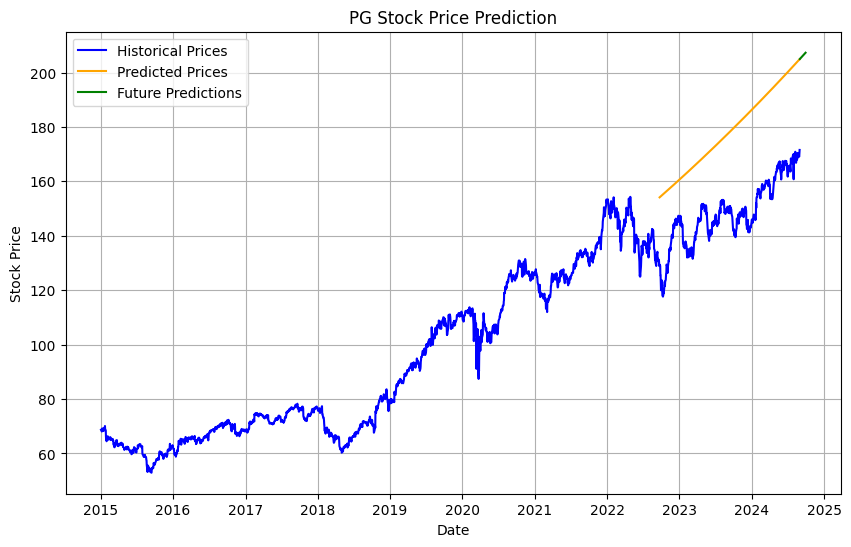

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


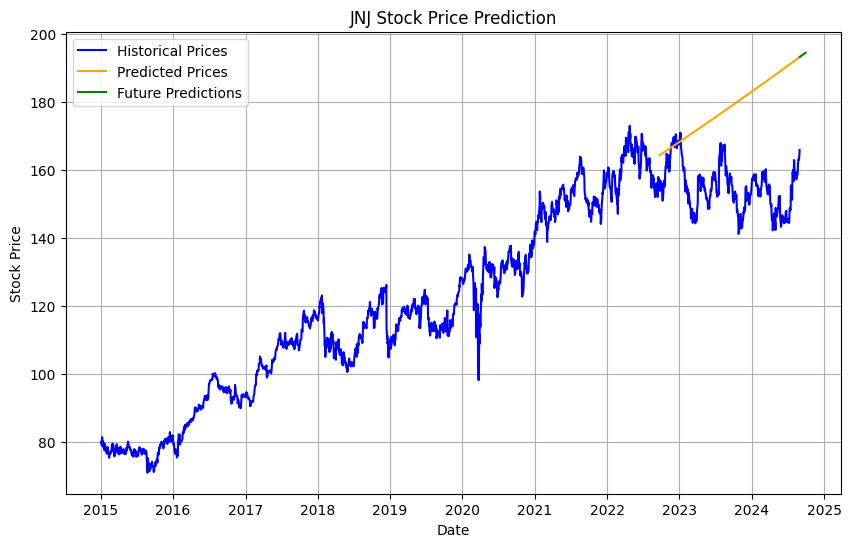

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


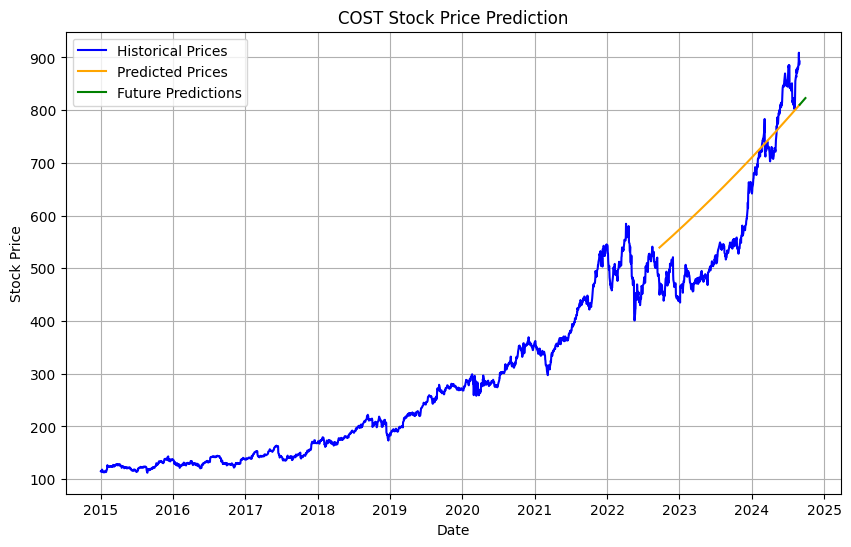

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


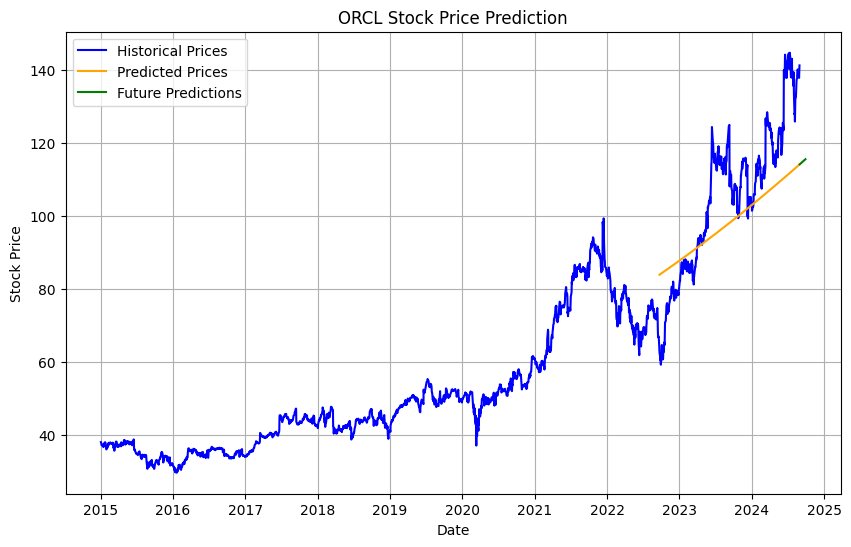

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


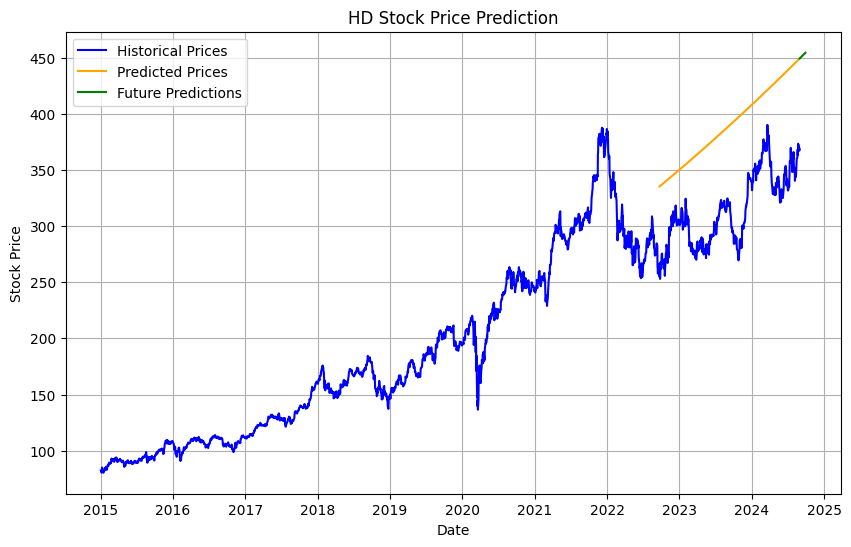

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


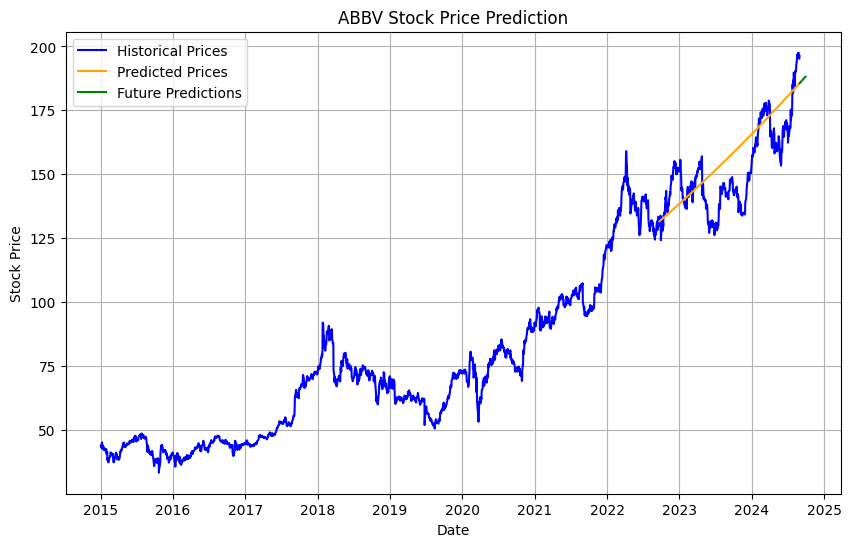

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


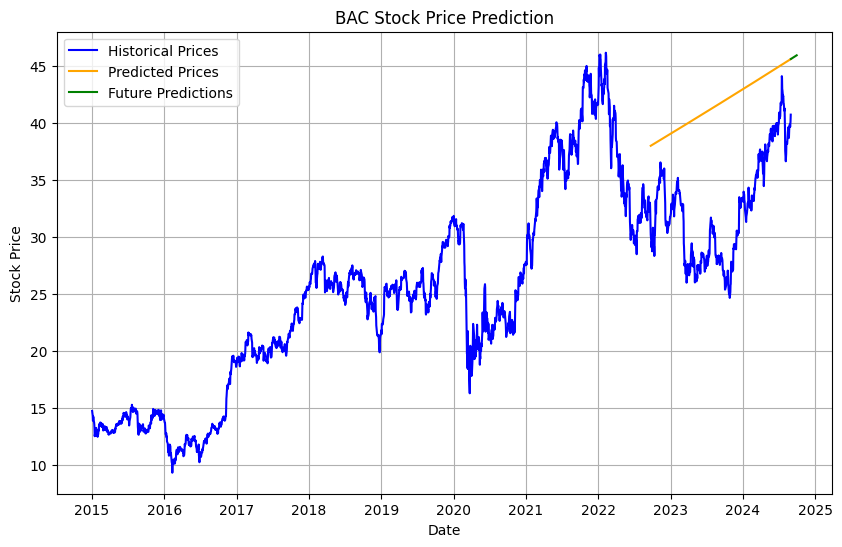

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


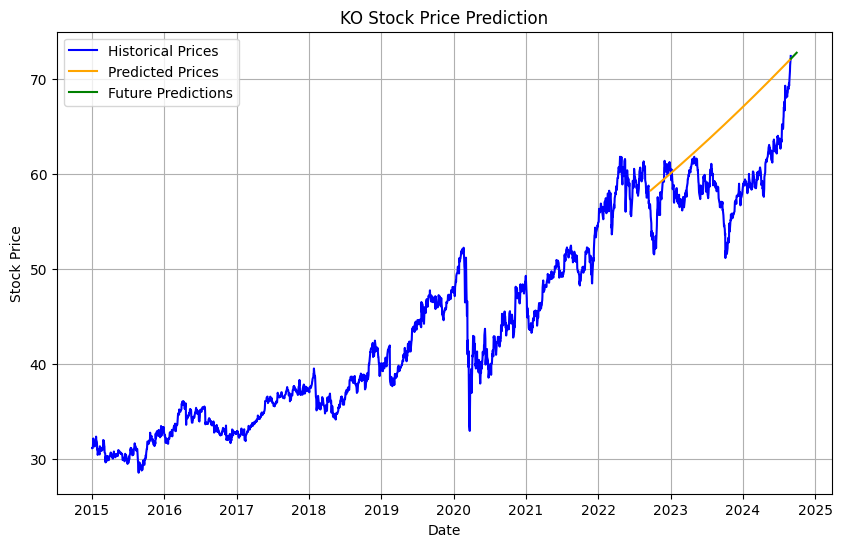

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


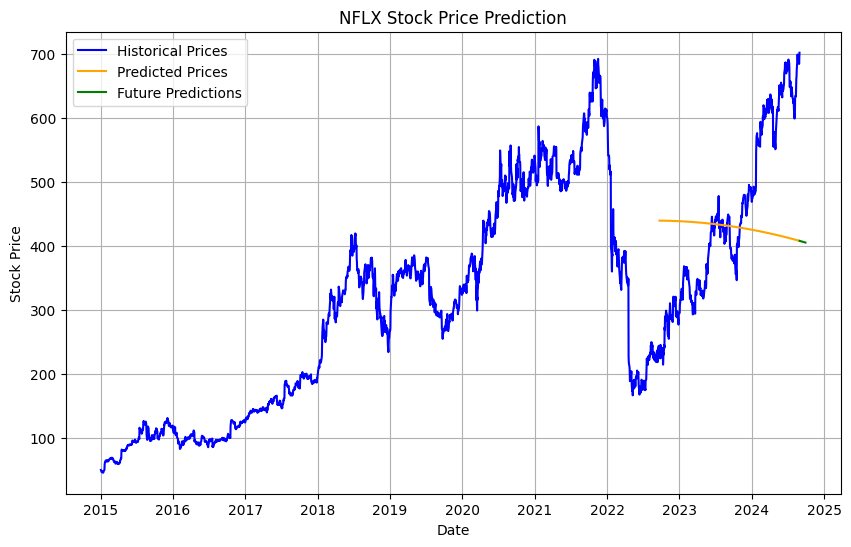

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


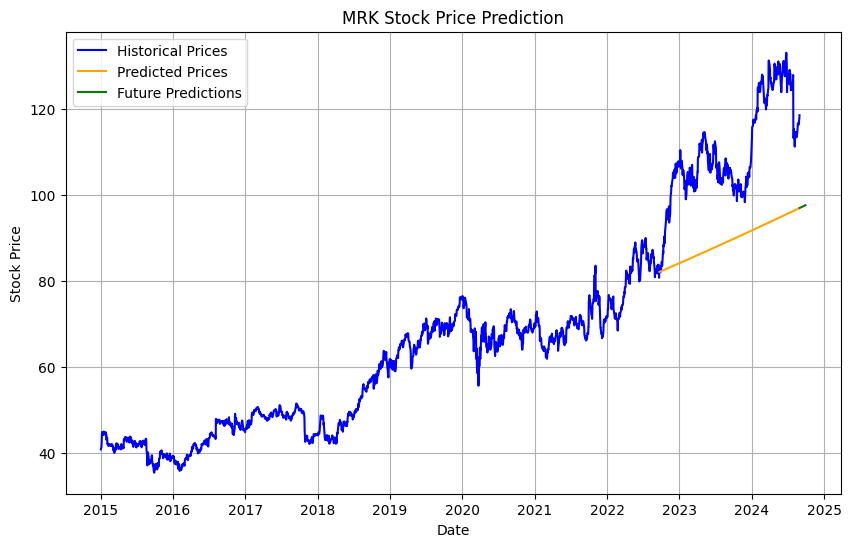

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


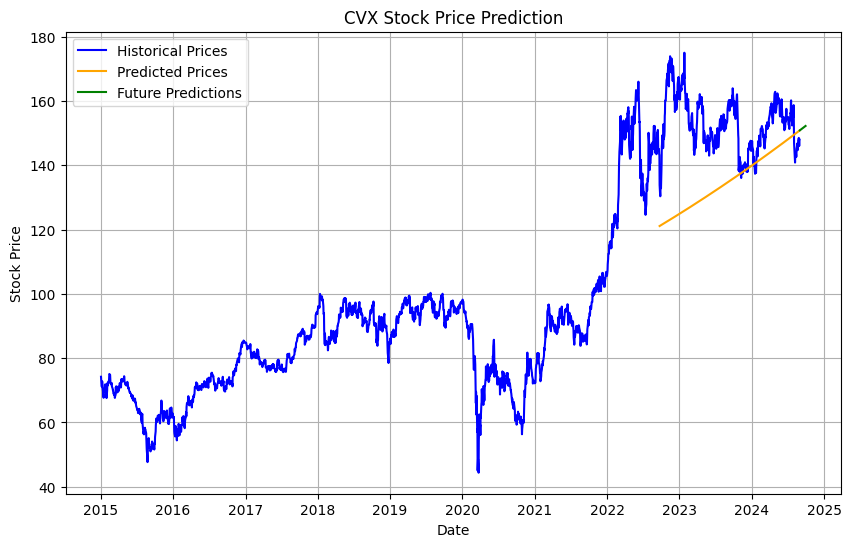

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


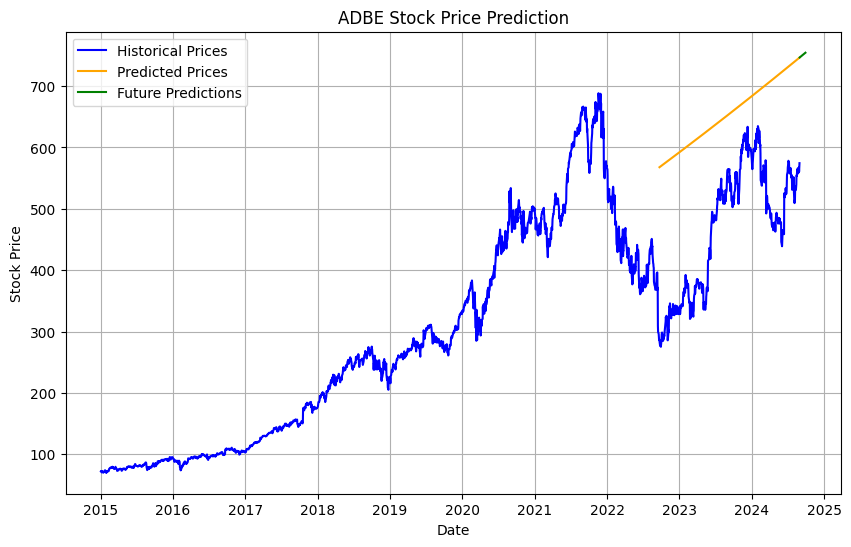

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


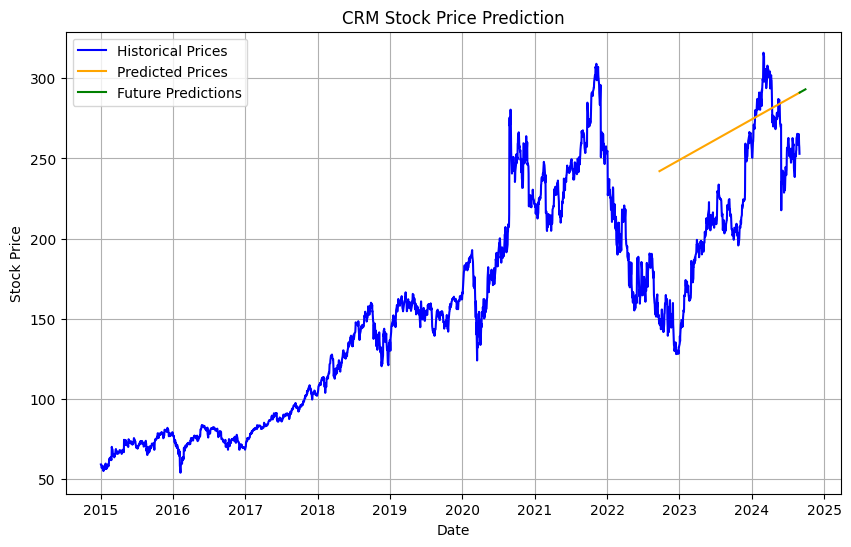

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


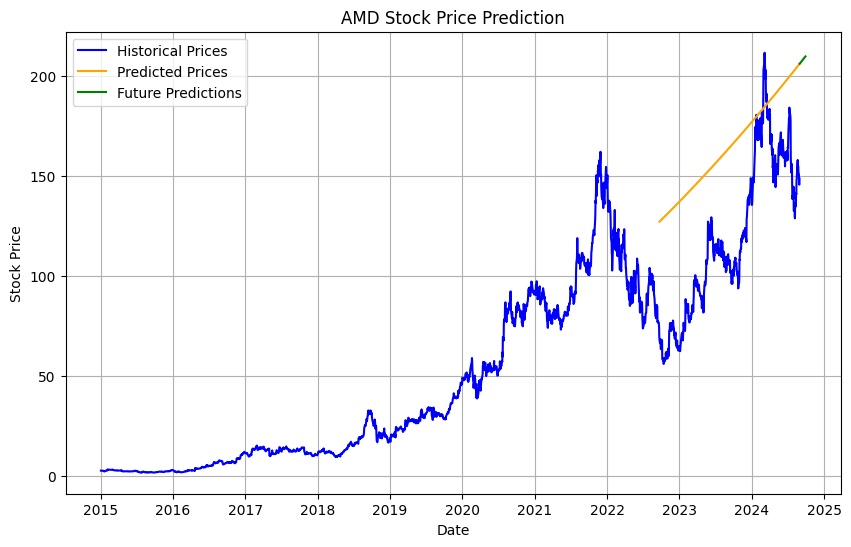

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


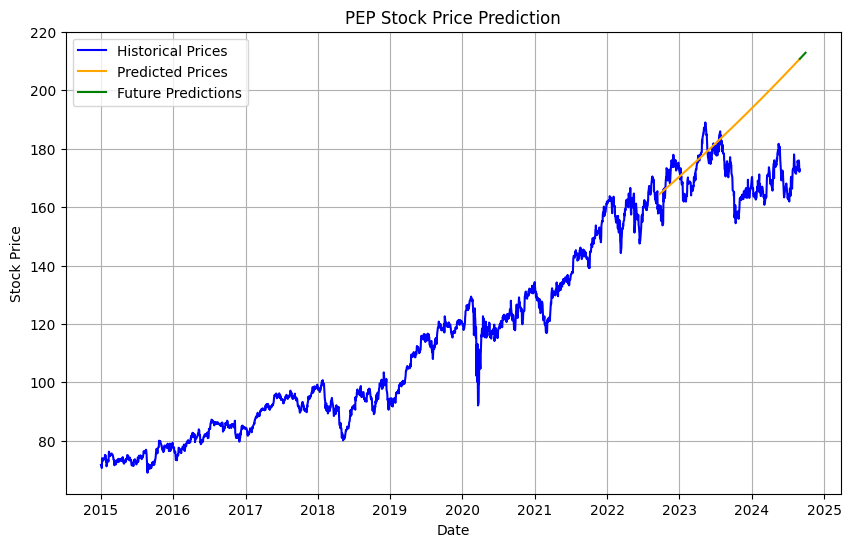

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


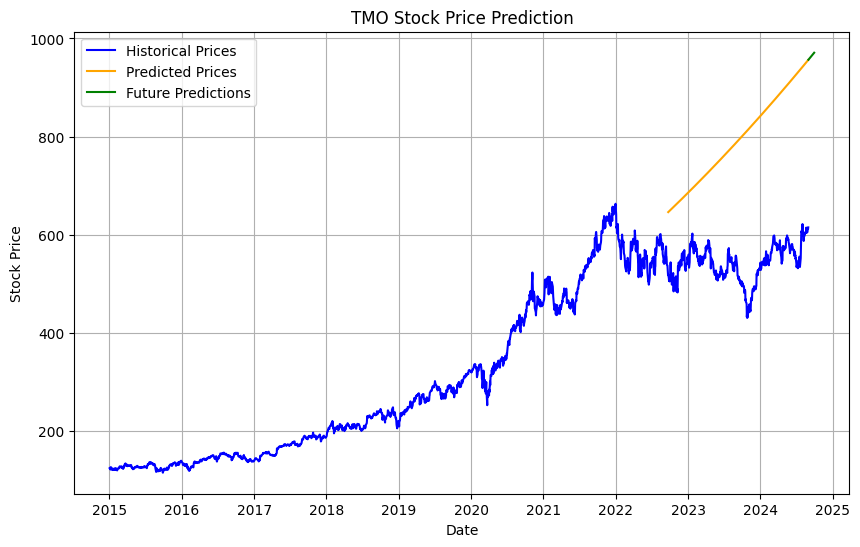

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


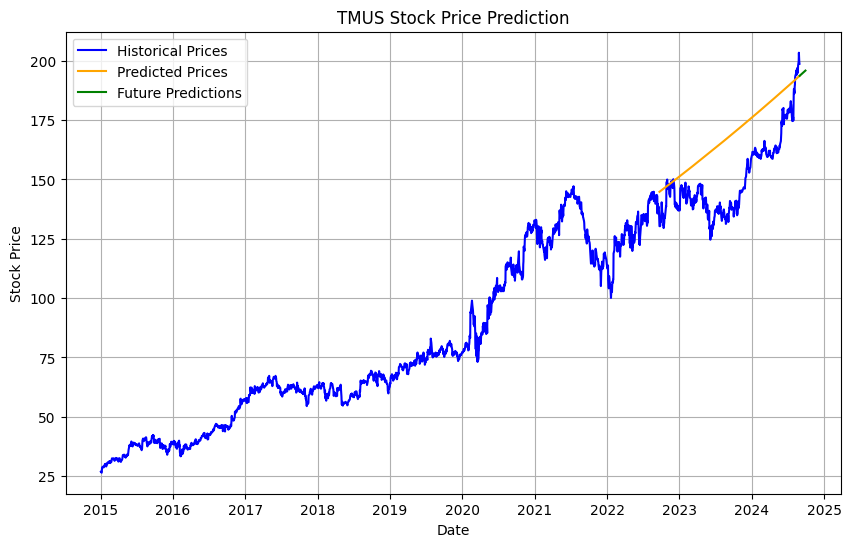

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


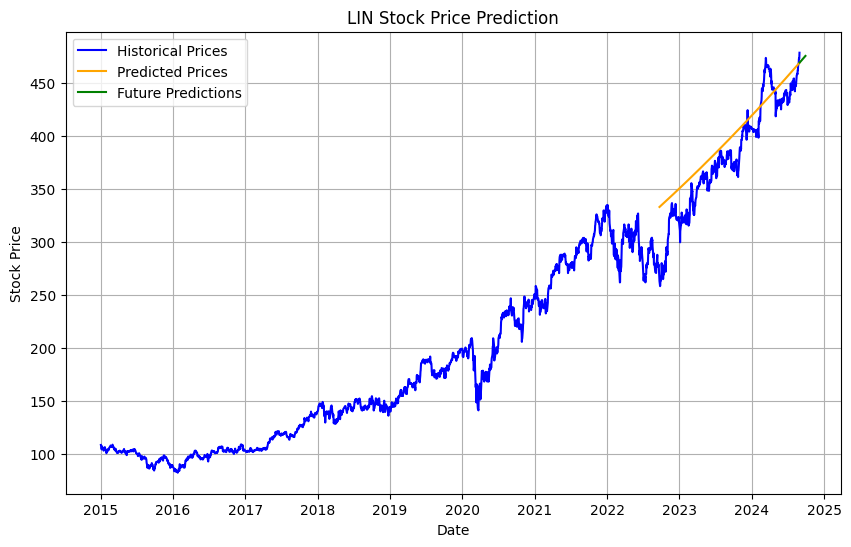

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


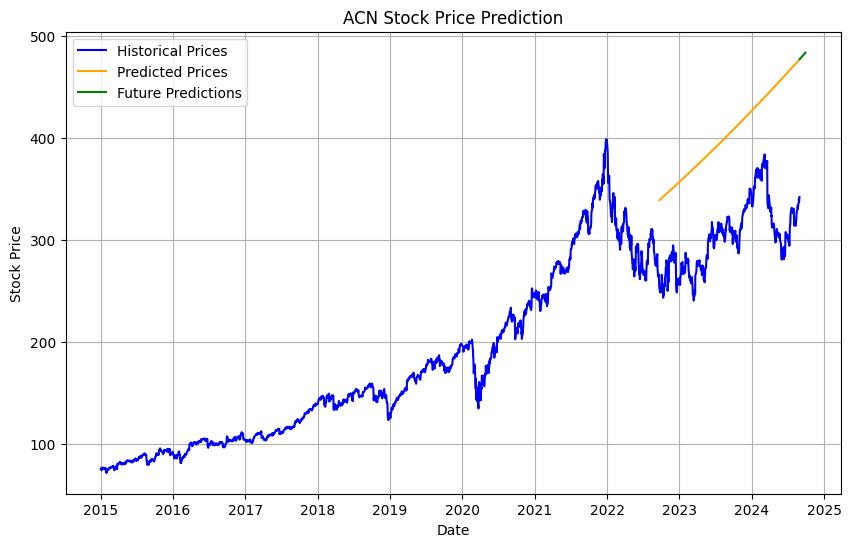

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


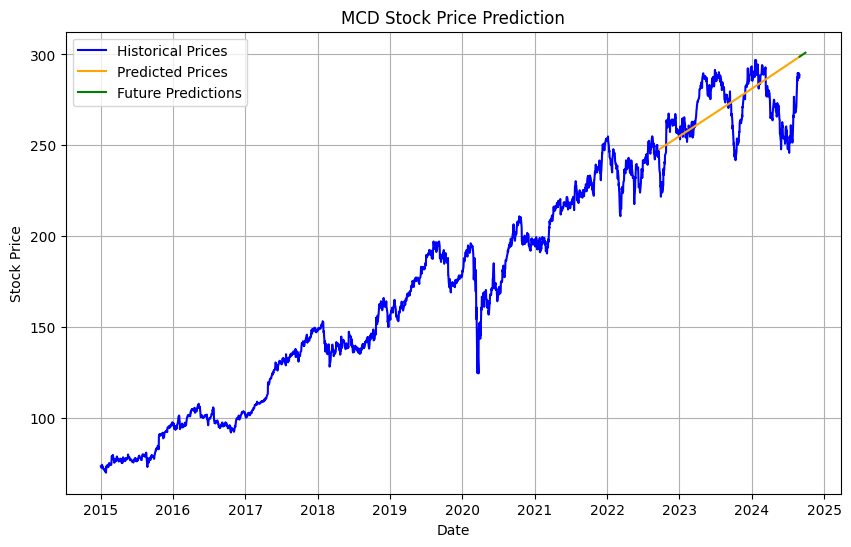

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


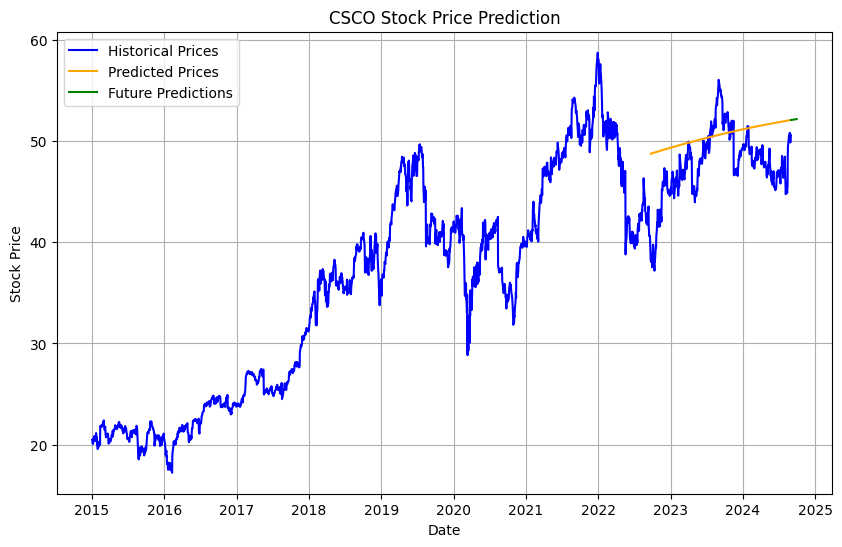

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


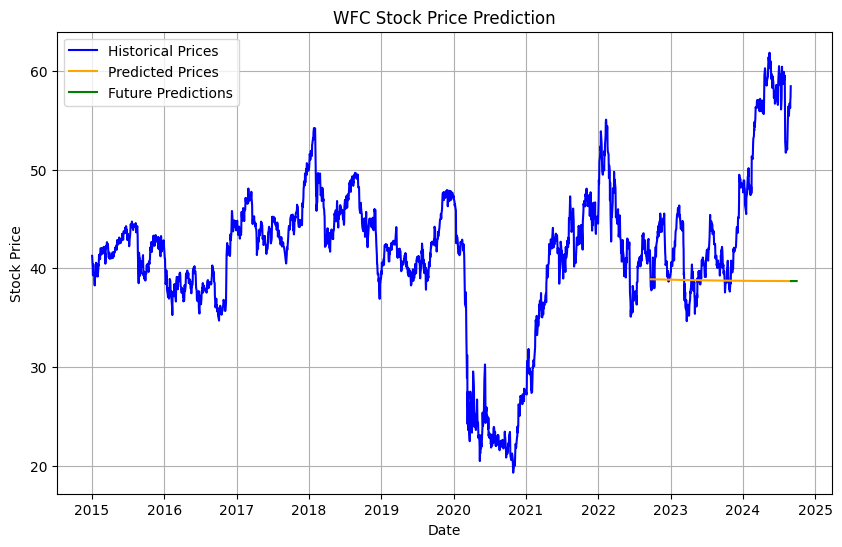

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


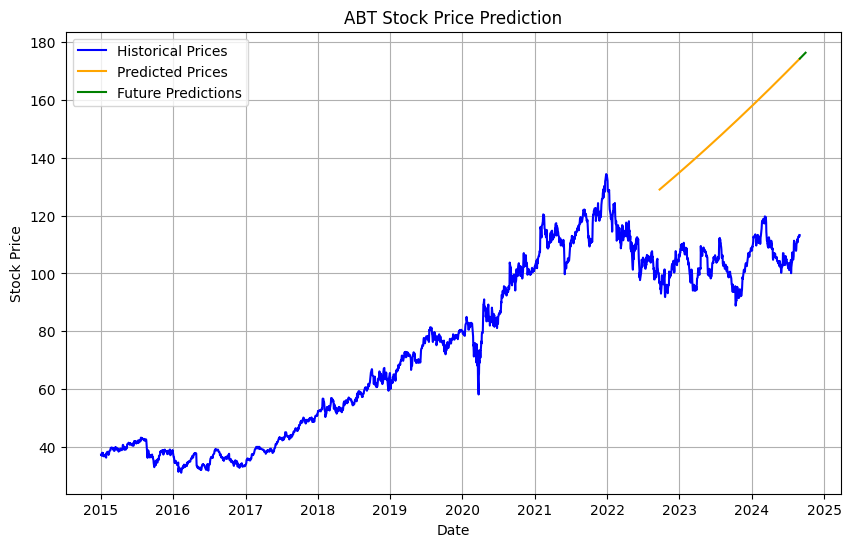

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


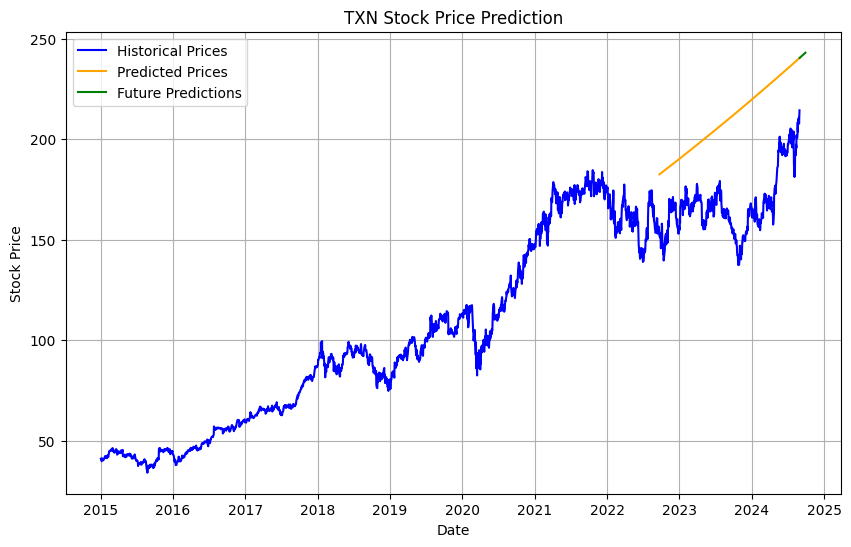

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


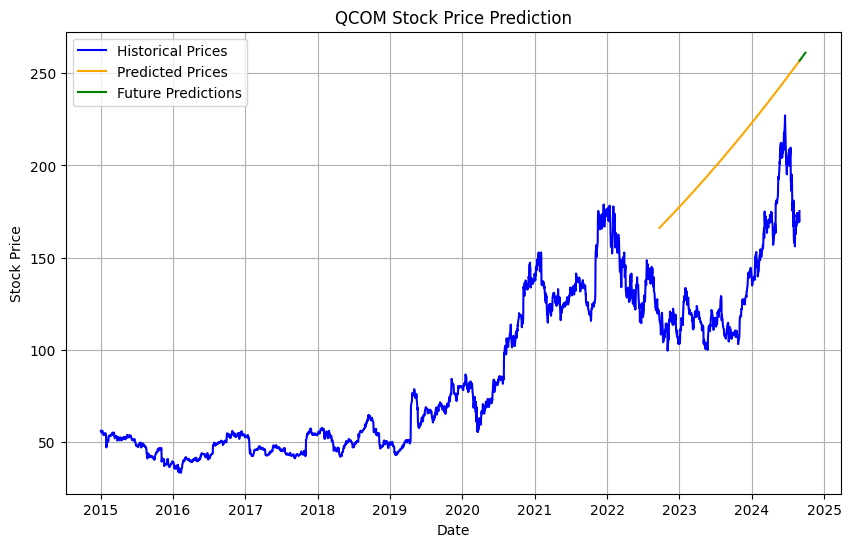

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


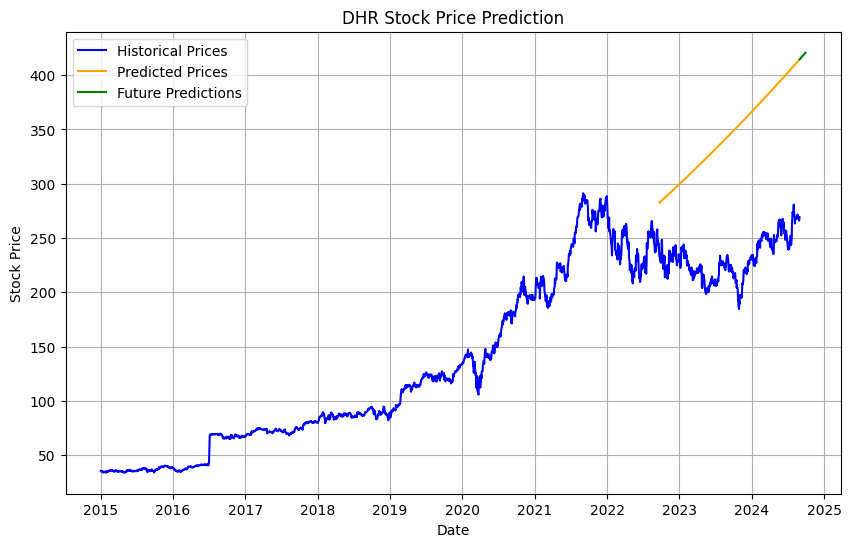

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


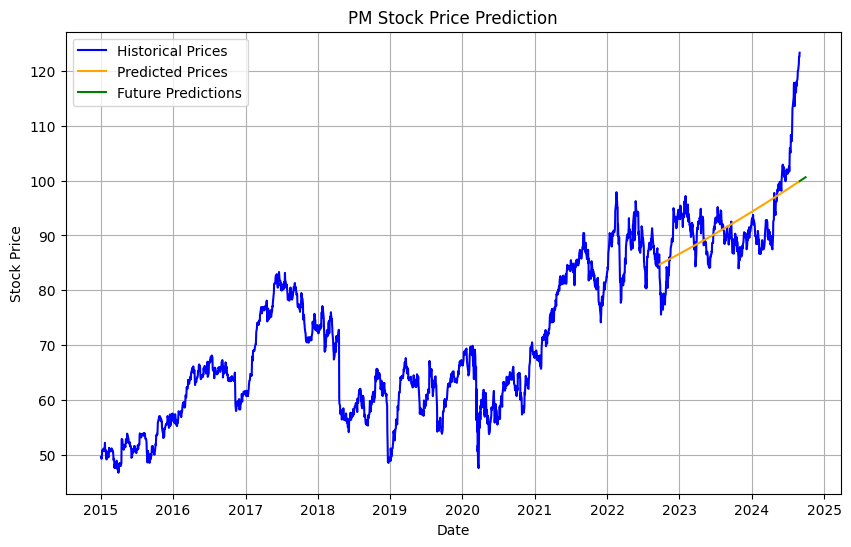

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


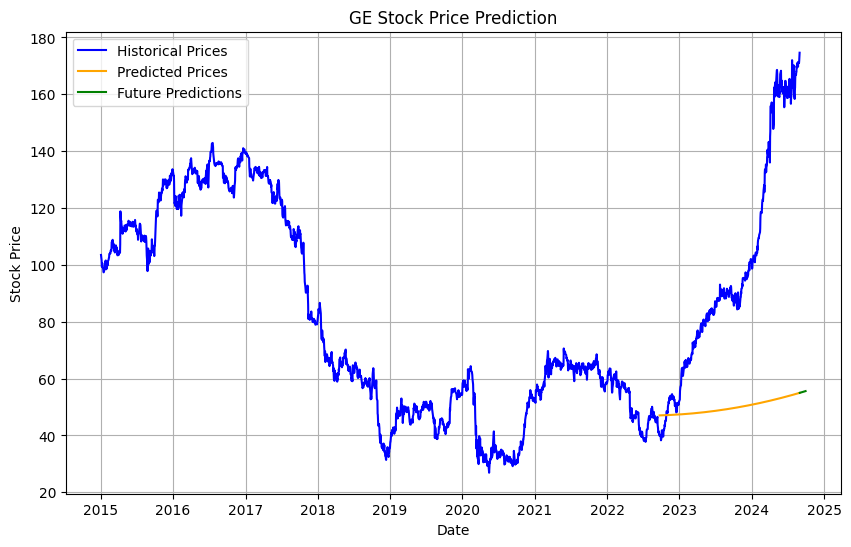

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


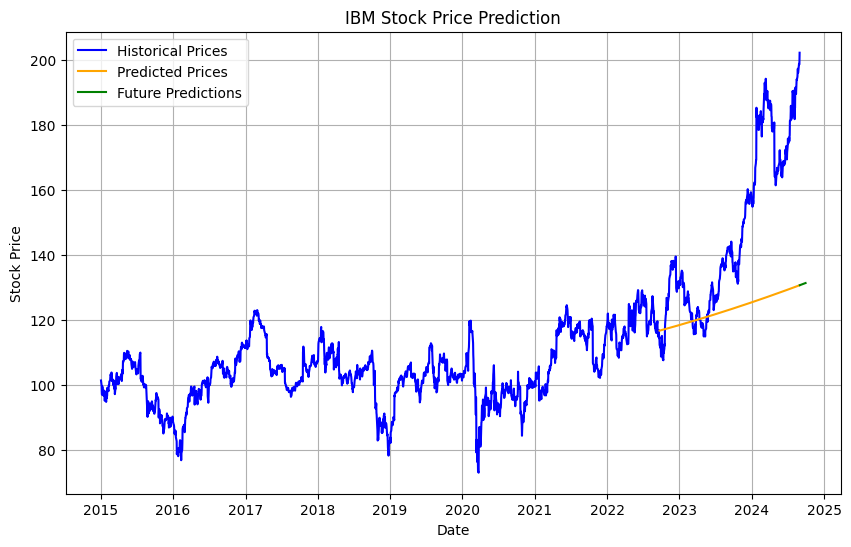

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


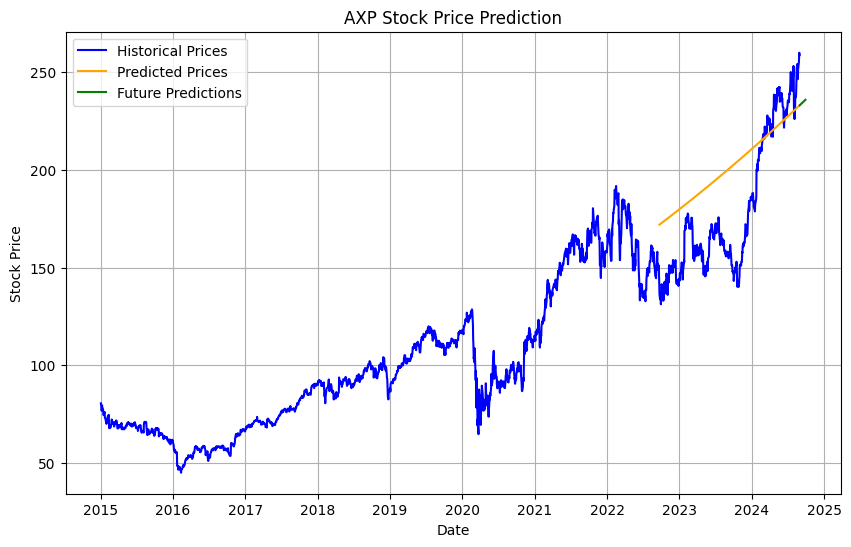

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


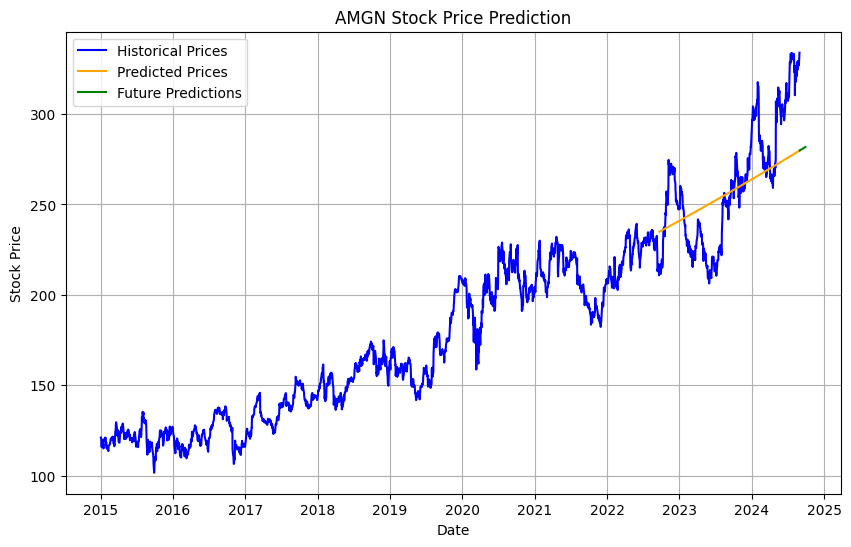

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


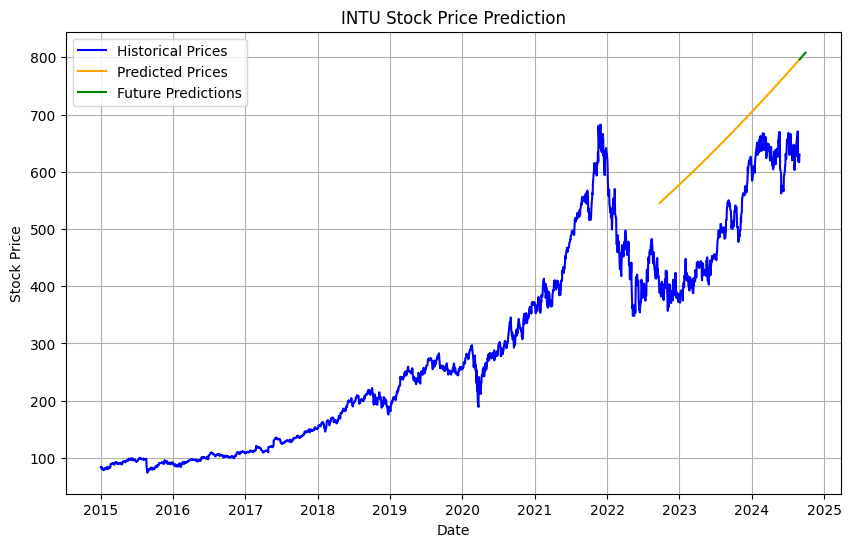

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


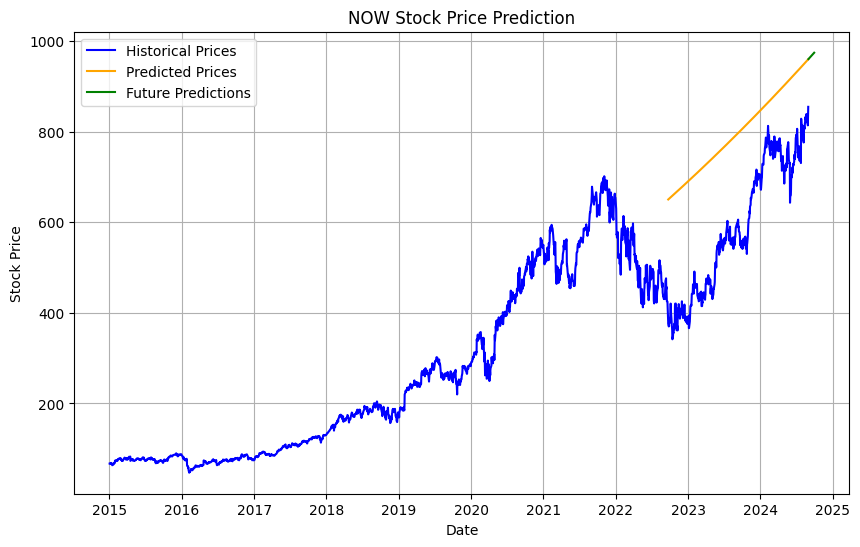

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


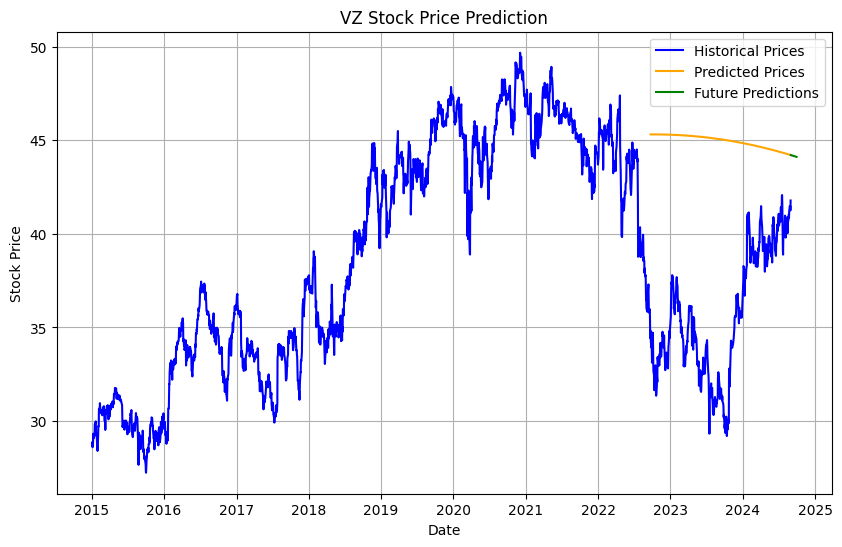

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


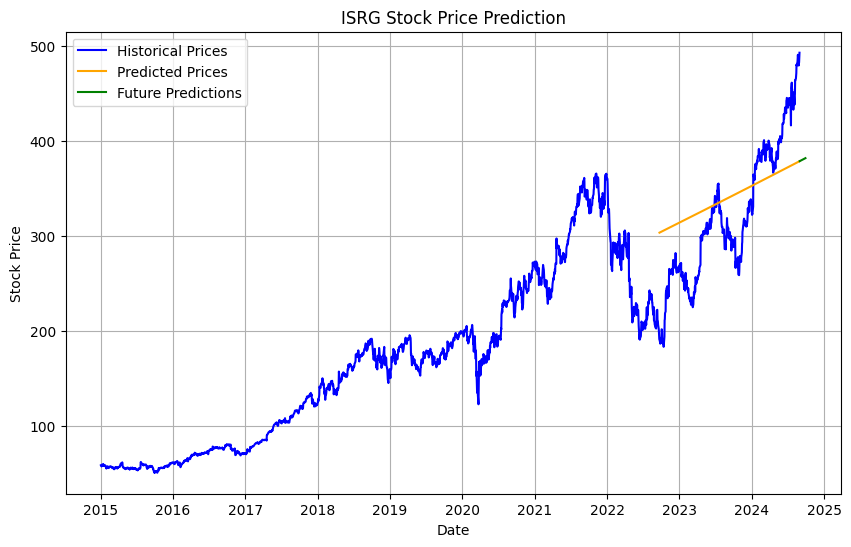

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


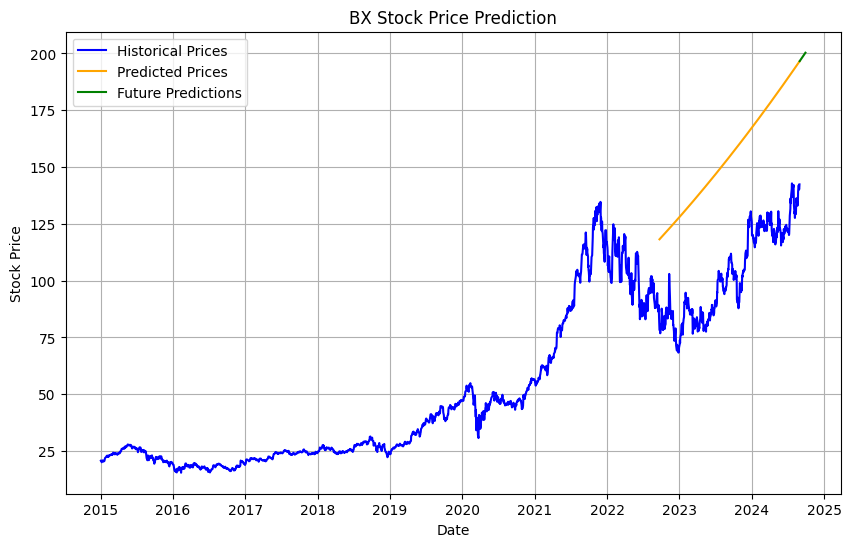

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


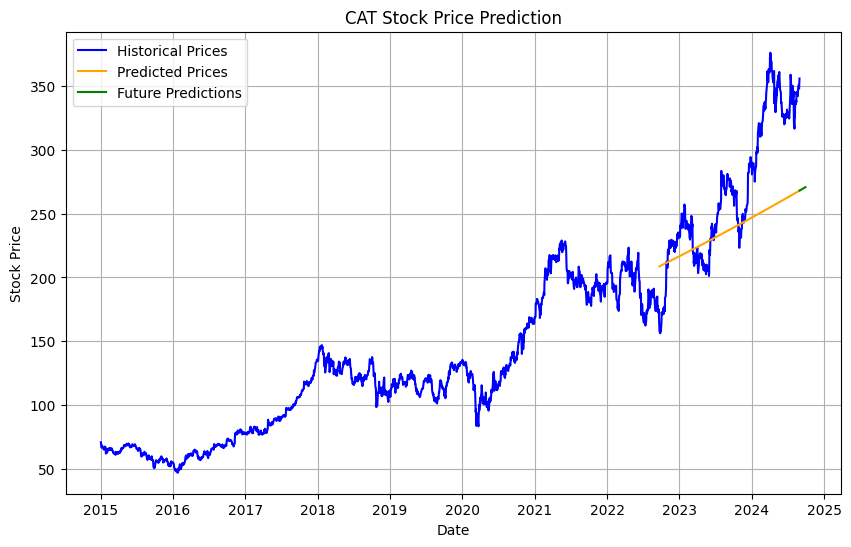

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


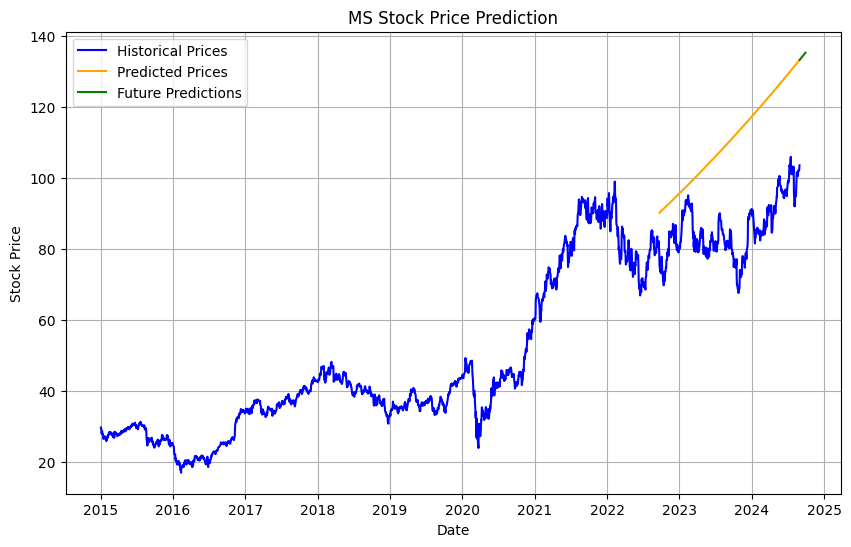

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


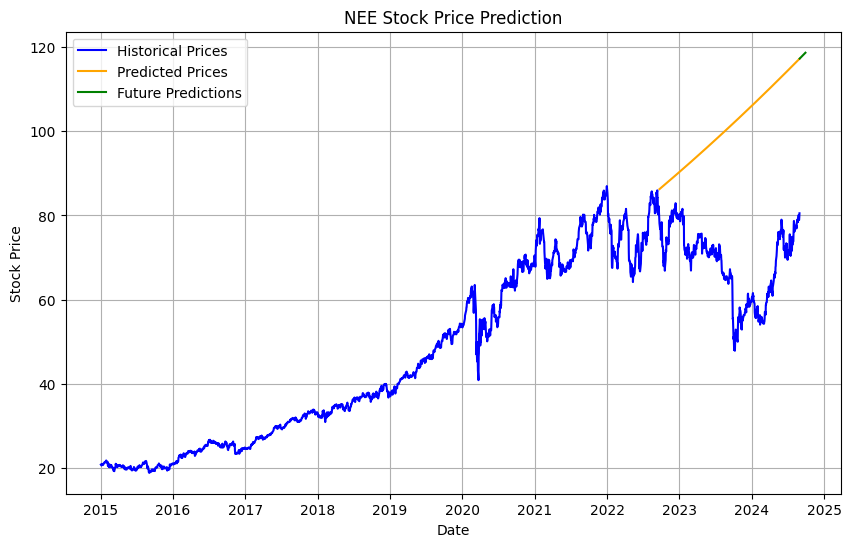

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


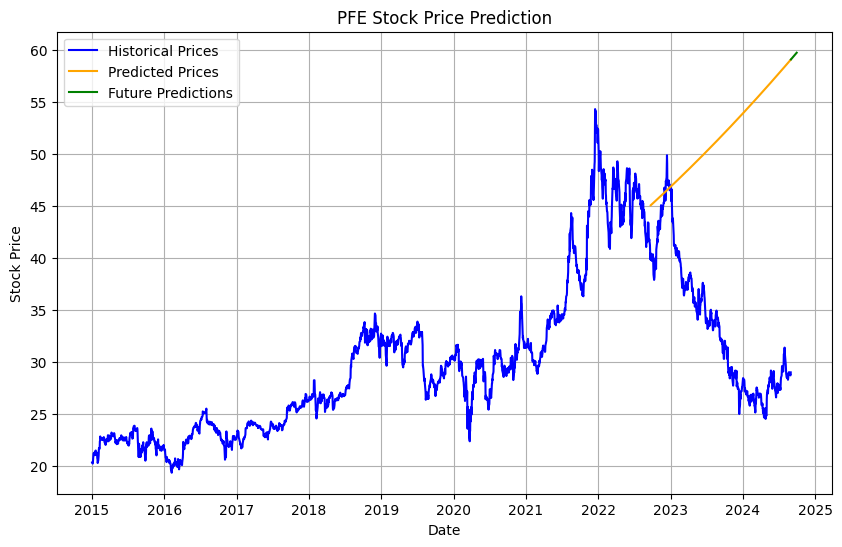

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


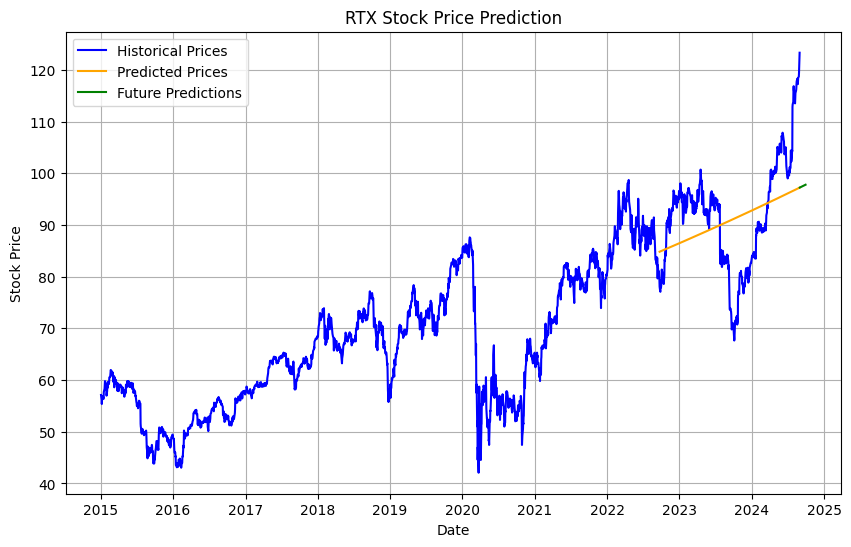

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


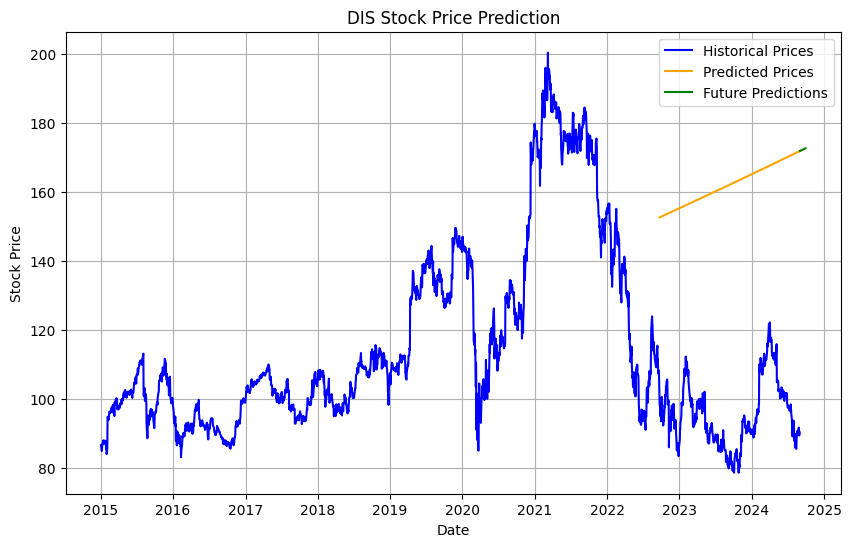

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


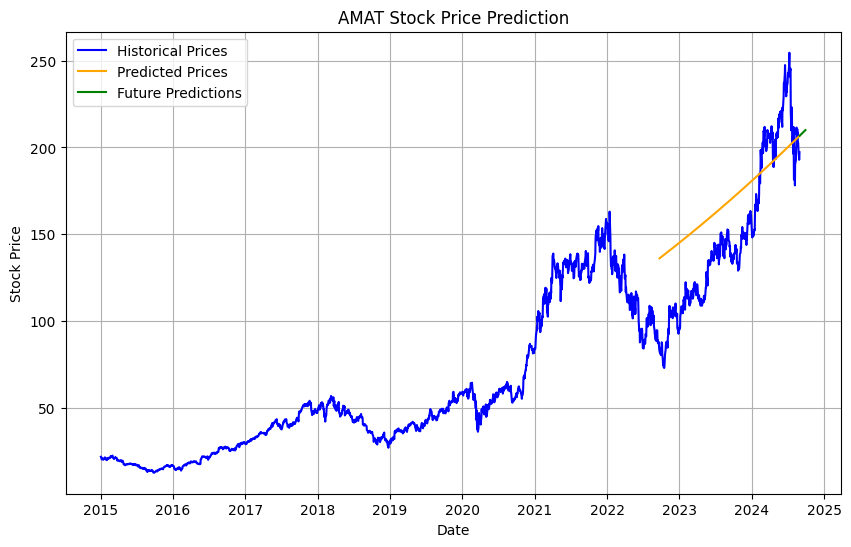

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


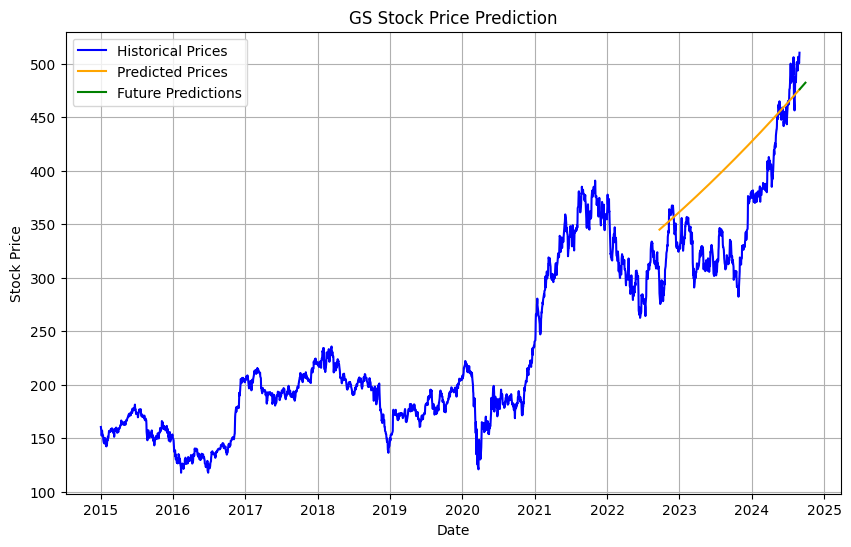

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


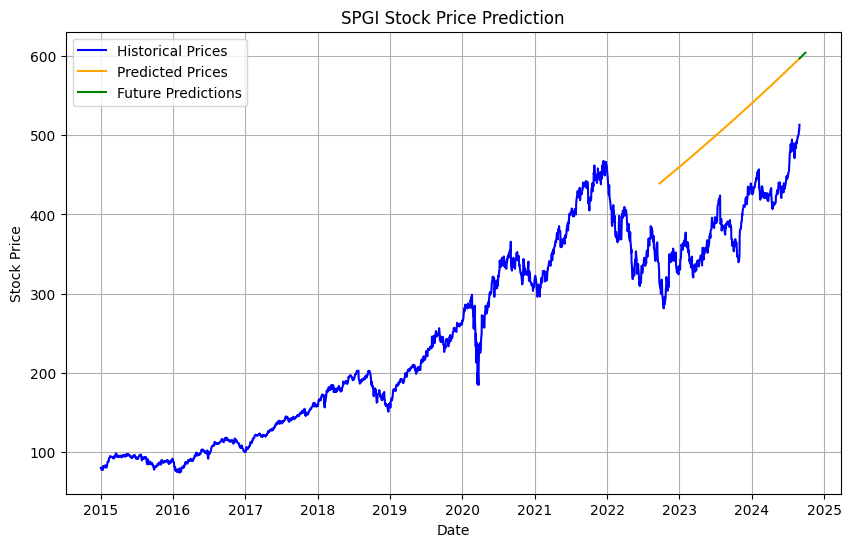

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


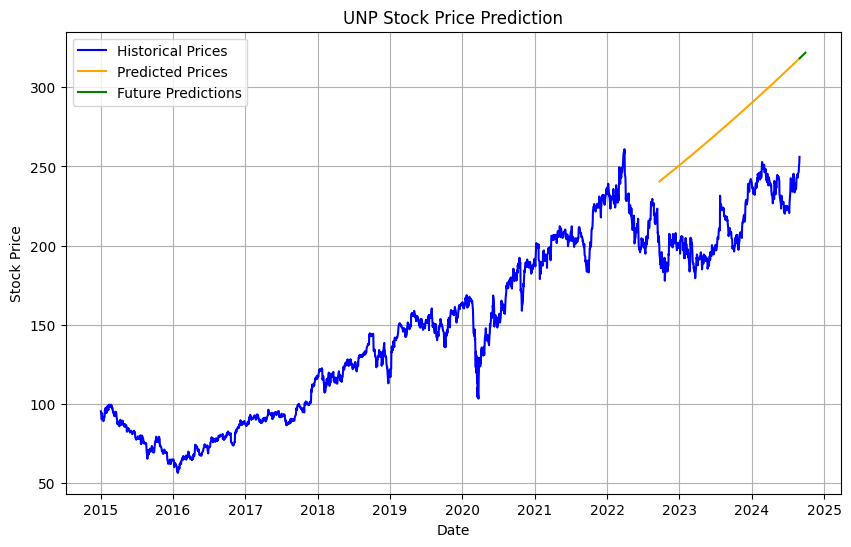

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


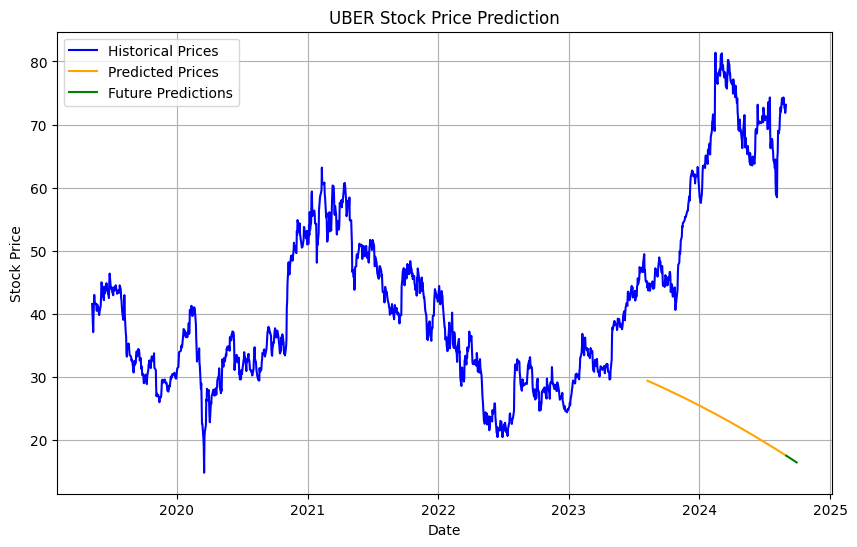

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


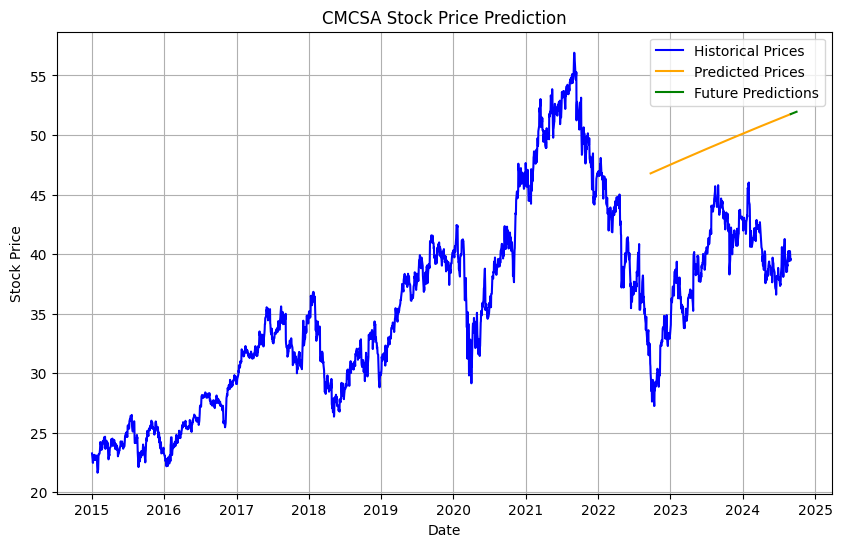

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


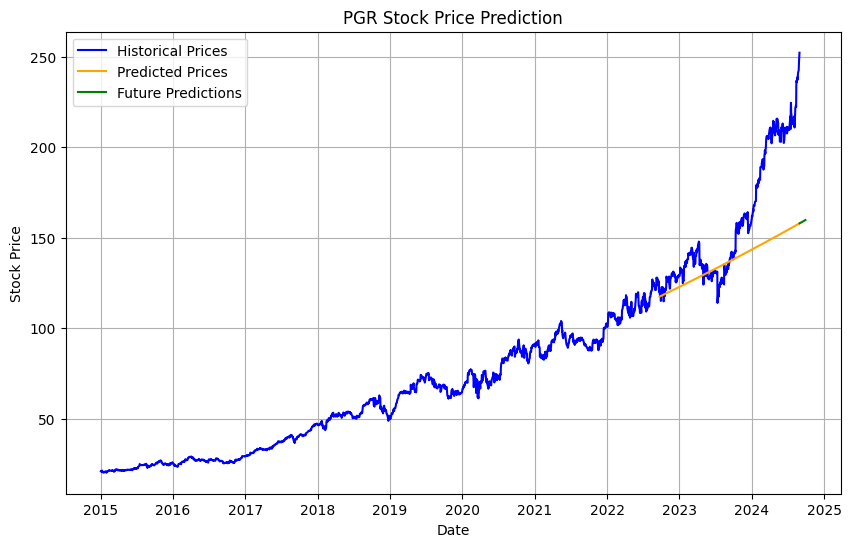

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


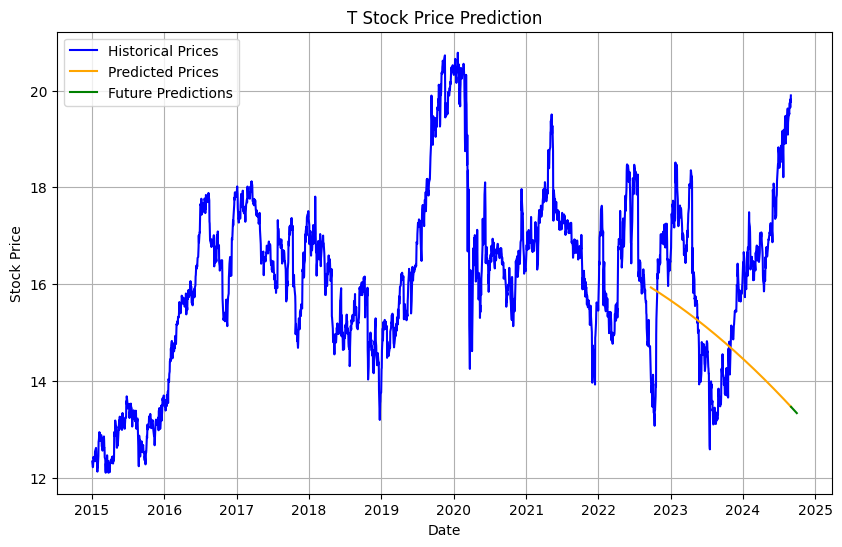

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


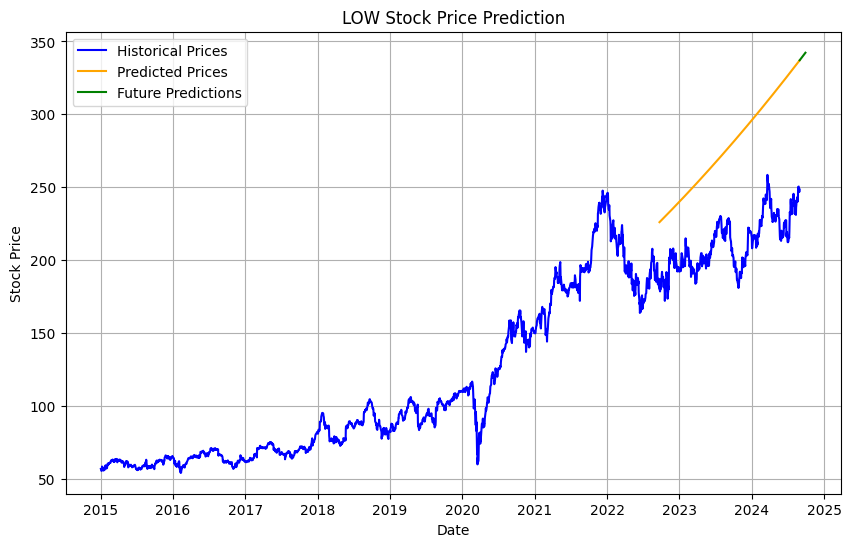

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


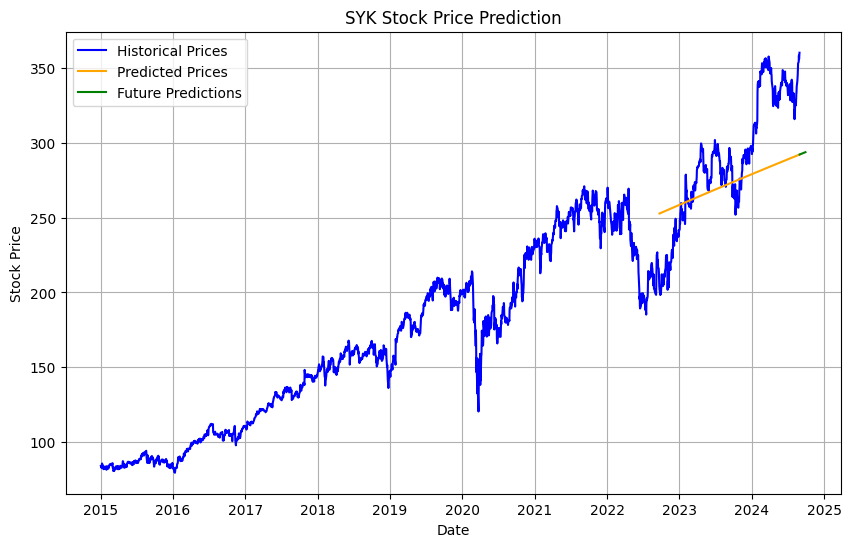

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


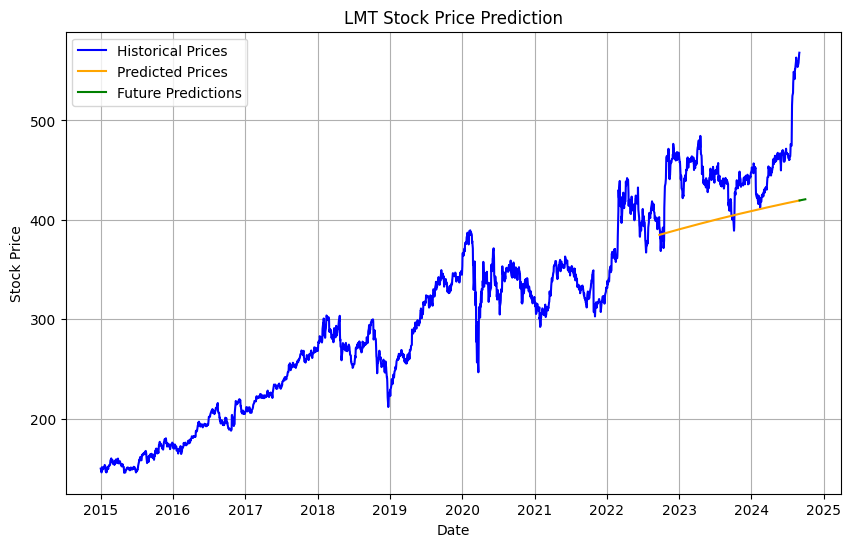

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


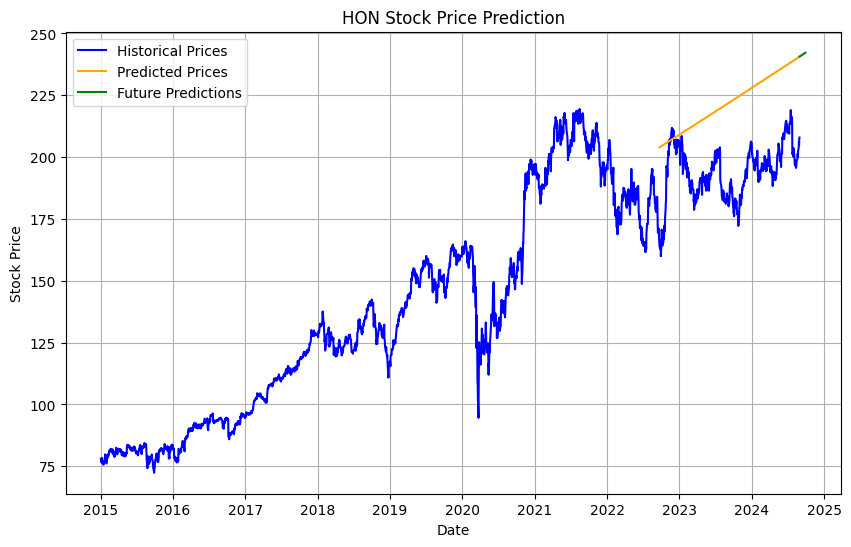

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


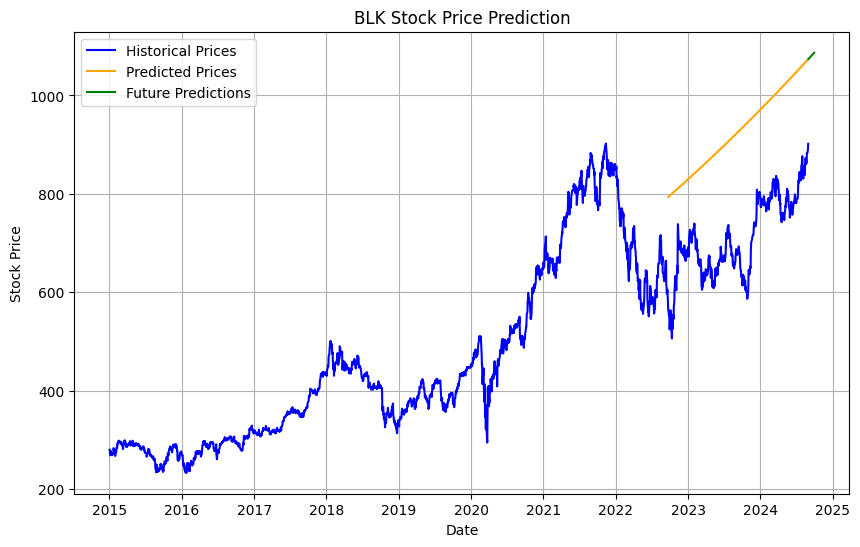

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


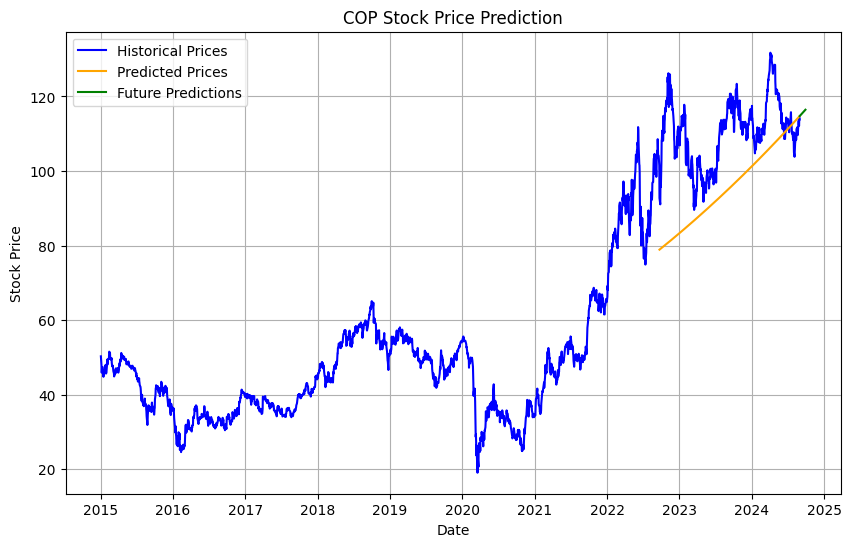

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


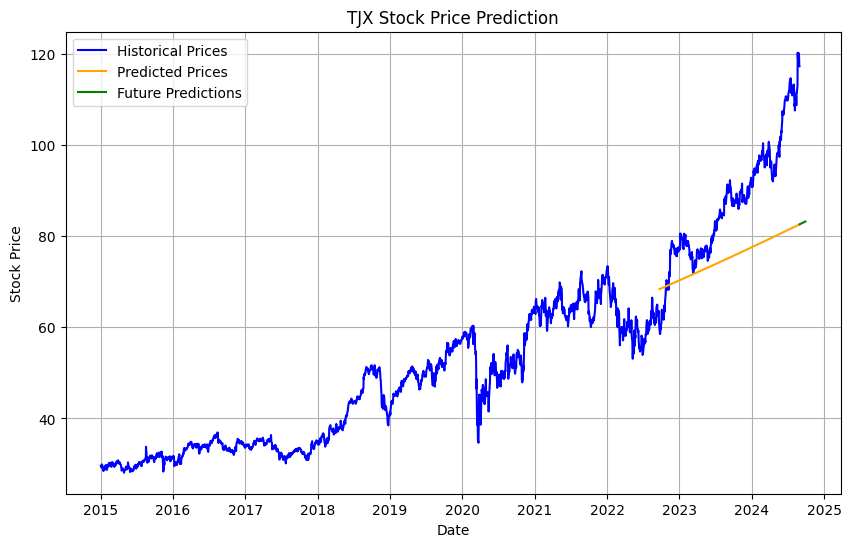

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


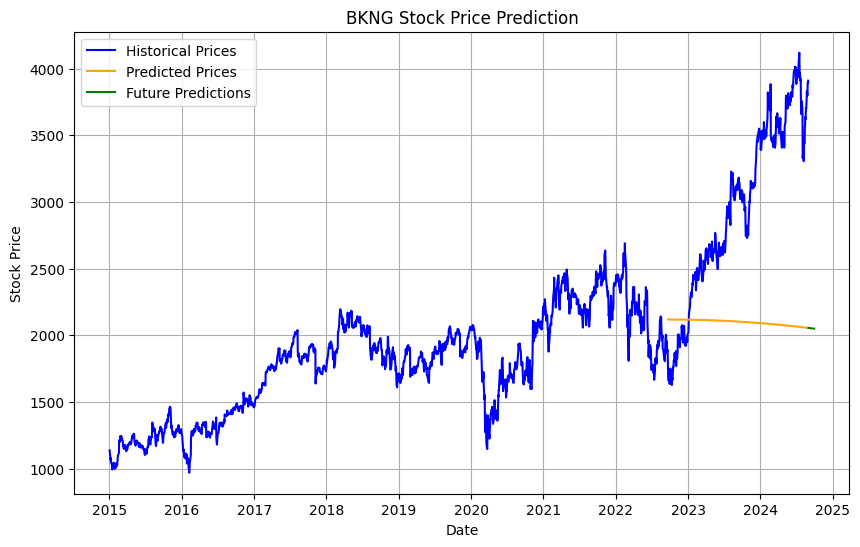

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


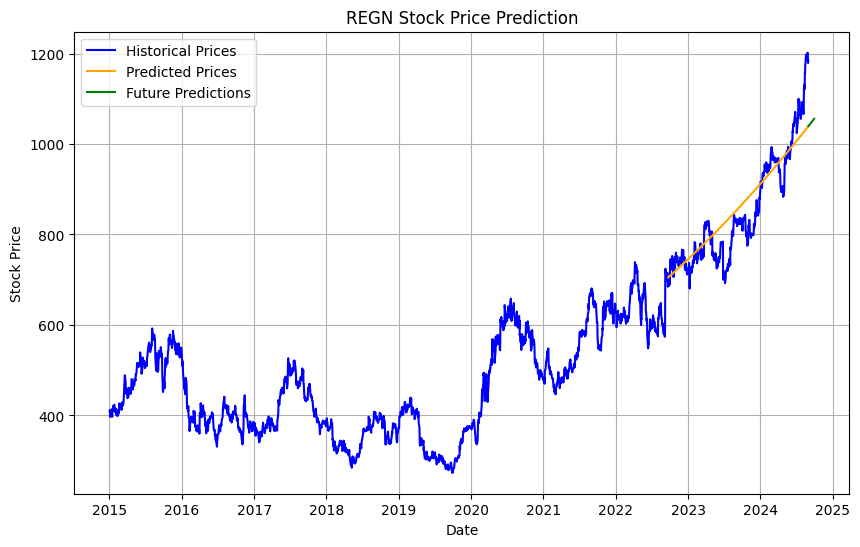

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


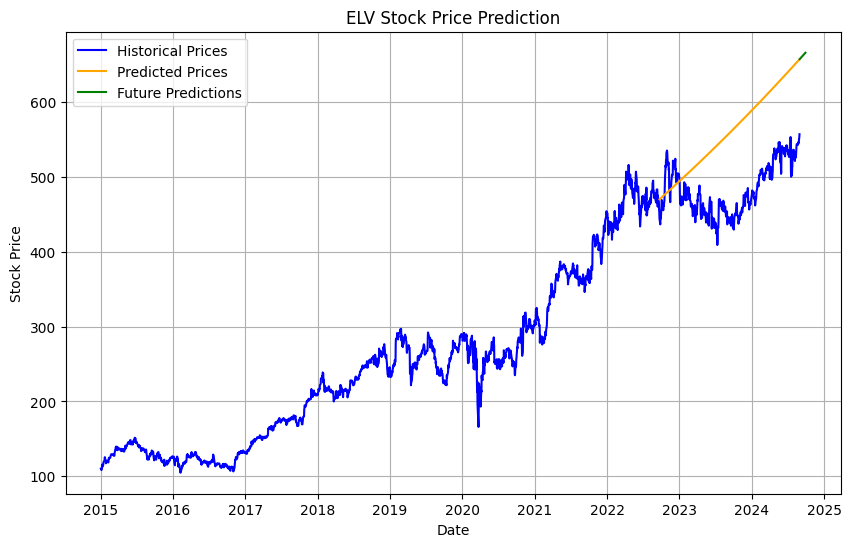

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


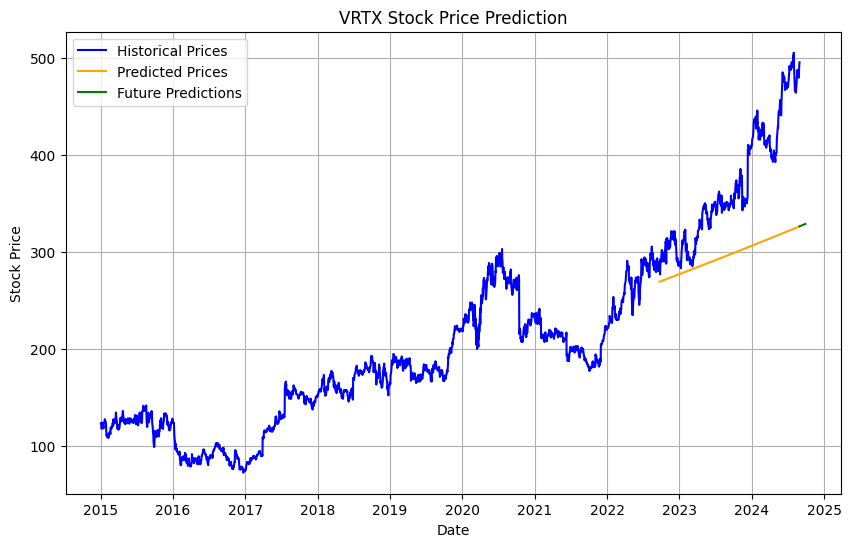

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


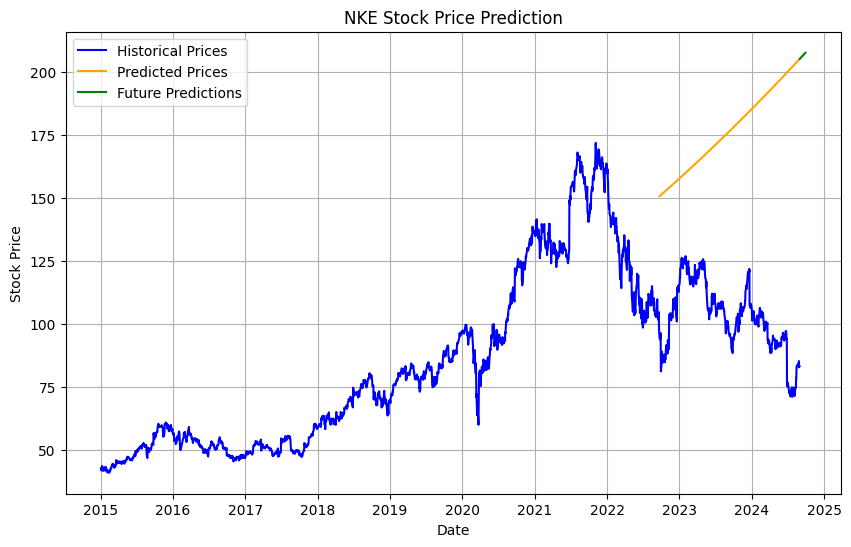

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


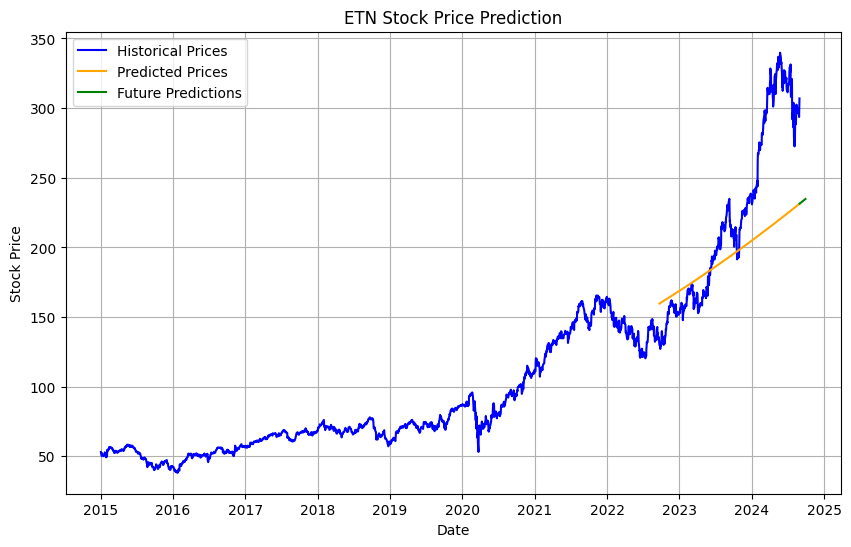

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


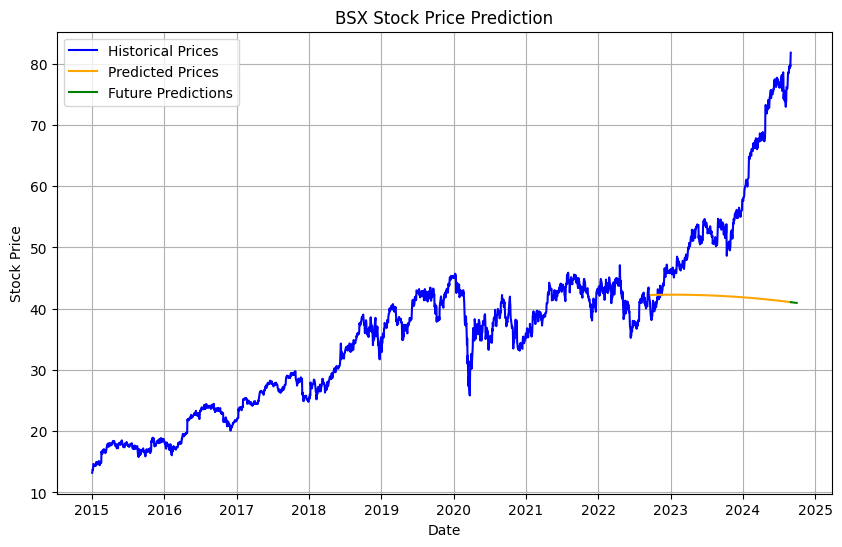

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


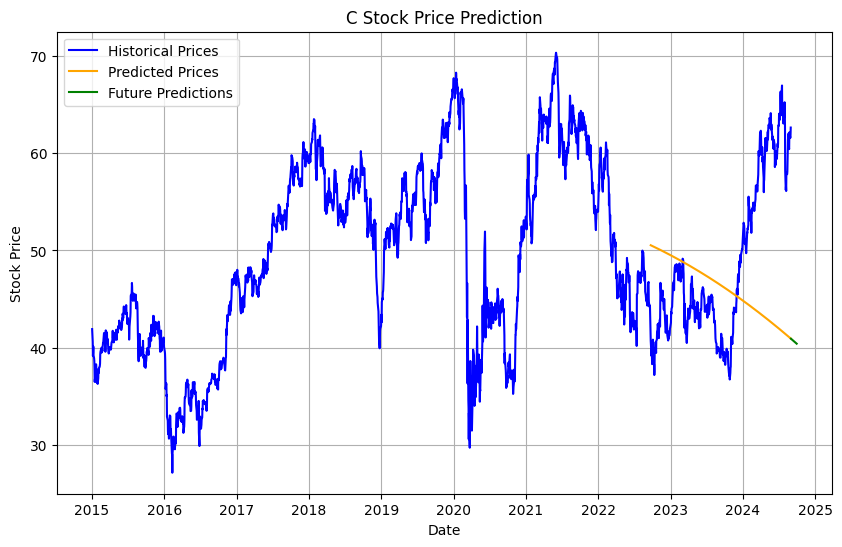

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


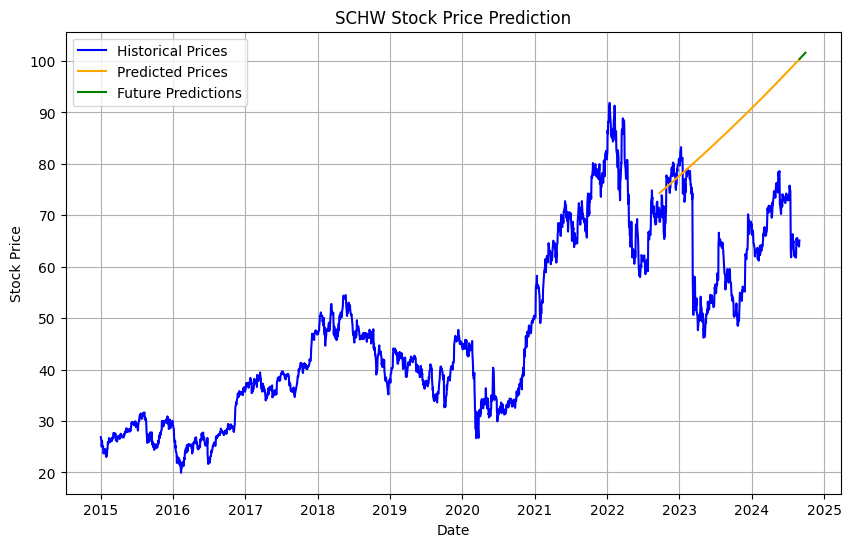

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


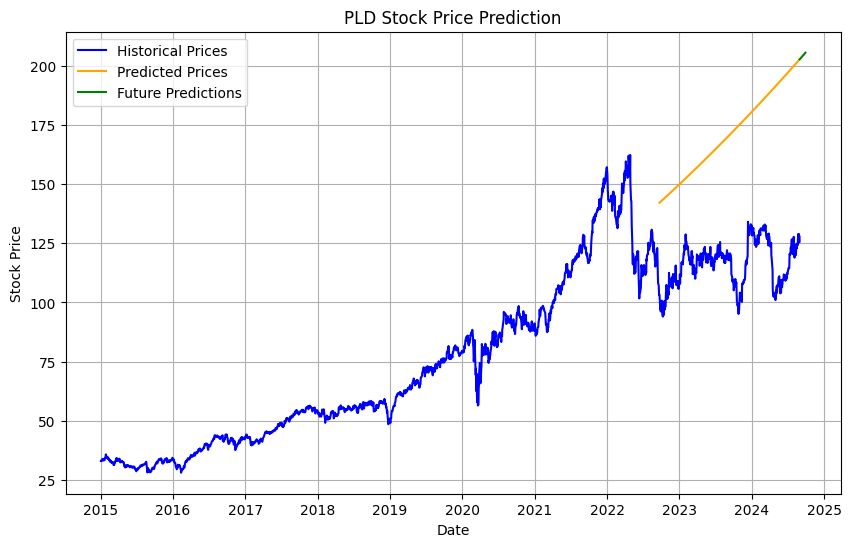

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


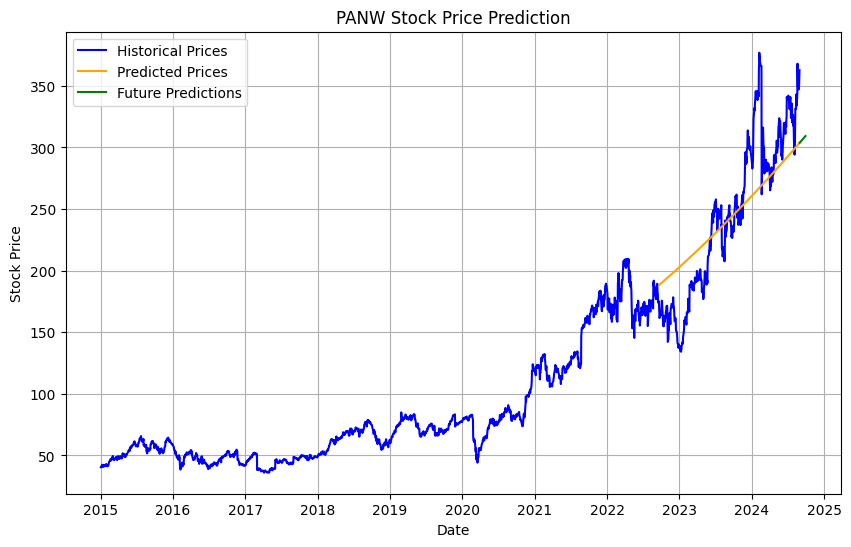

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


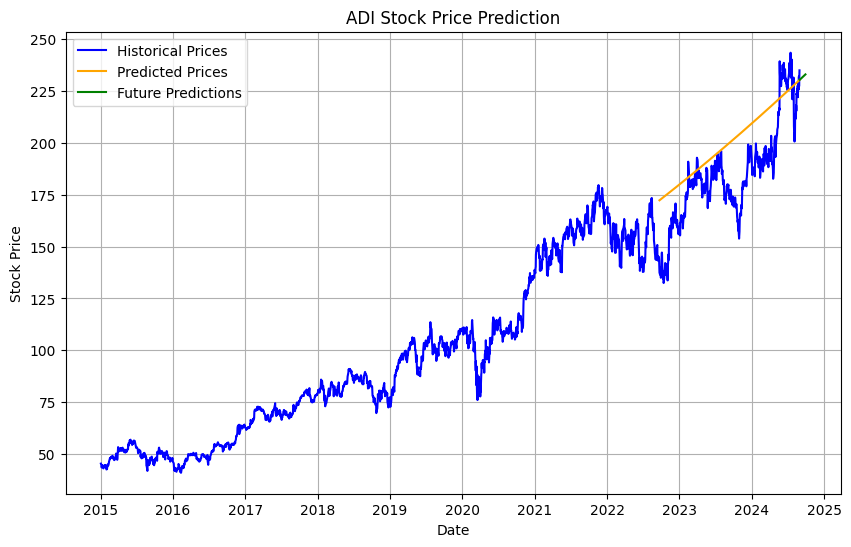

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


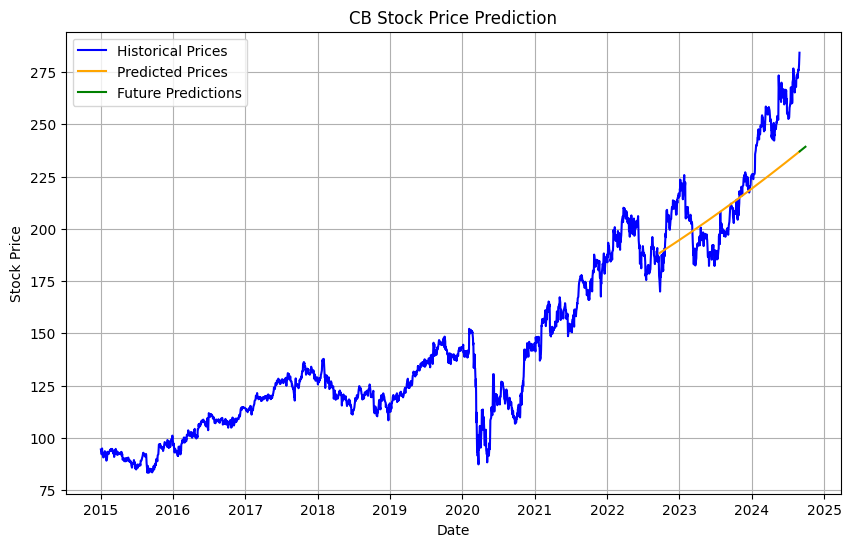

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


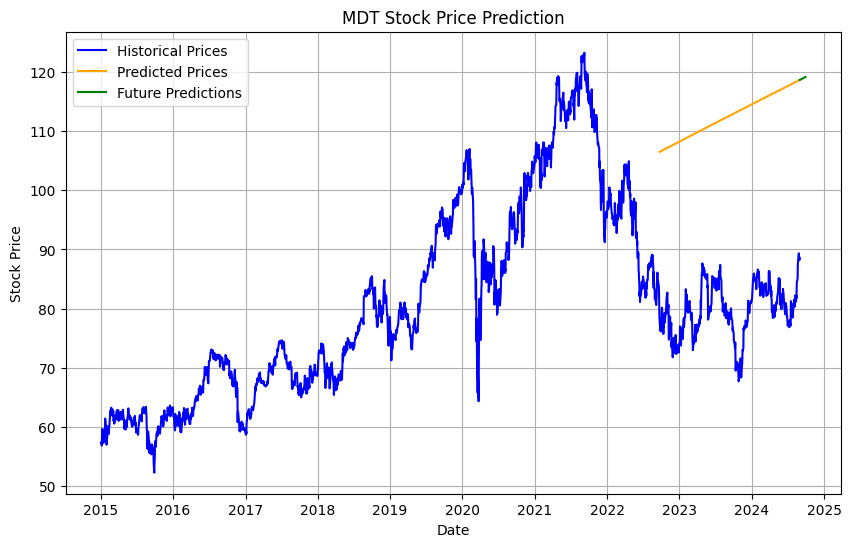

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


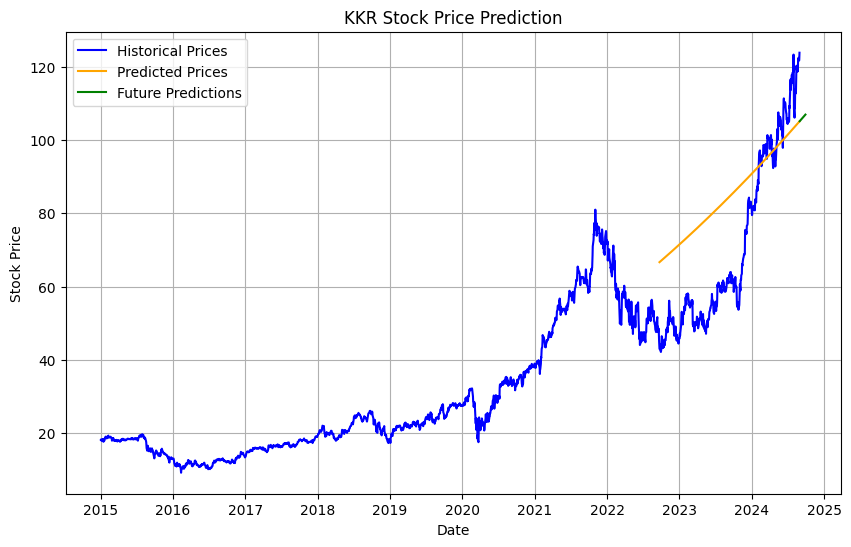

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


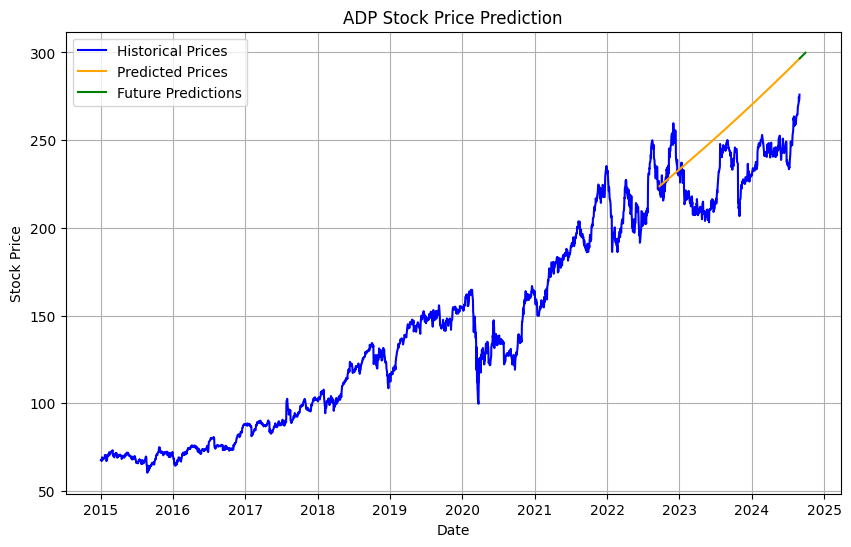

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


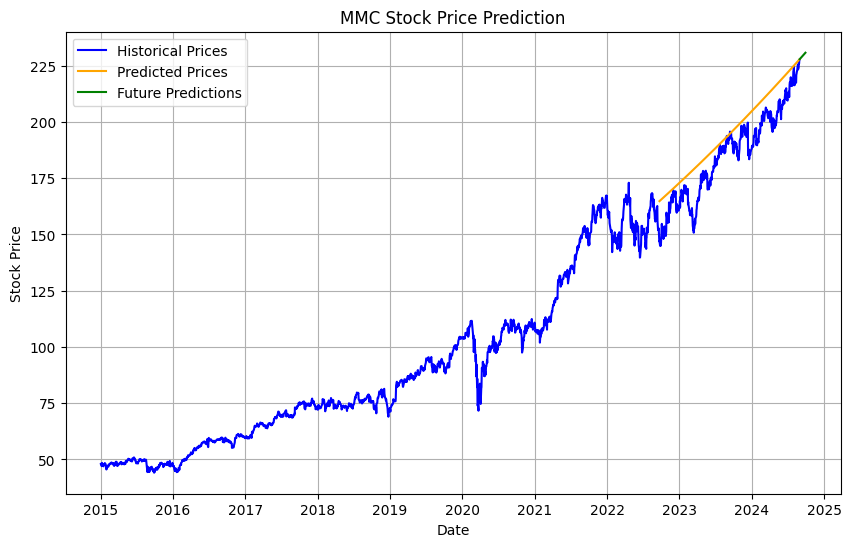

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


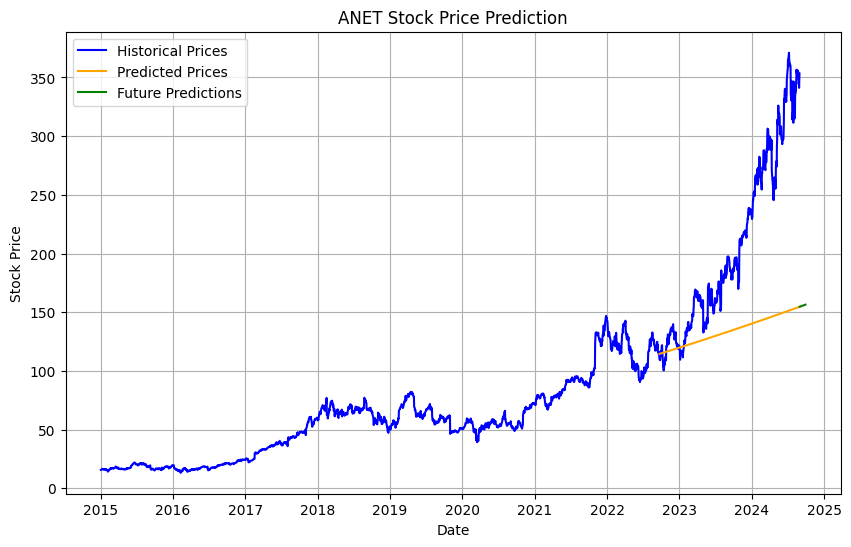

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


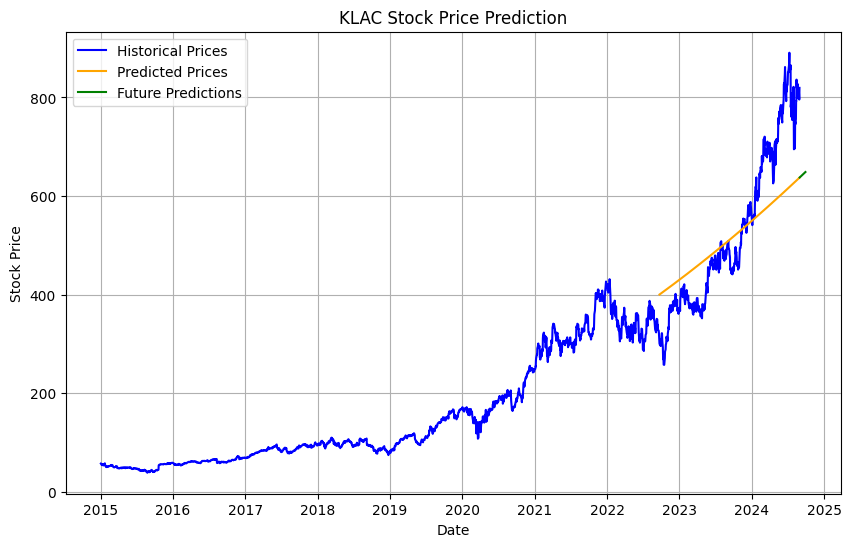

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


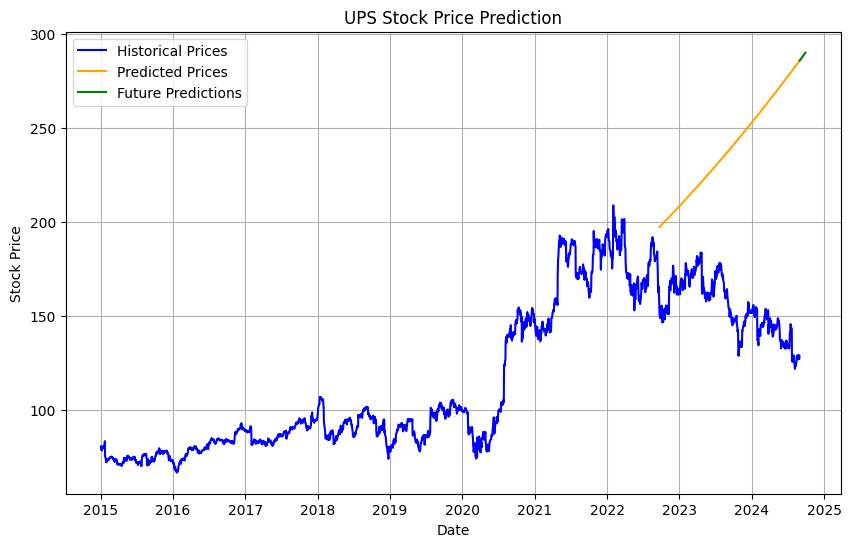

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from datetime import datetime
from sklearn.preprocessing import PolynomialFeatures

# Load the stock data from the previously created CSV file
us_stock_data = pd.read_csv('us_stock_top100_data.csv')

def create_stock_prediction_graph(stock_symbol, degree=3):
    stock = yf.Ticker(stock_symbol)
    hist_data = stock.history(start='2015-01-01')
    
    if hist_data.empty:
        return
    
    hist_data['DateOrdinal'] = hist_data.index.map(datetime.toordinal)
    
    X = hist_data[['DateOrdinal']]
    y = hist_data['Close']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.transform(X_test)
    
    model = LinearRegression()
    model.fit(X_train_poly, y_train)
    
    y_pred = model.predict(X_test_poly)
    
    mse = mean_squared_error(y_test, y_pred)
    
    future_days = 30
    last_date = hist_data.index[-1]
    future_dates = pd.date_range(start=last_date, periods=future_days + 1, freq='D')[1:]
    future_dates_ordinal = future_dates.map(datetime.toordinal)
    future_dates_poly = poly.transform(future_dates_ordinal.values.reshape(-1, 1))
    
    future_prices = model.predict(future_dates_poly)
    
    plt.figure(figsize=(10, 6))
    plt.plot(hist_data.index, hist_data['Close'], label='Historical Prices', color='blue')
    plt.plot(X_test.index, y_pred, label='Predicted Prices', color='orange')
    plt.plot(future_dates, future_prices, label='Future Predictions', color='green')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.title(f'{stock_symbol} Stock Price Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

for symbol in us_stock_data['Symbol']:
    create_stock_prediction_graph(symbol)

#### 2. Predicting stock price for 1 year 

##### a. Using Linear Regression

Mean Squared Error for AAPL: 422.7633142088527


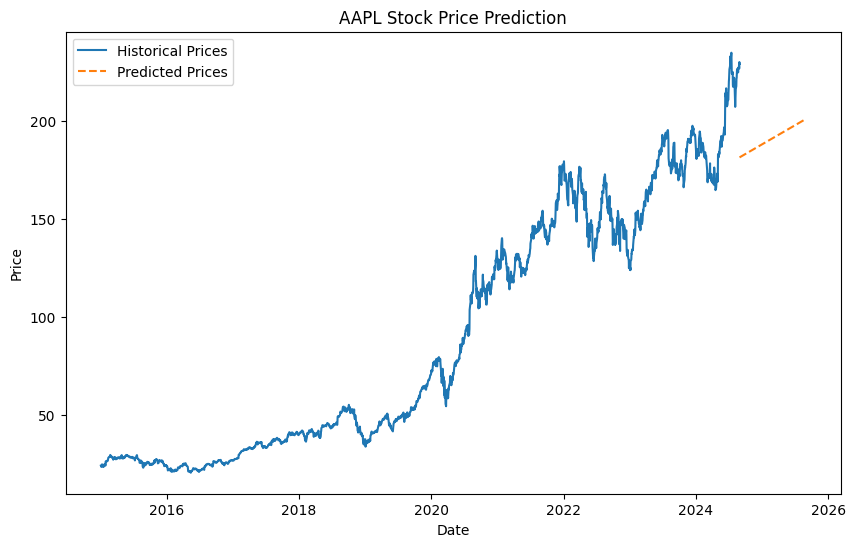

Mean Squared Error for MSFT: 3106.237705026146


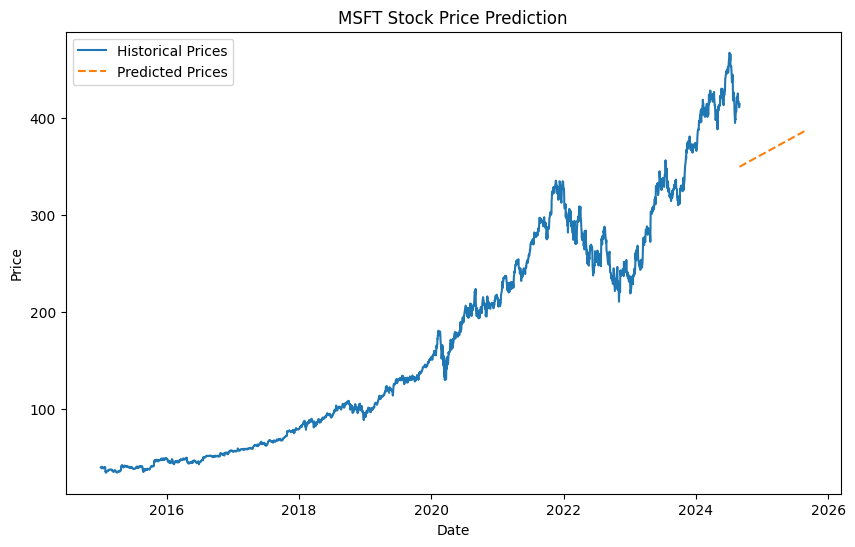

Mean Squared Error for NVDA: 2148.768897891267


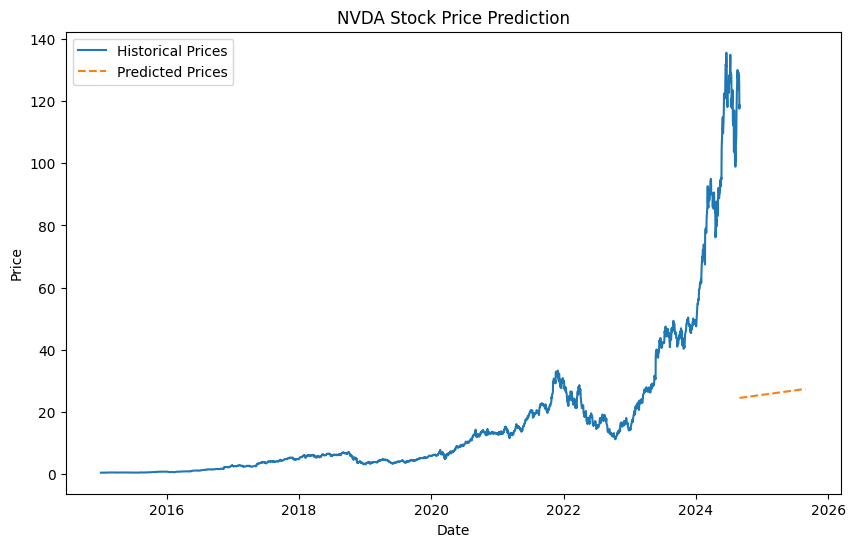

Mean Squared Error for GOOG: 447.63228466962795


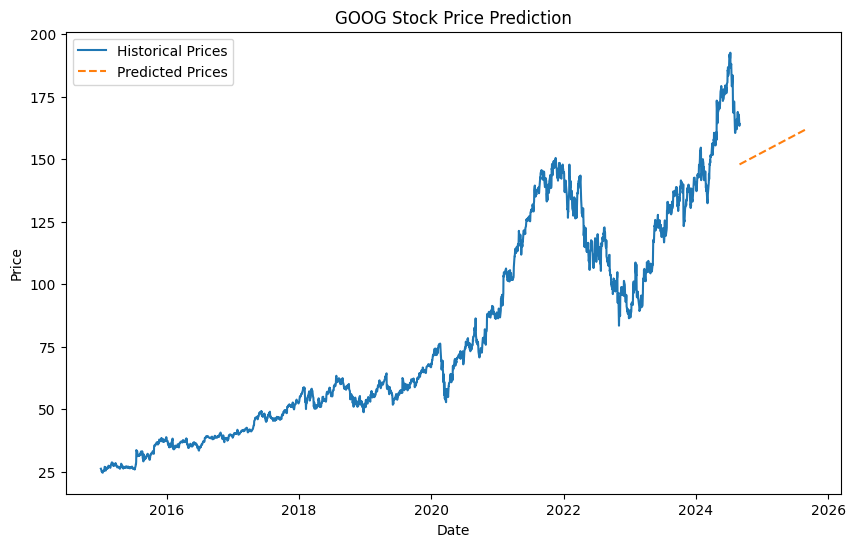

Mean Squared Error for GOOGL: 435.9947391502697


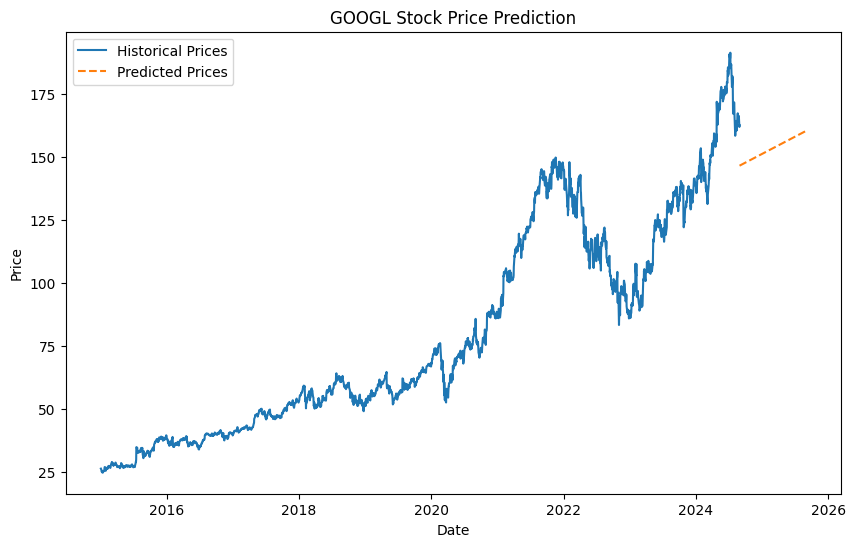

Mean Squared Error for AMZN: 3331.084940402045


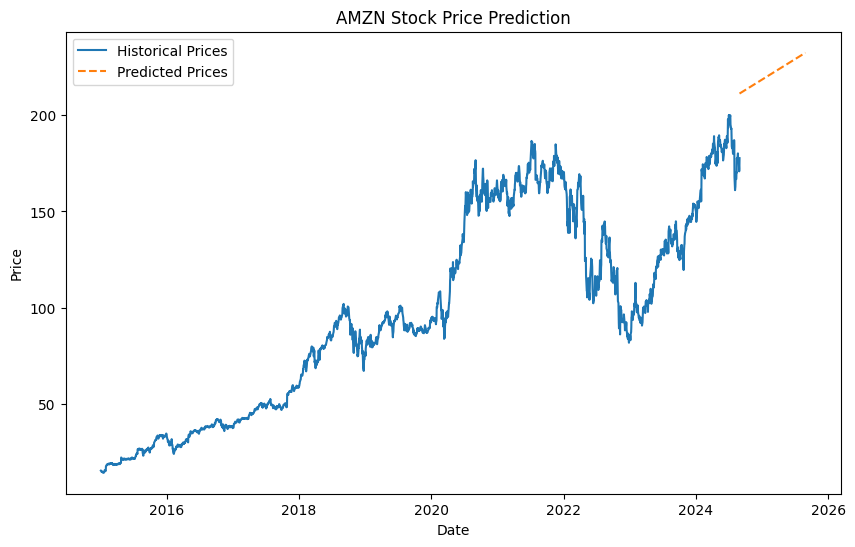

Mean Squared Error for META: 14869.80562113506


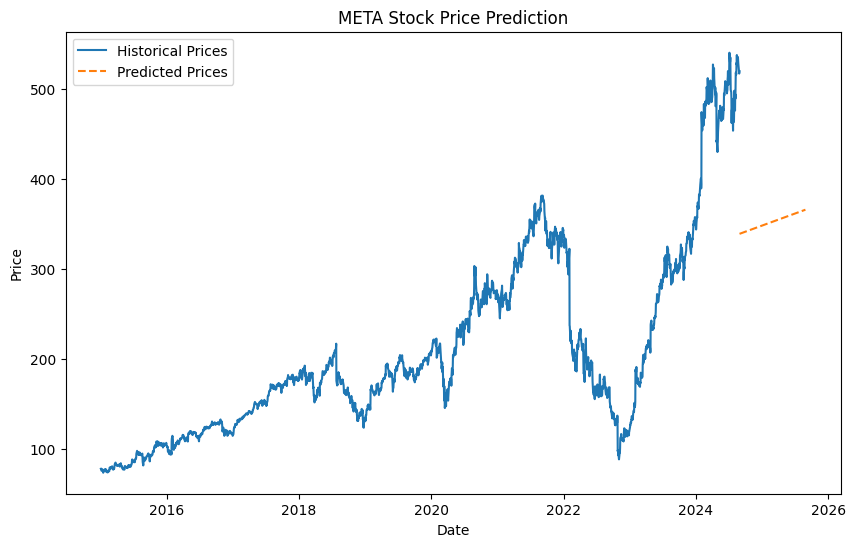

Mean Squared Error for LLY: 118906.82356763777


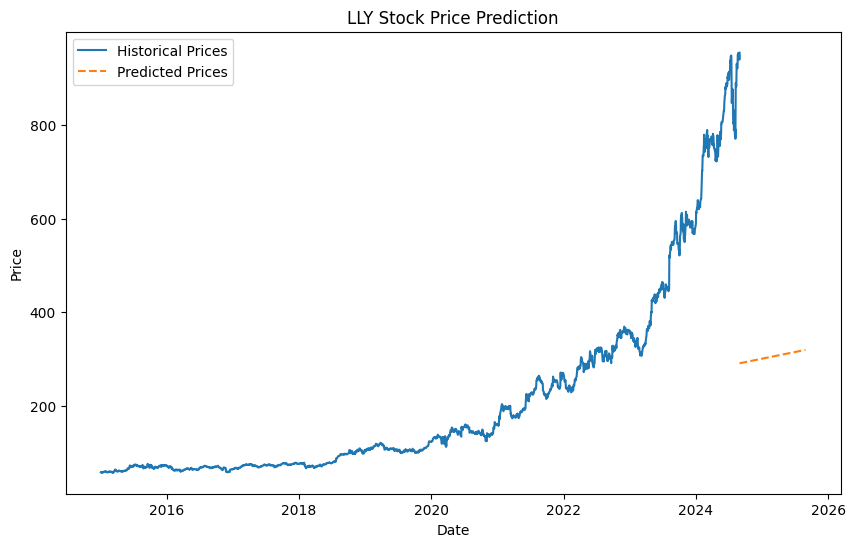

Mean Squared Error for AVGO: 2758.41114074616


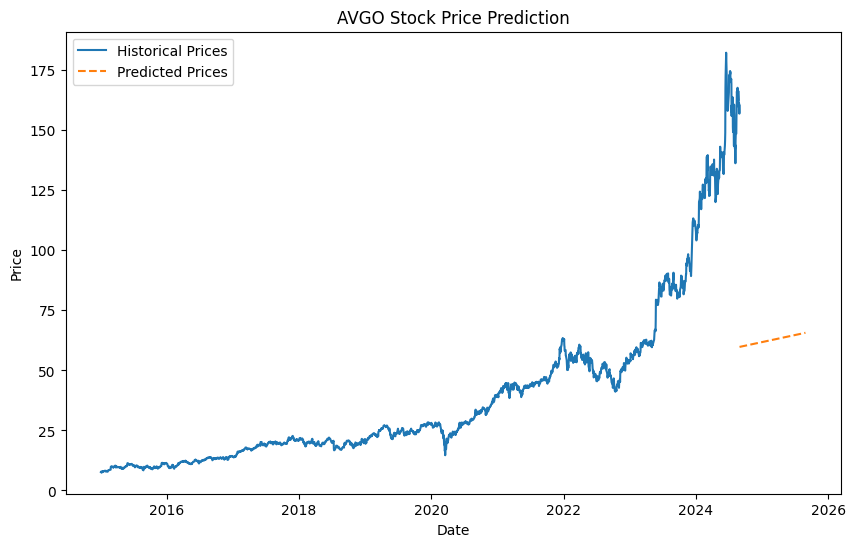

Mean Squared Error for TSLA: 6050.882744684332


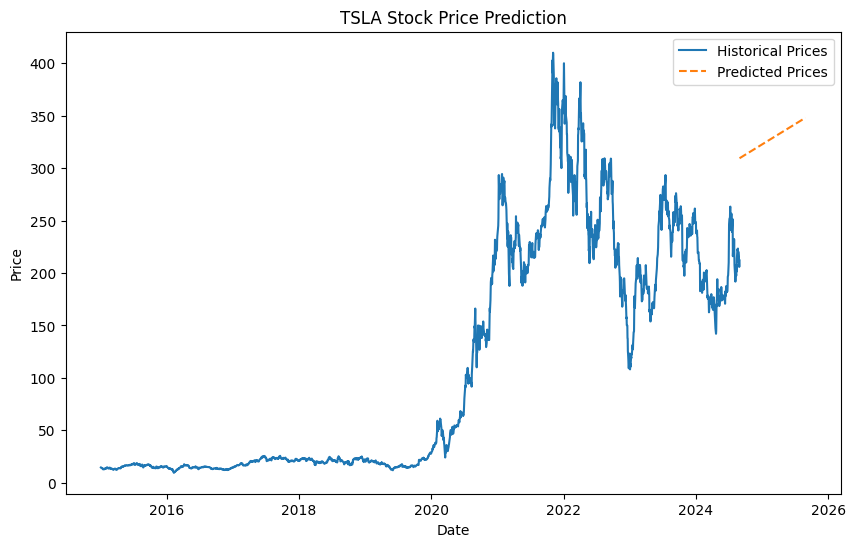

Mean Squared Error for JPM: 597.4640312854206


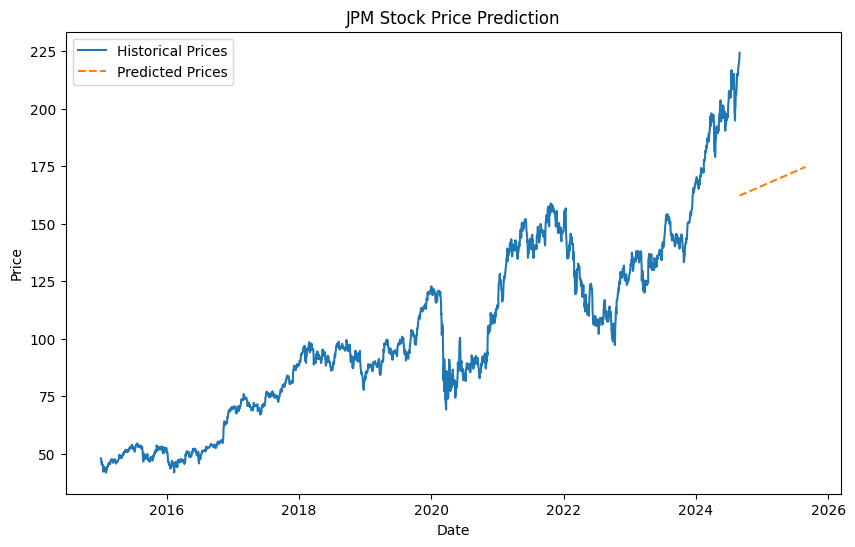

Mean Squared Error for WMT: 36.0590826958328


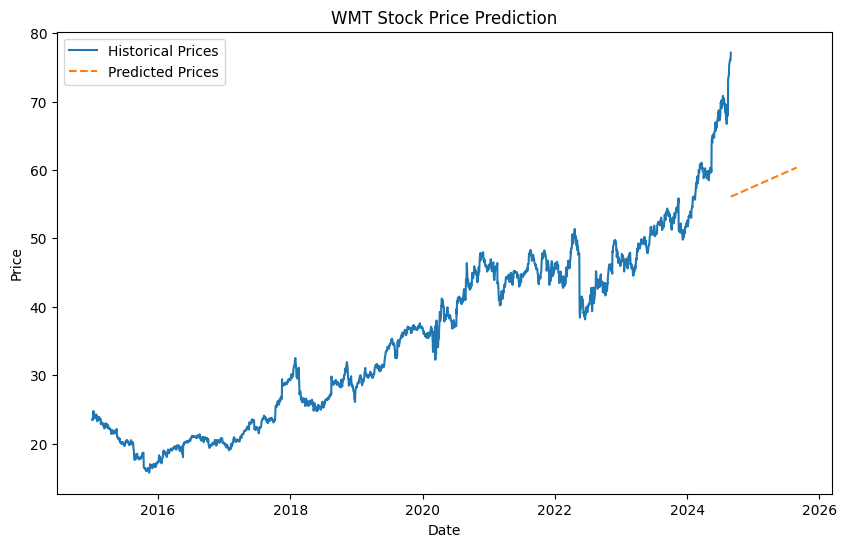

Mean Squared Error for UNH: 1299.0660787017468


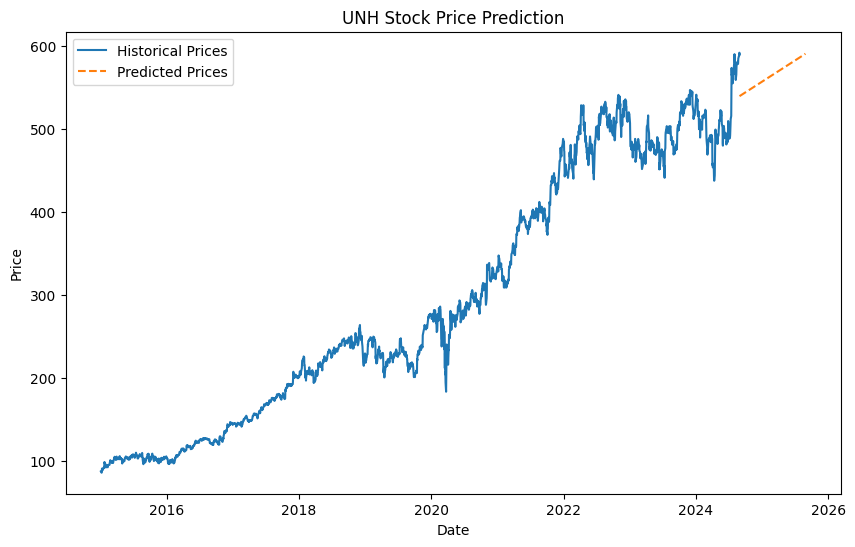

Mean Squared Error for V: 544.9488556103476


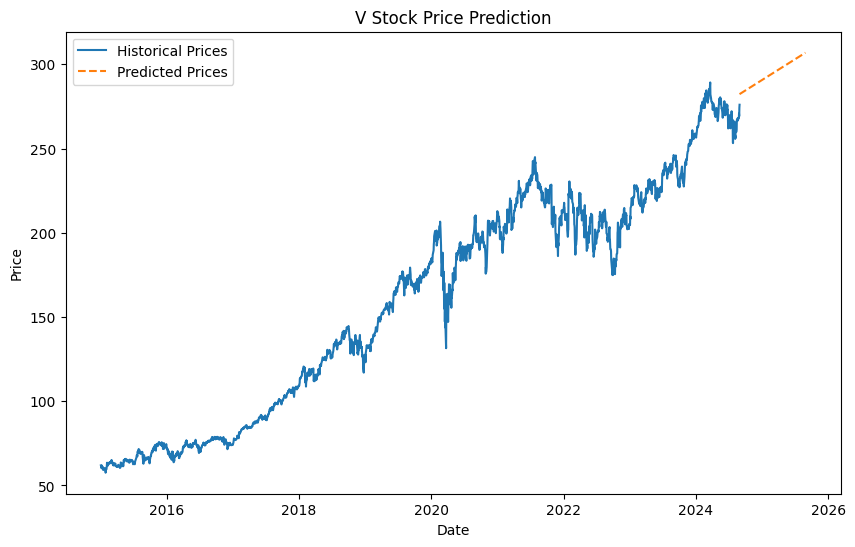

Mean Squared Error for XOM: 2398.6445131382575


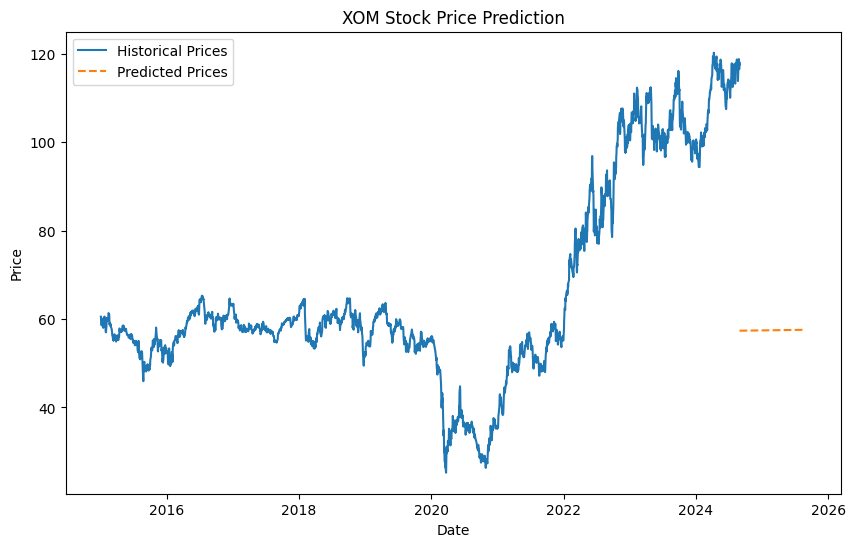

Mean Squared Error for MA: 1626.6386763192447


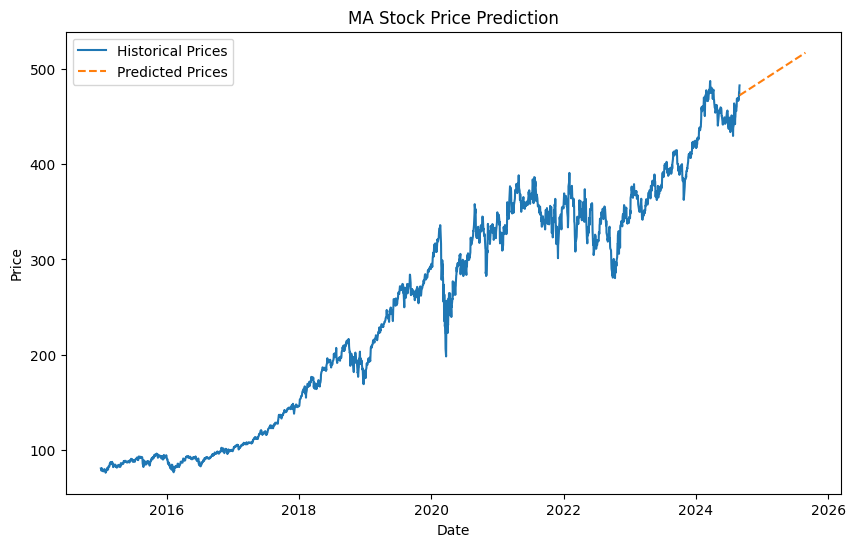

Mean Squared Error for PG: 51.95036111352047


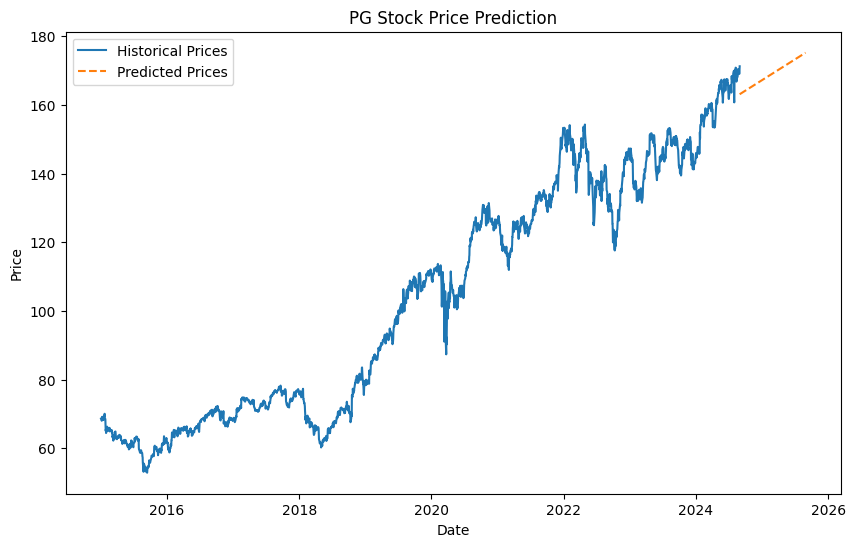

Mean Squared Error for JNJ: 411.6635234652322


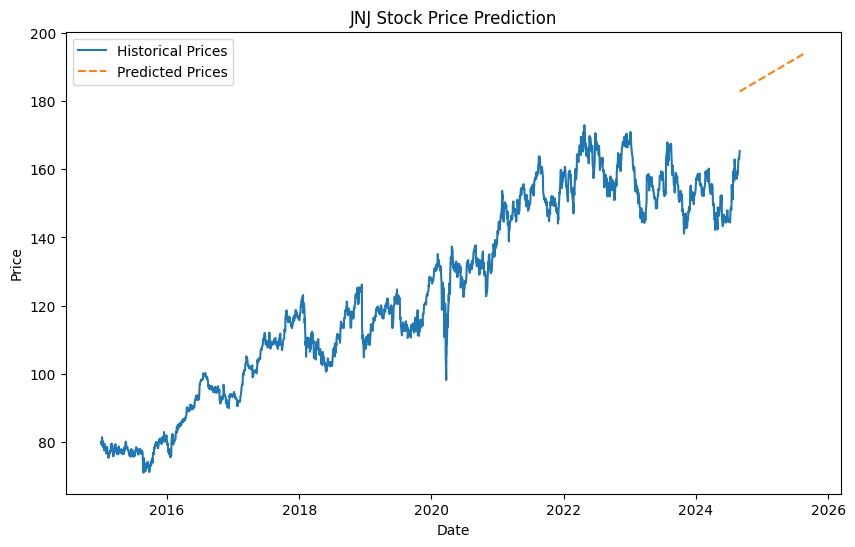

Mean Squared Error for COST: 21961.64045394591


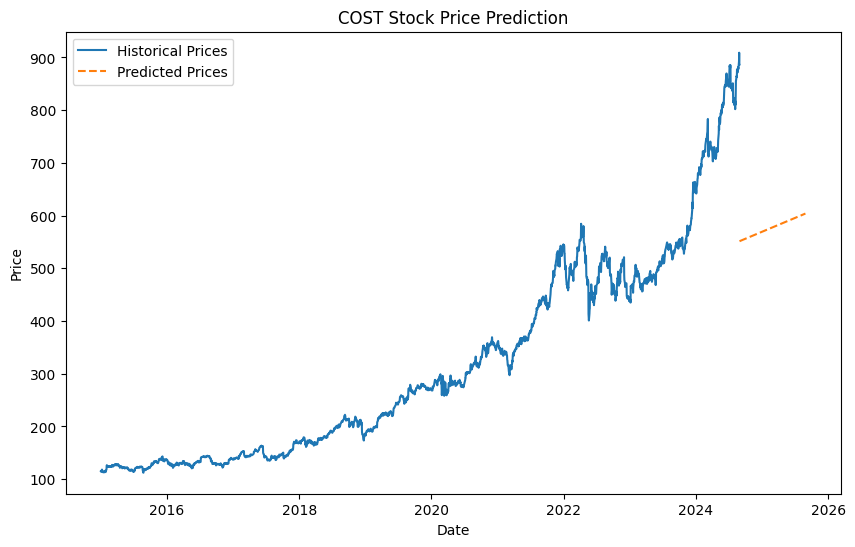

Mean Squared Error for ORCL: 928.8635457719283


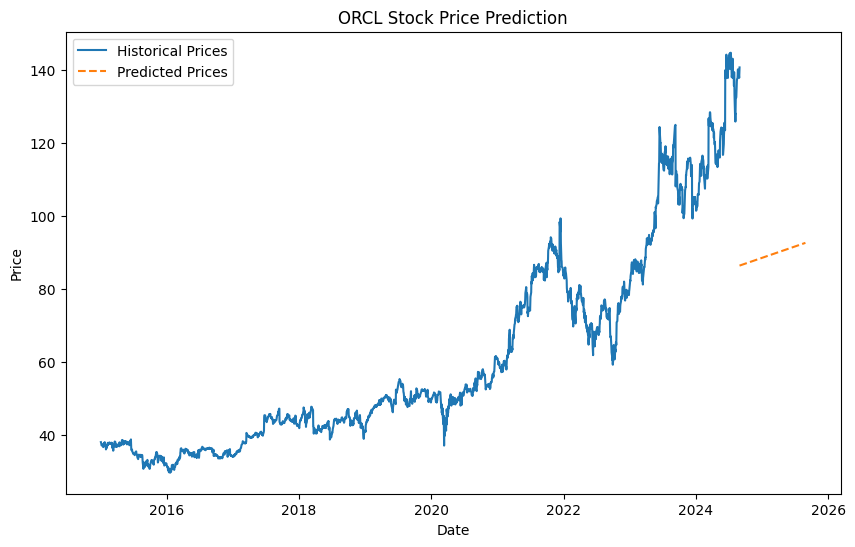

Mean Squared Error for HD: 1041.1790181725328


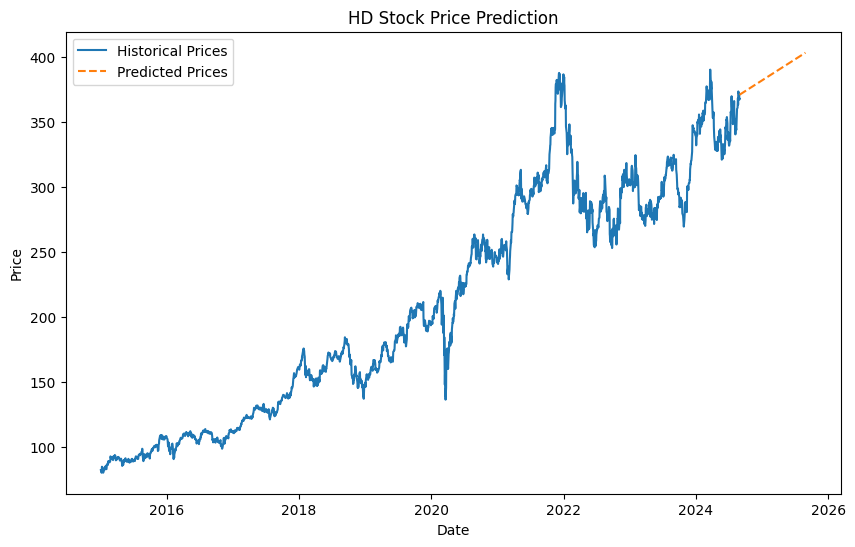

Mean Squared Error for ABBV: 852.2961987126587


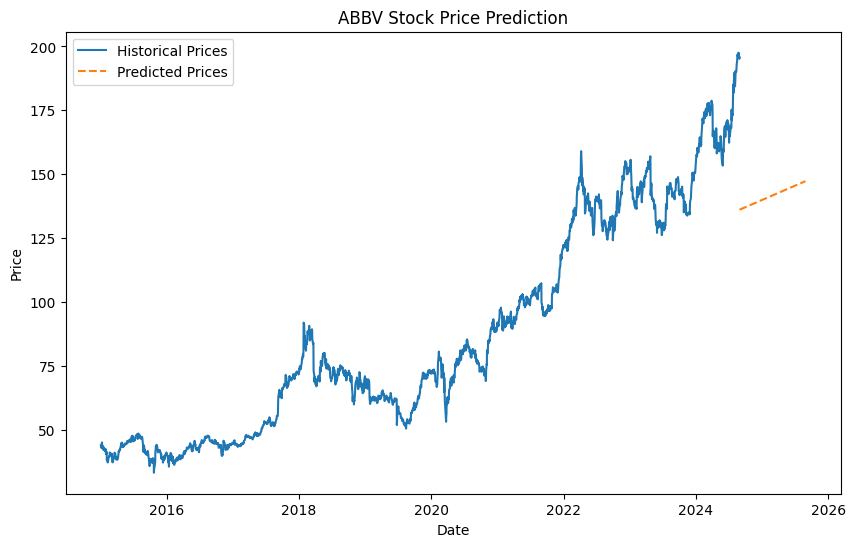

Mean Squared Error for BAC: 86.2460448009332


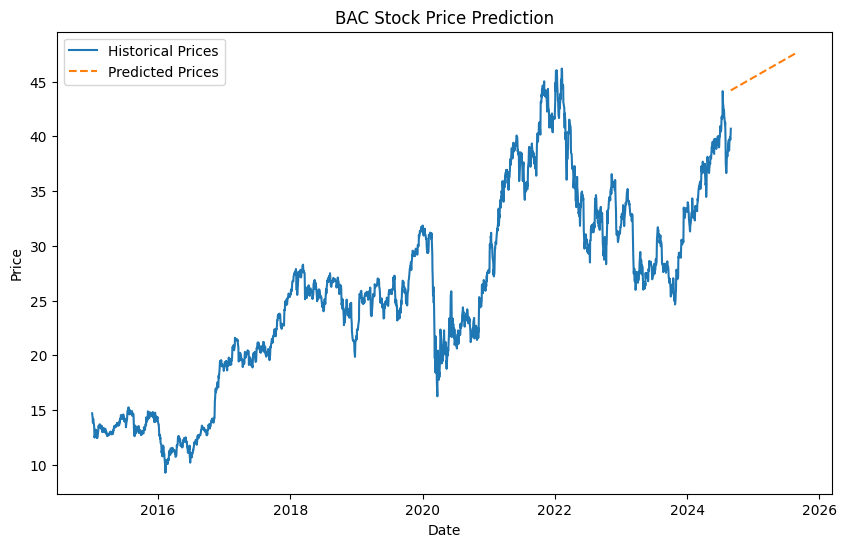

Mean Squared Error for KO: 10.420550158245605


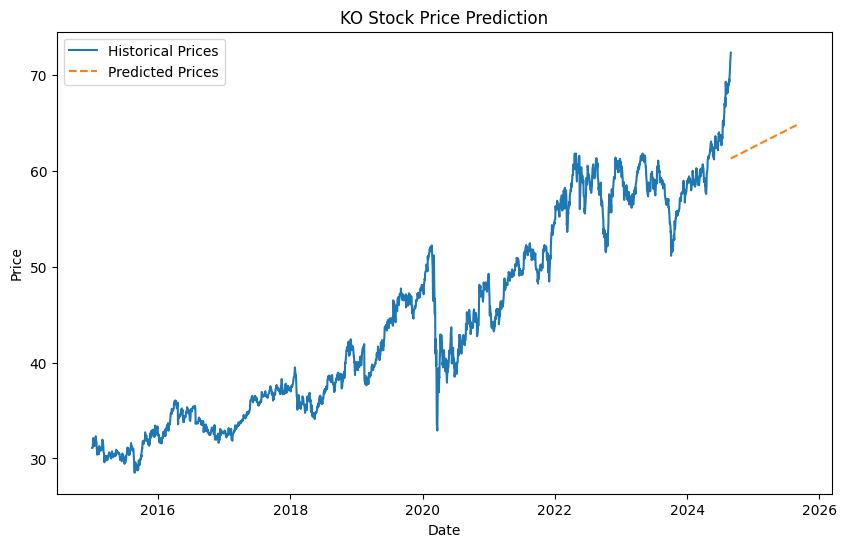

Mean Squared Error for MRK: 689.0870379438722


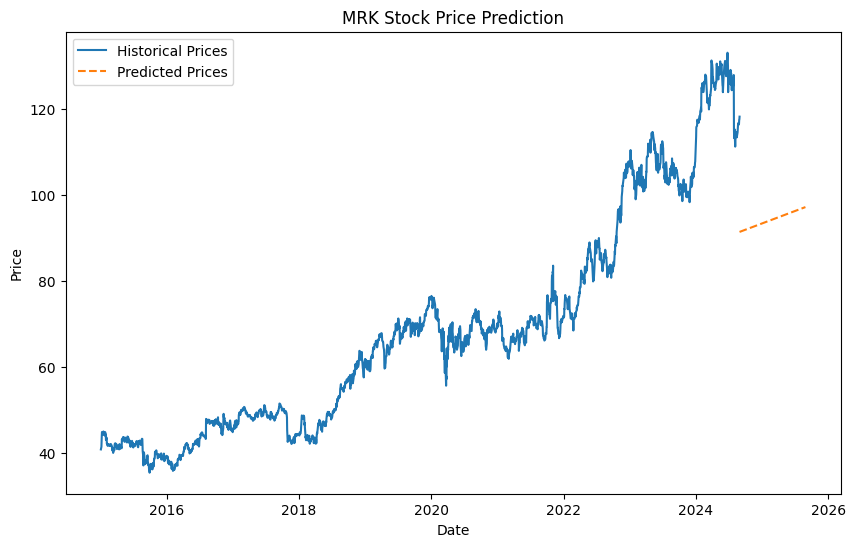

Mean Squared Error for NFLX: 25847.79152271537


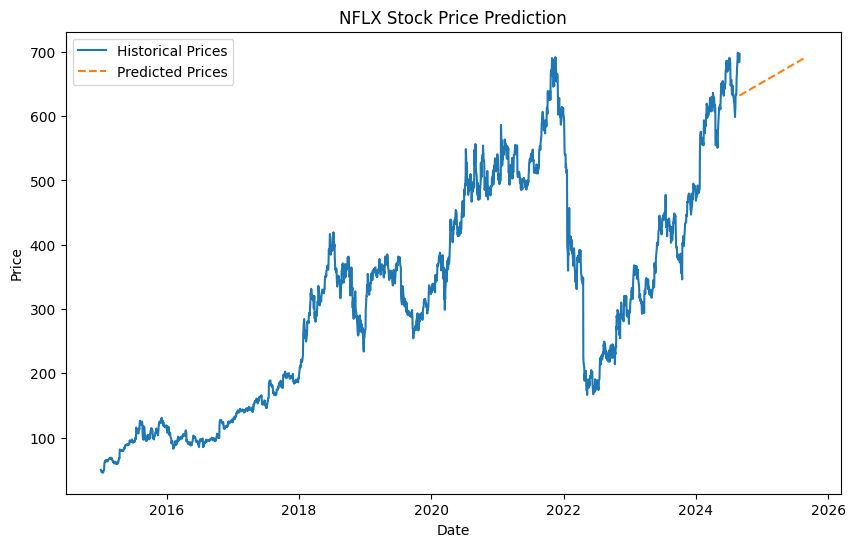

Mean Squared Error for CVX: 1291.311198089472


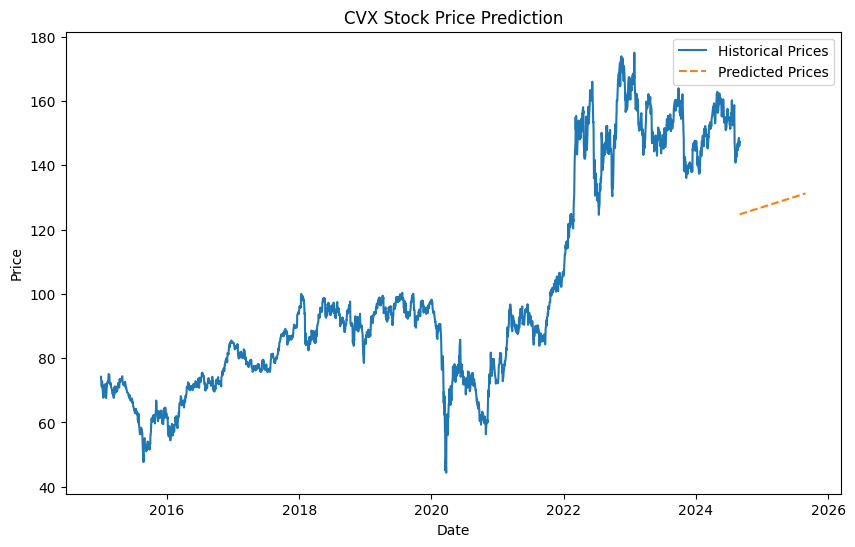

Mean Squared Error for ADBE: 26482.852195534335


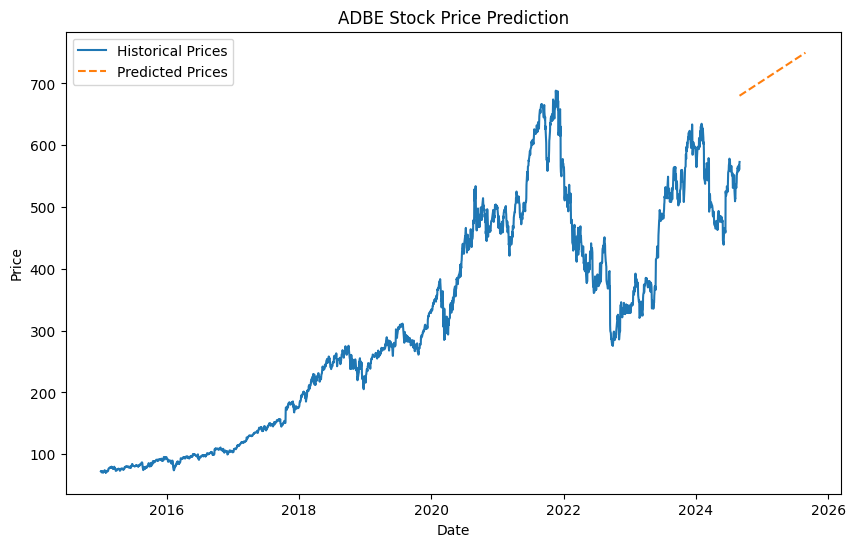

Mean Squared Error for CRM: 3737.5207213063727


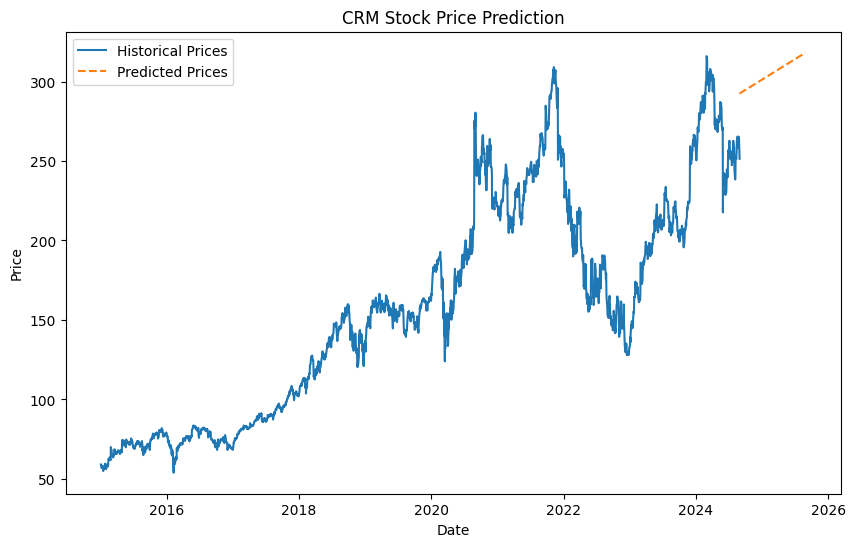

Mean Squared Error for AMD: 946.1943722725364


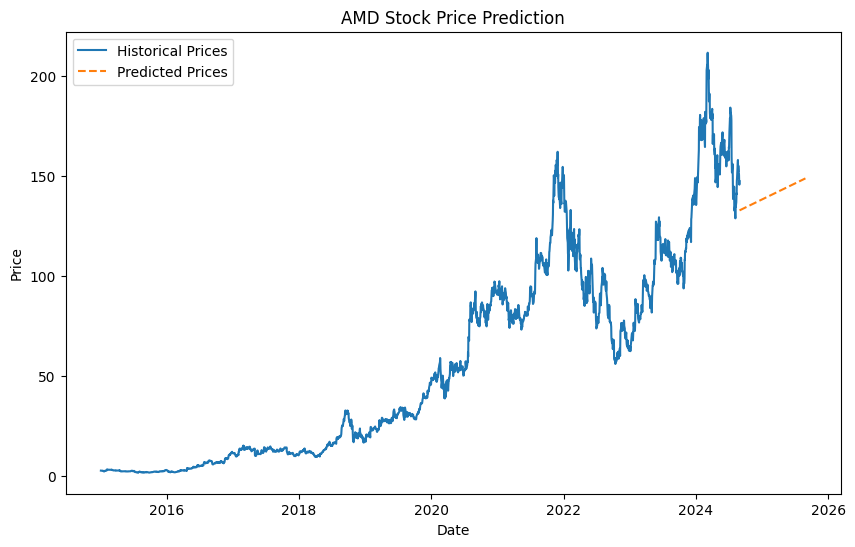

Mean Squared Error for PEP: 155.9725784956084


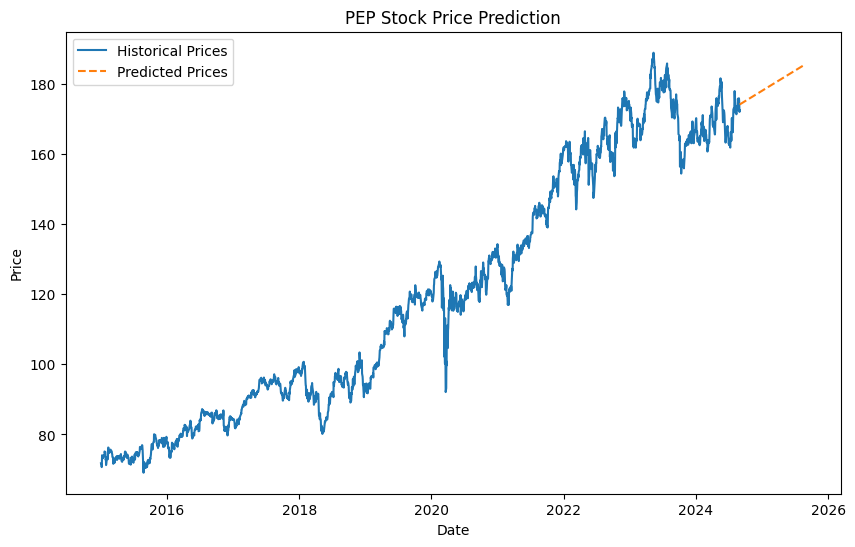

Mean Squared Error for TMO: 7256.158019855336


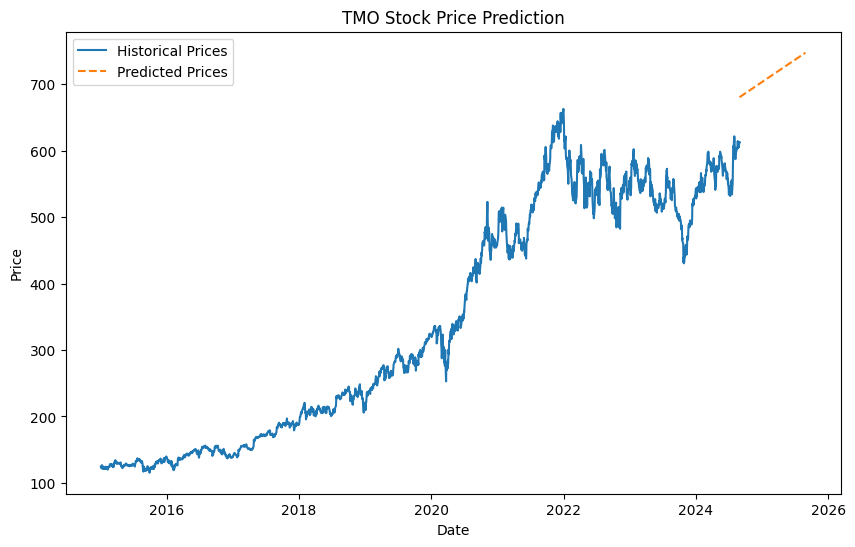

Mean Squared Error for TMUS: 134.10310523253253


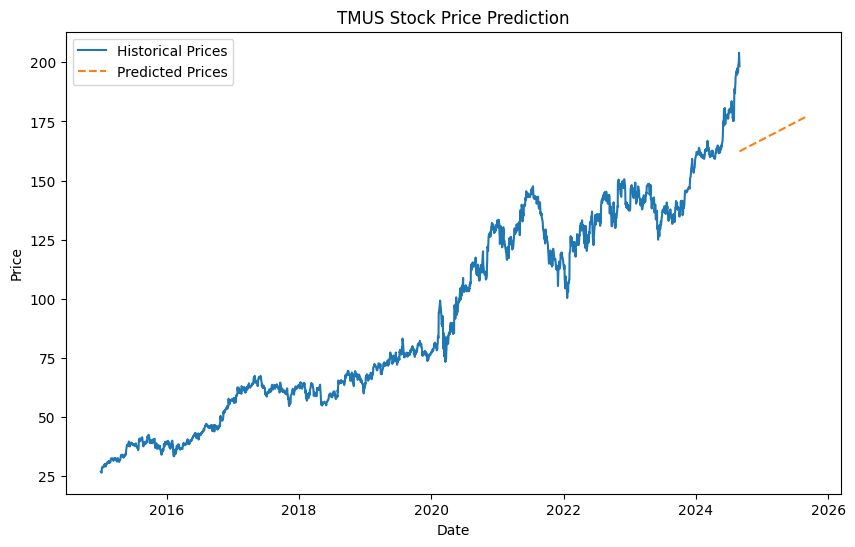

Mean Squared Error for LIN: 4737.364047359461


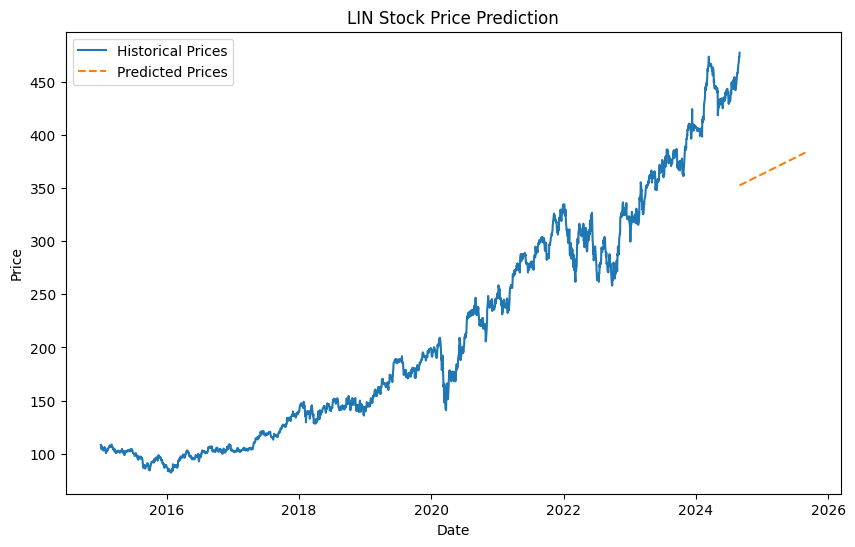

Mean Squared Error for ACN: 1394.990202357426


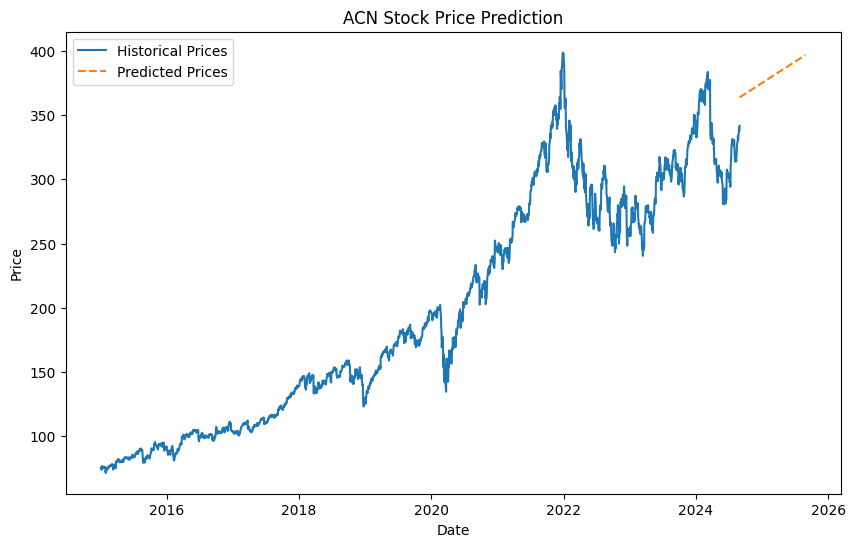

Mean Squared Error for MCD: 296.4308792791488


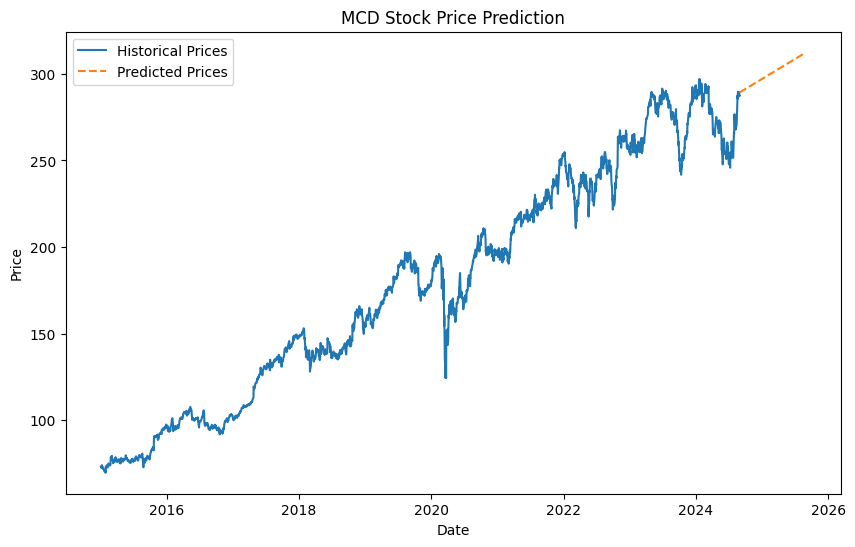

Mean Squared Error for CSCO: 70.31868816102386


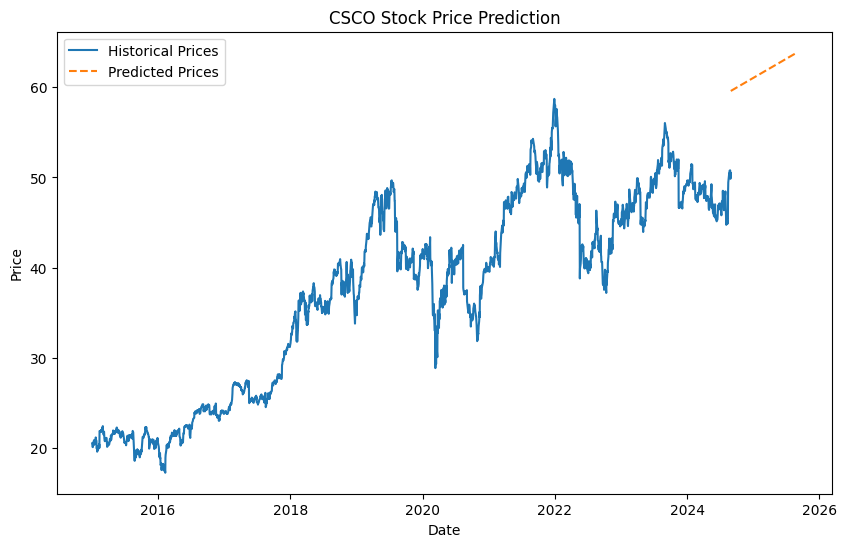

Mean Squared Error for WFC: 129.82634587806012


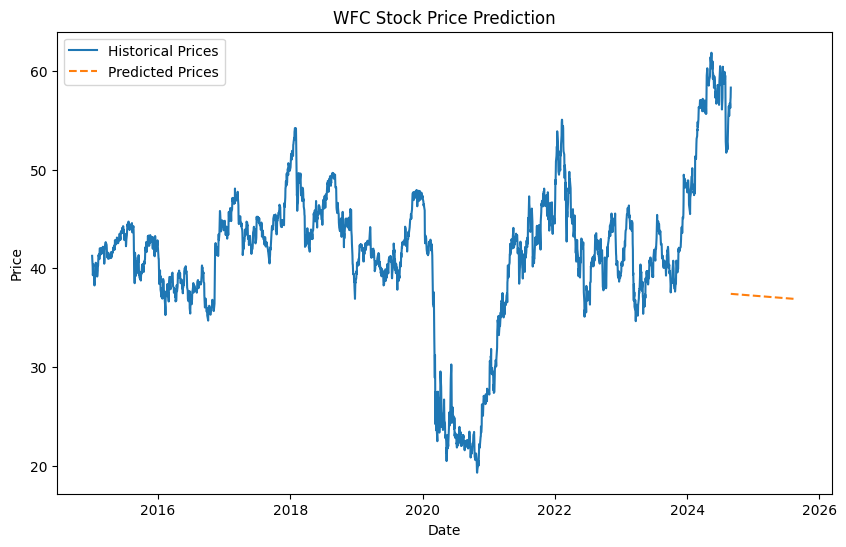

Mean Squared Error for ABT: 758.2755826933956


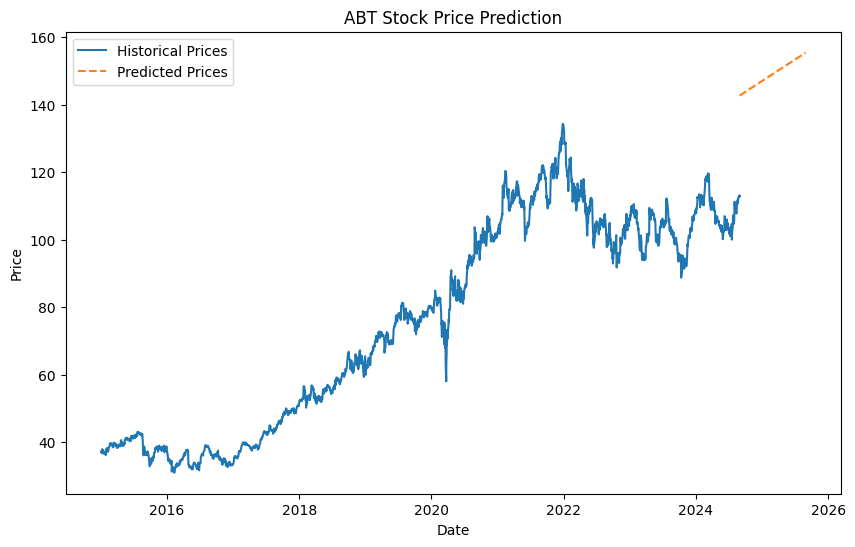

Mean Squared Error for TXN: 651.0221357856088


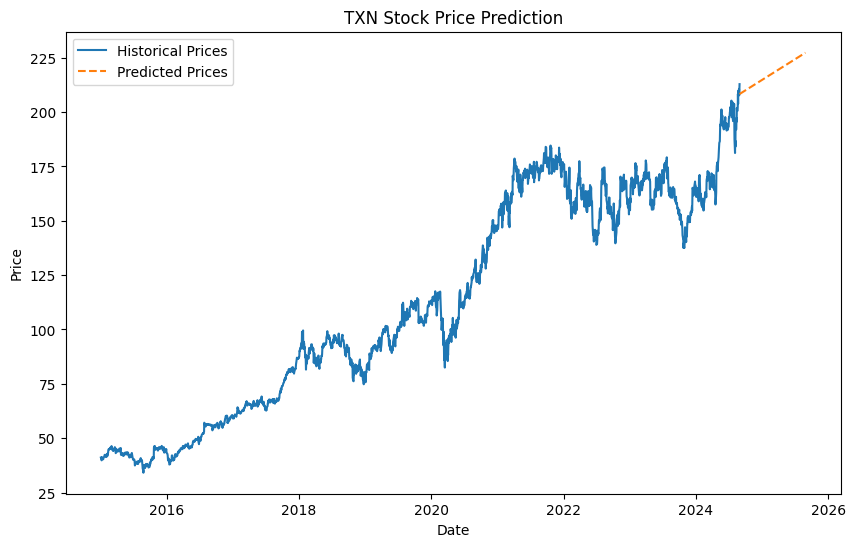

Mean Squared Error for DHR: 2348.605059225492


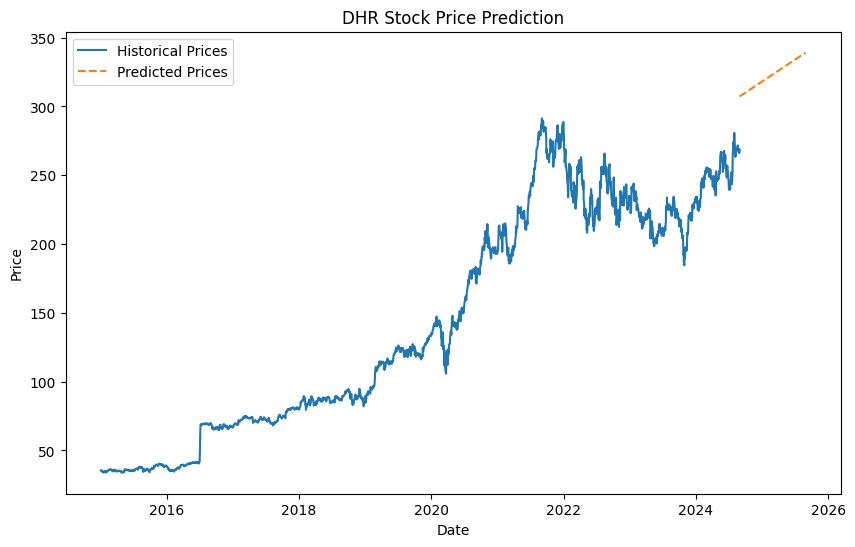

Mean Squared Error for QCOM: 765.5821016198137


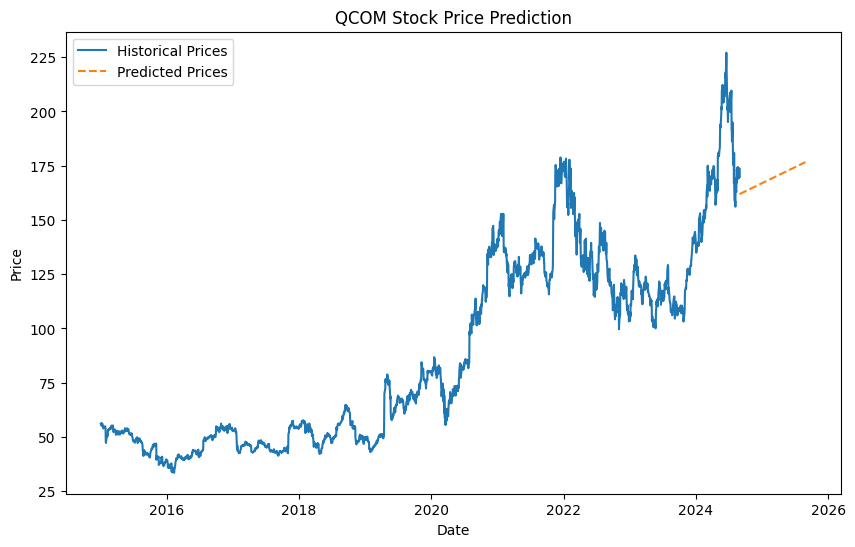

Mean Squared Error for PM: 135.4507255503764


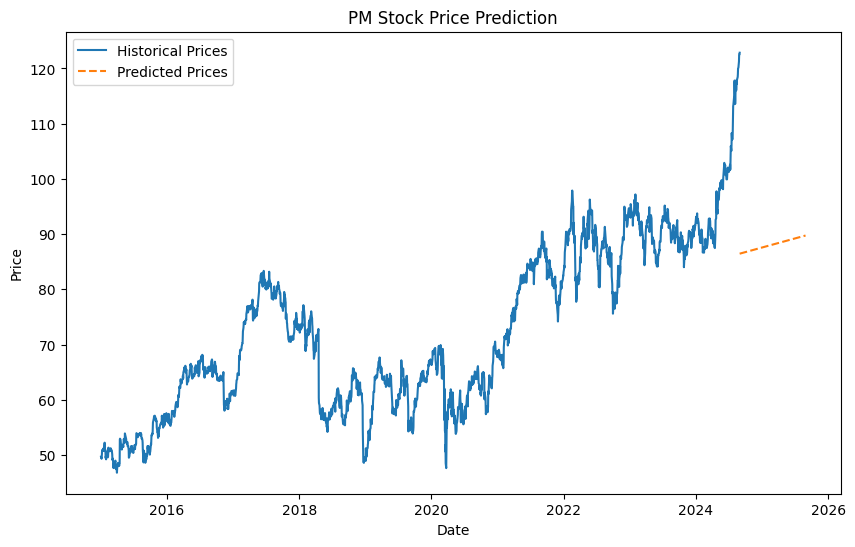

Mean Squared Error for GE: 8770.837906130515


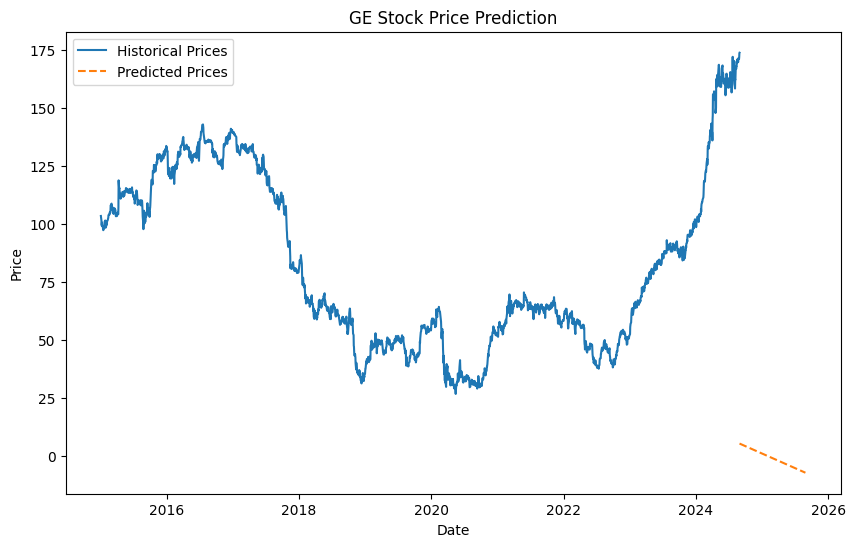

Mean Squared Error for IBM: 1769.6623045847934


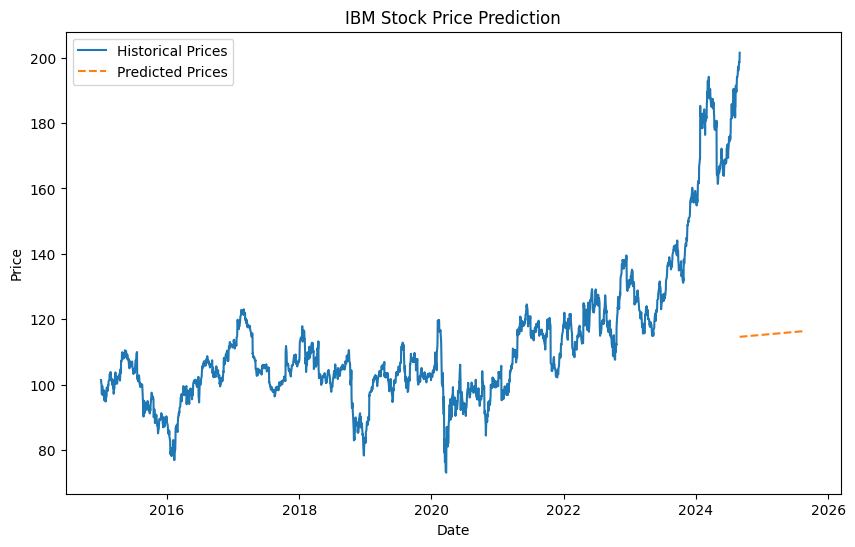

Mean Squared Error for AXP: 1003.1916596940554


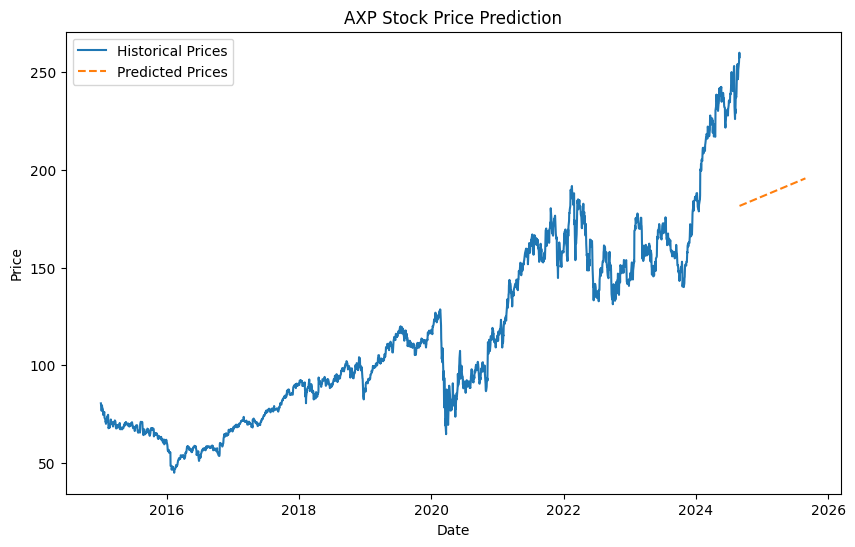

Mean Squared Error for AMGN: 1082.4092276029403


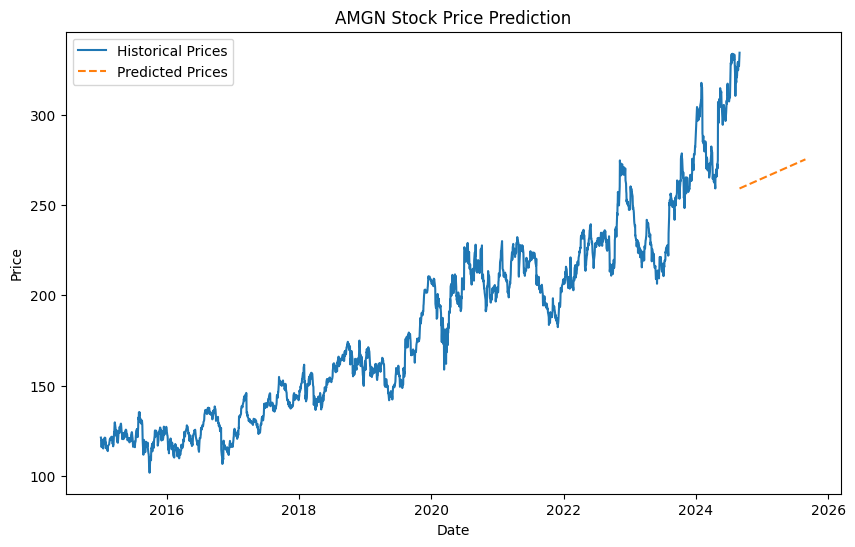

Mean Squared Error for VZ: 233.42065105103651


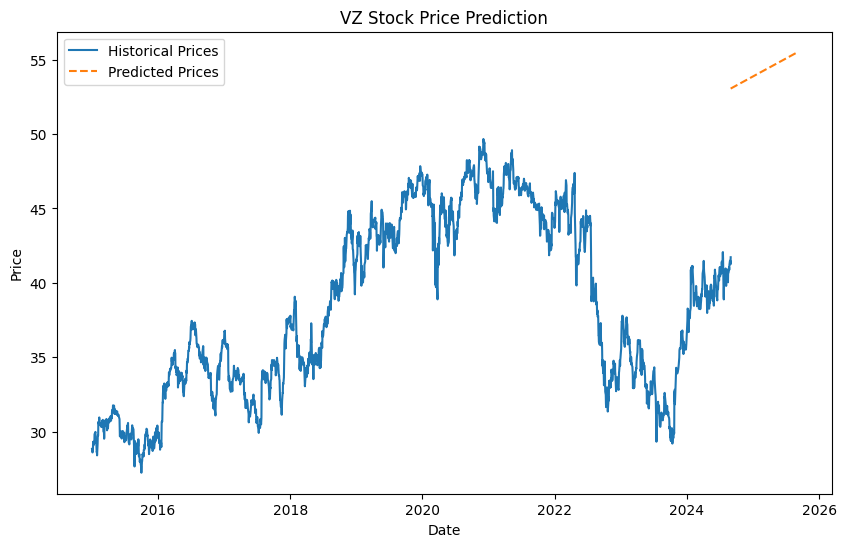

Mean Squared Error for NOW: 13556.99436649047


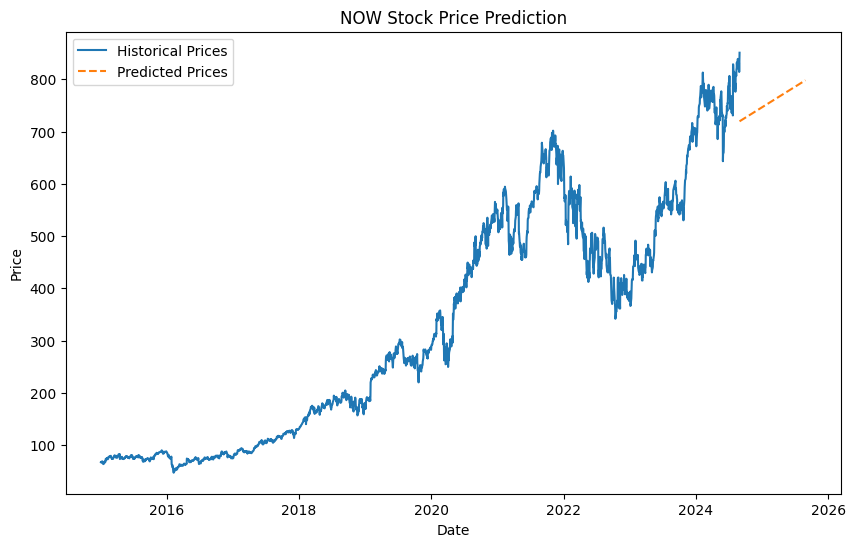

Mean Squared Error for ISRG: 3026.8366400594787


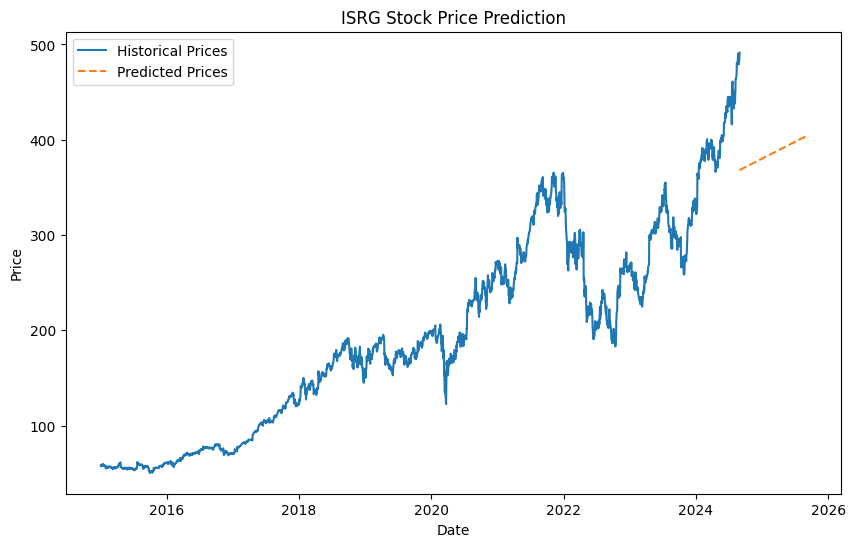

Mean Squared Error for INTU: 4920.660208264615


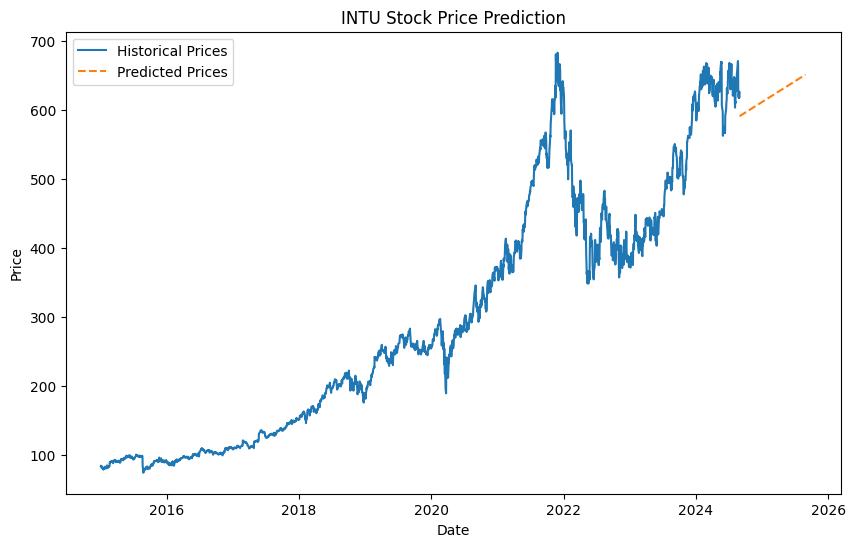

Mean Squared Error for BX: 205.5398290547724


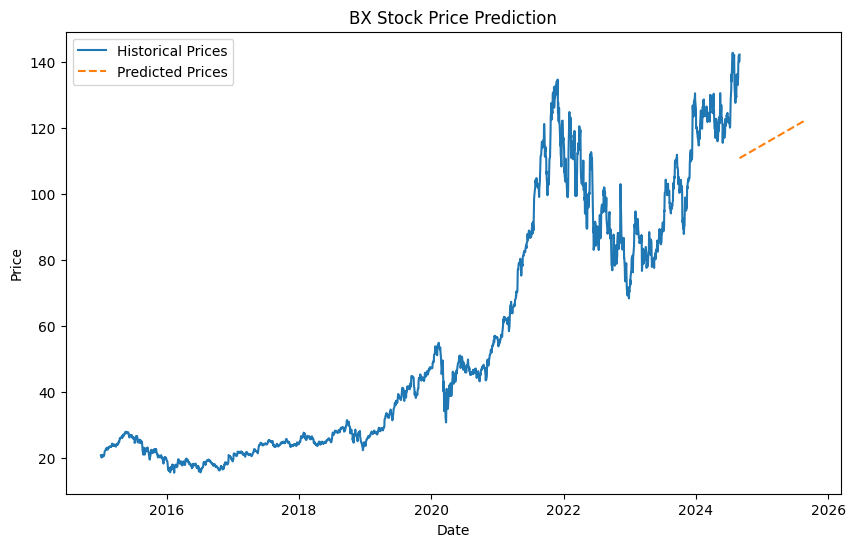

Mean Squared Error for CAT: 4647.6906415379335


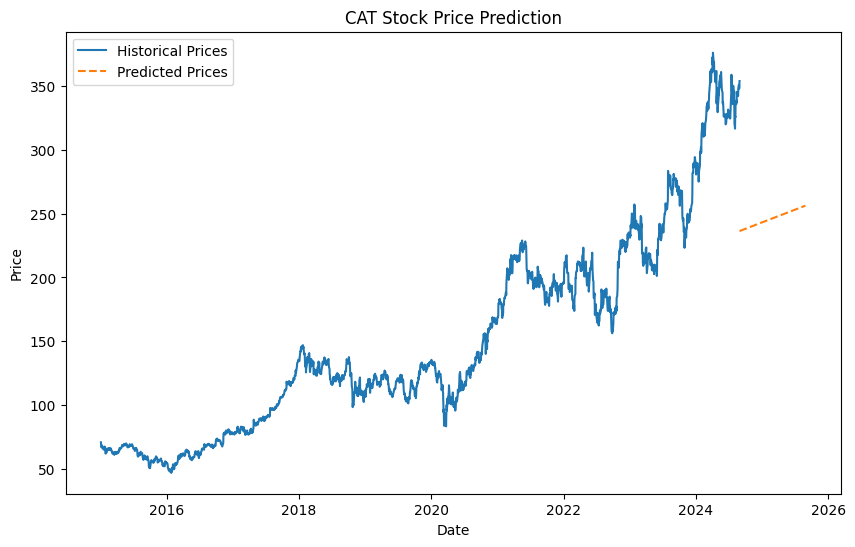

Mean Squared Error for MS: 49.18005042209216


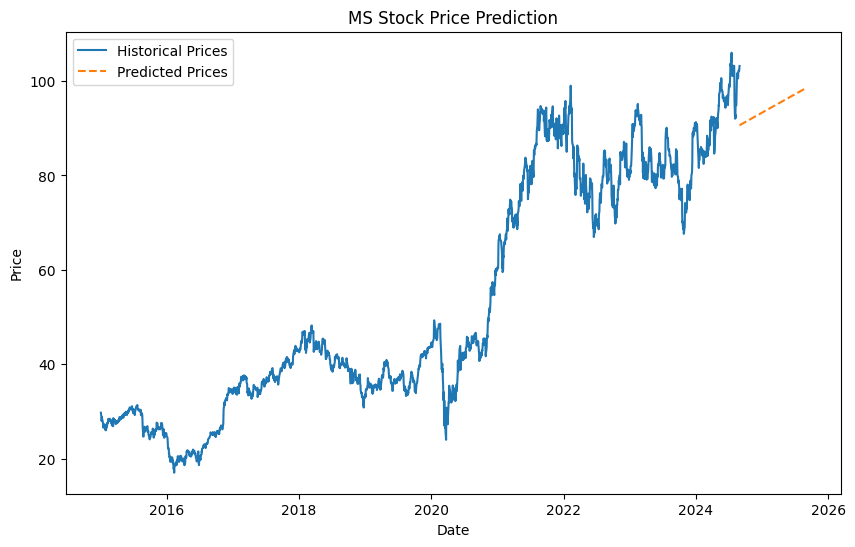

Mean Squared Error for NEE: 497.8604536167468


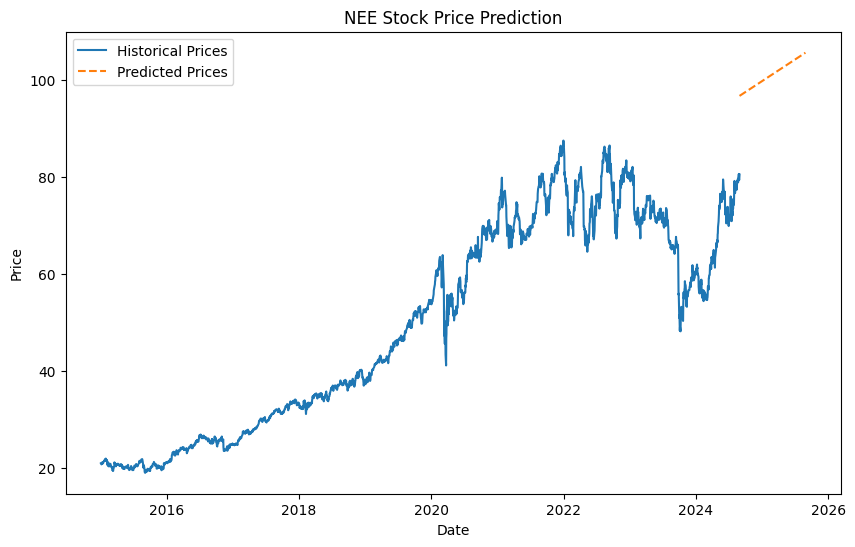

Mean Squared Error for PFE: 161.59053259637696


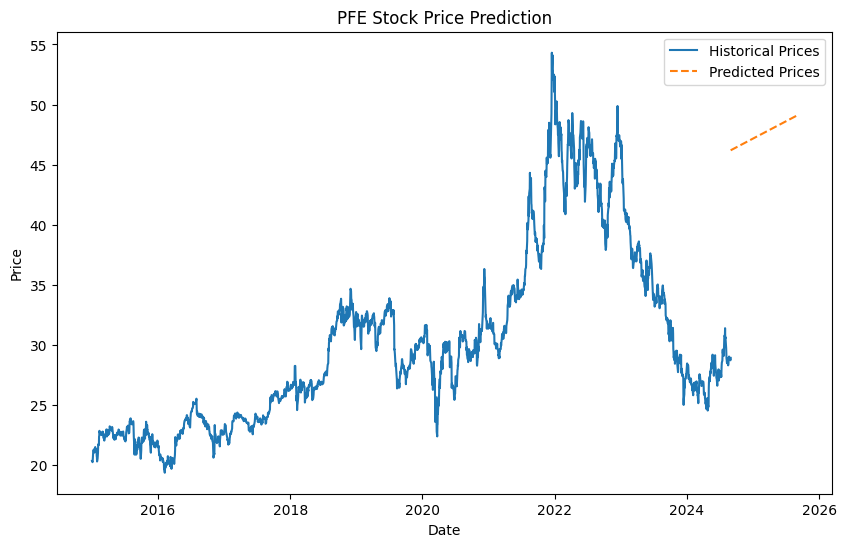

Mean Squared Error for RTX: 127.44675541528036


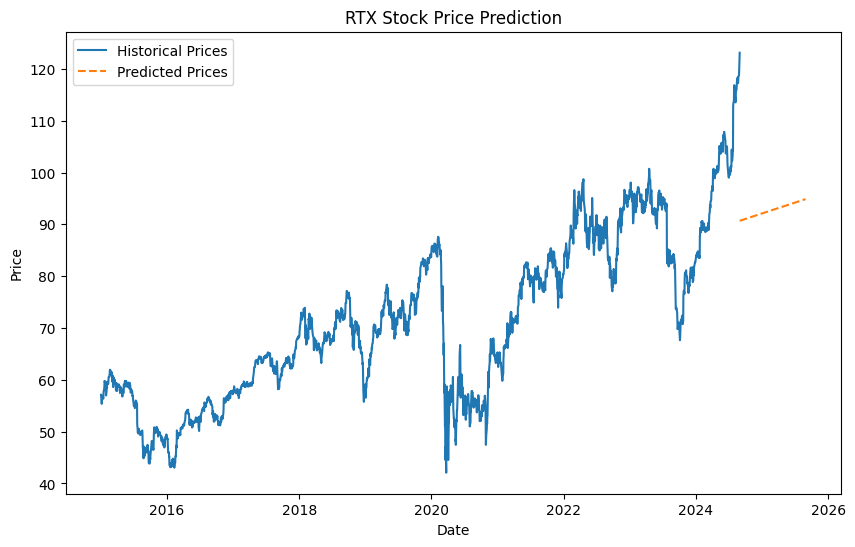

Mean Squared Error for DIS: 4165.478893950369


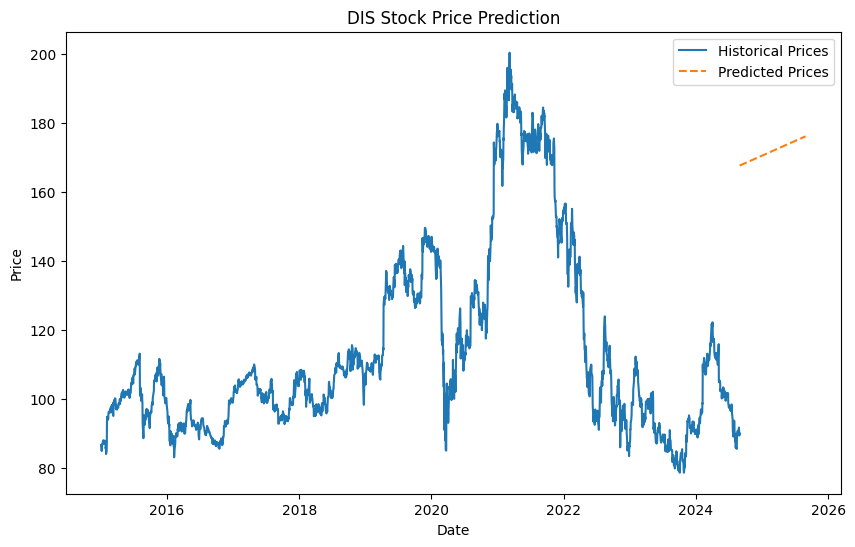

Mean Squared Error for GS: 4067.1552272331423


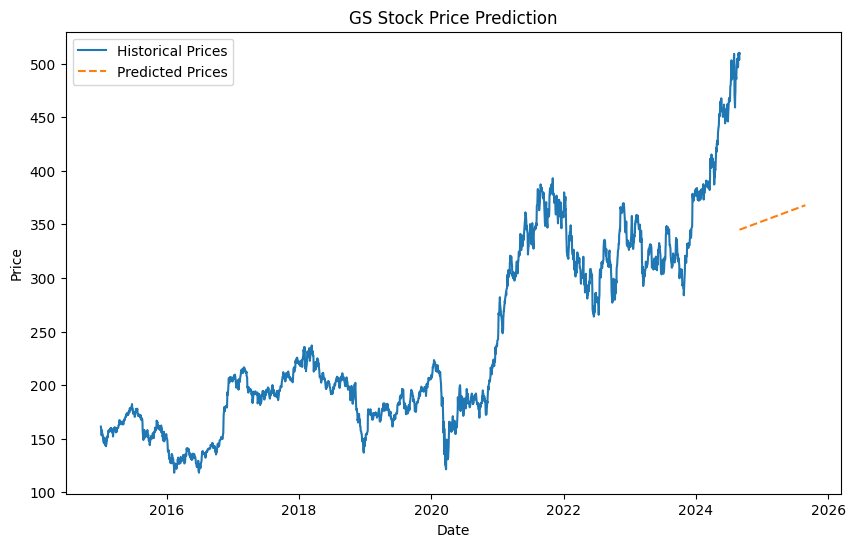

Mean Squared Error for AMAT: 1767.2138596928417


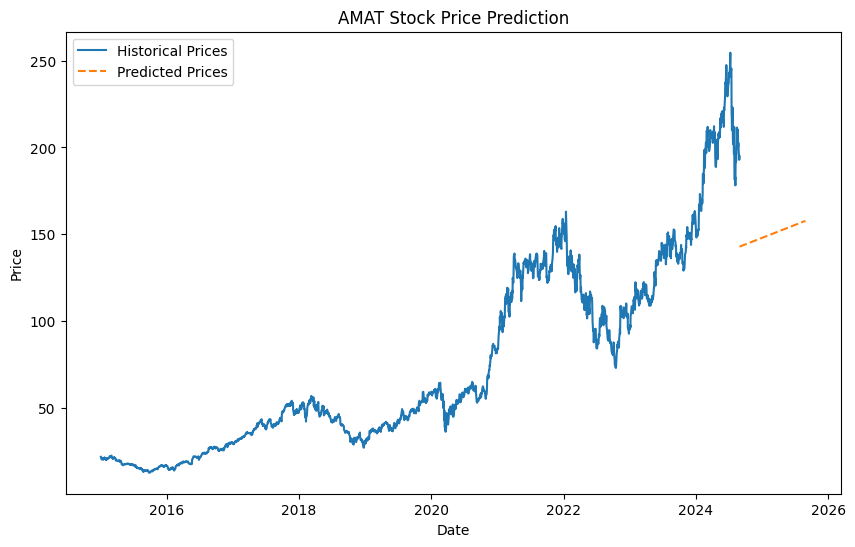

Mean Squared Error for SPGI: 4607.72539116132


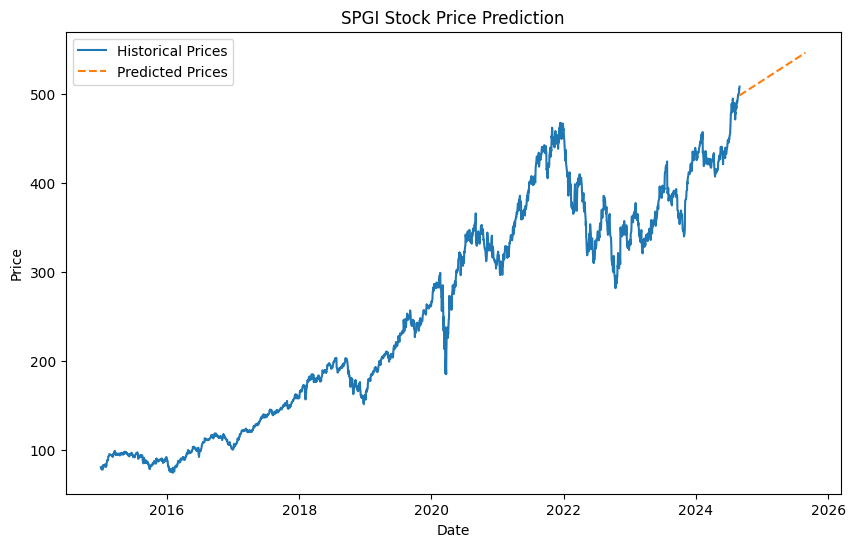

Mean Squared Error for UNP: 1027.5531676917833


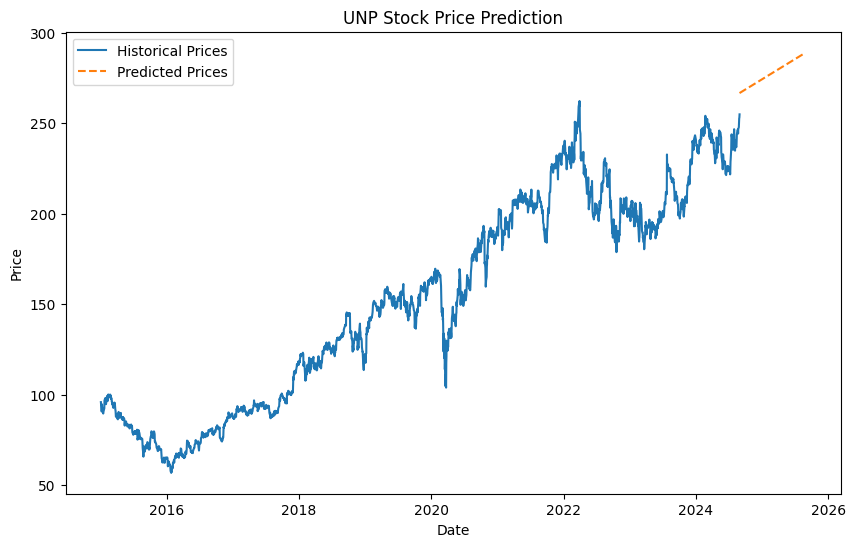

Mean Squared Error for CMCSA: 150.56535770564955


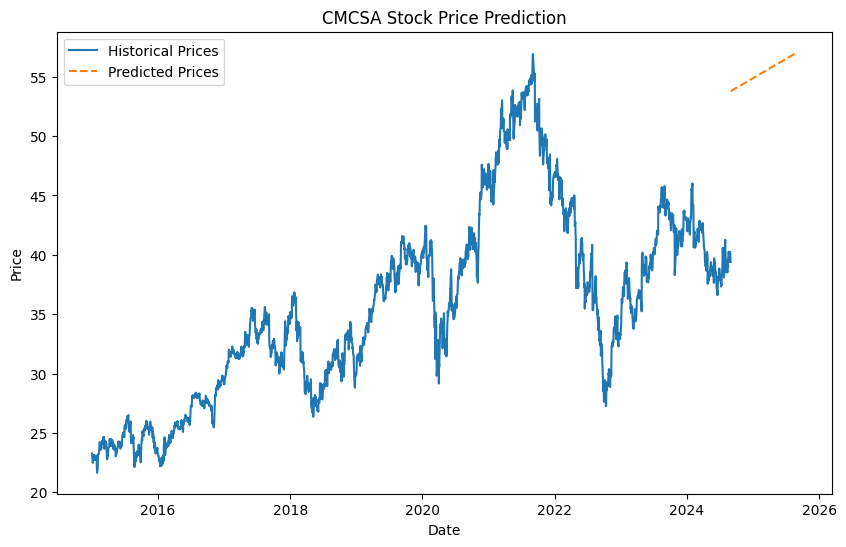

Mean Squared Error for UBER: 920.7550264261847


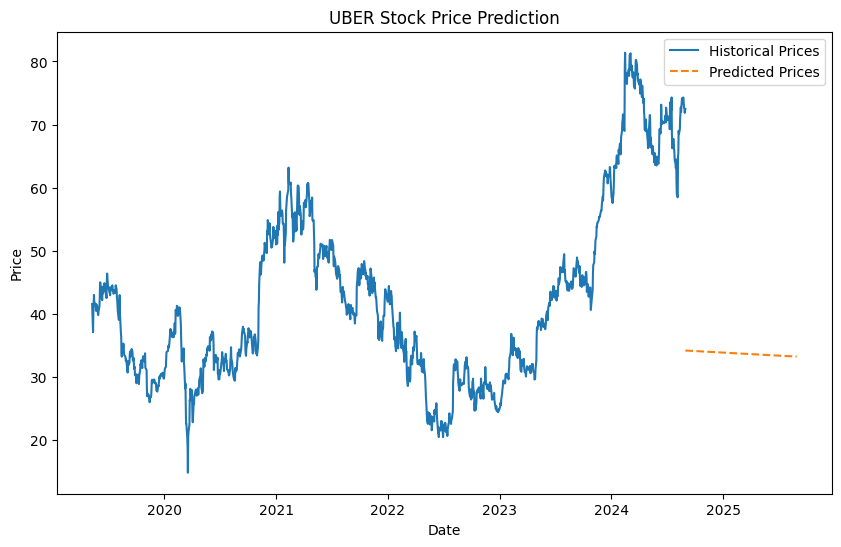

Mean Squared Error for PGR: 2270.82317780459


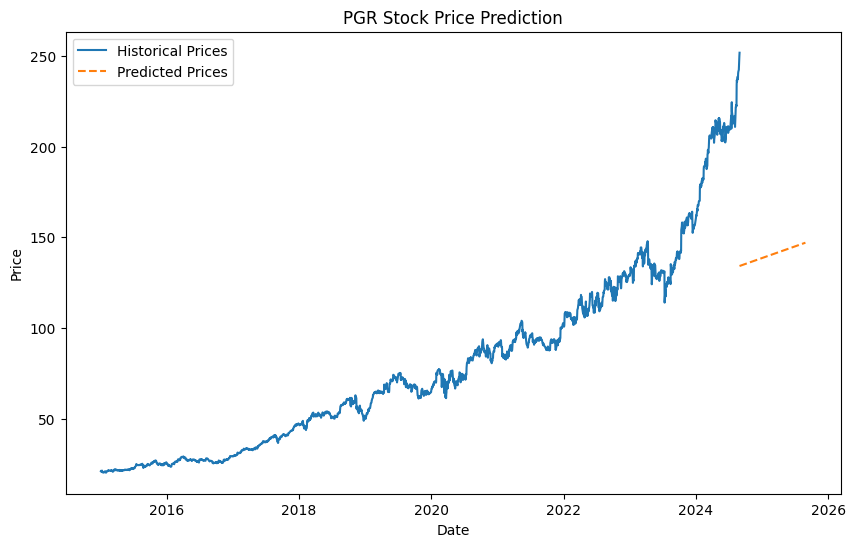

Mean Squared Error for T: 6.128658792822694


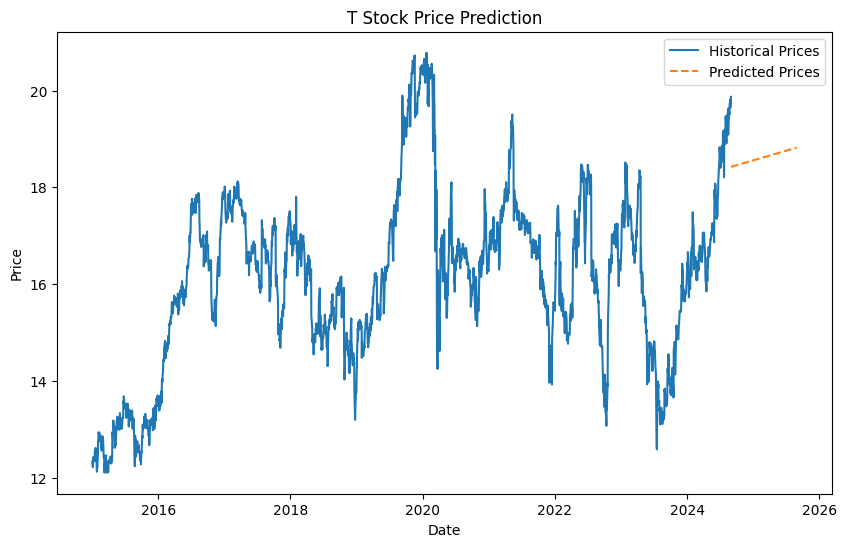

Mean Squared Error for LOW: 148.18568539906835


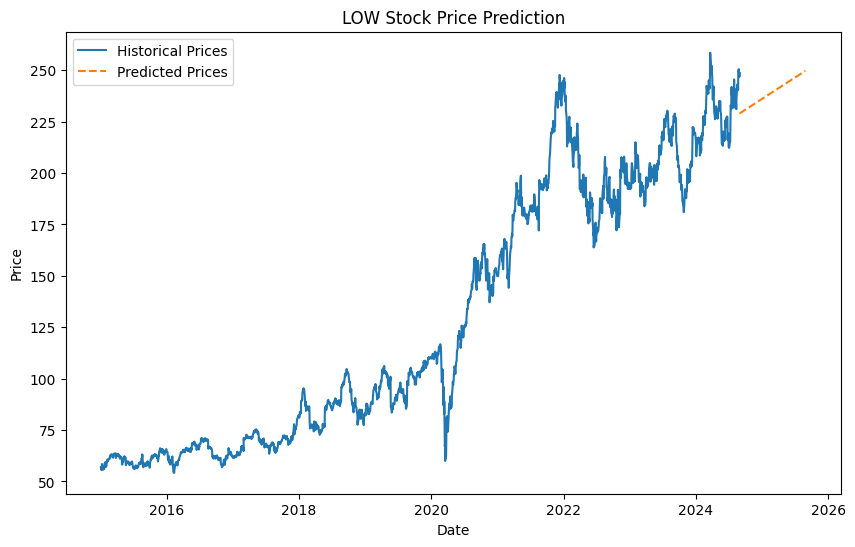

Mean Squared Error for SYK: 979.2459130372316


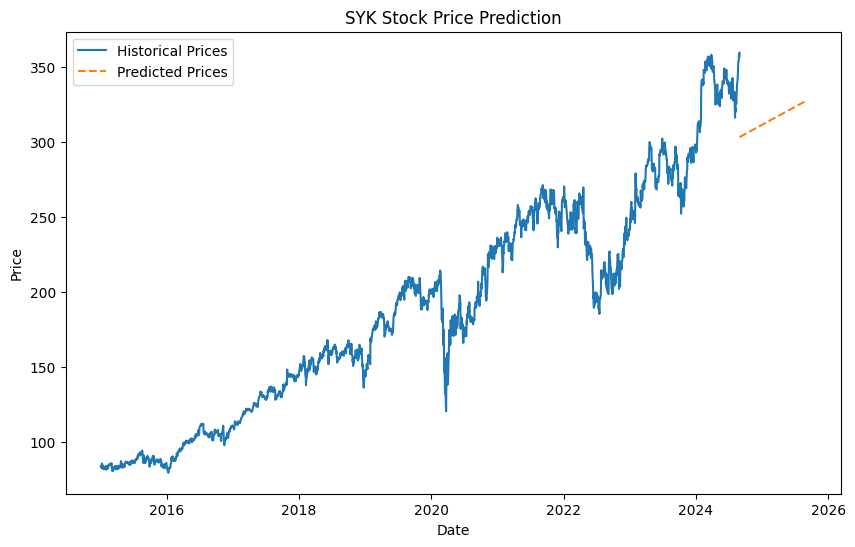

Mean Squared Error for LMT: 1260.6109560144835


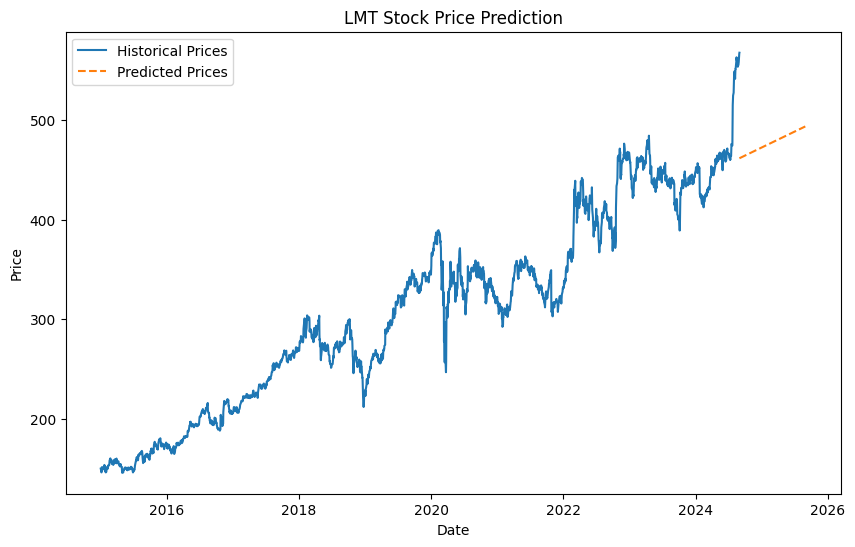

Mean Squared Error for HON: 769.4011097071591


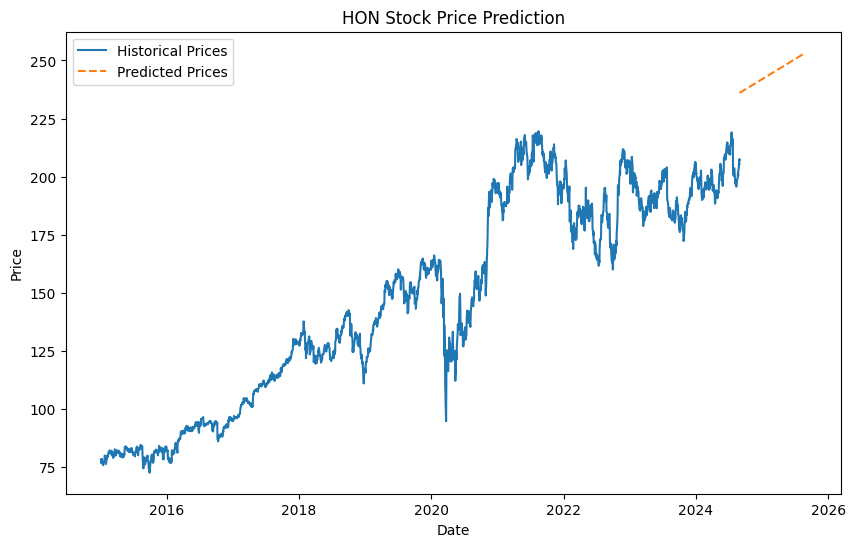

Mean Squared Error for BLK: 7928.004596921017


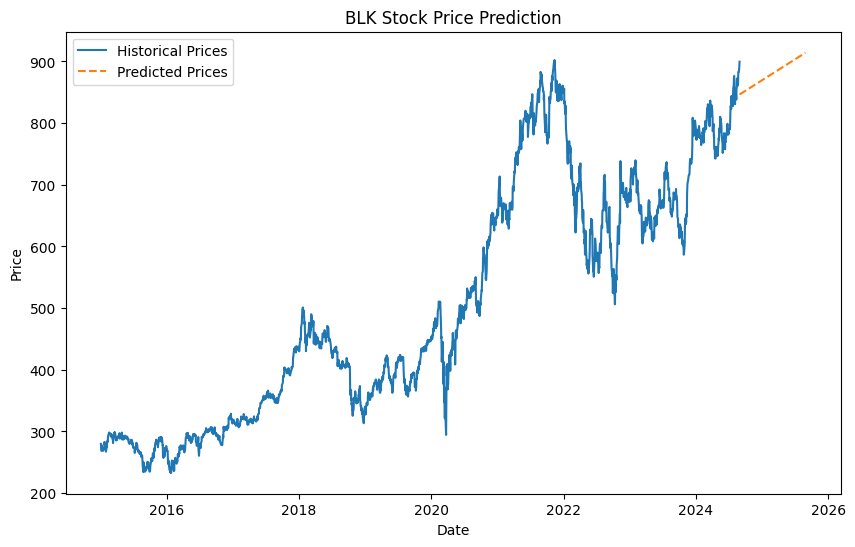

Mean Squared Error for TJX: 361.2507421708718


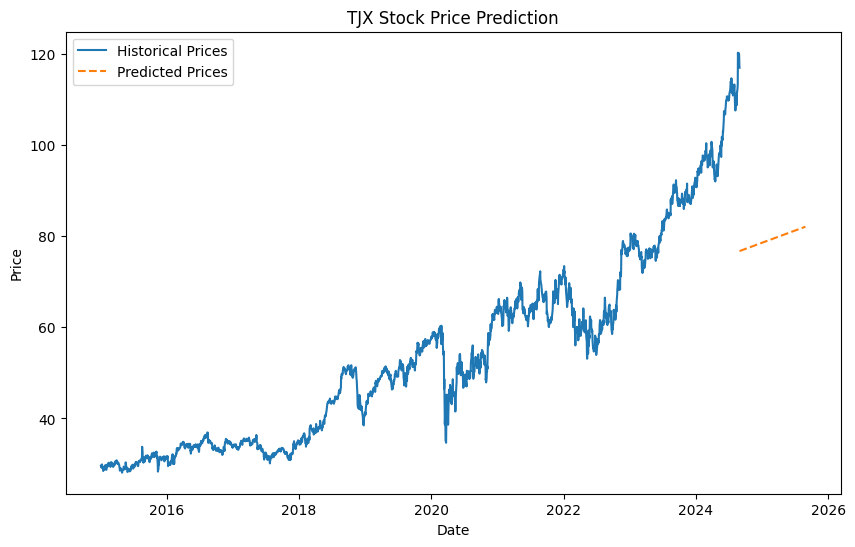

Mean Squared Error for COP: 1851.7507987434815


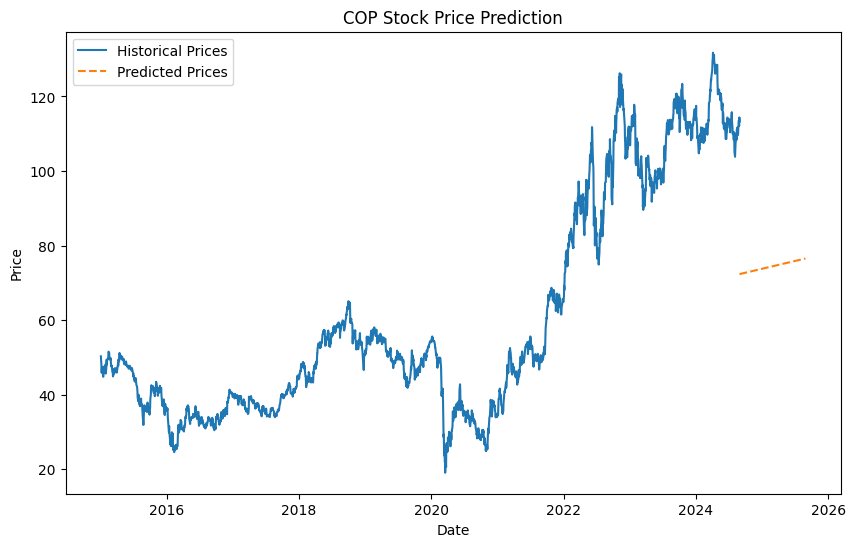

Mean Squared Error for BKNG: 628806.6152555959


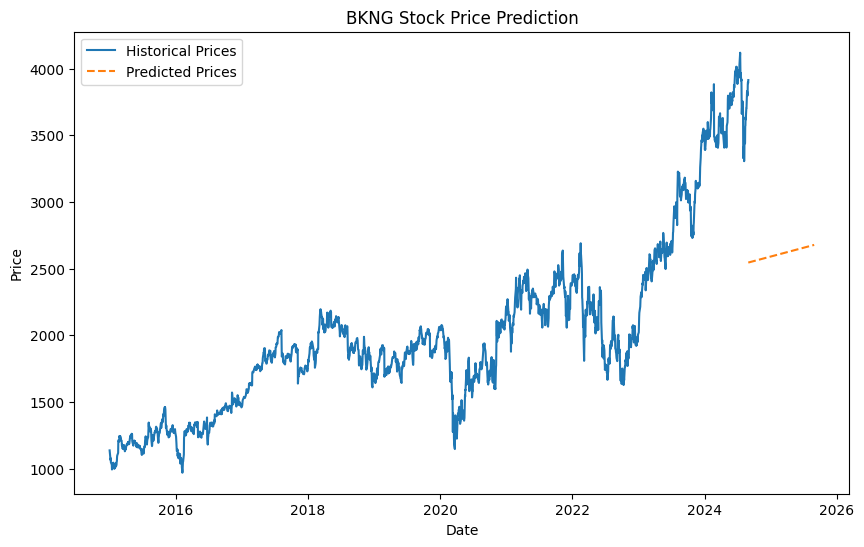

Mean Squared Error for REGN: 88761.20217134042


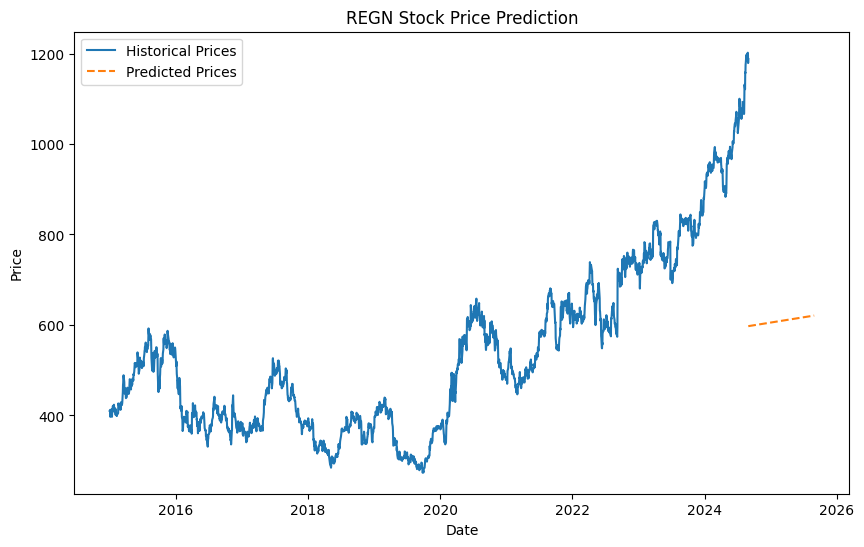

Mean Squared Error for ELV: 1390.9652853268026


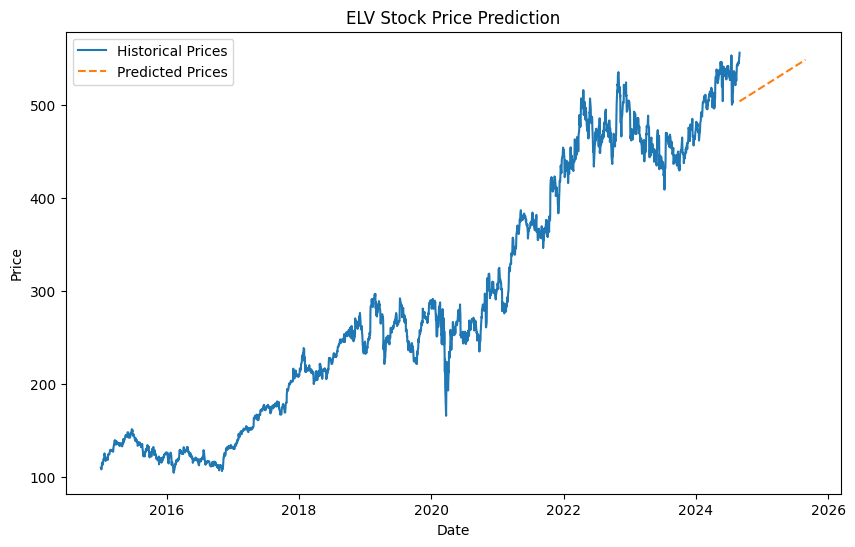

Mean Squared Error for VRTX: 9606.499333980868


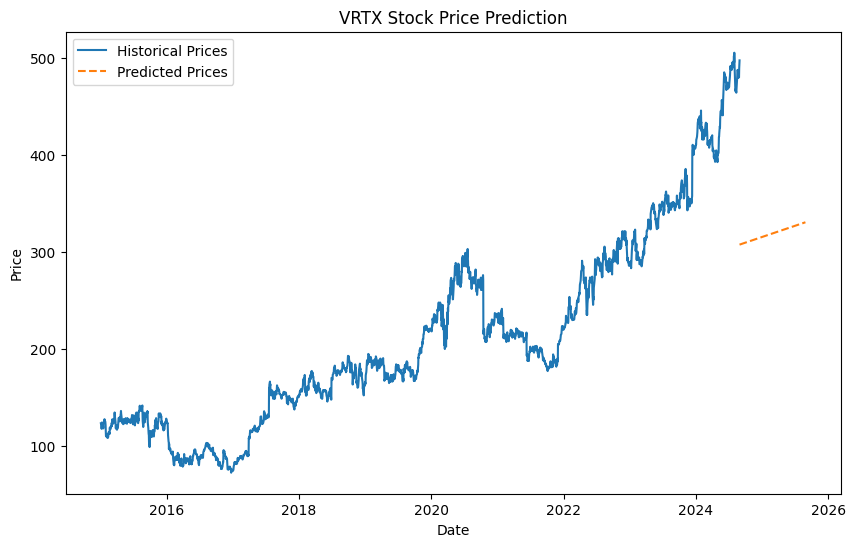

Mean Squared Error for NKE: 2571.1861891367


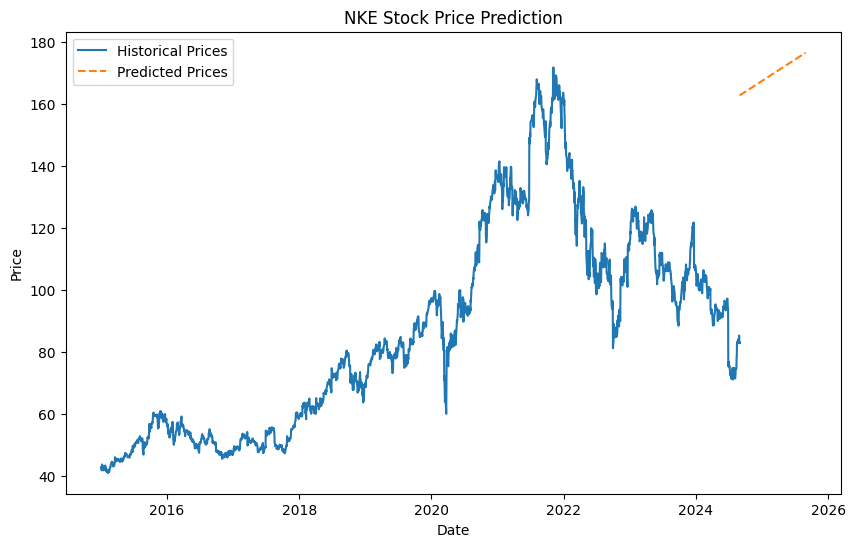

Mean Squared Error for ETN: 8408.185028903283


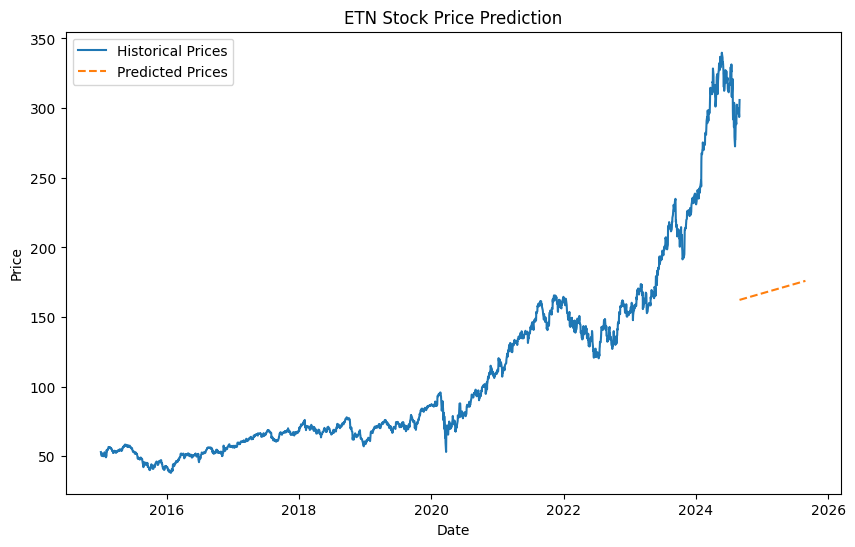

Mean Squared Error for BSX: 127.4196137553473


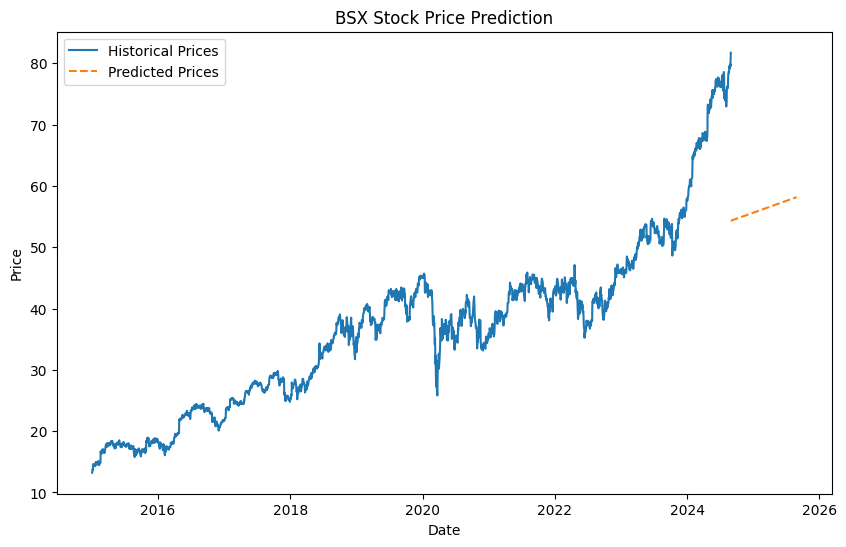

Mean Squared Error for C: 178.7607271298665


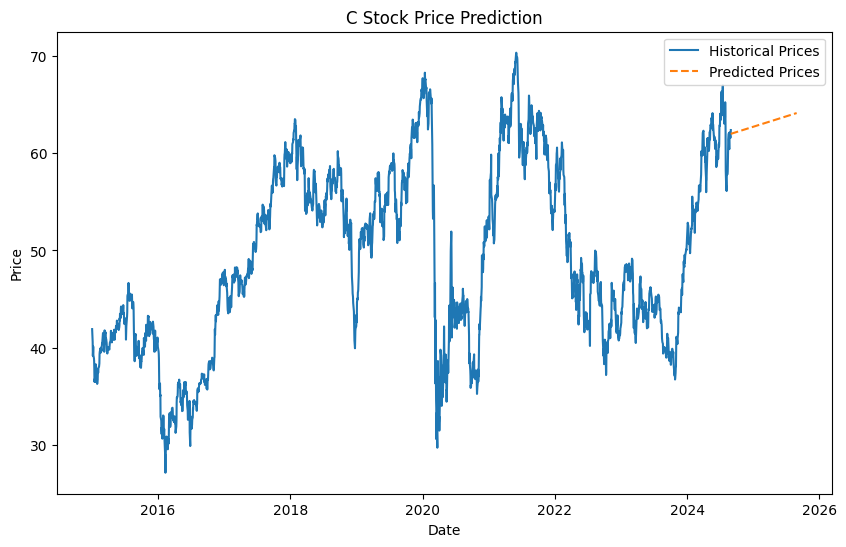

Mean Squared Error for SCHW: 161.1593110523504


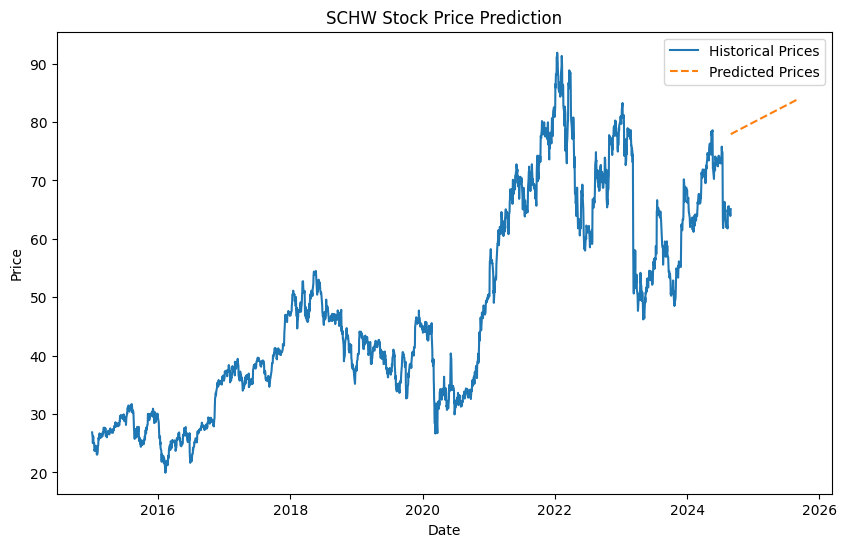

Mean Squared Error for PLD: 594.8270375916403


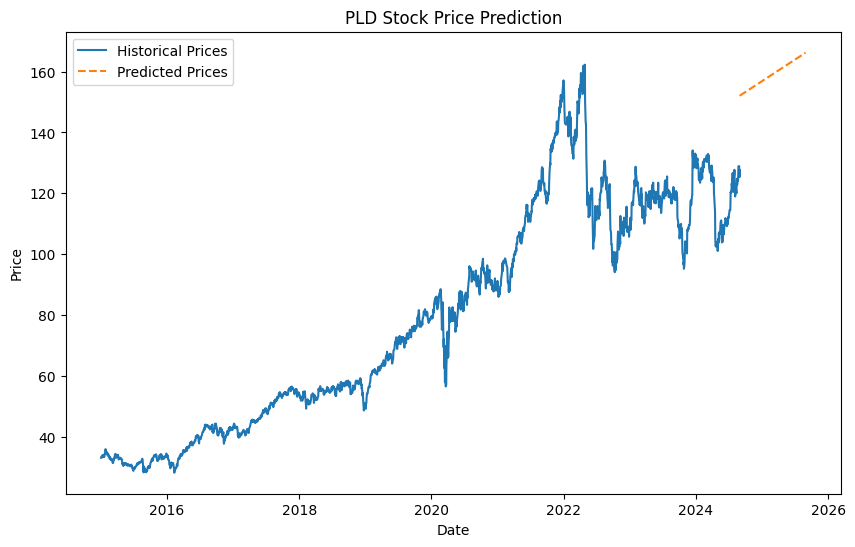

Mean Squared Error for PANW: 10259.191834979087


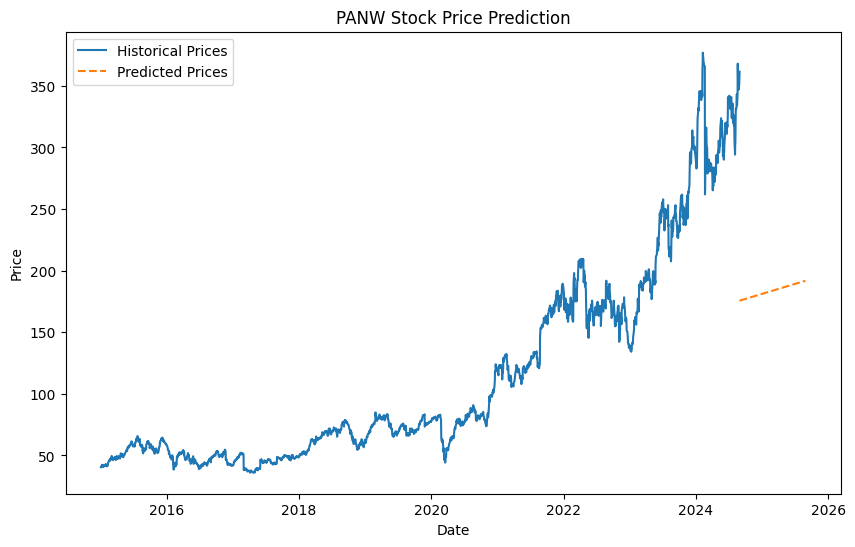

Mean Squared Error for ADI: 382.04903381008984


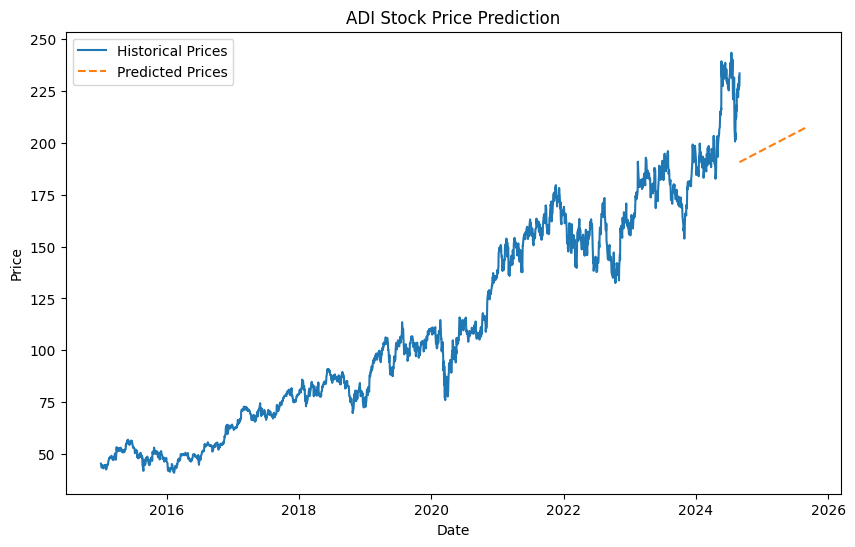

Mean Squared Error for CB: 1716.6319729136362


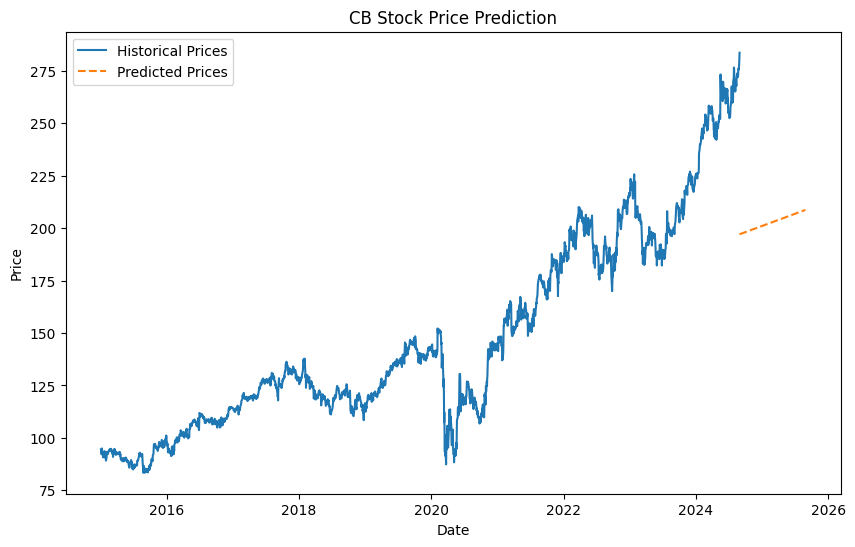

Mean Squared Error for KKR: 575.9579712002752


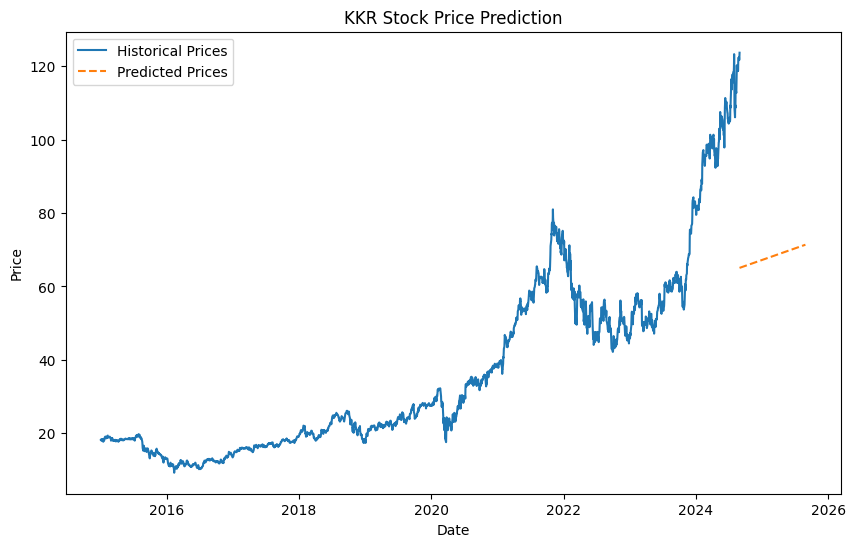

Mean Squared Error for MDT: 1158.350616588717


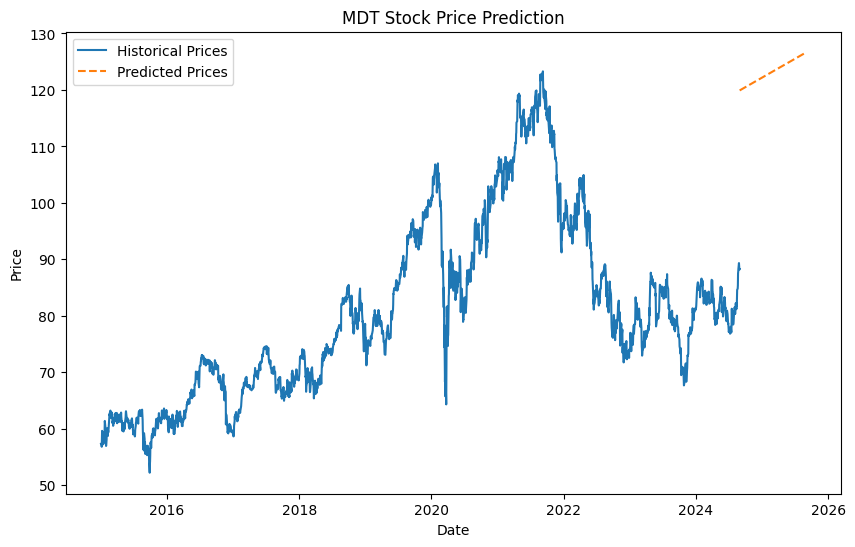

Mean Squared Error for ADP: 222.06514174621532


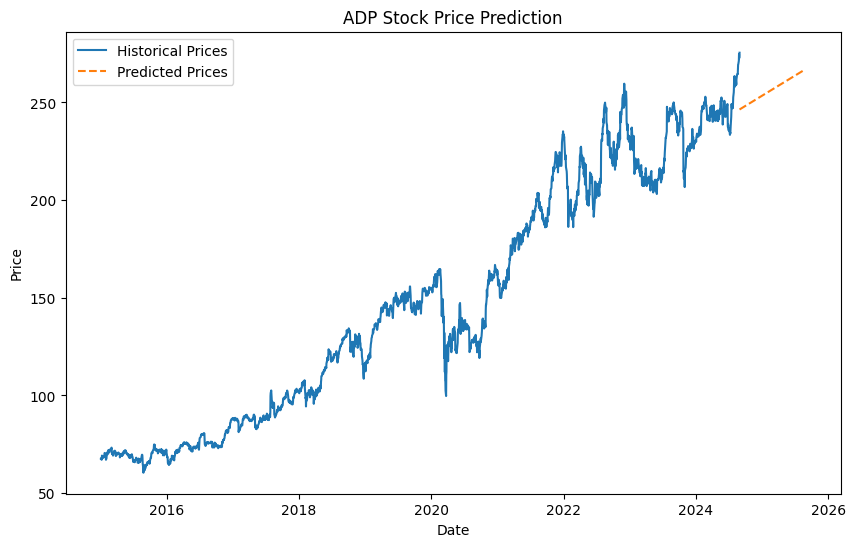

Mean Squared Error for MMC: 735.5713375729326


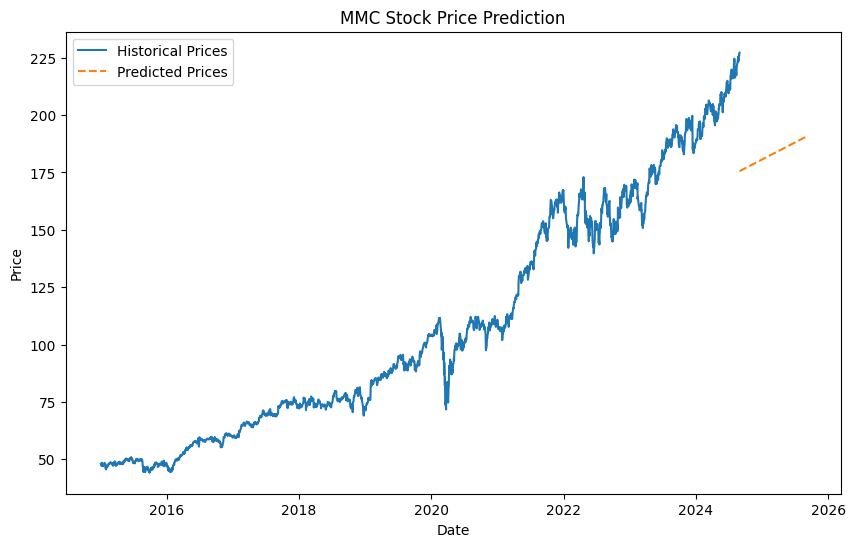

Mean Squared Error for ANET: 12543.963137591134


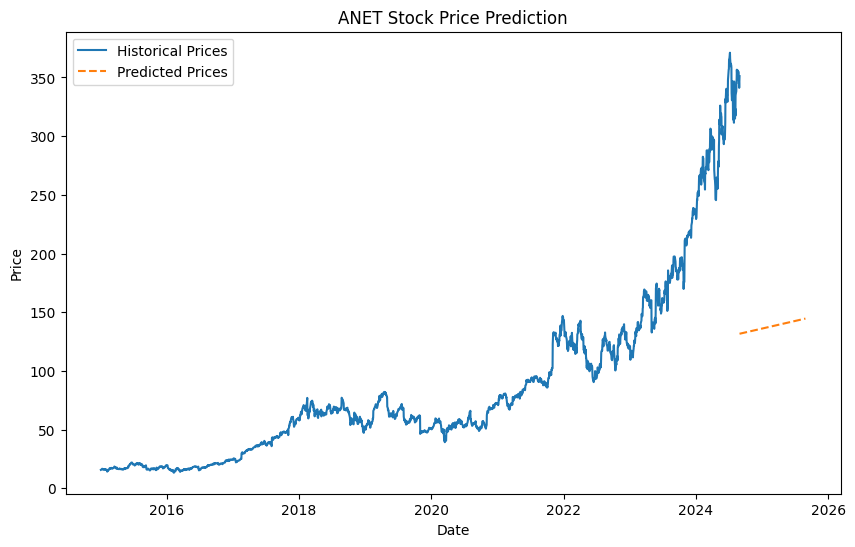

Mean Squared Error for UPS: 1106.3031627522191


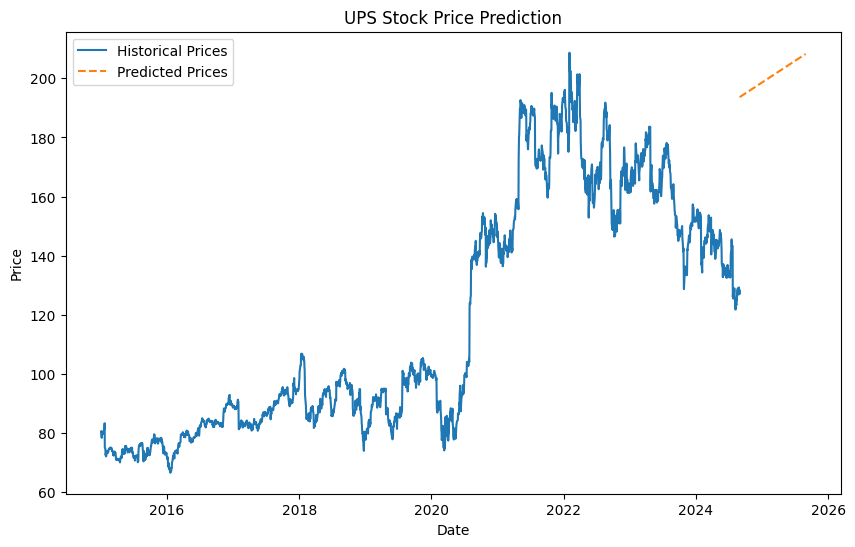

Mean Squared Error for KLAC: 45720.113728787415


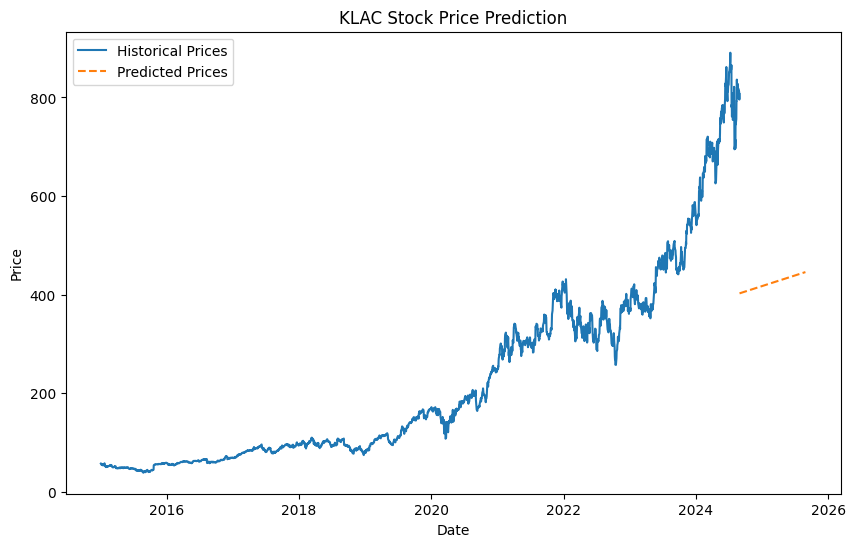

Mean Squared Error for SBUX: 275.9370958555169


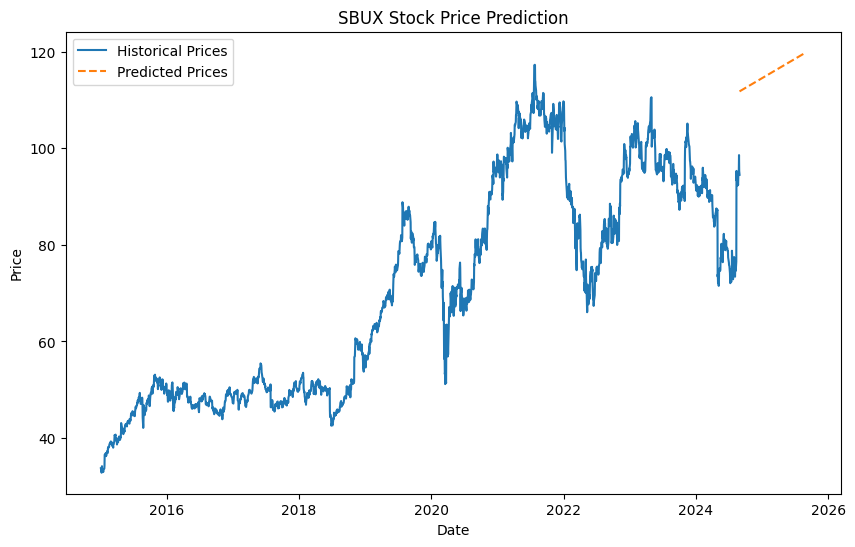

Mean Squared Error for BA: 7008.112330638549


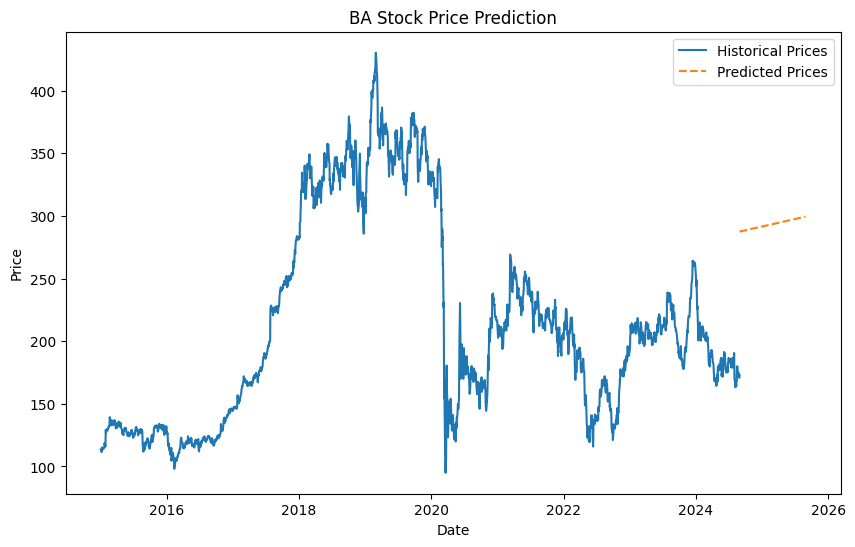

Mean Squared Error for MU: 487.2477636290375


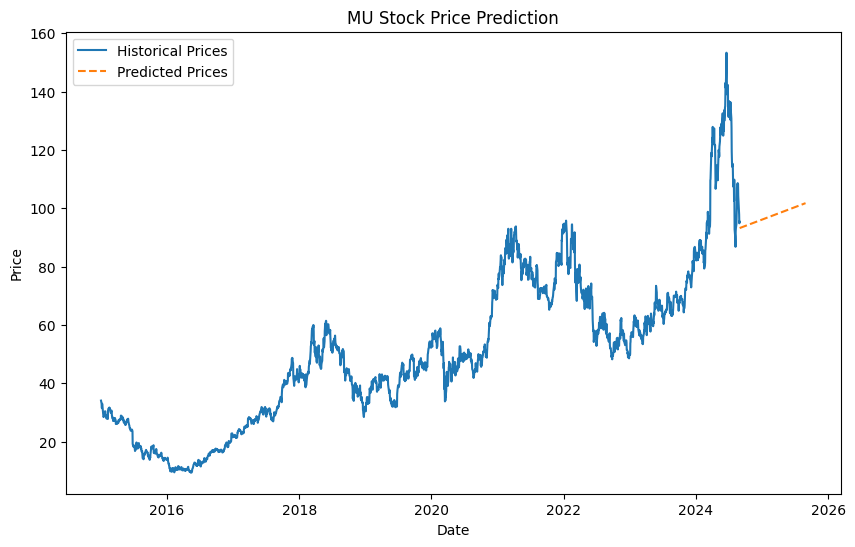

Mean Squared Error for LRCX: 33426.41774293982


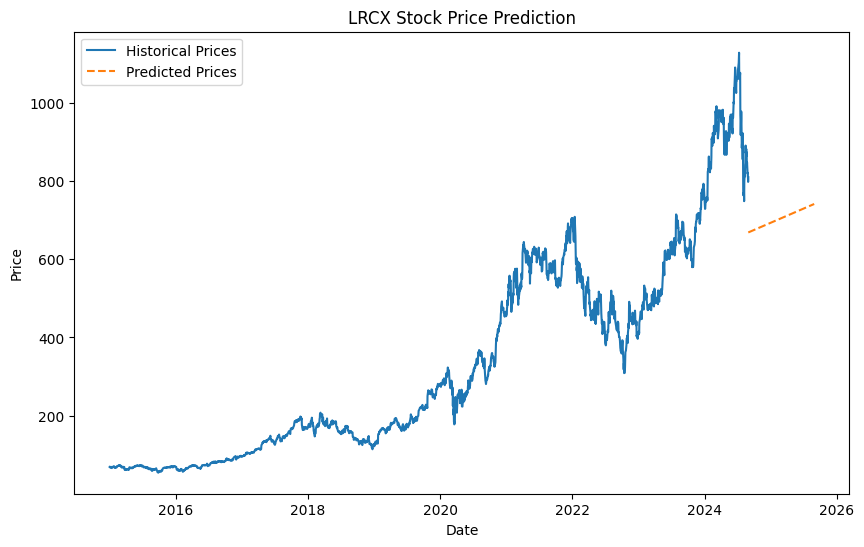

Mean Squared Error for DE: 1714.963057142416


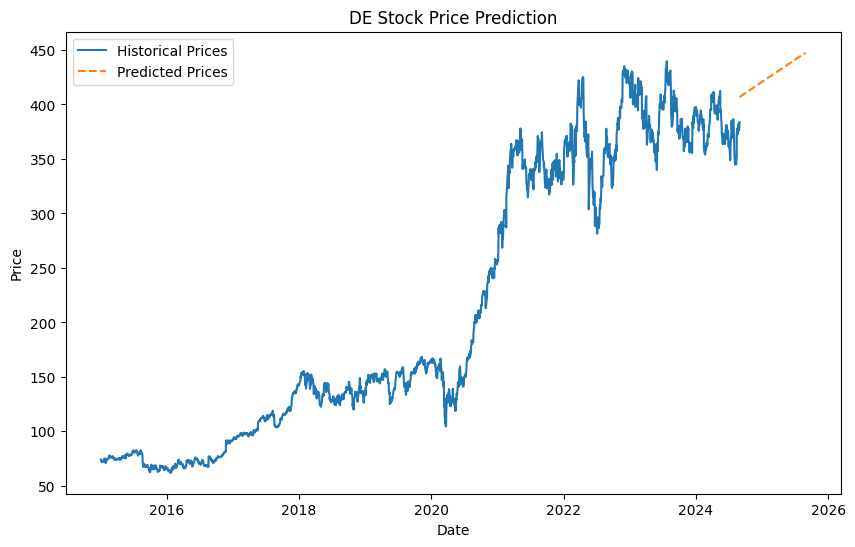

Mean Squared Error for AMT: 9587.286534384999


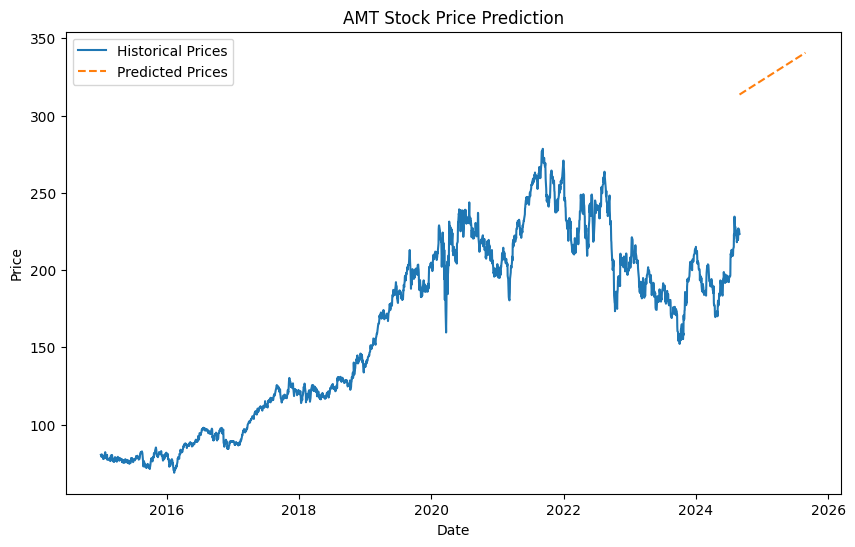

Mean Squared Error for HCA: 3361.9096673648914


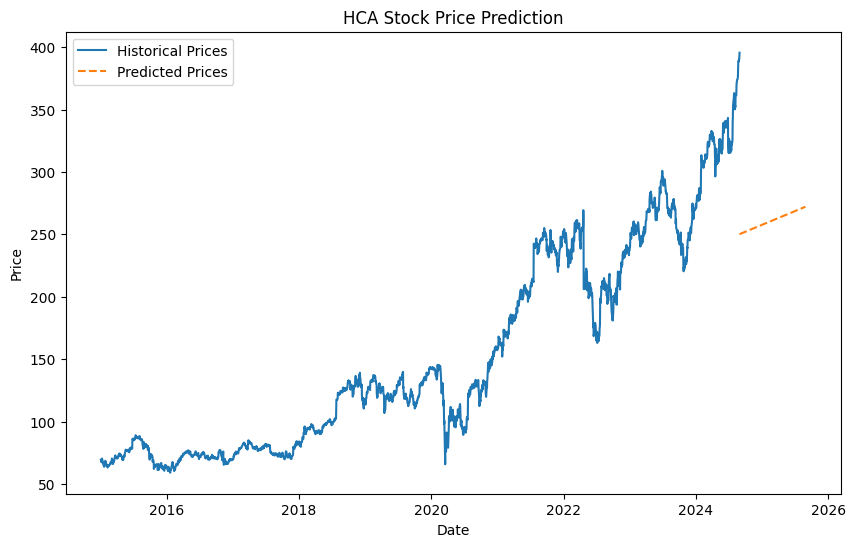

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import os

# Load the saved stock data
stock_data = pd.read_csv('us_stock_top100_data.csv')

def predict_stock_prices(stock_symbol, hist_data, plot=True):
    # Prepare the data for linear regression
    hist_data['Date'] = pd.to_datetime(hist_data.index).map(pd.Timestamp.toordinal)
    X = hist_data['Date'].values.reshape(-1, 1)
    y = hist_data['Close'].values
dd
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Create and train the model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Predict future prices
    future_days = 365  # Predict for the next year
    future_dates = np.arange(X[-1][0], X[-1][0] + future_days).reshape(-1, 1)
    future_prices = model.predict(future_dates)

    # Calculate the accuracy of the model
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    print(f'Mean Squared Error for {stock_symbol}: {mse}')

    if plot:
        # Plot the historical data and the prediction
        plt.figure(figsize=(10, 6))
        plt.plot(pd.to_datetime(hist_data.index), hist_data['Close'], label='Historical Prices')
        plt.plot(pd.to_datetime([pd.Timestamp.fromordinal(int(x)) for x in future_dates.flatten()]), future_prices, label='Predicted Prices', linestyle='--')
        plt.title(f'{stock_symbol} Stock Price Prediction')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

    return future_prices

# Loop through each stock and create a prediction plot
for symbol in stock_data['Symbol']:
    stock = yf.Ticker(symbol)
    hist_data = stock.history(start='2015-01-01')
    
    if not hist_data.empty:
        predict_stock_prices(symbol, hist_data)

### Suggesting top 5 stocks to invest based on data 

In [2]:
import pandas as pd

# Load the saved stock data
stock_data = pd.read_csv('us_stock_top100_data.csv')

# Define weightages for each attribute
weights = {
    '1YearReturnPercent': 0.10,
    '5YearReturnPercent': 0.15,
    'PERatio': 0.10,
    'MarketCap': 0.10,
    'DividendYield': 0.05,
    'EPS': 0.10,
    'DebtToEquity': 0.05,
    'ROA': 0.10,
    'ROE': 0.10,
    'OperatingMargin': 0.05,
    'Beta': 0.05,
    'FreeCashFlow': 0.05,
}

# Normalize each attribute
stock_data['1YearReturnNorm'] = stock_data['1YearReturnPercent'] / stock_data['1YearReturnPercent'].max()
stock_data['5YearReturnNorm'] = stock_data['5YearReturnPercent'] / stock_data['5YearReturnPercent'].max()
stock_data['PERatioNorm'] = stock_data['PERatio'].max() / stock_data['PERatio']  # Lower P/E is better
stock_data['MarketCapNorm'] = stock_data['MarketCap'] / stock_data['MarketCap'].max()
stock_data['DividendYieldNorm'] = stock_data['DividendYield'] / stock_data['DividendYield'].max()
stock_data['EPSNorm'] = stock_data['EPS'] / stock_data['EPS'].max()
stock_data['DebtToEquityNorm'] = stock_data['DebtToEquity'].max() / stock_data['DebtToEquity']  # Lower Debt to Equity is better
stock_data['ROANorm'] = stock_data['ROA'] / stock_data['ROA'].max()
stock_data['ROENorm'] = stock_data['ROE'] / stock_data['ROE'].max()
stock_data['OperatingMarginNorm'] = stock_data['OperatingMargin'] / stock_data['OperatingMargin'].max()
stock_data['BetaNorm'] = stock_data['Beta'].max() / stock_data['Beta']  # Lower Beta is better
stock_data['FreeCashFlowNorm'] = stock_data['FreeCashFlow'] / stock_data['FreeCashFlow'].max()

# Handle NaN values from normalization
stock_data.fillna(0, inplace=True)

# Calculate weighted scores for each stock
stock_data['WeightedScore'] = (
    stock_data['1YearReturnNorm'] * weights['1YearReturnPercent'] +
    stock_data['5YearReturnNorm'] * weights['5YearReturnPercent'] +
    stock_data['PERatioNorm'] * weights['PERatio'] +
    stock_data['MarketCapNorm'] * weights['MarketCap'] +
    stock_data['DividendYieldNorm'] * weights['DividendYield'] +
    stock_data['EPSNorm'] * weights['EPS'] +
    stock_data['DebtToEquityNorm'] * weights['DebtToEquity'] +
    stock_data['ROANorm'] * weights['ROA'] +
    stock_data['ROENorm'] * weights['ROE'] +
    stock_data['OperatingMarginNorm'] * weights['OperatingMargin'] +
    stock_data['BetaNorm'] * weights['Beta'] +
    stock_data['FreeCashFlowNorm'] * weights['FreeCashFlow']
)

# Rescale WeightedScore to a 0-100 range
stock_data['WeightedScore'] = stock_data['WeightedScore'] / stock_data['WeightedScore'].max() * 100

# Rank stocks by weighted score
stock_data['OverallRank'] = stock_data['WeightedScore'].rank(ascending=False)

# Sort stocks by overall rank
sorted_stocks = stock_data.sort_values('OverallRank')

# Select the top 5 stocks
top_5_stocks = sorted_stocks.head(5)

# Display the top 5 stocks
top_5_stocks[['Symbol', 'Name', '1YearReturnPercent', '5YearReturnPercent', 'PERatio', 'MarketCap', 'DividendYield', 'EPS', 'DebtToEquity', 'ROA', 'ROE', 'OperatingMargin', 'Beta', 'FreeCashFlow', 'WeightedScore', 'OverallRank']]

FileNotFoundError: [Errno 2] No such file or directory: 'us_stock_top100_data.csv'

### Suggestion on how much percentage you should allocate to each based on the volatility

Volatility is decided based on various factors such as daily_return, weekly_return, monthly_return, beta, volume, dividend_yeild, market_cap, pe_ratio

In [29]:
import pandas as pd
import yfinance as yf
import numpy as np

# Initialize lists to store the volatility of each factor
daily_return_volatility = []
weekly_return_volatility = []
monthly_return_volatility = []
beta = []
volume_volatility = []
price_range_volatility = []
dividend_yield_volatility = []
market_cap_volatility = []
pe_ratio_volatility = []

# New attributes
one_year_return_volatility = []
five_year_return_volatility = []
eps_volatility = []
debt_to_equity_volatility = []
roa_volatility = []
roe_volatility = []
operating_margin_volatility = []
free_cash_flow_volatility = []

# Calculate volatility for each factor
for symbol in top_5_stocks['Symbol']:
    stock = yf.Ticker(symbol)
    hist_data = stock.history(period='5y')  # Get 5 years of historical data
    
    # 1. Daily Return Volatility (ensure non-negative)
    hist_data['DailyReturn'] = hist_data['Close'].pct_change()
    daily_return_volatility.append(hist_data['DailyReturn'].std())
    
    # 2. Weekly Return Volatility (ensure non-negative)
    hist_data['WeeklyReturn'] = hist_data['Close'].resample('W').ffill().pct_change()
    weekly_return_volatility.append(hist_data['WeeklyReturn'].std())
    
    # 3. Monthly Return Volatility (ensure non-negative)
    hist_data['MonthlyReturn'] = hist_data['Close'].resample('M').ffill().pct_change()
    monthly_return_volatility.append(hist_data['MonthlyReturn'].std())
    
    # 4. Beta (can be negative, but it indicates inverse relationship with market)
    sp500 = yf.Ticker("^GSPC").history(period='5y')['Close']
    stock_returns = hist_data['Close'].pct_change()
    beta_value = stock_returns.corr(sp500.pct_change())
    beta.append(beta_value if not np.isnan(beta_value) else 0)  # Replace NaN with 0 if necessary
    
    # 5. Volume Volatility (ensure non-negative)
    volume_volatility.append(hist_data['Volume'].pct_change().std())
    
    # 6. Price Range Volatility (High-Low Range, ensure non-negative)
    hist_data['Range'] = hist_data['High'] - hist_data['Low']
    price_range_volatility.append(hist_data['Range'].std())
    
    # 7. Dividend Yield Volatility (ensure non-negative)
    dividend_yield_volatility.append(np.std(stock.dividends.pct_change()))
    
    # 8. Market Cap Volatility (Using Close price * outstanding shares as a proxy, ensure non-negative)
    hist_data['MarketCap'] = hist_data['Close'] * stock.info['sharesOutstanding']
    market_cap_volatility.append(hist_data['MarketCap'].pct_change().std())
    
    # 9. P/E Ratio Volatility (ensure non-negative)
    trailing_pe = stock.info.get('trailingPE', np.nan)  # Use np.nan if 'trailingPE' is not available
    pe_ratio_volatility.append(np.std(trailing_pe))

    # 10. 1-Year Return Volatility
    one_year_return_volatility.append(np.std(stock.info.get('fiftyTwoWeekHigh', np.nan) - stock.info.get('fiftyTwoWeekLow', np.nan)))

    # 11. 5-Year Return Volatility
    five_year_return_volatility.append(np.std(stock.info.get('fiftyTwoWeekHigh', np.nan) - stock.info.get('fiftyTwoWeekLow', np.nan)))

    # 12. EPS Volatility (ensure non-negative)
    eps_volatility.append(np.std(stock.info.get('trailingEps', np.nan)))

    # 13. Debt to Equity Ratio Volatility (ensure non-negative)
    debt_to_equity_volatility.append(np.std(stock.info.get('debtToEquity', np.nan)))

    # 14. Return on Assets (ROA) Volatility (ensure non-negative)
    roa_volatility.append(np.std(stock.info.get('returnOnAssets', np.nan)))
    
    # 15. Return on Equity (ROE) Volatility (ensure non-negative)
    roe_volatility.append(np.std(stock.info.get('returnOnEquity', np.nan)))

    # 16. Operating Margin Volatility (ensure non-negative)
    operating_margin_volatility.append(np.std(stock.info.get('operatingMargins', np.nan)))

    # 17. Free Cash Flow Volatility (ensure non-negative)
    free_cash_flow_volatility.append(np.std(stock.info.get('freeCashflow', np.nan)))


# Add volatilities to the DataFrame
top_5_stocks['DailyReturnVolatility'] = daily_return_volatility
top_5_stocks['WeeklyReturnVolatility'] = weekly_return_volatility
top_5_stocks['MonthlyReturnVolatility'] = monthly_return_volatility
top_5_stocks['Beta'] = beta  # Note: Beta can be negative
top_5_stocks['VolumeVolatility'] = volume_volatility
top_5_stocks['PriceRangeVolatility'] = price_range_volatility
top_5_stocks['DividendYieldVolatility'] = dividend_yield_volatility
top_5_stocks['MarketCapVolatility'] = market_cap_volatility
top_5_stocks['PERatioVolatility'] = pe_ratio_volatility

# New attributes
top_5_stocks['1YearReturnVolatility'] = one_year_return_volatility
top_5_stocks['5YearReturnVolatility'] = five_year_return_volatility
top_5_stocks['EPSVolatility'] = eps_volatility
top_5_stocks['DebtToEquityVolatility'] = debt_to_equity_volatility
top_5_stocks['ROAVolatility'] = roa_volatility
top_5_stocks['ROEVolatility'] = roe_volatility
top_5_stocks['OperatingMarginVolatility'] = operating_margin_volatility
top_5_stocks['FreeCashFlowVolatility'] = free_cash_flow_volatility

# Normalize volatilities to ensure all are positive
# Normalization helps in standardizing the scale of each metric
volatility_columns = ['DailyReturnVolatility', 'WeeklyReturnVolatility', 'MonthlyReturnVolatility',
                      'VolumeVolatility', 'PriceRangeVolatility', 'DividendYieldVolatility',
                      'MarketCapVolatility', 'PERatioVolatility', '1YearReturnVolatility', 
                      '5YearReturnVolatility', 'EPSVolatility', 'DebtToEquityVolatility', 
                      'ROAVolatility', 'ROEVolatility', 'OperatingMarginVolatility', 
                      'FreeCashFlowVolatility']

for col in volatility_columns:
    # Ensure all values are positive and normalize by subtracting the minimum
    min_value = top_5_stocks[col].min()
    top_5_stocks[col] = top_5_stocks[col] - min_value + 1e-9  # Adding small constant to avoid zero-division

# Calculate inverse volatility as the average of inverse normalized volatilities
inverse_volatility = 1 / top_5_stocks[volatility_columns].mean(axis=1)

# Calculate the allocation weight
top_5_stocks['InverseVolatility'] = inverse_volatility
top_5_stocks['Weight'] = top_5_stocks['InverseVolatility'] / top_5_stocks['InverseVolatility'].sum()

# Convert the weight into percentage
top_5_stocks['PercentageAllocation'] = top_5_stocks['Weight'] * 100

# Display the final allocation percentages
top_5_stocks[['Symbol', 'Name', 'PercentageAllocation']]

/var/folders/1z/07sdy2sj0q743hyg26bv74k40000gn/T/ipykernel_92406/373141174.py:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  hist_data['MonthlyReturn'] = hist_data['Close'].resample('M').ffill().pct_change()
/var/folders/1z/07sdy2sj0q743hyg26bv74k40000gn/T/ipykernel_92406/373141174.py:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  hist_data['MonthlyReturn'] = hist_data['Close'].resample('M').ffill().pct_change()
/var/folders/1z/07sdy2sj0q743hyg26bv74k40000gn/T/ipykernel_92406/373141174.py:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  hist_data['MonthlyReturn'] = hist_data['Close'].resample('M').ffill().pct_change()
/var/folders/1z/07sdy2sj0q743hyg26bv74k40000gn/T/ipykernel_92406/373141174.py:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  hist_data['MonthlyR

,Symbol,Name,PercentageAllocation
90,ANET,"Arista Networks, Inc.",9.093487
49,ISRG,"Intuitive Surgical, Inc.",8.462449
29,AMD,"Advanced Micro Devices, Inc.",74.965761
76,VRTX,Vertex Pharmaceuticals Incorpor,5.900962
74,REGN,"Regeneron Pharmaceuticals, Inc.",1.577341


### Sentiment Analysis Integration

In this section, we will integrate sentiment analysis using data from Twitter and Reddit.

In [1]:
from textblob import TextBlob
import tweepy
import praw
import pandas as pd

# Twitter API credentials
twitter_api_key = ""
twitter_api_secret_key = ""
twitter_access_token = ""
twitter_access_token_secret = ""

# Reddit API credentials
reddit_client_id = ""
reddit_client_secret = ""
reddit_user_agent = ""

# Authenticating Twitter API
auth = tweepy.OAuthHandler(twitter_api_key, twitter_api_secret_key)
auth.set_access_token(twitter_access_token, twitter_access_token_secret)
twitter_api = tweepy.API(auth, wait_on_rate_limit=True)

# Authenticating Reddit API
reddit = praw.Reddit(client_id=reddit_client_id,
                     client_secret=reddit_client_secret,
                     user_agent=reddit_user_agent)

def fetch_twitter_sentiment(stock_symbol):
    # Fetch recent tweets containing the stock symbol
    tweets = tweepy.Cursor(twitter_api.search_tweets, q=stock_symbol, lang='en').items(100)
    
    sentiment_score = 0
    tweet_count = 0
    
    # Analyzing sentiment for each tweet
    for tweet in tweets:
        analysis = TextBlob(tweet.text)
        sentiment_score += analysis.sentiment.polarity
        tweet_count += 1
    
    # Return average sentiment score
    return sentiment_score / tweet_count if tweet_count > 0 else 0

def fetch_reddit_sentiment(stock_symbol):
    # Fetch recent posts from relevant subreddits
    subreddits = ["wallstreetbets", "stocks", "investing"]
    
    sentiment_score = 0
    post_count = 0
    
    for subreddit in subreddits:
        for submission in reddit.subreddit(subreddit).search(stock_symbol, limit=50):
            analysis = TextBlob(submission.title + " " + submission.selftext)
            sentiment_score += analysis.sentiment.polarity
            post_count += 1
    
    # Return average sentiment score
    return sentiment_score / post_count if post_count > 0 else 0

def analyze_sentiment_for_stocks(stock_symbols):
    sentiment_scores = []
    
    for symbol in stock_symbols:
        twitter_sentiment = fetch_twitter_sentiment(symbol)
        reddit_sentiment = fetch_reddit_sentiment(symbol)
        
        # Average sentiment score from both sources
        overall_sentiment = (twitter_sentiment + reddit_sentiment) / 2
        
        sentiment_scores.append({
            'Symbol': symbol,
            'Twitter Sentiment': twitter_sentiment,
            'Reddit Sentiment': reddit_sentiment,
            'Overall Sentiment': overall_sentiment
        })
    
    sentiment_df = pd.DataFrame(sentiment_scores)
    
    return sentiment_df

# Let's assume that the list of stock symbols is provided in the technical analysis section
# For now, we'll use a placeholder list
top_stocks = ['AAPL', 'MSFT', 'TSLA', 'GOOGL', 'AMZN']

# Performing sentiment analysis
sentiment_analysis_df = analyze_sentiment_for_stocks(top_stocks)

# Display the sentiment analysis results
import ace_tools as tools; tools.display_dataframe_to_user(name="Sentiment Analysis Results", dataframe=sentiment_analysis_df)

sentiment_analysis_df.head()

/Users/vinayjogani/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


Forbidden: 403 Forbidden
453 - You currently have access to a subset of Twitter API v2 endpoints and limited v1.1 endpoints (e.g. media post, oauth) only. If you need access to this endpoint, you may need a different access level. You can learn more here: https://developer.twitter.com/en/portal/product

## Future Scope 

When making recommendations for stocks, we can also take the investor's tolerance for risk into account. 